In [39]:
import sys
print(sys.executable)

import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")
    
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np

from scipy.stats import gaussian_kde
import scipy as sp
from scipy import *

import seaborn as sns 

import ipywidgets as widgets

import GaiaFunctionstDict as tb
import starcolorindexSpT
import ApogeeFunctionsNewCSV as ap

print("Initialize!")


/Library/Frameworks/Python.framework/Versions/3.6/bin/python3
Initialize!


In [40]:
df_Apogee = pd.read_csv('allStarLite-r12-133.csv')

df_Apogee['BP_RP']   = df_Apogee['GAIA_PHOT_BP_MEAN_MAG']  - df_Apogee['GAIA_PHOT_RP_MEAN_MAG']
df_Apogee['SpT2'] = df_Apogee.apply(lambda row: starcolorindexSpT.subclass[round(row.BP_RP, 2)], axis=1)
df_Apogee['LightYears'] =  abs(((1 / df_Apogee['GAIA_PARALLAX']) * 3.26 * 1000))
df_Apogee['Parsec'] =  abs(((1 / df_Apogee['GAIA_PARALLAX']) * 1000))

In [41]:
print("\nStep 2: Creating Unique Field List")

SpT2 = df_Apogee['SpT2']
unique_SpT2 = sp.unique(SpT2)
print("\n" + str(unique_SpT2))


df_class_O = df_Apogee[(df_Apogee['SpT2'] >= "O0V") & (df_Apogee['SpT2'] <= "O9V")]
df_class_B = df_Apogee[(df_Apogee['SpT2'] >= "B0V") & (df_Apogee['SpT2'] <= "B9V")]
df_class_A = df_Apogee[(df_Apogee['SpT2'] >= "A0V") & (df_Apogee['SpT2'] <= "A9V")]
df_class_F = df_Apogee[(df_Apogee['SpT2'] >= "F0V") & (df_Apogee['SpT2'] <= "F9V")]
df_class_G = df_Apogee[(df_Apogee['SpT2'] >= "G0V") & (df_Apogee['SpT2'] <= "G9V")]
df_class_K = df_Apogee[(df_Apogee['SpT2'] >= "K0V") & (df_Apogee['SpT2'] <= "K9V")]
df_class_M = df_Apogee[(df_Apogee['SpT2'] >= "M0V") & (df_Apogee['SpT2'] <= "M9V")]
df_class_L = df_Apogee[(df_Apogee['SpT2'] >= "L0V") & (df_Apogee['SpT2'] <= "L9V")]
df_class_T = df_Apogee[(df_Apogee['SpT2'] >= "T0V") & (df_Apogee['SpT2'] <= "T9V")]

#print("\n" + str(target1)+ ": "   + str(r1.shape[0]))
print("\nClass O: " + str(df_class_O.shape[0]))
print("Class B: " + str(df_class_B.shape[0]))
print("Class A: " + str(df_class_A.shape[0]))
print("Class F: " + str(df_class_F.shape[0]))
print("Class G: " + str(df_class_G.shape[0]))
print("Class K: " + str(df_class_K.shape[0]))
print("Class M: " + str(df_class_M.shape[0]))
print("Class L: " + str(df_class_L.shape[0]))
print("Class T: " + str(df_class_T.shape[0]))


Step 2: Creating Unique Field List

['A0V' 'A1V' 'A2V' 'A3V' 'A4V' 'A5V' 'A6V' 'A7V' 'A8V' 'A9V' 'B1V' 'B2V'
 'B3V' 'B4V' 'B5V' 'B6V' 'B7V' 'B8V' 'B9.5V' 'B9V' 'F0V' 'F1V' 'F2V' 'F3V'
 'F4V' 'F5V' 'F6V' 'F7V' 'F8V' 'F9.5V' 'F9V' 'G0V' 'G1V' 'G2V' 'G3V' 'G4V'
 'G5V' 'G6V' 'G7V' 'G8V' 'G9V' 'K0.5V' 'K0V' 'K1.5V' 'K2.5V' 'K2V' 'K3.5V'
 'K3V' 'K4.5V' 'K4V' 'K5.5V' 'K5V' 'K6.5V' 'K6V' 'K7V' 'K8V' 'K9V' 'L0V'
 'L1V' 'L2V' 'L3V' 'L4V' 'L5V' 'L6V' 'L7V' 'L8V' 'L9V' 'M0.5V' 'M0V'
 'M1.5V' 'M1V' 'M2.5V' 'M2V' 'M3.5V' 'M3V' 'M4.5V' 'M4V' 'M5.5V' 'M5V'
 'M6.5V' 'M6V' 'M7.5V' 'M7V' 'M8.5V' 'M8V' 'M9V' 'O3V' 'T0V' 'T1V' 'T2V'
 'T3V' 'T4V' 'T5V' 'T6V' 'T7V' 'T8V' 'T9V']

Class O: 37
Class B: 908
Class A: 22187
Class F: 33745
Class G: 43540
Class K: 221436
Class M: 124428
Class L: 1619
Class T: 188


In [42]:
def plotSlice3DParmDensityLY(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    #fig_size = plt.rcParams["figure.figsize"]
    #fig_size[0] = 15
    #fig_size[1] = 15
    #plt.rcParams["figure.figsize"] = fig_size
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size

    ax = plt.axes(projection='3d')
    
    rY = r[r.LightYears <= rHi]

    # Data for three-dimensional scattered points
    xdata = rY['RA']
    ydata = rY[rfield]
    zdata = rY['DEC']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('Ra', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('Dec', fontsize = 20)

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('Light Years',size=15)
    
    plt.show()


def plotSlice3DParmDensityLYG(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    #fig_size = plt.rcParams["figure.figsize"]
    #fig_size[0] = 15
    #fig_size[1] = 15
    #plt.rcParams["figure.figsize"] = fig_size
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size

    ax = plt.axes(projection='3d')
    
    rY = r[r.LightYears <= rHi]

    # Data for three-dimensional scattered points
    xdata = rY['GLAT']
    ydata = rY[rfield]
    zdata = rY['GLON']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('GLAT', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('GLON', fontsize = 20)

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('Light Years',size=15)
    
    plt.show()



def plotSlice3DParmDensityLYPM(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size

    ax = plt.axes(projection='3d')
    
    r1 = r[(r['GAIA_PMRA'].astype(float) > -9999)]
    
    rY = r1[r1.LightYears <= rHi]

    # Data for three-dimensional scattered points
    xdata = rY['GAIA_PMRA']
    ydata = rY[rfield]
    zdata = rY['GAIA_PMDEC']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('GAIA_PMRA', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('GAIA_PMDEC', fontsize = 20)

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('Light Years',size=15)
    plt.show()




def plotSlice3DParmDensityFEH(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size

    ax = plt.axes(projection='3d')
    
    rY = r[r.FE_H > -9999]

    # Data for three-dimensional scattered points
    xdata = rY['RA']
    ydata = rY[rfield]
    zdata = rY['DEC']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('Ra', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('Dec', fontsize = 20)

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('FeH',size=15)
    
    plt.show()
    
    
def plotSlice3DParmDensityFEHG(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size

    ax = plt.axes(projection='3d')
    
    rY = r[r.FE_H > -9999]

    # Data for three-dimensional scattered points
    xdata = rY['GLAT']
    ydata = rY[rfield]
    zdata = rY['GLON']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('GLAT', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('GLON', fontsize = 20)

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('FeH',size=15)
    
    plt.show()
    
    
    
def plotSlice3DParmDensityTEFF(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size
    #plt.gca().invert_yaxis()

    ax = plt.axes(projection='3d')
    
    rY = r[r.TEFF > -9999]

    # Data for three-dimensional scattered points
    xdata = rY['RA']
    ydata = rY[rfield]
    zdata = rY['DEC']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('Ra', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('Dec', fontsize = 20)
    ax.invert_yaxis()

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('Teff',size=15)
    
    #ax.invert_yaxis()
    
    plt.show()
    
    
def plotSlice3DParmDensityTEFFG(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size
    #plt.gca().invert_yaxis()

    ax = plt.axes(projection='3d')
    
    rY = r[r.TEFF > -9999]

    # Data for three-dimensional scattered points
    xdata = rY['GLAT']
    ydata = rY[rfield]
    zdata = rY['GLON']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('GLAT', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('GLON', fontsize = 20)
    

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('Teff',size=15)
    
    #ax.invert_yaxis()
    
    plt.show()
    
    
def plotSlice3DParmDensityLOGG(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size

    ax = plt.axes(projection='3d')
    
    rY = r[r.LOGG > -9999]

    # Data for three-dimensional scattered points
    xdata = rY['RA']
    ydata = rY[rfield]
    zdata = rY['DEC']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('Ra', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('Dec', fontsize = 20)

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image =  ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('LogG',size=15)
    
    plt.show()


def plotSlice3DParmDensityLOGGG(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size

    ax = plt.axes(projection='3d')
    
    rY = r[r.LOGG > -9999]

    # Data for three-dimensional scattered points
    xdata = rY['GLAT']
    ydata = rY[rfield]
    zdata = rY['GLON']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('GLAT', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('GLON', fontsize = 20)

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('LogG',size=15)
    
    plt.show()


#VHELIO_AVG

def plotSlice3DParmDensityVHELIO(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size
    plt.gca().invert_yaxis()

    ax = plt.axes(projection='3d')
    
    r1 = r[r.VHELIO_AVG > -9999]
    rY = r1[r1.VHELIO_AVG < 5000]

    # Data for three-dimensional scattered points
    xdata = rY['RA']
    ydata = rY[rfield]
    zdata = rY['DEC']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('Ra', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('Dec', fontsize = 20)

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('VHELIO_AVG',size=15)
    
    plt.show()
    
    
def plotSlice3DParmDensityVHELIOG(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size
    plt.gca().invert_yaxis()

    ax = plt.axes(projection='3d')
    
    r1 = r[r.VHELIO_AVG > -9999]
    rY = r1[r1.VHELIO_AVG < 5000]

    # Data for three-dimensional scattered points
    xdata = rY['GLAT']
    ydata = rY[rfield]
    zdata = rY['GLON']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('GLAT', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('GLON', fontsize = 20)

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('VHELIO_AVG',size=15)
    
    plt.show()


def plotSlice3DParmDensityFEHPM(r, rtarget, rfield, rlabel, rcmap, rHi):
    
    fig = plt.figure(figsize=(12, 10))
    
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 12
    fig_size[1] = 10
    plt.rcParams["figure.figsize"] = fig_size

    ax = plt.axes(projection='3d')
    
    r1 = r[(r['GAIA_PMRA'].astype(float) > -9999)]
    
    rY = r1[r1.FE_H > -9999]

    # Data for three-dimensional scattered points
    xdata = rY['GAIA_PMRA']
    ydata = rY[rfield]
    zdata = rY['GAIA_PMDEC']

    ax.set_title(str(rtarget) + "  Stars: " + str(len(r)) + 
             "                          LY: " + str(tb.getStarLy(rtarget)) , 
             fontsize = 15)

    ax.set_xlabel('GAIA_PMRA', fontsize = 20)
    ax.set_ylabel(rlabel, fontsize = 20, rotation=45)
    ax.set_zlabel('GAIA_PMDEC', fontsize = 20)

    ax.set_facecolor('dimgray')
    
    # Calculate the point density
    xyz = np.vstack([xdata, ydata, zdata])
    zzz = gaussian_kde(xyz)(xyz)

    image = ax.scatter3D(xdata, ydata, zdata, s=15, c=ydata, cmap=rcmap)
    
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('FeH',size=15)
    
    plt.show()


In [ ]:

Halo_Stream = """

Halo Stream: [
'GD1-1'    491 Stars
'GD1-2'    948 Stars
'GD1-3'    534 Stars
'GD1-4'    420 Stars
'GD1-5'    281 Stars
'ORPHAN-1' 328 Stars
'ORPHAN-2' 355 Stars
'ORPHAN-3' 397 Stars
'ORPHAN-4' 391 Stars
'ORPHAN-5' 452 Stars
'PAL5-1'   416 Stars
'PAL5-2'   530 Stars
'SGRT-1'   212 Stars
'TRIAND-1' 254 Stars
'TRIAND-2' 239 Stars
'TRIAND-3' 250 Stars
'TRIAND-4' 235 Stars
'TRIAND-5' 242 Stars

"""



Buldge = """

Bulge Fields: [
'000+08'   627 Stars
'000+08-S' 361 Stars
'000+12'   530 Stars
'000+17'   480 Stars
'000-04'   665 Stars
'000-08'   250 Stars
'000-12'   254 Stars
'002-04'  1058 Stars
'005+00'   407 Stars
'005+04'   452 Stars
'005+08'   462 Stars
'005-02'   903 Stars
'010+00'   453 Stars
'010+12'   477 Stars
'010-12'   501 Stars
'013+00'   239 Stars
'015+02'   355 Stars
'015+12'   509 Stars
'015-12'   253 Stars
'015-14'   371 Stars
'020+00'   700 Stars
'020+04'   716 Stars
'020+06'   709 Stars
'025-10'   219 Stars
'340+00'   477 Stars
'340+10'   365 Stars
'340+14'   477 Stars
'345+00'   445 Stars
'345+02'   210 Stars
'345+14'   480 Stars
'345-02'   349 Stars
'345-12'   506 Stars
'347+00'   250 Stars
'350+00'   435 Stars
'350+04'   468 Stars
'350+12'   507 Stars
'350-04'   481 Stars
'350-12'   256 Stars
'355+00'   479 Stars
'355+02'   328 Stars
'355+04'   164 Stars
'355+08'   354 Stars
'355-02'   200 Stars
'355-08'   342 Stars
'358-04']  469 Stars

"""


Outer_Disk = """

Outer Disk Fields: [
 '101-24_btx' 255 Stars
 '120-24_btx' 228 Stars
 '126-24_btx'  53 Stars
 '139+27_btx' 253 Stars
 '140+24_btx' 253 Stars
 '140-18_btx' 242 Stars
 '142+35_btx' 239 Stars
 '146+18_btx' 246 Stars
 '146+24_btx' 248 Stars
 '146+26_btx' 253 Stars
 '146+36_btx' 240 Stars
 '146-18_btx' 249 Stars
 '152+34_btx' 245 Stars
 '155-27_btx' 245 Stars
 '157+28_btx' 250 Stars
 '159+26_btx' 235 Stars
 '160+18_btx' 249 Stars
 '160+24_btx' 248 Stars
 '160-18_btx' 208 Stars
 '160-24_btx' 232 Stars
 '162+34_btx' 247 Stars
 '169+18_btx' 245 Stars
 '169+24_btx' 244 Stars
 '169-18_btx' 232 Stars
 '169-24_btx' 237 Stars
 '170+34_btx' 237 Stars
 '178+36_btx' 235 Stars
 '181+32_btx' 246 Stars
 '186+31_btx' 232 Stars
 '191+18_btx' 247 Stars
 '191-18_btx' 234 Stars
 '191-24_btx' 245 Stars
 '201+26_btx' 239 Stars
 '201+30_btx' 250 Stars
 '207+27_btx' 252 Stars
 '214+18_btx' 248 Stars
 '214+24_btx' 247 Stars
 '232+30_btx' 246 Stars

"""


Disk = """

Disk Fields: [
 '020+14' 258 Stars
 '020-06' 250 Stars
 '020-12' 256 Stars
 '020-14' 255 Stars
 '025+10' 251 Stars
 '025+14' 259 Stars
 '025-14 '251 Stars
 '027+00' 463 Stars
 '100+00' 735 Stars
 '100+06' 529 Stars
 '100+12' 623 Stars
 '100-06' 678 Stars
 '100-12' 726 Stars
 '120+06' 976 Stars
 '120+12' 645 Stars
 '120-06' 968 Stars
 '120-12' 640 Stars
 '140+06' 495 Stars
 '140+12' 482 Stars
 '140-06' 501 Stars
 '140-12' 476 Stars
 '160+06' 493 Stars
 '160+12' 478 Stars
 '160-06' 495 Stars
 '160-12' 501 Stars
 '180+12' 638 Stars
 '180-12' 641 Stars
 '214-08' 504 Stars
 '240-12' 374 Stars
 '263-03' 251 Stars
 '264+20' 235 Stars
 '278-09' 252 Stars
 '296+06' 254 Stars
 '296-06' 359 Stars
 '298-25' 239 Stars
 '300-23' 249 Stars
 '311-12' 252 Stars
 '317+12' 258 Stars
 '326+12' 251 Stars
 '326-06' 578 Stars
 '326-12' 357 Stars
 '330-12' 259 Stars
 '335+12' 244 Stars
 '335-12' 255 Stars
 '340+12' 239 Stars
 '340-10' 247 Stars
 '340-12' 252 Stars
 '340-14' 255 Stars

"""


Disk1 = """

Disk 1 Fields: [
'120+18'  243 Stars
'125+12'  251 Stars
'125-12'  248 Stars
'225+00'  251 Stars
'225-12'  259 Stars
'240+00'  500 Stars
'240+04'  250 Stars
'240+12'  256 Stars
'240-04'  255 Stars
'240-12'  374 Stars
'255+00'  255 Stars
'270+00' 1372 Stars
'270+12'  362 Stars
'270-12'  359 Stars
'278+00'  255 Stars
'285+00'  231 Stars
'300+00'  928 Stars
'300+04'  736 Stars
'300+12'  367 Stars
'300-04'  364 Stars
'300-12'  355 Stars
'330+12'  355 Stars

"""


Disk2 = """

Disk 2 Fields: [
'020+06' 709 Stars
'020+12' 367 Stars
'025+06' 692 Stars
'025+12' 359 Stars
'025-06' 695 Stars
'025-12' 360 Stars
'034+00' 675 Stars
'034+06' 717 Stars
'034+12' 374 Stars
'034-06' 692 Stars
'034-12' 381 Stars
'049+00' 344 Stars
'049+06' 365 Stars
'049+12' 350 Stars
'049-06' 357 Stars
'049-12' 357 Stars
'060-04' 610 Stars
'064+00' 665 Stars
'064+06' 688 Stars
'064+12' 386 Stars
'064-06' 483 Stars
'064-12' 353 Stars
'079+00' 357 Stars
'079-06' 374 Stars
'079-12' 373 Stars
'094+00' 680 Stars
'094+06' 719 Stars
'094+12' 375 Stars
'094-06' 721 Stars
'094-12' 372 Stars
'109+00' 326 Stars
'109+08' 378 Stars
'109+12' 347 Stars
'109-08' 388 Stars
'109-12' 345 Stars
'116+00' 686 Stars
'124+00' 437 Stars
'131+00' 438 Stars
'139+00' 472 Stars
'146+00' 478 Stars
'146+08' 502 Stars
'146+12' 478 Stars
'146-08' 500 Stars
'146-12' 481 Stars
'154+00' 482 Stars
'161+00' 458 Stars
'169+00' 801 Stars
'169+08' 508 Stars
'169+12' 480 Stars
'169-08' 498 Stars
'169-12' 470 Stars
'176+00' 643 Stars
'184+00' 654 Stars
'191+00' 632 Stars
'191+08' 501 Stars
'191+12' 481 Stars
'191-08' 501 Stars
'191-12' 473 Stars
'199+00' 461 Stars
'206+00' 437 Stars
'214+00' 497 Stars
'214+08' 504 Stars
'214+12' 505 Stars
'214-08' 504 Stars
'214-12' 475 Stars
'251+00' 368 Stars
'259+00' 710 Stars
'266-06' 251 Stars
'281+00' 359 Stars
'281+06' 256 Stars
'281+12' 232 Stars
'281-06' 259 Stars
'296+00' 360 Stars
'296+12' 259 Stars
'296-06' 359 Stars
'296-12' 358 Stars
'311+00' 364 Stars
'311+06' 358 Stars
'311+12' 257 Stars
'311-06' 256 Stars
'326+00' 245 Stars
'326+06' 360 Stars
'326-06' 578 Stars
'326-12' 357 Stars
'335+06' 258 Stars
'340+06' 607 Stars
'340-06' 361 Stars

"""


Halo = """

Halo Fields: [
'000+60' 484 Stars
'030+30' 454 Stars
'030+60' 624 Stars
'040+45' 575 Stars
'060+60' 460 Stars
'060+75' 445 Stars
'060-30' 263 Stars
'060-75' 252 Stars
'075-30' 244 Stars
'080+45' 489 Stars
'080-45' 253 Stars
'090+60' 533 Stars
'090-30' 253 Stars
'090-75' 248 Stars
'100-60' 494 Stars
'105-30' 253 Stars
'110-60' 250 Stars
'120+30' 499 Stars
'120+45' 303 Stars
'120+60' 470 Stars
'120+75' 410 Stars
'120-30' 251 Stars
'120-60' 251 Stars
'120-75' 249 Stars
'130-60' 259 Stars
'135-30' 256 Stars
'140-60' 251 Stars
'150+30' 550 Stars
'150-30' 254 Stars
'150-60' 255 Stars
'160+45' 474 Stars
'160-45' 252 Stars
'160-60' 261 Stars
'165-30' 249 Stars
'170-60' 256 Stars
'180+60' 541 Stars
'180+75' 468 Stars
'180-30' 248 Stars
'180-60' 257 Stars
'180-75' 256 Stars
'190-60' 254 Stars
'195-30' 261 Stars
'200+45' 513 Stars
'200-45' 256 Stars
'200-60' 246 Stars
'210+60' 504 Stars
'228-49' 214 Stars
'240+60' 523 Stars
'240+75' 496 Stars
'270+60' 522 Stars
'280+45' 584 Stars
'280-27' 221 Stars
'284-39' 244 Stars
'292-26' 252 Stars
'300+60' 498 Stars
'300+75' 510 Stars
'300+75-S' 196 Stars
'30Dor'  49 Stars
'320+45' 569 Stars
'330+60' 499 Stars

"""


Halo_btx = """

Halo_btx Fields: [
'011+47_btx' 253 Stars
'041+78_btx' 251 Stars
'043+49_btx' 239 Stars
'051+60_btx' 258 Stars
'063+55_btx' 242 Stars
'071+62_btx' 253 Stars
'099+56_btx' 229 Stars
'104+77_btx' 239 Stars
'120+67_btx' 247 Stars
'172+58_btx' 238 Stars
'175+65_btx' 255 Stars
'209+73_btx' 230 Stars
'216+53_btx' 252 Stars
'246+77_btx' 243 Stars
'335+61_btx' 261 Stars

"""


Globular_Clusters = """

Globular Cluster Fields: [
'47TUC'       372 Stars
'M12-N'       308 Stars
'M15'        1189 Stars
'M5PAL5'      718 Stars
'M71'        1028 Stars
'N1851'       382 Stars
'N288'        375 Stars
'N362'        270 Stars
'N6441'       208 Stars
'Omegacen'   1201 Stars
'Sgr_faint']  214 Stars

"""


Globular_Cluster1 = """

Globular Cluster 1 Fields: [
'M4'     334 Stars
'M68'    362 Stars
'M79'    373 Stars
'N1851'  382 Stars
'N2808'  365 Stars
'N3201'] 355 Stars

"""


Globular_Cluster2 = """

Globular Cluster 2 Fields: [
'M10'    475 Stars
'M12-S'] 462 Stars

"""


Open_Clusters = """

Open Cluster Fields: [
'M67'      894 Stars
'N188'     578 Stars
'N2204'    254 Stars
'N2243-S'] 324 Stars

"""


Young_Clusters = """

Young Cluster Fields: [
'ALPHAPER'     206 Stars
'LAMBDAORI-A'  606 Stars
'LAMBDAORI-B'  425 Stars
'LAMBDAORI-C'  591 Stars
'N2264'        170 Stars
'ORIONA-B'     194 Stars
'ORIONA-C'     160 Stars
'ORIONA-D'     156 Stars
'ORIONA-E'     170 Stars
'ORIONB-A'     539 Stars
'ORIONB-B'     495 Stars
'ORIONOB1AB-A' 322 Stars
'ORIONOB1AB-B' 518 Stars
'ORIONOB1AB-C' 537 Stars
'ORIONOB1AB-D' 339 Stars
'ORIONOB1AB-E' 543 Stars
'ORIONOB1AB-F' 436 Stars
'PLEIADES-E'   226 Stars
'PLEIADES-W'   243 Stars
'TAUL1495'     233 Stars
'TAUL1521'     243 Stars
'TAUL1527'     235 Stars
'TAUL1536']    221 Stars

"""



t = """ 

'000+00-C', '000+02', '000+02-O', '000+04', '000+04-O', '000+05-O', '000+08', '000+08-S', '000+12', '000+14', '000+16', '000+17', 
'000+30', '000+45', '000+60', '000+75', '000-02', '000-02-O', '000-04', '000-04-O', '000-08', '000-12', '000-17-C', '001+01', 
'001-01', '001-01-O', '001-04-O', '001-05-O', '002+00', '002+00-C', '002+02-O', '002+04', '002+06', '002-02-O', '002-03-O', 
'002-04', '002-05-O', '002-06-O', '003+02', '003+02-O', '003+03-O', '003+05', '003-02-O', '003-03-C', '003-03-O', '003-05', 
'003-05-O', '004+00', '004+02', '004+02-O', '004+04', '004+05-O', '004-02', '004-02-O', '004-04', '005+00', '005+02-O', '005+03', 
'005+03-O', '005+04', '005+05-O', '005+08', '005-02', '005-03', '005-03-O', '006+00', '006+02', '006+04-O', '006+06', '006-02', 
'007+02-O', '007+07', '008+00', '008+02', '008-02', '009+09', '010+00', '010+02', '010+12', '010+60', '010-02', '010-07-C', 
'010-12', '011+47_btx', '011+79_MGA', '012+00', '012+02', '012-02', '013+00', '014+00', '014+02', '014+89_MGA', '014-02', 
'015+02', '015+12', '015+30', '015-12', '015-14', '016+00', '016+02', '016+77_MGA', '016-02', '018+00', '018+02', '018-02', 
'020+00', '020+02', '020+04', '020+06', '020+12', '020+14', '020+60', '020-02', '020-06', '020-12', '020-14', '021+79_MGA',
 '022+00', '022+02', '022+82_MGA', '022-02', '023+78_MGA', '023+88_MGA', '024+00', '024+03', '024-03', '025+06', '025+10', 
 '025+12', '025+14', '025-06', '025-10', '025-12', '025-14', '027+00', '027+04', '027-04', '029+77_MGA', '029+88_MGA', '029-12-O', 
 '030+00', '030+04', '030+08', '030+12', '030+30', '030+60', '030+75', '030+79_MGA', '030-04', '030-08', '030-12', '032+81_MGA', 
 '033+00', '034+00', '034+06', '034+12', '034-06', '034-12', '037+79_MGA', '037+85_MGA', '038+00', '038+04', '038+48_MGA', '038-04',
 '039+45_MGA', '039+46_MGA', '040+36_MGA', '040+43_MGA', '040+45', '040+60', '040+88_MGA', '041+47_MGA', '041+48_MGA', '041+50_MGA',
 '041+53_MGA', '041+78_btx', '041+81_MGA', '041-52-O', '042+41_MGA', '042+43_MGA', '042+45_MGA', '042+87_MGA', '042-56-O', 
 '043+44_MGA', '043+46_MGA', '043+49_btx', '043-49-O', '044+42_MGA', '044+47_MGA', '044+49_MGA', '044+51_MGA', '044+54_MGA', 
 '044+59_MGA', '045+00', '045+06', '045+12', '045+30', '045+42_MGA', '045+56_MGA', '045+89_MGA', '045-06', '045-12', '045-54-O', 
 '046+34_MGA', '046+45_MGA', '046+47_MGA', '046+48', '046-47-O', '046-58-O', '047+50_MGA', '047+52_MGA', '047-25_MGA', '047-51-O', 
 '048+44_MGA', '048+55_MGA', '048+57_MGA', '048+88_MGA', '048-27_MGA', '048-48-O', '049+00', '049+06', '049+12', '049+46_MGA', 
 '049+47_MGA', '049+60_MGA', '049+62', '049+88_MGA', '049-06', '049-12', '049-52-O', '049-55-O', '050+31_MGA', '050+48_MGA', 
 '050+60', '050+63_MGA', '050-29_MGA', '051+60_btx', '051-50-O', '052+44_MGA', '052+87_MGA', '052-33_MGA', '053+00', '053+04', 
 '053+33_MGA', '053+46_MGA', '053+58_MGA', '053+88_MGA', '053-04', '054+87_MGA', '054-35_MGA', '055+33_MGA', '055+36_MGA', 
 '055+63_MGA', '055-53-O', '056+88_MGA', '056-50-O', '057+35_MGA', '058+37_MGA', '058+57', '059+36_MGA', '059-24_MGA', '059-48-O', 
 '060+00', '060+04', '060+08', '060+12', '060+30', '060+38_MGA', '060+56', '060+60', '060+75', '060+78_MGA', '060-04', '060-08',
 '060-12', '060-30', '060-45', '060-75', '061-25_MGA', '062+39_MGA', '062+43_MGA', '062+44_MGA', '062+52_MGA', '062+62', 
 '062+88_MGA', '063+41_MGA', '063+43_MGA', '063+44_MGA', '063+47_MGA', '063+55_btx', '064+00', '064+06', '064+12', '064+42_MGA', 
 '064+44_MGA', '064-06', '064-12', '065+00', '065+48_MGA', '065-29_MGA', '066+42_MGA', '066+47_MGA', '067+43_MGA', '067+46_MGA', 
 '068+00', '068+04', '068+51_MGA', '068+55_MGA', '068-04', '069+42_MGA', '069+45_MGA', '069+49_MGA', '069+57_MGA', '069+83_MGA', 
 '070+53_MGA', '070+54', '070+60', '070+69_MGA', '070+80_MGA', '071+43_MGA', '071+48_MGA', '071+60_MGA', '071+62_btx',
 '072+47_MGA', '072+51_MGA', '072+55_MGA', '072+76_MGA', '073+53_MGA', '073+72_MGA', '074+45_MGA', '074+49_MGA', '074+57_MGA', 
 '074+66_MGA', '075+00', '075+12', '075+30', '075+35', '075+44_MGA', '075+83_MGA', '075-06', '075-12', '075-30', '075-35_MGA',
 '075-45', '076+50_MGA', '076+88_MGA', '077+45_MGA', '077+69_MGA', '077+89_MGA', '078+52_MGA', '078+57_MGA', '078+76_MGA',
 '079+00', '079-06', '079-12', '080+45', '080+59_MGA', '080+60', '080+66_MGA', '080-45', '081+34_MGA', '082+35', '082+57_MGA', 
 '083+00', '083+04', '083+73_MGA', '083-04', '084+62_MGA', '085+33_MGA', '085+35_MGA', '085+59_MGA', '086+34_MGA', '086+47_MGA',
 '086+57_MGA', '086+66_MGA', '086+77', '088+34_MGA', '088+36', '088+55_MGA', '088+64_MGA', '089+70', '090+00', '090+04', '090+08', 
 '090+12', '090+30', '090+34_MGA', '090+49_MGA', '090+59_MGA', '090+60', '090+67_MGA', '090+75', '090-04', '090-08', '090-12', 
 '090-30', '090-45', '090-75', '091+56_MGA', '091-59_MGA', '092+65_MGA', '092+72_MGA', '093+36_MGA', '094+00', '094+06', '094+12', 
 '094+58_MGA', '094+61_MGA', '094-06', '094-12', '098+00', '098+04', '098+60_MGA', '098-04', '099+56_btx', 
 
 '100+00', '100+06', 
 '100+12', '100+60', '100-06', '100-12', '100-60', '101+04', '101-04', '101-24_btx', '102+61_MGA', '103+81_MGA', '104+77_btx', 
 '105+00', '105+06', '105+12', '105+30', '105-06', '105-12', '105-30', '105-45', '106+63_MGA', '109+00', '109+04', '109+08', 
 '109+12', '109+68_MGA', '109-04', '109-08', '109-12', '110+60', '110-60', '110-62_MGA', '111+70_MGA', '113+00', '113+04', 
 '113-04', '115+69_MGA', '115+71_MGA', '116+00', '116+04', '116-04', '116-63_MGA', '117+01', '120+00', '120+04', '120+06', 
 '120+08', '120+12', '120+18', '120+30', '120+45', '120+60', '120+67_btx', '120+75', '120-04', '120-06', '120-08', '120-08-RV', 
 '120-12', '120-24_btx', '120-30', '120-45', '120-60', '120-61-O', '120-75', '121+74_MGA', '123-53-O', '124+00', '124+04', '124-04', 
 '125+12', '125-12', '126-24_btx', '126-55-O', '126-59-O', '128+00', '128+04', '128+71_MGA', '128-04', '130+60', '130-60', '131+00', 
 '131+04', '131-04', '133-55-O', '134-51-O', '135+00', '135+06', '135+12', '135+30', '135-03', '135-06', '135-12', '135-30', 
 '135-45', '136+71_MGA', '137+70_MGA', '138+64_MGA', '139+00', '139+04', '139+27_btx', '139+61_MGA', '139-04', '140+06', '140+12',
 '140+24_btx', '140+60', '140-06', '140-12', '140-18_btx', '140-55-O', '140-60', '141+72_MGA', '142+35_btx', '143+00', '143+04', 
 '143+60_MGA', '143+76_MGA', '143-04', '143-47_MGA', '144+70_MGA', '145+62_MGA', '146+00', '146+04', '146+08', '146+12', 
 '146+18_btx', '146+24_btx', '146+26_btx', '146+36_btx', '146-04', '146-08', '146-12', '146-18_btx', '146-46_MGA', '147+60_MGA', 
 '147+64_MGA', '147-46_MGA', '149+59_MGA', '149+62_MGA', '149+72_MGA', '150+00', '150+04', '150+08', '150+16', '150+30',
 '150+60', '150+65_MGA', '150+75', '150-04', '150-08', '150-08-RV', '150-16', '150-30', '150-45', '150-60', '151+60_MGA',
 '151+70_MGA', '151+79_MGA', '151-45_MGA', '152+34_btx', '152+63_MGA', '154+00', '154+04', '154+59_MGA', '154+62_MGA', '154-04', 
 '155+65_MGA', '155-27_btx', '157+28_btx', '157+60_MGA', '158+00', '158+04', '158+12', '158+18', '158+63_MGA', '158-04', '158-12',
 '159+26_btx', '159+39_MGA', '159+58_MGA', '160+06', '160+12', '160+18_btx', '160+24_btx', '160+45', '160+56_MGA', '160+60', 
 '160+61_MGA', '160-06', '160-12', '160-18_btx', '160-24_btx', '160-45', '160-60', '161+00', '161+04', '161+34_MGA', '161-04', 
 '162+34_btx', '162+40_MGA', '162+60_MGA', '162+64_MGA', '163+36_MGA', '163+38_MGA', '163+78_MGA', '164+32_MGA', '164+34_MGA', 
 '165+00', '165+04', '165+08', '165+18', '165+30', '165+33_MGA', '165+38_MGA', '165+61_MGA', '165+62_MGA', '165-04', '165-08',
 '165-30', '165-45', '167+31_MGA', '167+34_MGA', '167+39_MGA', '168+30_MGA', '168+31_MGA', '168+46_MGA', '168+55_MGA', '168+62_MGA',
 '168+63_MGA', '169+00', '169+04', '169+08', '169+12', '169+18_btx', '169+24_btx', '169+33_MGA', '169+35_MGA', '169+53_MGA', 
 '169+61_MGA', '169-04', '169-08', '169-12', '169-18_btx', '169-24_btx', '170+31_MGA', '170+34_btx', '170+60', '170-60',
 '171+29_MGA', '171+48_MGA', '171-52_MGA', '172+27_MGA', '172+32_MGA', '172+54_MGA', '172+58_btx', '172+63_MGA', '172-52_MGA', 
 '173+00', '173+04', '173+12', '173+18', '173+30_MGA', '173+52_MGA', '173-04', '173-12', '173-51_MGA', '174+28_MGA', '174+33_MGA', 
 '174+35_MGA', '174+49_MGA', '174-51_MGA', '175+26_MGA', '175+31_MGA', '175+43_MGA', '175+58_MGA', '175+65_btx', '175-27-O',
 '176+00', '176+04', '176+27_MGA', '176+29_MGA', '176-04', '176-27-O', '176-49_MGA', '177+24_MGA', '177+32', '177+49_MGA',
 '177+51_MGA', '177-49_MGA', '178+24_MGA', '178+26_MGA', '178+28_MGA', '178+30_MGA', '178+36_btx', '178+42_MGA', '178+44_MGA', 
 '178-48_MGA', '179+57_MGA', '179-25-O', '180+00', '180+04', '180+08', '180+12', '180+18', '180+19', '180+29_MGA', '180+30', 
 '180+31_MGA', '180+33_MGA', '180+60', '180+75', '180-04', '180-08', '180-08-RV', '180-12', '180-30', '180-45', '180-60', '180-75',
 '181+25_MGA', '181+27_MGA', '181+32_btx', '181+42_MGA', '181-46_MGA', '182+25', '182+29_MGA', '182+30_MGA', '182-45_MGA', 
 '183-44_MGA', '184+00', '184+04', '184+30_MGA', '184+31', '184-04', '184-43_MGA', '185+27_MGA', '185+57_MGA', '185-42_MGA', 
 '186+30', '186+31_btx', '186+42', '186+48', '187+24_MGA', '187+26_MGA', '187+28_MGA', '187+48_MGA', '187-40_MGA', '187-41_MGA',
 '188+00', '188+04', '188+12', '188+18', '188+58_MGA', '188-04', '188-12', '189+25_MGA', '189+27_MGA', '189+29', '189+47_MGA', 
 '190+44_MGA', '190+45_MGA', '190+60', '190-50_MGA', '190-60', '191+00', '191+04', '191+08', '191+12', '191+18_btx', '191+22_MGA',
 '191+24_MGA', '191+26_MGA', '191+28_MGA', '191+44_MGA', '191+52_MGA', '191-04', '191-08', '191-12', '191-18_btx', '191-24_btx',
 '192-47_MGA', '192-48_MGA', '193+23_MGA', '193+25_MGA', '193+27_MGA', '193+29_MGA', '194+24_MGA', '194+26_MGA', '194+51_MGA', 
 '194-44_MGA', '195+00', '195+04', '195+08', '195+18', '195+28_MGA', '195+30', '195+30_MGA', '195+32_MGA', '195-04', '195-08',
 '195-30', '195-42_MGA', '196+25_MGA', '196+27_MGA', '196+37_MGA', '197+29_MGA', '197+31_MGA', '197-39_MGA', '198+08', '198+21_MGA',
 '198+24_MGA', '198+26_MGA', '198+33_MGA', '198+36_MGA', '198+38_MGA', '198+41_MGA', '199+00', '199+04', '199+28', '199+30_MGA',
 '199+43_MGA', '199-04', 
 
 '200+22_MGA', '200+25_MGA', '200+32_MGA', '200+34_MGA', '200+45', '200+60', '200-45', '200-60',
 '201+26_btx', '201+27_MGA', '201+29', '201+30_btx', '201+37_MGA', '202+21_MGA', '202+23_MGA', '202+31_MGA', '202+33_MGA', 
 '203+00', '203+04', '203+12', '203+18', '203+21', '203+26_MGA', '203+28_MGA', '203+30_MGA', '203-04', '203-12', '204+22',
 '204+24_MGA', '206+00', '206+04', '206+21', '206+29_MGA', '206+38_MGA', '206-04', '207+27_btx', '209+73_btx', '210+00', '210+04', 
 '210+08', '210+16', '210+30', '210+60', '210+75', '210-04', '210-08', '210-16', '212+38_MGA', '214+00', '214+04', '214+08', 
 '214+12', '214+18_btx', '214+24_btx', '214-04', '214-08', '214-12', '216+53_btx', '217+49_MGA', '218+00', '218+04', '218-04',
 '219+65_MGA', '219+68_MGA', '220+60', '221+04', '221+84', '221-04', '222+70_MGA', '222+71_MGA', '223+26_MGA', '223+27_MGA',
 '223+55', '225+00', '225+04', '225+30', '225-04', '225-12', '226+31_MGA', '228+60', '228-49', '229+04', '229-04', '230+32_MGA',
 '230+60', '232+30_btx', '232+38_MGA', '234+44_MGA', '235+00', '235+06', '235+12', '235-06', '235-12', '237+44_MGA', '237+48_MGA',
 '240+00', '240+04', '240+12', '240+18', '240+30', '240+45', '240+60', '240+75', '240-04', '240-12', '241+52_MGA', '246+77_btx',
 '250+60', '251+00', '253+51', '253+75', '255+00', '259+00', '259+57-O', '260+40', '260+55', '260+60', '261+48', '263-03', '264+20', 
 '266+44', '266+56-O', '266-06', '269-37-O_TESS', '270+00', '270+12', '270+60', '270+75', '270-12', '271-19-O_TESS', '272+58',
 '272-40-O_TESS', '273-20-O_TESS', '273-41-O_TESS', '277+76', '277-18-O_TESS', '277-20-O_TESS', '277-35-O', '278+00', '278-09',
 '278-21-O_TESS', '278-41-O_TESS', '279+66', '279-19-O_TESS', '279-31-O', '279-34-O', '279-40-O_TESS', '280+45', '280+49', 
 '280+60', '280-20-O_TESS', '280-27', '280-33-O', '281+00', '281+06', '281+12', '281-06', '281-35-O', '282-21-O_TESS', '282-34-O', 
 '283-01-C', '283-19-O_TESS', '284-20-O_TESS', '284-24-O_TESS', '284-26-O_TESS', '284-28-O_TESS', '284-30-O_TESS', '284-39',
 '284-40-O_TESS', '285+00', '285-22-O_TESS', '285-33-O_TESS', '286+44', '286-29-O_TESS', '287-23-O_TESS', '288-26-O_TESS',
 '288-28-O_TESS', '288-29-O_TESS', '288-31-O_TESS', '289-33-O_TESS', '290+60', '290-01-C', '290-30-O_TESS', '291-00-C', '292-26', 
 '296+00', '296+06', '296+12', '296-06', '296-12', '298-25', 
 
 '300+00', '300+04', '300+12', '300+60', '300+75', '300+75-S', 
 '300-04', '300-12', '300-23', '305-00-C', '30Dor', '310+60', '311+00', '311+06', '311+12', '311-06', '311-12', '315-02-O',
 '317+12', '320+45', '320+60', '325+76', '326+00', '326+06', '326+12', '326-06', '326-12', '330+12', '330+60', '330+75', '330-12', 
 '335+06', '335+12', '335+61_btx', '335-12', '340+00', '340+06', '340+10', '340+12', '340+14', '340+60', '340-06', '340-10', 
 '340-12', '340-14', '345+00', '345+02', '345+14', '345-02', '345-12', '347+00', '347+20-O', '348+17-O', '349+22-O', '350+00', 
 '350+04', '350+12', '350+18-O', '350+19-O', '350+20-O', '350+23-O', '350+60', '350-04', '350-12', '351+17-O', '351+18-O', 
 '351+21-O', '351+24-O', '351-02-O', '352+22-O', '353+17-O', '353+24-O', '354+19-O', '354-03-O', '355+00', '355+02', '355+04',
 '355+08', '355+22-O', '355+23-O', '355-02', '355-08', '356+00-C', '356+12-O', '356-03-O', '356-04-O', '356-06-O', '357+02-C', 
 '357+02-O', '357+03-O', '357+05', '357-03-O', '357-04-O', '358+00', '358+00-C', '358+02-O', '358+04', '358+06', '358-03-O',
 '358-04', '358-05-O', '359+01', '359+01-O', '359+03-O', '359+04-O', '359-02-O', '359-17-C', '47TUC', '71-56-O', 
 
 'ALPHAPER','ANDR1', 'ANDR2', 'ANDR3', 
 
 'BAADEWIN_001-04', 'BOOTES1', 'BRAVAFREE_000-05', 'Bestars', 
 
 'CARINA',
 'COROT1', 'COROT2', 'COROTA', 'COROTA2', 'COROTA2-RV', 'COROTA3', 'COROTC', 
 
 'CVZ_FILL01_btx', 'CVZ_FILL02_btx', 'CVZ_FILL03_btx', 'CVZ_OB01_btx', 'CVZ_OB02_btx',
 'CVZ_OB03_btx', 'CVZ_OB04_btx', 'CVZ_OB05_btx', 'CVZ_OB06_btx', 'CVZ_OB07_btx', 'CVZ_OB08_btx', 'CVZ_OB09_btx', 'CVZ_OB10_btx',
 'CVZ_OB11_btx', 'CVZ_OB12_btx', 'CVZ_OB13_btx', 'CVZ_OB14_btx', 'CVZ_OB15_btx', 'CVZ_OB16_btx', 'CVZ_OB17_btx', 'CVZ_OB18_btx', 
 'CVZ_OB19_btx', 'CVZ_OB20_btx', 'CVZ_OB21_btx', 
 
 'DRACO', 
 
 'GALCEN', 'GD1-1', 'GD1-2', 'GD1-3', 'GD1-4', 'GD1-5', 
 
 'HD46375',
 
 'IC342_MGA', 'IC348', 'IC348_RV', 
 
 'K01_082+17', 'K02_080+18', 'K03_077+20', 'K04_083+13', 'K05_080+14', 'K06_078+16',
 'K07_075+17', 'K08_073+19', 'K09_081+11', 'K10_079+12', 'K11_076+13', 'K12_074+15', 'K13_071+16', 'K14_080+08', 'K15_077+10',
 'K16_075+11', 'K17_072+13', 'K18_070+14', 'K19_076+07', 'K20_073+09', 'K21_071+10', 'K2_C2_352+12_btx', 'K2_C4_168-21',
 'K2_C4_172-20', 'K2_C4_177-21', 'K2_C7_009-18', 'K2_C7_010-10', 

'LAMBDAORI-A', 'LAMBDAORI-B', 'LAMBDAORI-C', 

'LMC1', 'LMC10',
 'LMC11', 'LMC12', 'LMC13', 'LMC14', 'LMC16', 'LMC17', 'LMC2', 'LMC3', 'LMC4', 'LMC5', 'LMC6', 'LMC7', 'LMC8', 'LMC9', 
 
 
 
 'M10', 'M107', 'M12-N', 'M12-S', 'M13', 'M15', 'M2', 'M3', 'M3-RV', 'M33', 'M35N2158', 'M4', 'M5', 'M53', 'M54SGRC-2', 'M54SGRC1',
 'M55', 'M5PAL5', 'M67', 'M67-RV', 'M68', 'M71', 'M79', 'M92', 
 
 
 
 'Mdwarfs', 
 
 'N1333', 'N1851', 'N188', 'N188-RV', 'N2204', 'N2243',
 'N2243-S', 'N2264', 'N2420', 'N2808', 'N288', 'N3201', 'N3201RRL', 'N362', 'N4147', 'N5466', 'N5634SGR2', 'N6229', 'N6388',
 'N6397', 'N6441', 'N6752', 'N6791', 'N6819', 'N7789', 'NGP', 
 
 'ORIONA', 'ORIONA-B', 'ORIONA-C', 'ORIONA-D', 'ORIONA-E', 'ORIONB',
 'ORIONB-A', 'ORIONB-B', 'ORIONC', 'ORIOND', 'ORIONE', 'ORIONOB1AB-A', 'ORIONOB1AB-B', 'ORIONOB1AB-C', 'ORIONOB1AB-D',
 'ORIONOB1AB-E', 'ORIONOB1AB-F', 
 
 'ORPHAN-1', 'ORPHAN-2', 'ORPHAN-3', 'ORPHAN-4', 'ORPHAN-5', 
 
 'Omegacen', 
 
 'PAL1', 'PAL5-1', 'PAL5-2',
 
 'PLEIADES-E', 'PLEIADES-W', 'Pleiades', 
 
 'RCB', 
 
 'SA57-E', 'SA57-N', 'SA57-S', 'SA57-W', 
 
 'SCULPTOR', 'SEXTANS', 
 
 'SGR1', 'SGRC-1',
 'SGRC-3', 'SGRC-4', 'SGRC3', 'SGRCMA-04', 'SGRCMI+02', 'SGRCNW+02', 'SGRT-1', 'SGRT-2', 'SMC1', 'SMC2', 'SMC3', 'SMC4', 'SMC5',
 'SMC6', 'SMC7', 'SgrO2', 'SgrO3', 'Sgr_faint', 
 
 'TAUL1495', 'TAUL1521', 'TAUL1527', 'TAUL1536', 'TRIAND-1', 'TRIAND-2', 'TRIAND-3',
 'TRIAND-4', 'TRIAND-5', 
 
 'URMINOR', 
 
 'VOD1', 'VOD2', 'VOD3', 
 
 'W3-4', 'W5', 'W5a', 
 
 'calibration', 
 
 'cepheid', 
 
 'hip', 'misc', 
 
 'moving_groups', 
 
 'rrlyr', 'rv'

"""

In [43]:
#programs = df_Apogee['PROGRAMNAME']
#unique_programs = sp.unique(str(programs))
#print("\n" + str(unique_programs.tolist()))

In [44]:
fields = df_Apogee['FIELD']
unique_fields = np.unique(fields)
unique_fields.shape[0]

items = ['Choose a star field', 'Choose a 2nd star field']+sorted(unique_fields.tolist())

print("\n" + str(items))


['Choose a star field', 'Choose a 2nd star field', '000+00-C', '000+02', '000+02-O', '000+04', '000+04-O', '000+05-O', '000+08', '000+08-S', '000+12', '000+14', '000+16', '000+17', '000+30', '000+45', '000+60', '000+75', '000-02', '000-02-O', '000-04', '000-04-O', '000-08', '000-12', '000-17-C', '001+01', '001-01', '001-01-O', '001-04-O', '001-05-O', '002+00', '002+00-C', '002+02-O', '002+04', '002+06', '002-02-O', '002-03-O', '002-04', '002-05-O', '002-06-O', '003+02', '003+02-O', '003+03-O', '003+05', '003-02-O', '003-03-C', '003-03-O', '003-05', '003-05-O', '004+00', '004+02', '004+02-O', '004+04', '004+05-O', '004-02', '004-02-O', '004-04', '005+00', '005+02-O', '005+03', '005+03-O', '005+04', '005+05-O', '005+08', '005-02', '005-03', '005-03-O', '006+00', '006+02', '006+04-O', '006+06', '006-02', '007+02-O', '007+07', '008+00', '008+02', '008-02', '009+09', '010+00', '010+02', '010+12', '010+60', '010-02', '010-07-C', '010-12', '011+47_btx', '011+79_MGA', '012+00', '012+02', '012

In [45]:
v_target = widgets.Dropdown(
     options=items,
    value='335+61_btx',
    description='Target:',
    layout={'width': 'max-content'},
    disabled=False,
)
def get_variable(b):
    clear_output
    print(v_target.value)
    
display(v_target)

Dropdown(description='Target:', index=1065, layout=Layout(width='max-content'), options=('Choose a star field'…

In [46]:
v2_target = widgets.Dropdown(
     options=items,
    value='051+60_btx',
    #value='041+78_btx',
    description='Target:',
    layout={'width': 'max-content'},
    disabled=False,
)
def get_variable(b):
    clear_output
    print(v2_target.value)
    
display(v2_target)

Dropdown(description='Target:', index=238, layout=Layout(width='max-content'), options=('Choose a star field',…

In [47]:
st1 = str(v_target.value)
st2 = str(v2_target.value)

In [ ]:
pgm = """

['' 'RomanLopes_18a' 'TeskeVanSaders_17b' 'TeskeVanSaders_18a' 'anc'
 'apogee' 'apogee-marvels' 'beaton_18a' 'borissova_17a' 'bulge'
 'cluster_gc' 'cluster_gc1' 'cluster_gc2' 'cluster_oc' 'clusters_gc1'
 'clusters_gc2' 'clusters_gc3' 'cvz_btx' 'disk' 'disk1' 'disk2'
 'geisler_18a' 'halo' 'halo_btx' 'halo_dsph' 
 'halo_stream' 
 'k2' 'k2_btx'
 'kep_apokasc' 'kep_koi' 'kollmeier_17a' 'magclouds' 'manga' 'marvels'
 'odisk' 'rrlyr' 'schlaufman_17a' 'sgr' 
 'sgr_tidal' 
 'stutz_18a'
 'substellar' 'teske_17a' 'weinberg2_17a' 'weinberg_17a' 'yso'
 'zoccali_17a']

"""

In [48]:
idx_halo_stream  = df_Apogee[df_Apogee['PROGRAMNAME'] == 'halo_stream']
print('halo_stream' + ': Stars '      + str(idx_halo_stream.shape[0]))

idx_bulge  = df_Apogee[df_Apogee['PROGRAMNAME'] == 'bulge']
print('\nbulge' + ': Stars '      + str(idx_bulge.shape[0]))

idx_odisk  = df_Apogee[df_Apogee['PROGRAMNAME'] == 'odisk']

idx_disk   = df_Apogee[df_Apogee['PROGRAMNAME'] == 'disk']
idx_disk1  = df_Apogee[df_Apogee['PROGRAMNAME'] == 'disk1']
idx_disk2  = df_Apogee[df_Apogee['PROGRAMNAME'] == 'disk2']

print('\nodisk' + ': Stars '      + str(idx_odisk.shape[0]))
print('disk'  + ':  Stars '     + str(idx_disk.shape[0]))
print('disk1' + ': Stars '      + str(idx_disk1.shape[0]))
print('disk2' + ': Stars '      + str(idx_disk2.shape[0]))

idx_halo  = df_Apogee[df_Apogee['PROGRAMNAME'] == 'halo']
idx_halo_btx  = df_Apogee[df_Apogee['PROGRAMNAME'] == 'halo_btx']

print('\nhalo' + ':     Stars '      + str(idx_halo.shape[0]))
print('halo_btx' + ': Stars '      + str(idx_halo_btx.shape[0]))

idx_cluster_gc   = df_Apogee[df_Apogee['PROGRAMNAME'] == 'cluster_gc']
idx_cluster_gc1  = df_Apogee[df_Apogee['PROGRAMNAME'] == 'cluster_gc1']
idx_cluster_gc2  = df_Apogee[df_Apogee['PROGRAMNAME'] == 'cluster_gc2']


print('\nGlobular cluster_gc'  + ':      Stars '     + str(idx_cluster_gc.shape[0]))
print('Globular cluster_gc1' + ':     Stars '      + str(idx_cluster_gc1.shape[0]))
print('Globular cluster_gc2' + ':     Stars '      + str(idx_cluster_gc2.shape[0]))


idx_cluster_oc  = df_Apogee[df_Apogee['PROGRAMNAME'] == 'cluster_oc']

print('\nOpen cluster_oc' + ':     Stars '      + str(idx_cluster_oc.shape[0]))

idx_yso      = df_Apogee[df_Apogee['PROGRAMNAME'] == 'yso']


print('\nYoung cluster yso'     + ':     Stars '      + str(idx_yso.shape[0]))

halo_stream: Stars 7734

bulge: Stars 19719

odisk: Stars 10035
disk:  Stars 18640
disk1: Stars 9059
disk2: Stars 39511

halo:     Stars 17614
halo_btx: Stars 3961

Globular cluster_gc:      Stars 5416
Globular cluster_gc1:     Stars 2143
Globular cluster_gc2:     Stars 967

Open cluster_oc:     Stars 1280

Young cluster yso:     Stars 9258


In [ ]:
tt = """

idx_halo_stream  = where( (hdulist[1].data['PROGRAMNAME'] == 'halo_stream'))

idx_bulge  = where( (hdulist[1].data['PROGRAMNAME'] == 'bulge'))

idx_odisk  = where( (hdulist[1].data['PROGRAMNAME'] == 'odisk'))

idx_disk   = where( (hdulist[1].data['PROGRAMNAME'] == 'disk'))
idx_disk1  = where( (hdulist[1].data['PROGRAMNAME'] == 'disk1'))
idx_disk2  = where( (hdulist[1].data['PROGRAMNAME'] == 'disk2'))

idx_halo  = where( (hdulist[1].data['PROGRAMNAME'] == 'halo'))
idx_halo_btx  = where( (hdulist[1].data['PROGRAMNAME'] == 'halo_btx'))

idx_cluster_gc   = where( (hdulist[1].data['PROGRAMNAME'] == 'cluster_gc'))
idx_cluster_gc1  = where( (hdulist[1].data['PROGRAMNAME'] == 'cluster_gc1'))
idx_cluster_gc2  = where( (hdulist[1].data['PROGRAMNAME'] == 'cluster_gc2'))

idx_cluster_oc  = where( (hdulist[1].data['PROGRAMNAME'] == 'cluster_oc'))

idx_yso      = where( (hdulist[1].data['PROGRAMNAME'] == 'yso'))


bulge: Stars 19719

odisk: Stars 10035
disk:  Stars 18640
disk1: Stars 9059
disk2: Stars 39511

halo:     Stars 17614
halo_btx: Stars 3961

Globular cluster_gc:      Stars 5416
Globular cluster_gc1:     Stars 2143
Globular cluster_gc2:     Stars 967

Open cluster_oc:     Stars 1280

Young cluster yso:     Stars 9258

"""


In [49]:
idx_st1 = df_Apogee['FIELD'] == st1
fs1 = df_Apogee[idx_st1]

idx_st2 = df_Apogee['FIELD'] == st2
fs2 = df_Apogee[idx_st2]


starbad = 2**23 #bit flag for bad stars 

  
gd = np.bitwise_and(fs1["ASPCAPFLAG"], starbad) == 0
s1 = fs1[gd] 
    
gd = np.bitwise_and(fs2["ASPCAPFLAG"], starbad) == 0
s2 = fs2[gd]


In [50]:
idx_Fd_a = sp.where( (s1['ASPCAP_CLASS'] == 'Fd_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Fd_b = sp.where( (s1['ASPCAP_CLASS'] == 'Fd_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Fd_c = sp.where( (s1['ASPCAP_CLASS'] == 'Fd_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Fd_d = sp.where( (s1['ASPCAP_CLASS'] == 'Fd_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]


idx2_Fd_a = sp.where( (s2['ASPCAP_CLASS'] == 'Fd_a') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Fd_b = sp.where( (s2['ASPCAP_CLASS'] == 'Fd_b') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Fd_c = sp.where( (s2['ASPCAP_CLASS'] == 'Fd_c') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Fd_d = sp.where( (s2['ASPCAP_CLASS'] == 'Fd_d') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]


idx_GKd_a = sp.where( (s1['ASPCAP_CLASS'] == 'GKd_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKd_b = sp.where( (s1['ASPCAP_CLASS'] == 'GKd_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKd_c = sp.where( (s1['ASPCAP_CLASS'] == 'GKd_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKd_d = sp. where( (s1['ASPCAP_CLASS'] == 'GKd_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx2_GKd_a = sp.where( (s2['ASPCAP_CLASS'] == 'GKd_a') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKd_b = sp.where( (s2['ASPCAP_CLASS'] == 'GKd_b') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKd_c = sp.where( (s2['ASPCAP_CLASS'] == 'GKd_c') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKd_d = sp.where( (s2['ASPCAP_CLASS'] == 'GKd_d') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]


idx_GKg_a = sp.where( (s1['ASPCAP_CLASS'] == 'GKg_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKg_b = sp.where( (s1['ASPCAP_CLASS'] == 'GKg_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKg_c = sp.where( (s1['ASPCAP_CLASS'] == 'GKg_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKg_d = sp.where( (s1['ASPCAP_CLASS'] == 'GKg_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx2_GKg_a = sp.where( (s2['ASPCAP_CLASS'] == 'GKg_a') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKg_b = sp.where( (s2['ASPCAP_CLASS'] == 'GKg_b') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKg_c = sp.where( (s2['ASPCAP_CLASS'] == 'GKg_c') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKg_d = sp.where( (s2['ASPCAP_CLASS'] == 'GKg_d') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]


idx_Md_a = sp.where( (s1['ASPCAP_CLASS'] == 'Md_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Md_b = sp.where( (s1['ASPCAP_CLASS'] == 'Md_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Md_c = sp.where( (s1['ASPCAP_CLASS'] == 'Md_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Md_d = sp.where( (s1['ASPCAP_CLASS'] == 'Md_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx2_Md_a = sp.where( (s2['ASPCAP_CLASS'] == 'Md_a') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Md_b = sp.where( (s2['ASPCAP_CLASS'] == 'Md_b') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Md_c = sp.where( (s2['ASPCAP_CLASS'] == 'Md_c') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Md_d = sp.where( (s2['ASPCAP_CLASS'] == 'Md_d') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]


idx_Mg_a = sp.where( (s1['ASPCAP_CLASS'] == 'Mg_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Mg_b = sp.where( (s1['ASPCAP_CLASS'] == 'Mg_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Mg_c = sp.where( (s1['ASPCAP_CLASS'] == 'Mg_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Mg_d = sp.where( (s1['ASPCAP_CLASS'] == 'Mg_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx2_Mg_a = sp.where( (s2['ASPCAP_CLASS'] == 'Mg_a') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Mg_b = sp.where( (s2['ASPCAP_CLASS'] == 'Mg_b') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
#if idx_Mg_b.shape[0] == 1:
        #idx_Mg_b = idx_Mg_b.iloc[1:]
idx2_Mg_c = sp.where( (s2['ASPCAP_CLASS'] == 'Mg_c') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
#if idx_Mg_c.shape[0] == 1:
        #idx_Mg_c = np.delete(idx_Mg_c, 0)
idx2_Mg_d = sp.where( (s2['ASPCAP_CLASS'] == 'Mg_d') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]



Step 3: Calling ap.apogee_fields
Target: 335+61_btx Cluster

Target: 051+60_btx Cluster

335+61_btx Cluster: Stars 261

BA: Stars 0

Fd_a: Stars 5
Fd_b: Stars 8
Fd_c: Stars 8
Fd_d: Stars 4

GKd_a: Stars 21
GKd_b: Stars 50
GKd_c: Stars 46
GKd_d: Stars 17

GKg_a: Stars 9
GKg_b: Stars 26
GKg_c: Stars 39
GKg_d: Stars 10

Md_a: Stars 3
Md_b: Stars 3
Md_c: Stars 5
Md_d: Stars 5

Mg_a: Stars 0
Mg_b: Stars 1
Mg_c: Stars 1
Mg_d: Stars 0

051+60_btx Cluster: Stars 258

BA: Stars 1

Fd_a: Stars 3
Fd_b: Stars 5
Fd_c: Stars 4
Fd_d: Stars 1

GKd_a: Stars 21
GKd_b: Stars 44
GKd_c: Stars 25
GKd_d: Stars 17

GKg_a: Stars 16
GKg_b: Stars 34
GKg_c: Stars 39
GKg_d: Stars 24

Md_a: Stars 3
Md_b: Stars 7
Md_c: Stars 6
Md_d: Stars 5

Mg_a: Stars 0
Mg_b: Stars 2
Mg_c: Stars 1
Mg_d: Stars 0

Fields: ['335+61_btx']

Fields: ['051+60_btx']
Plot 001


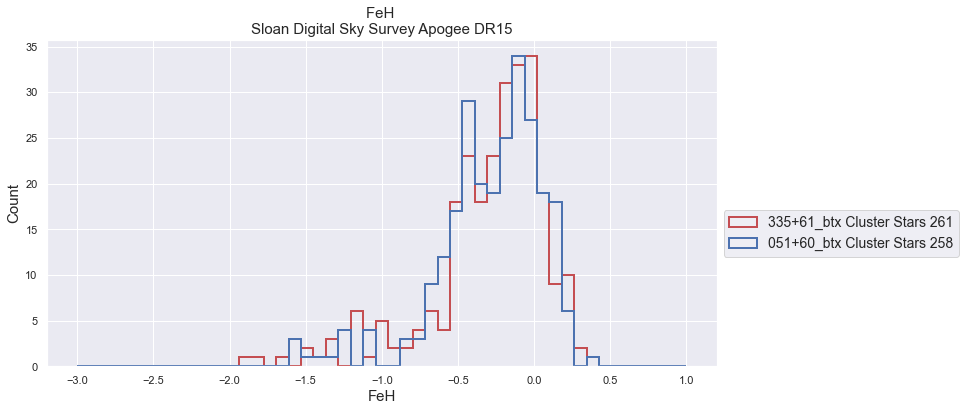

Plot 002


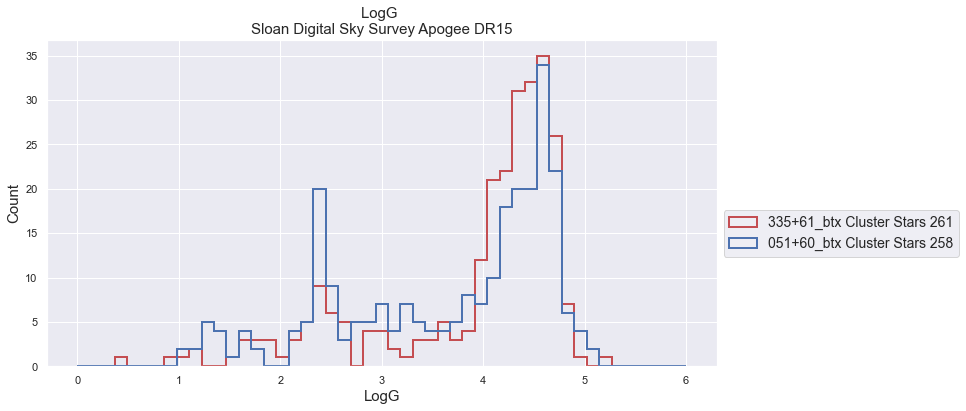

Plot 003


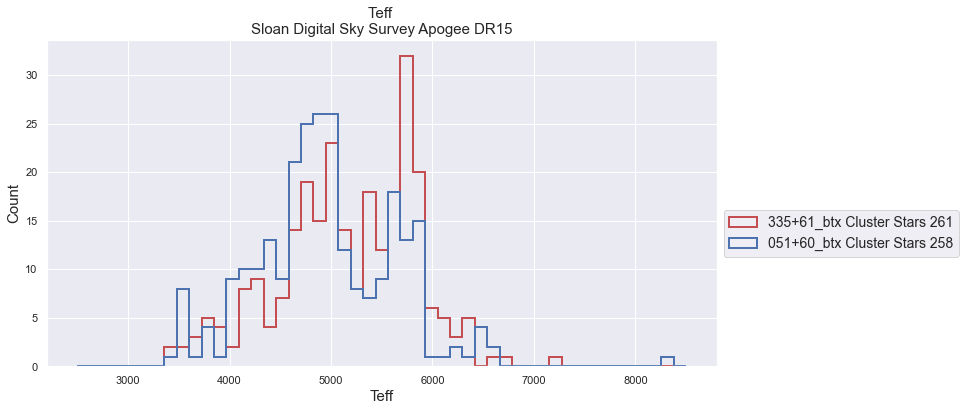

Plot 004


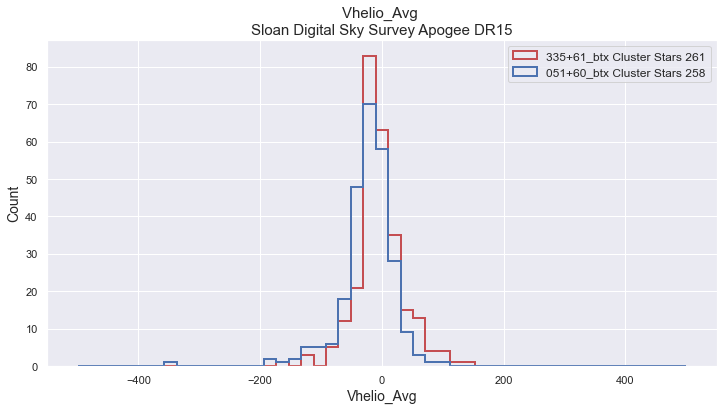

Plot 005


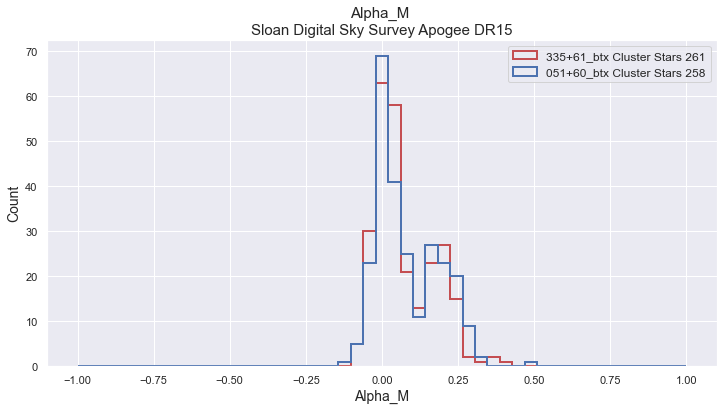

Plot 006


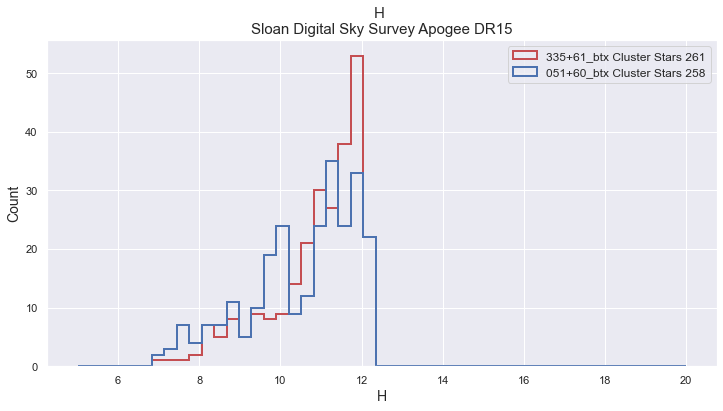

Plot 007


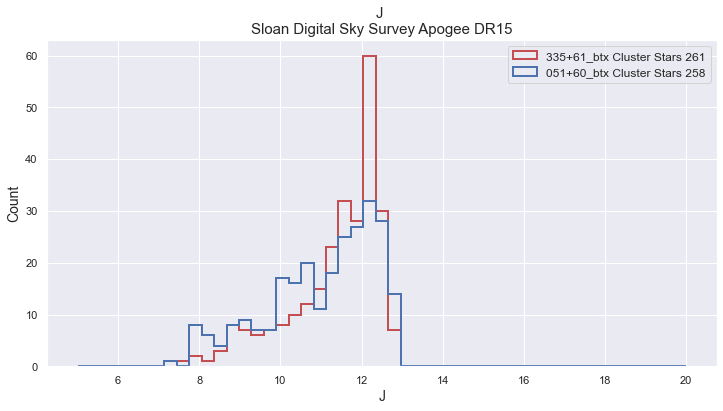

Plot 008


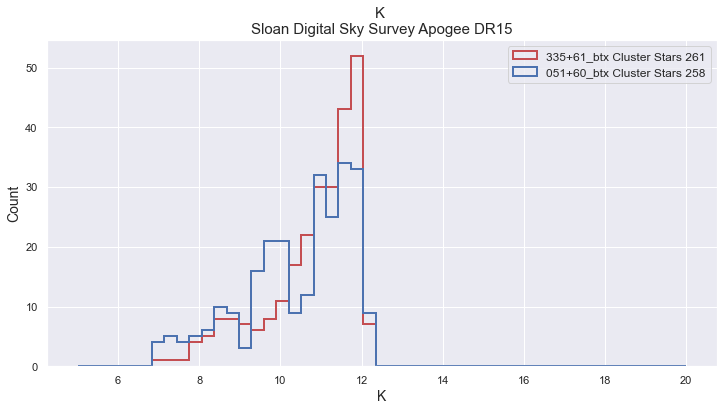

Plot 009


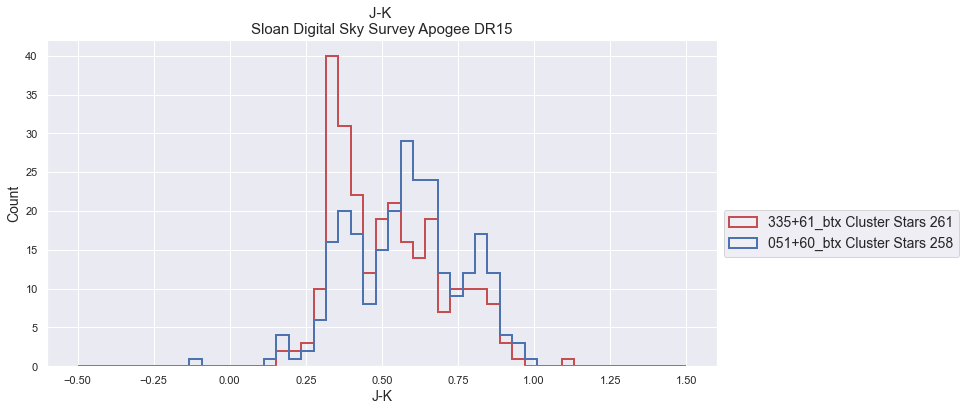

Plot 010


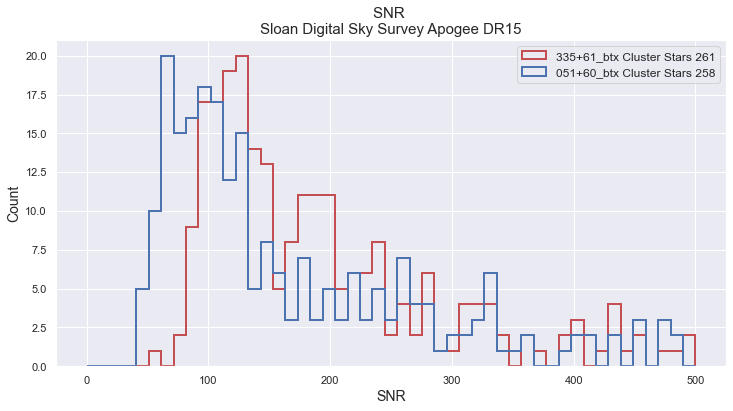

Plot 011


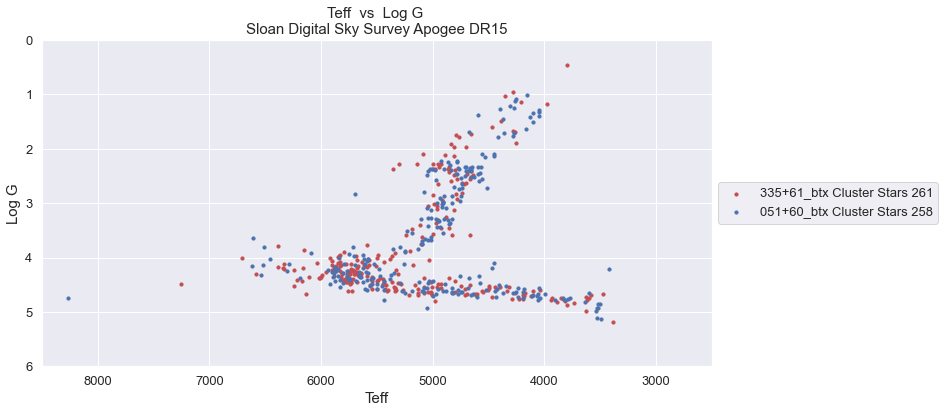

Plot 012


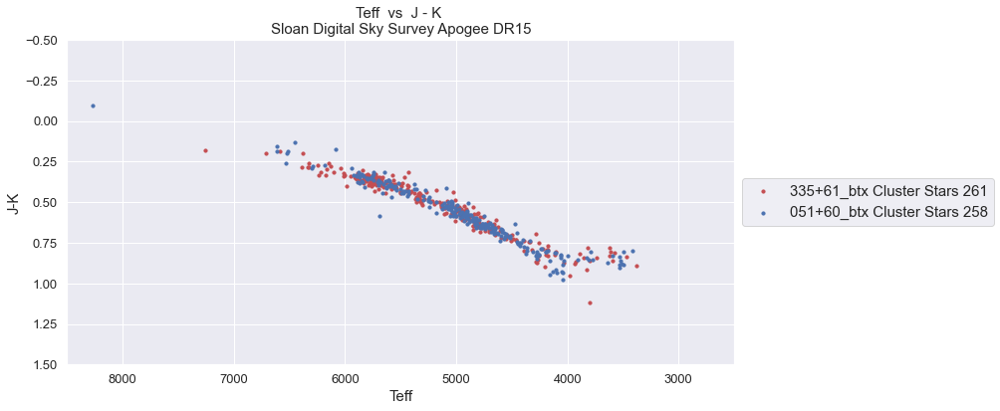

Plot 013


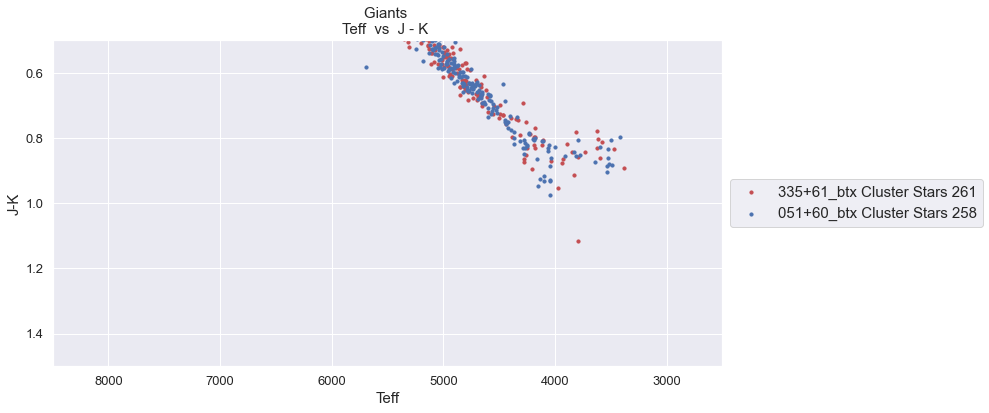

Plot 014


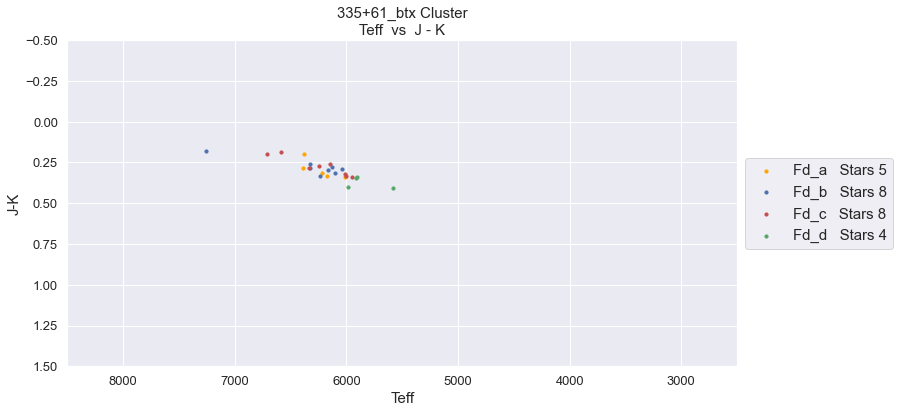

Plot 015


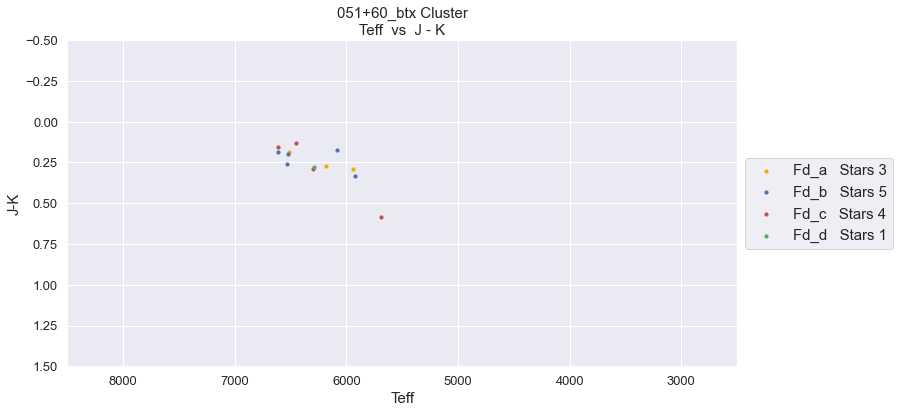

Plot 016


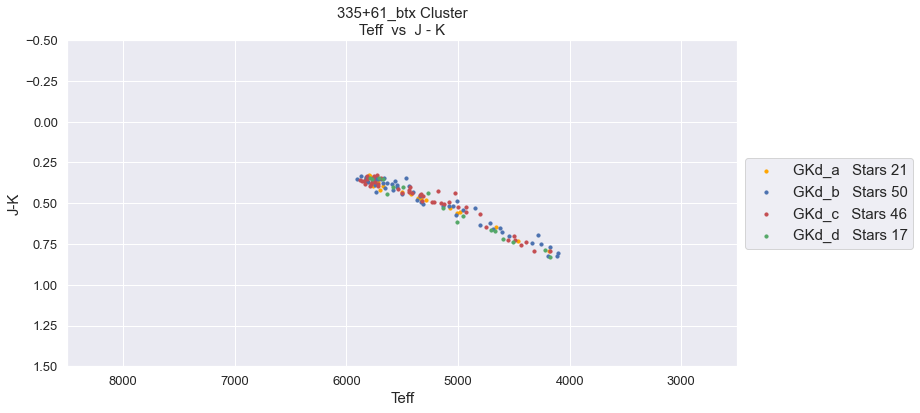

Plot 017


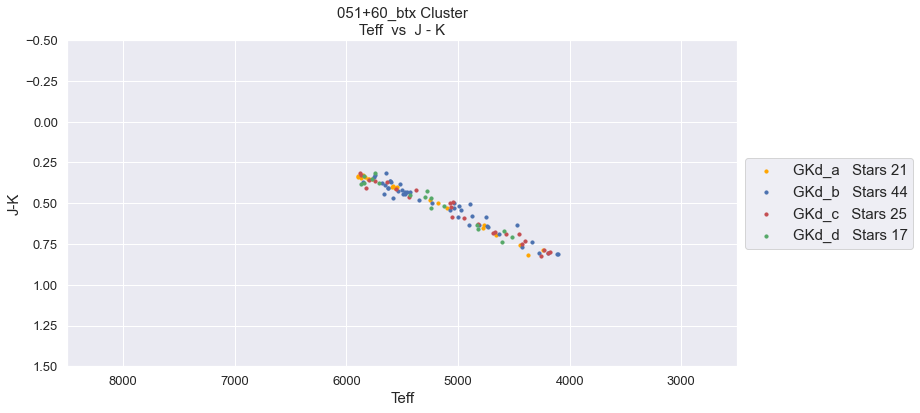

Plot 018


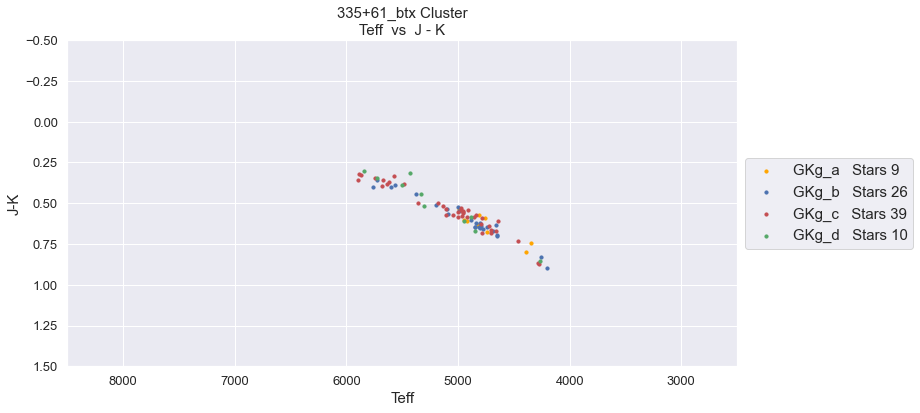

Plot 019


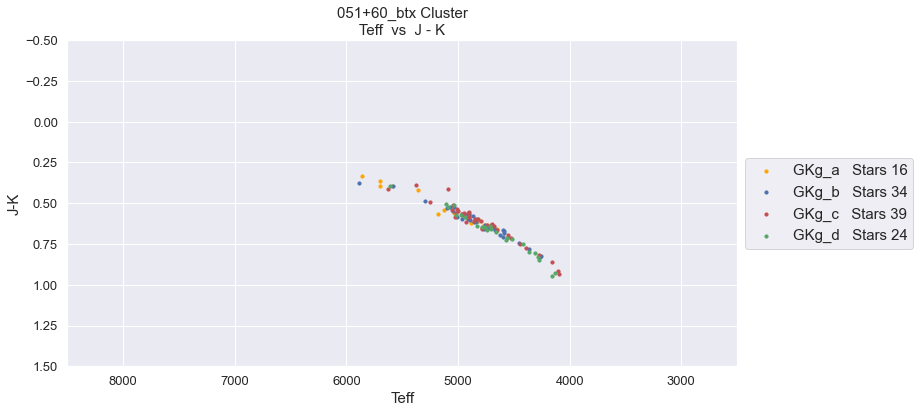

Plot 020


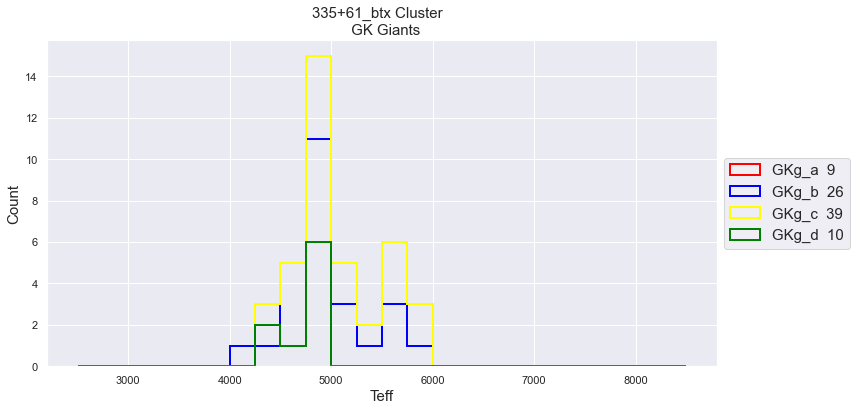

Plot 021


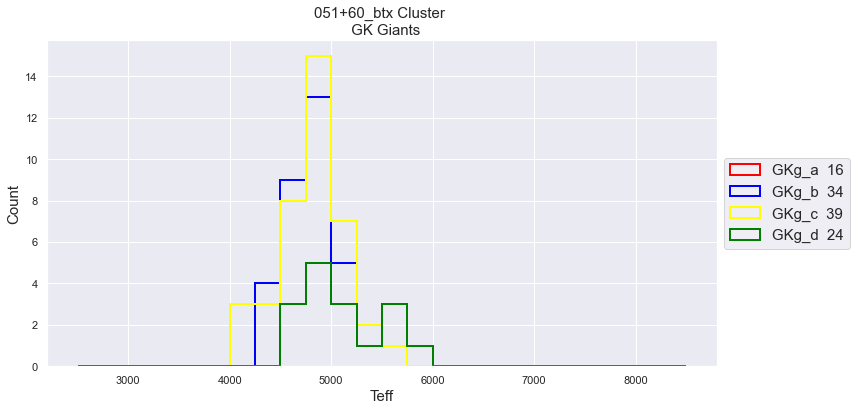

Plot 022


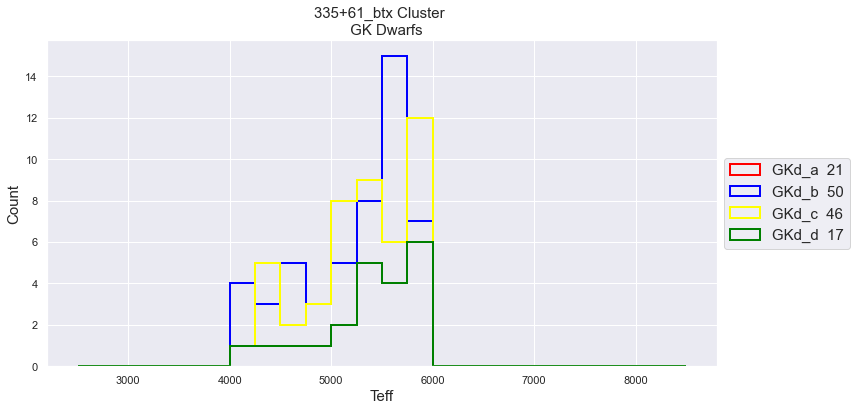

Plot 023


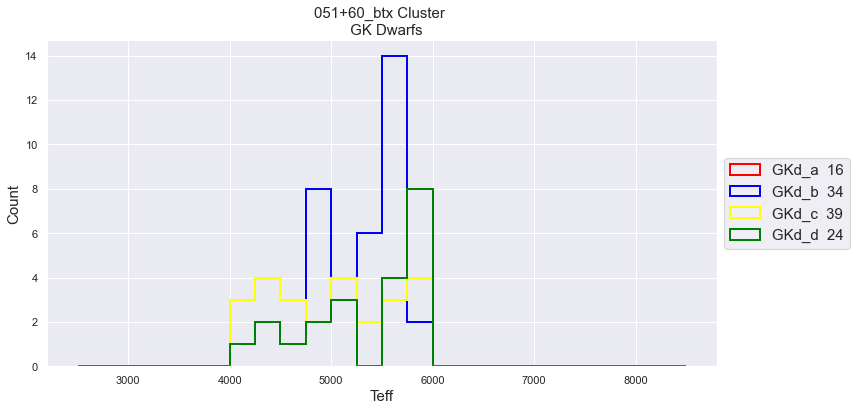

Plot 024


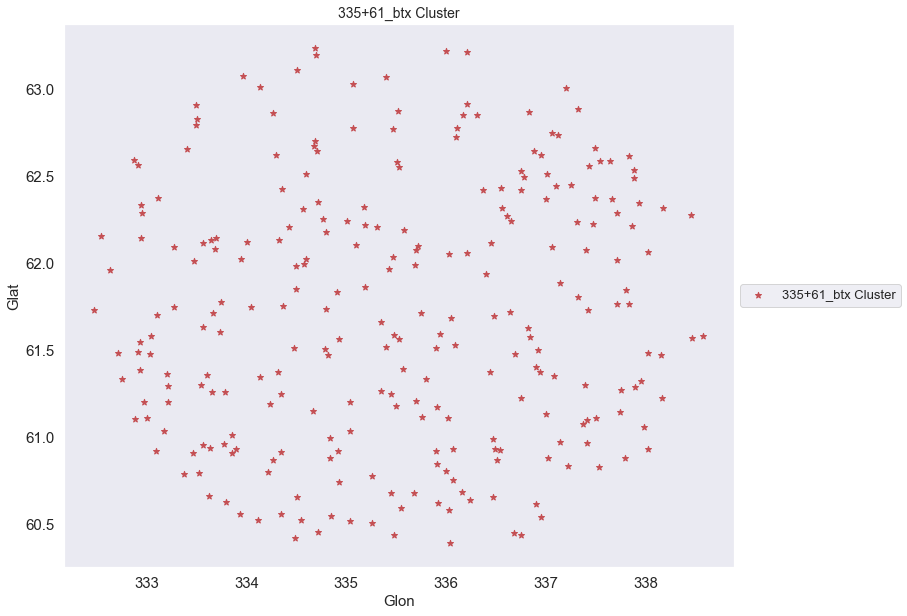

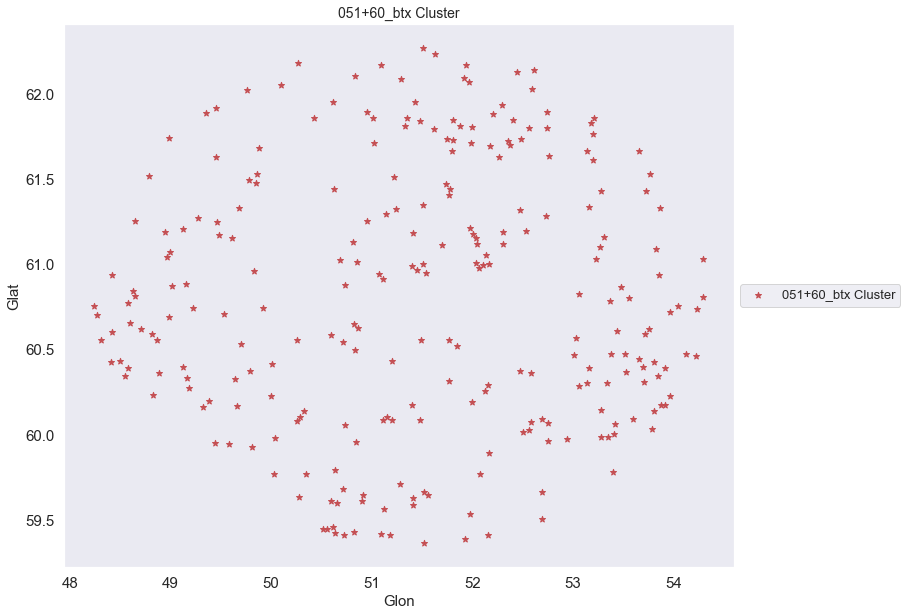

Plot 025


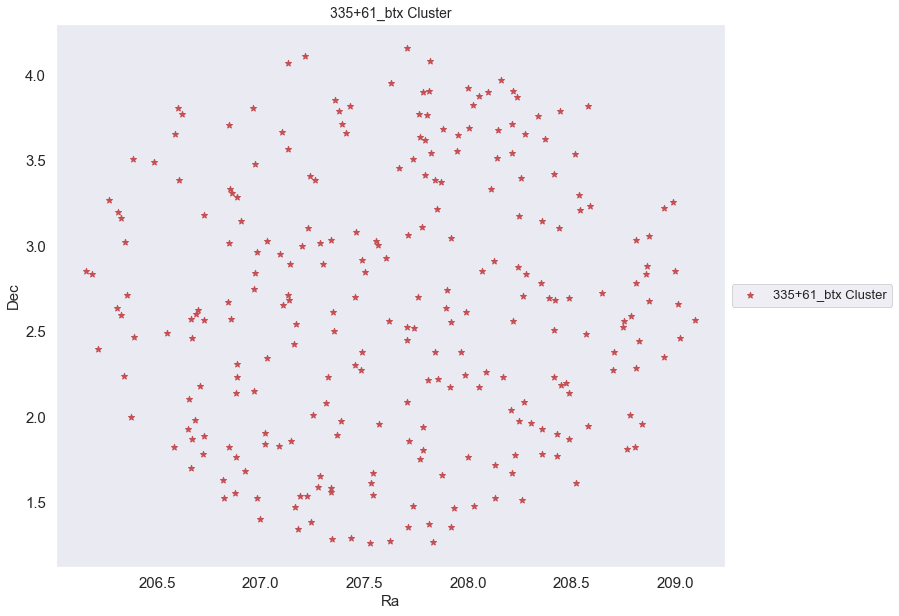

Plot 026


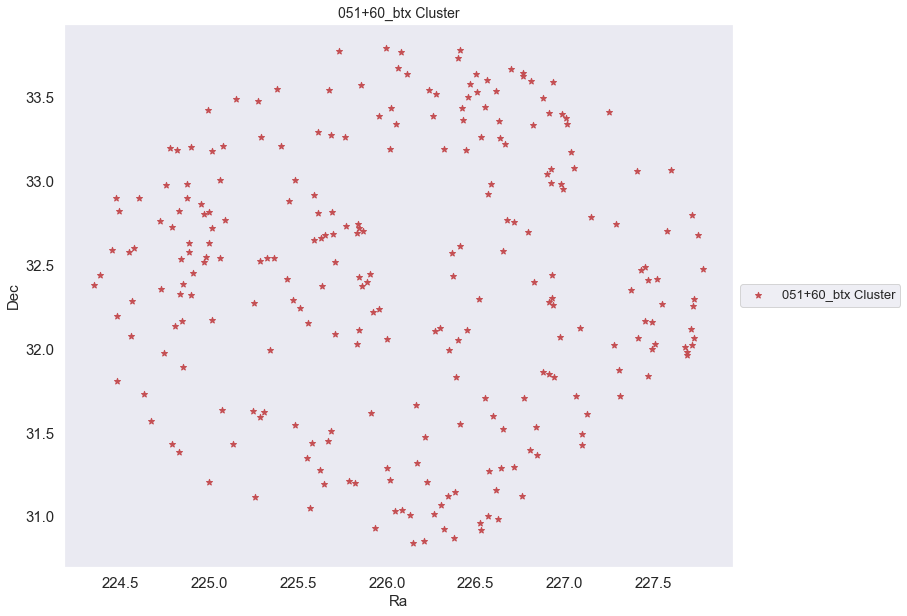

Plot 027


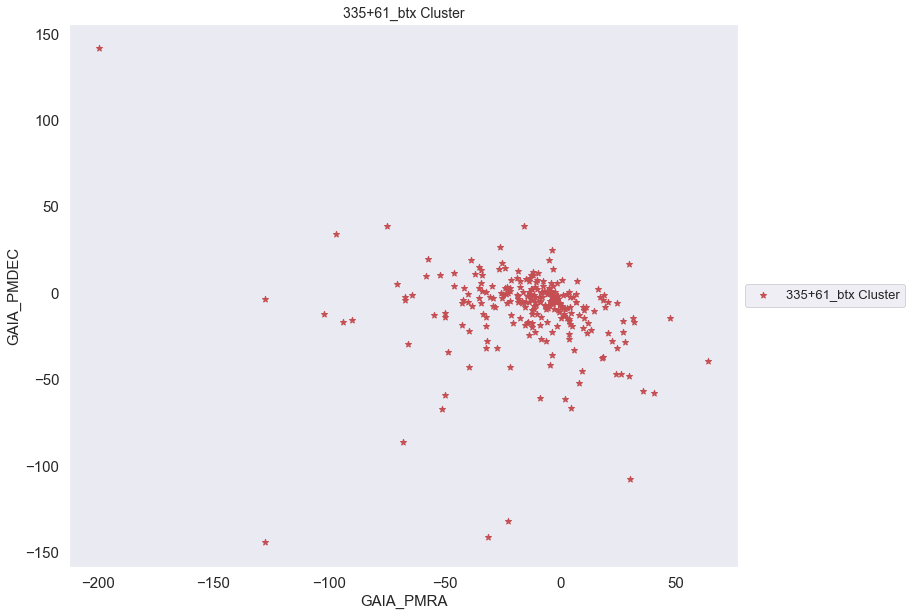

Plot 028


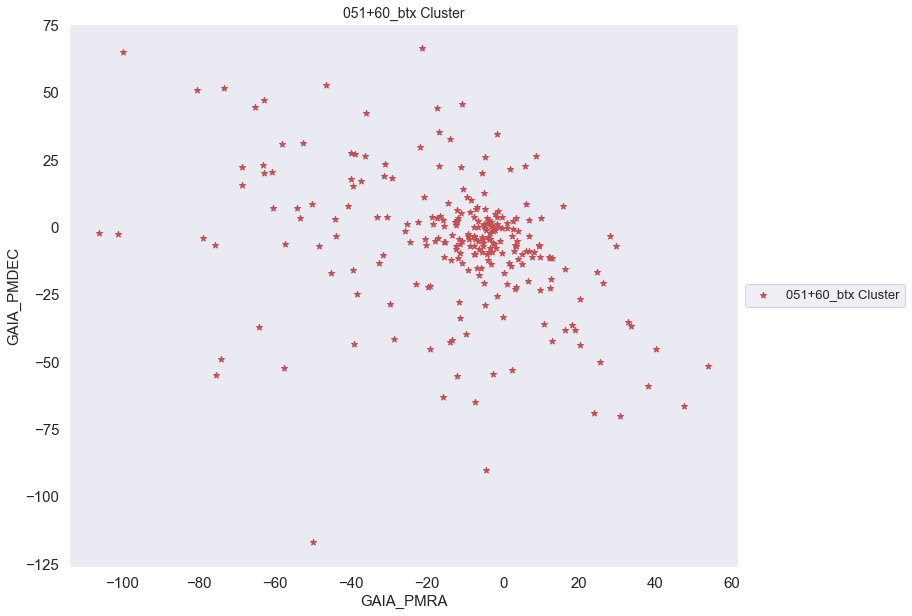

Plot 029


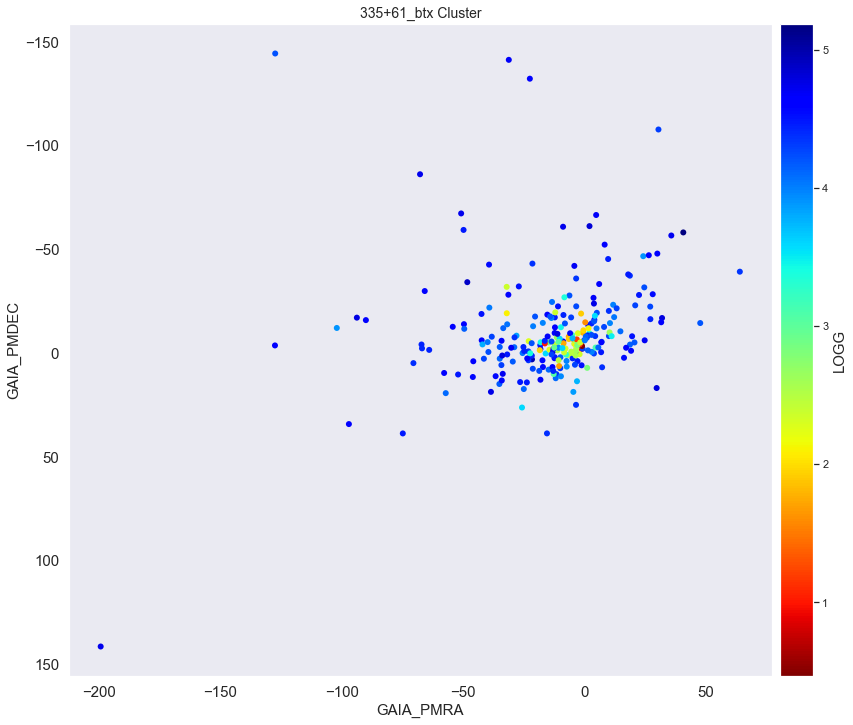

Plot 030


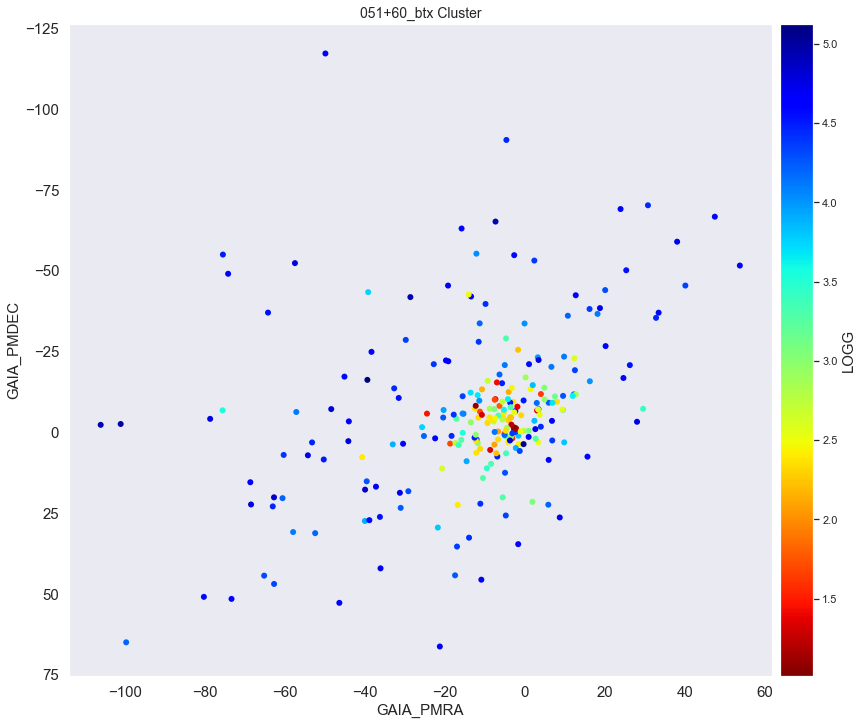

Plot 031


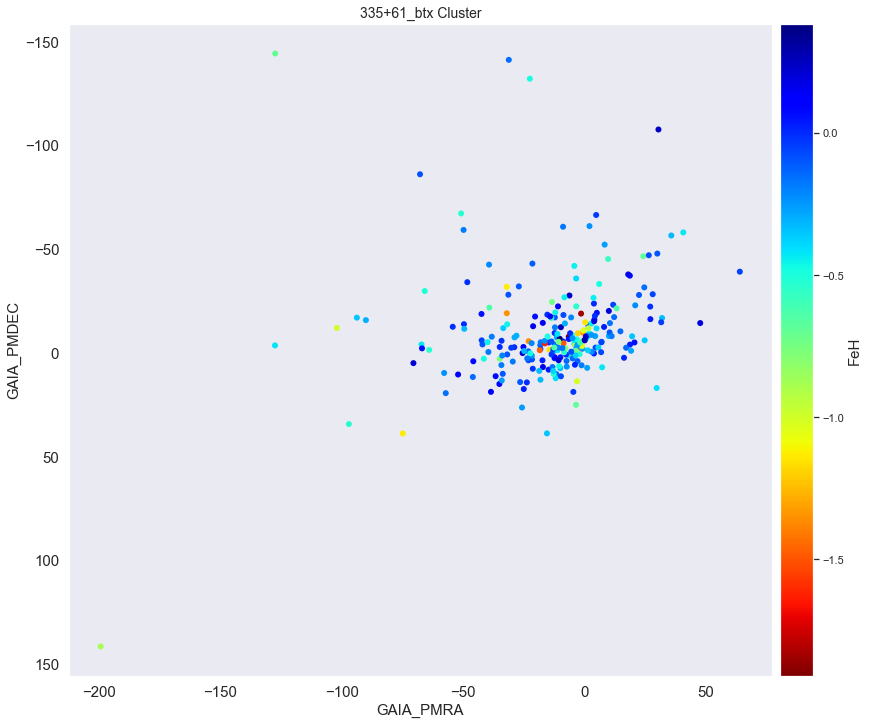

Plot 032


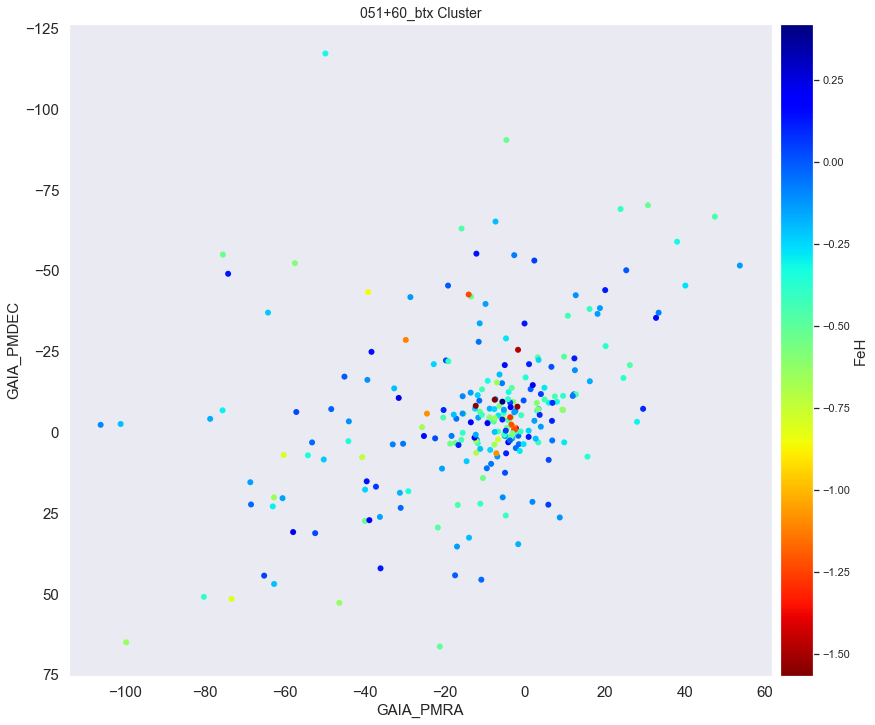

Plot 033


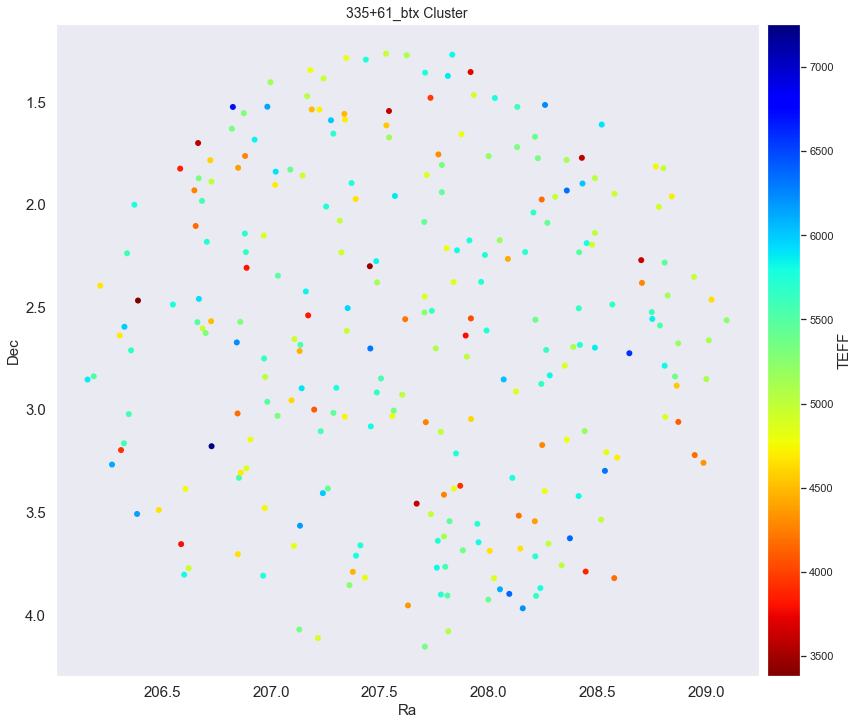

Plot 034


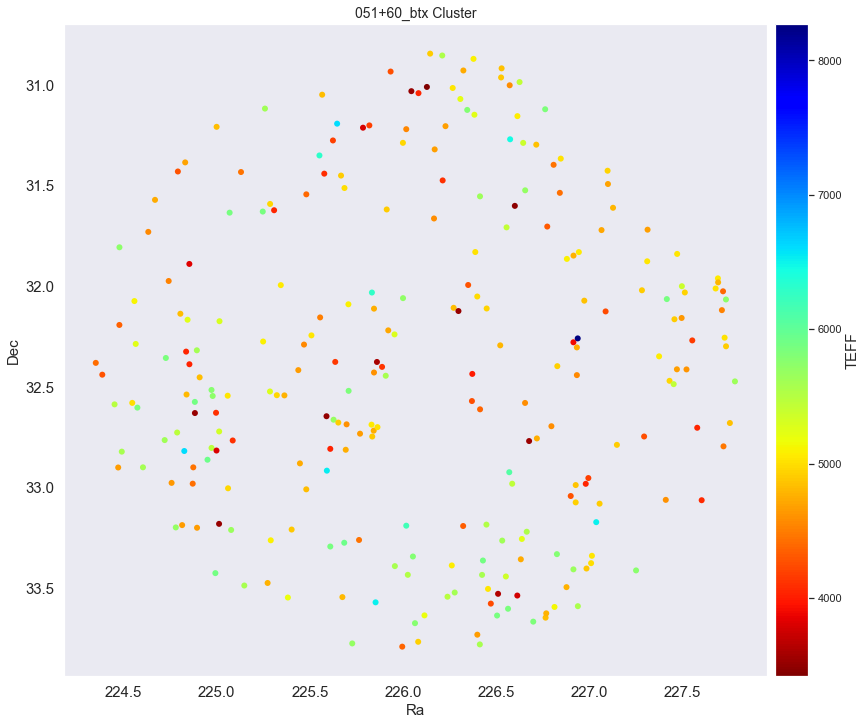

Plot 035


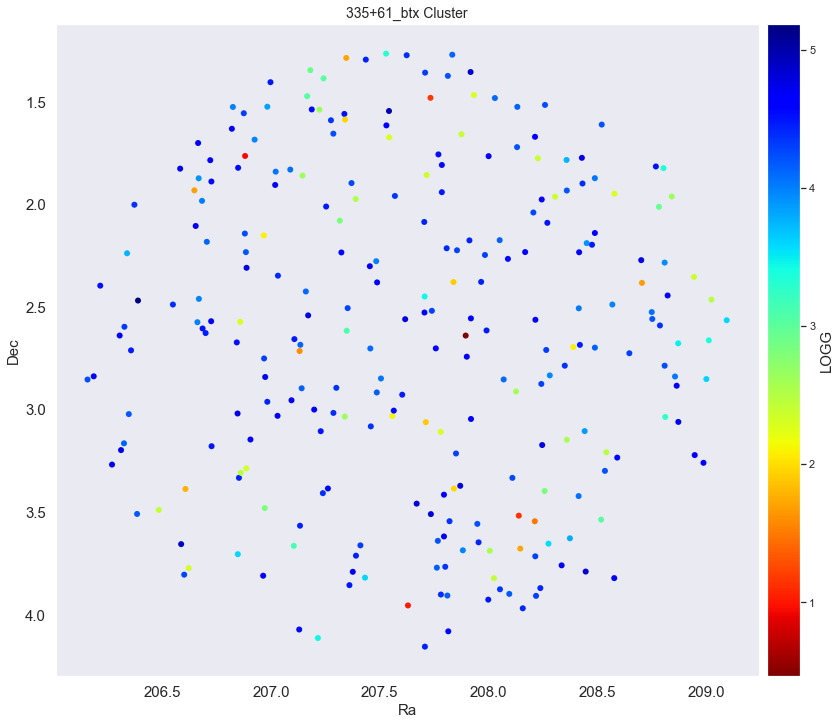

Plot 036


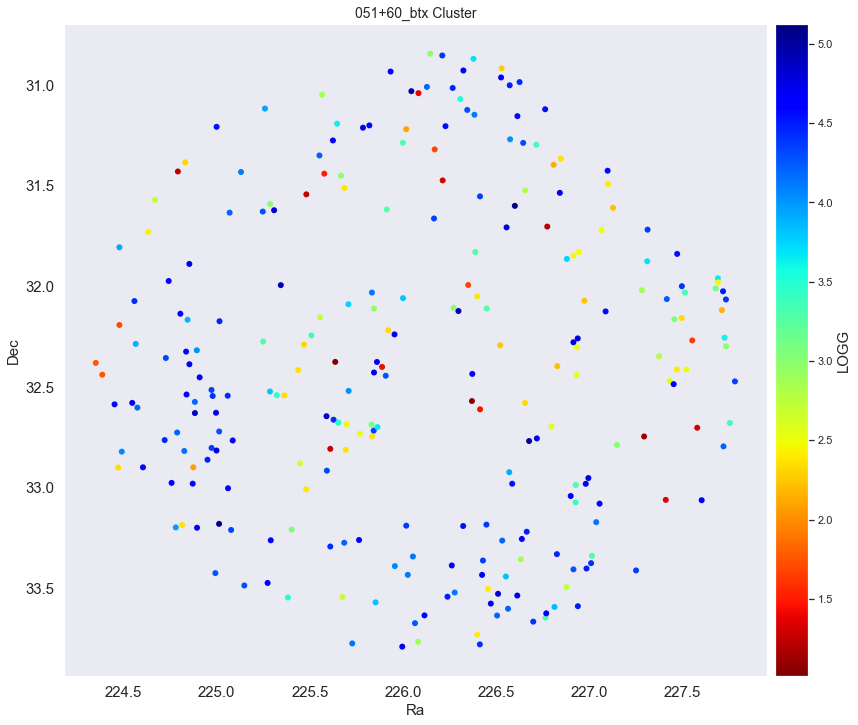

Plot 037


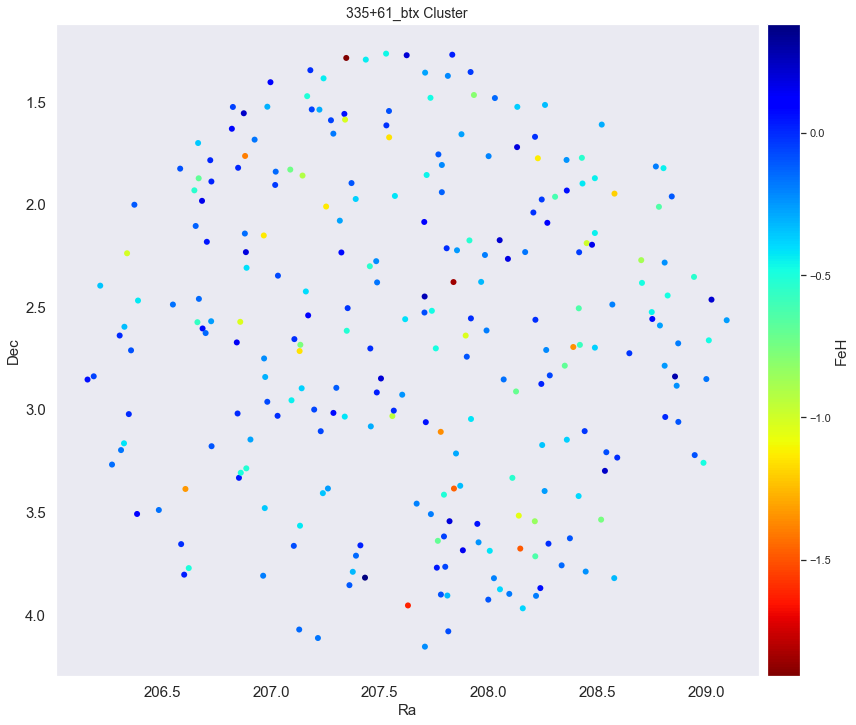

Plot 038


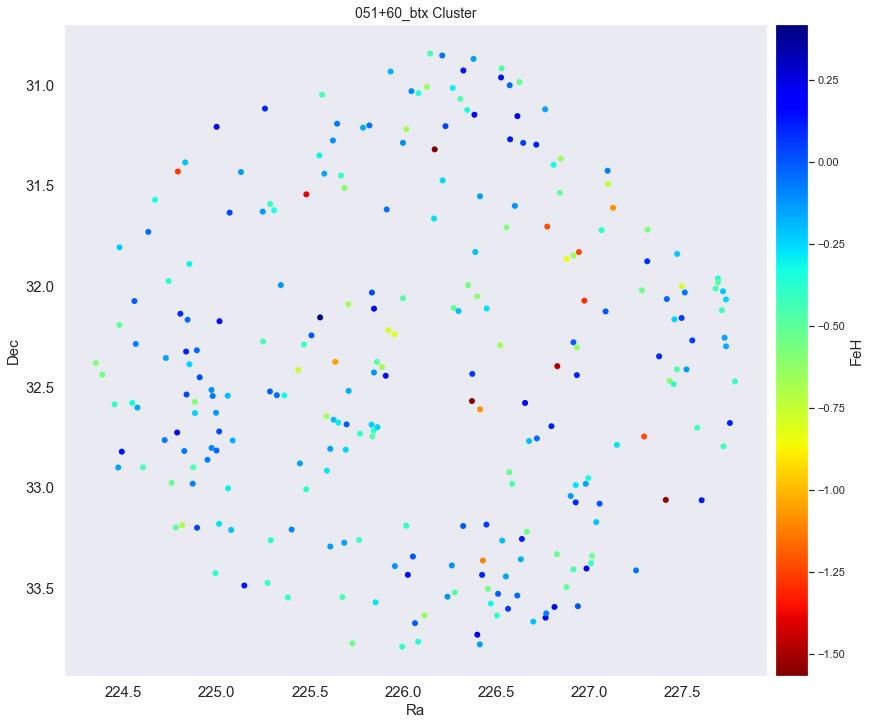

Plot 039


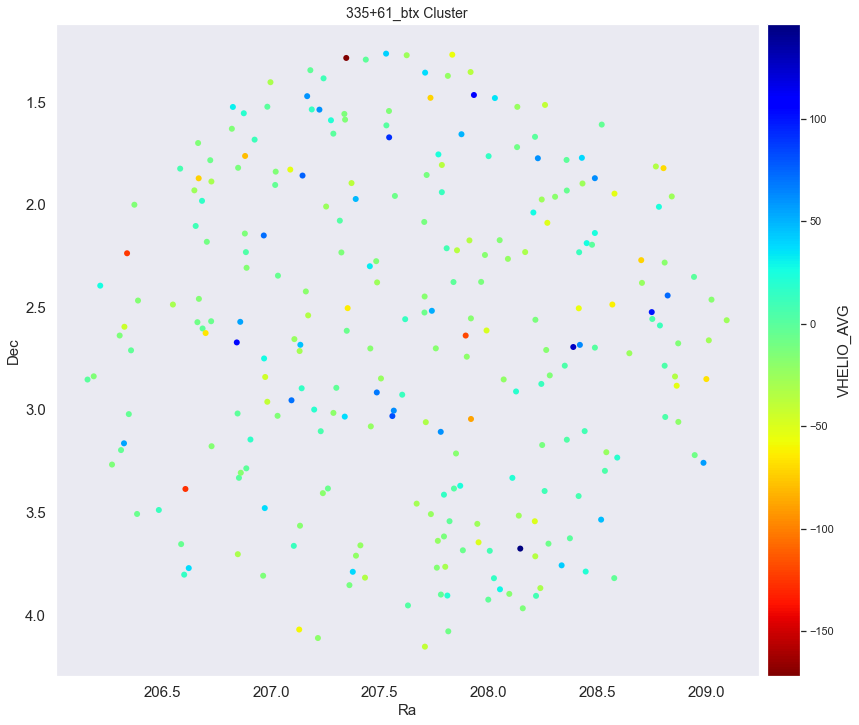

Plot 040


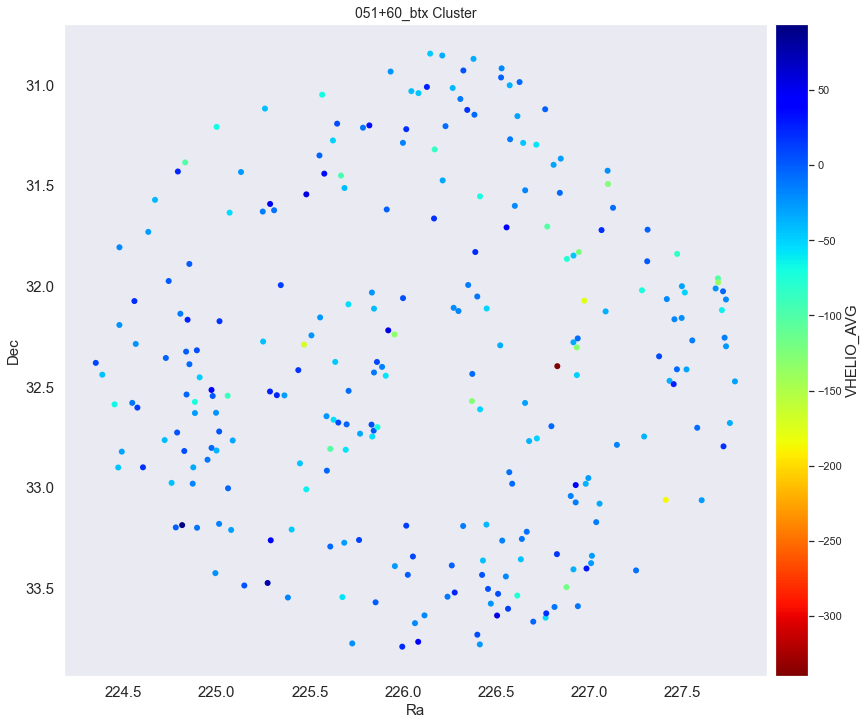

Plot 041


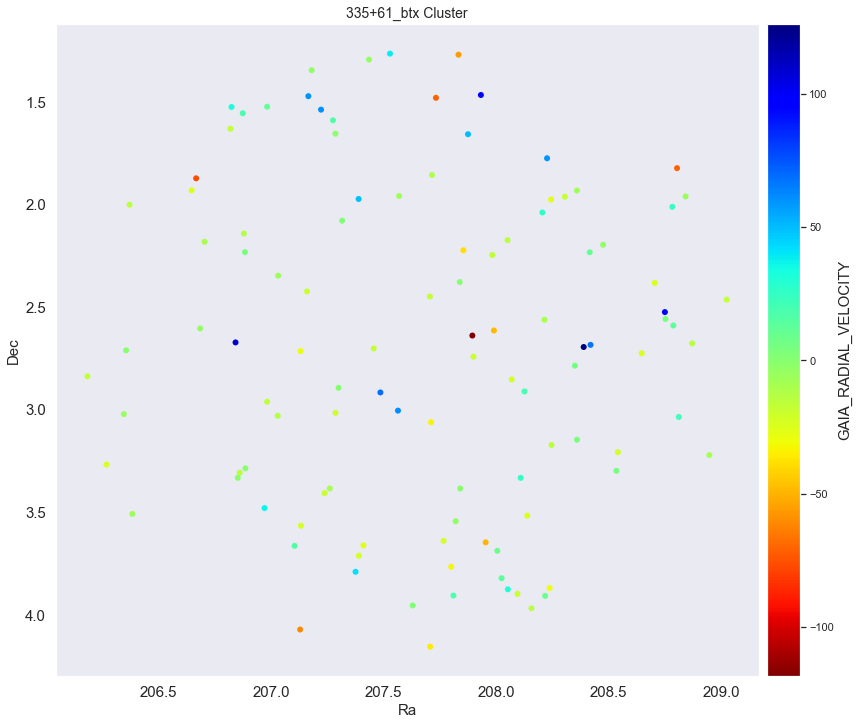

Plot 042


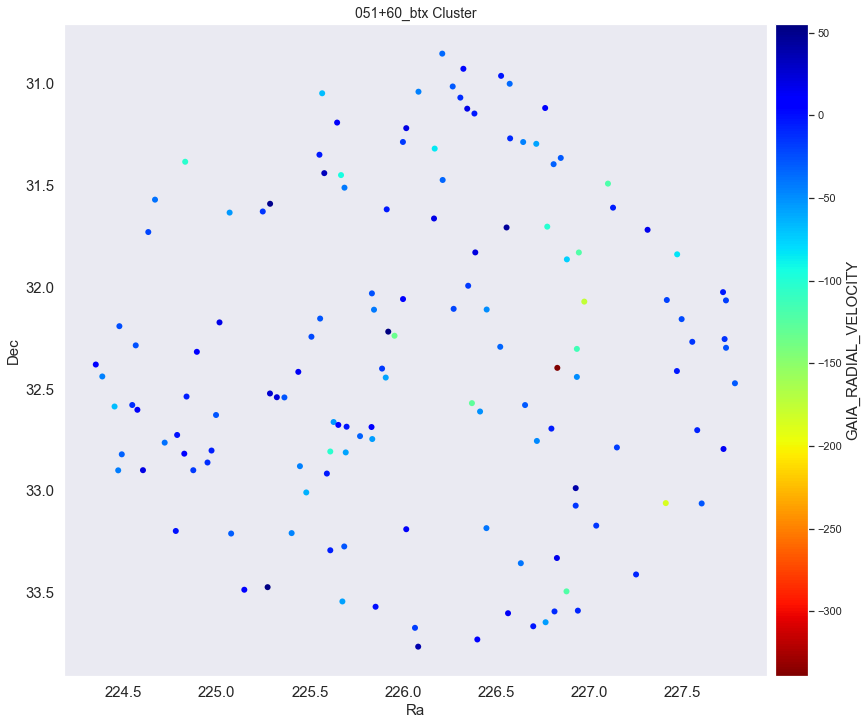

Plot 043


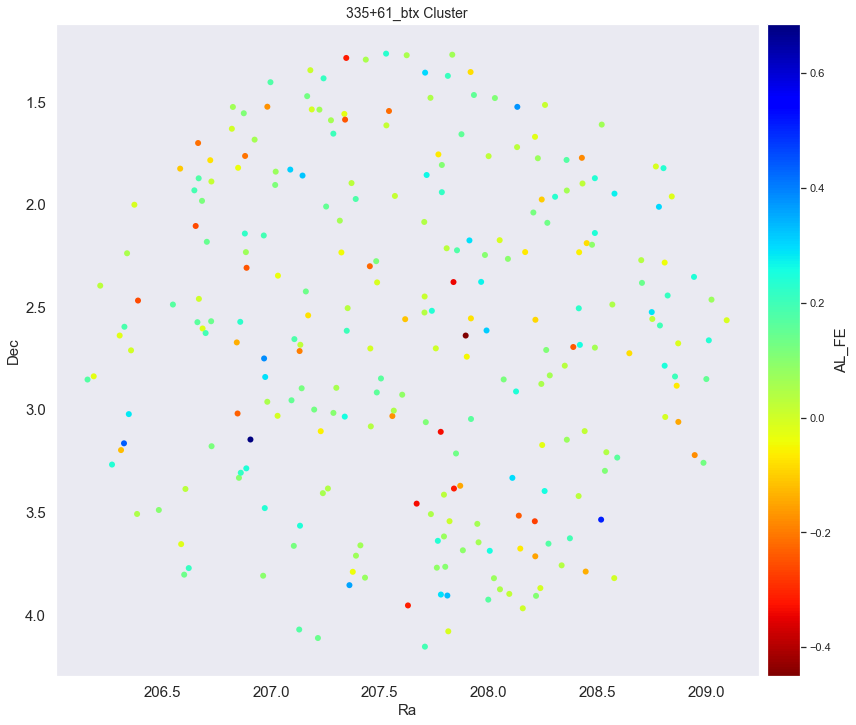

Plot 044


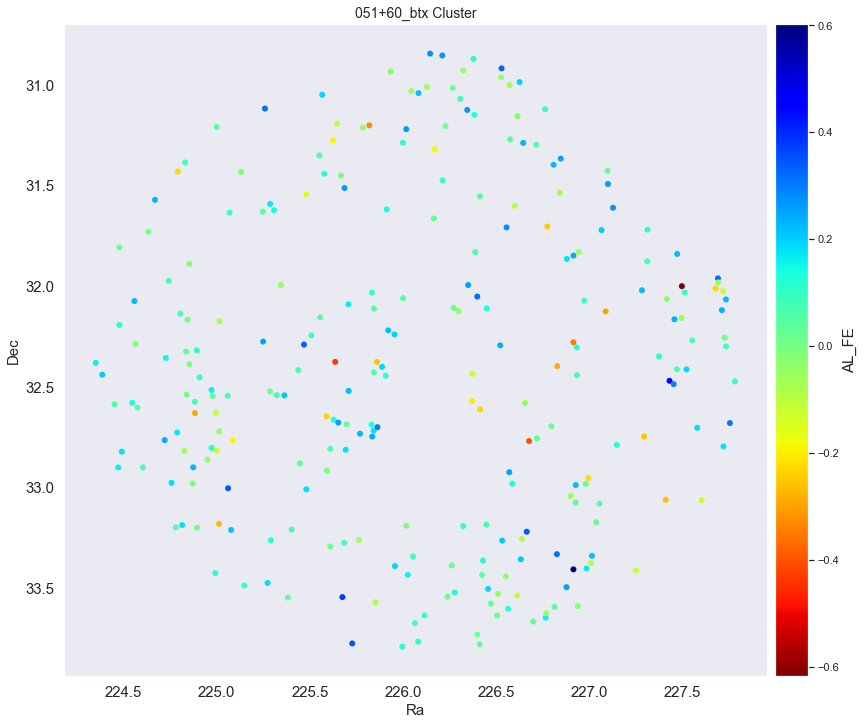

Plot 045


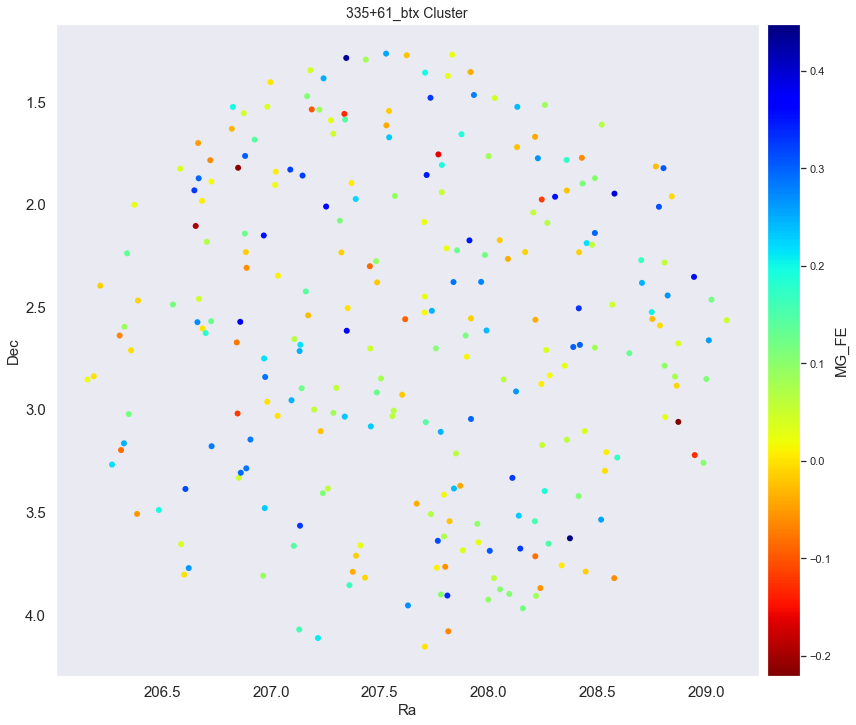

Plot 046


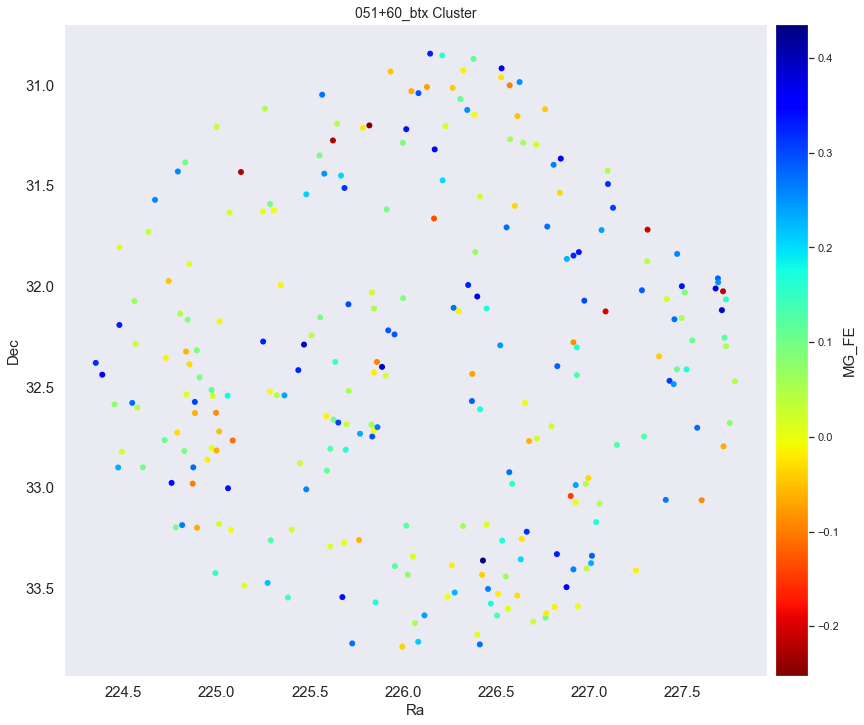

Plot 047


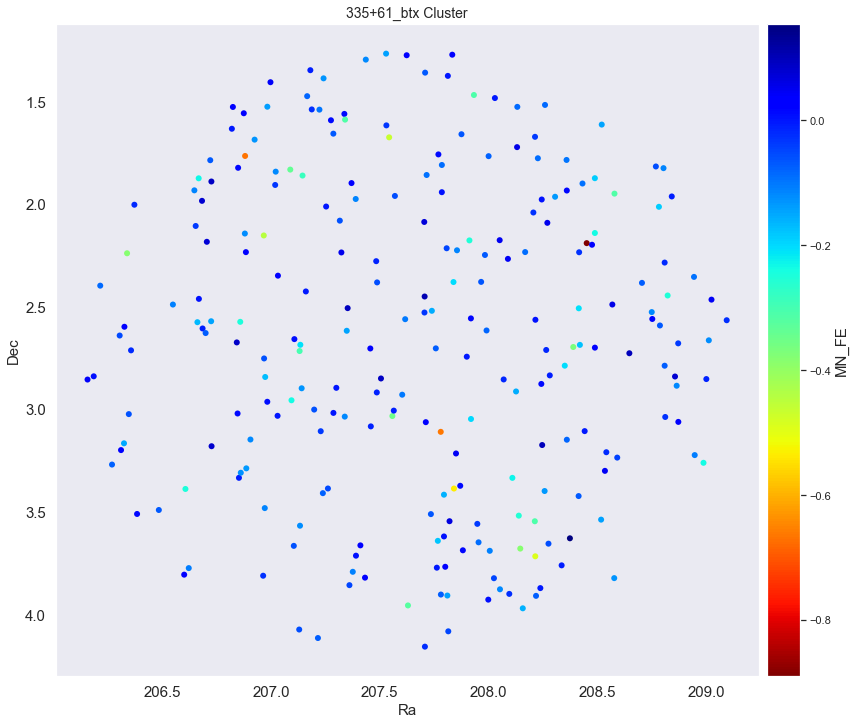

Plot 048


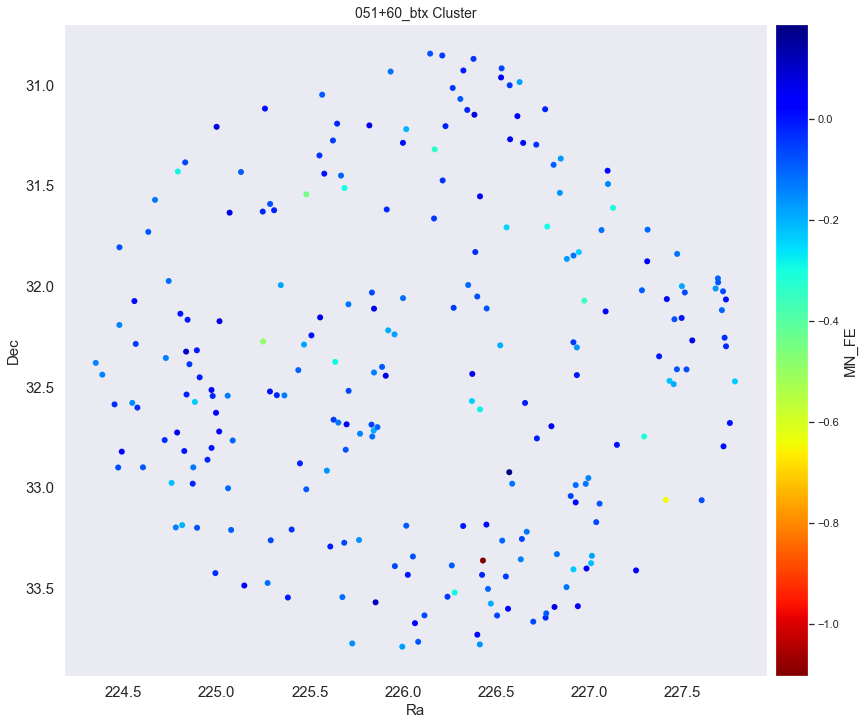

Plot 049


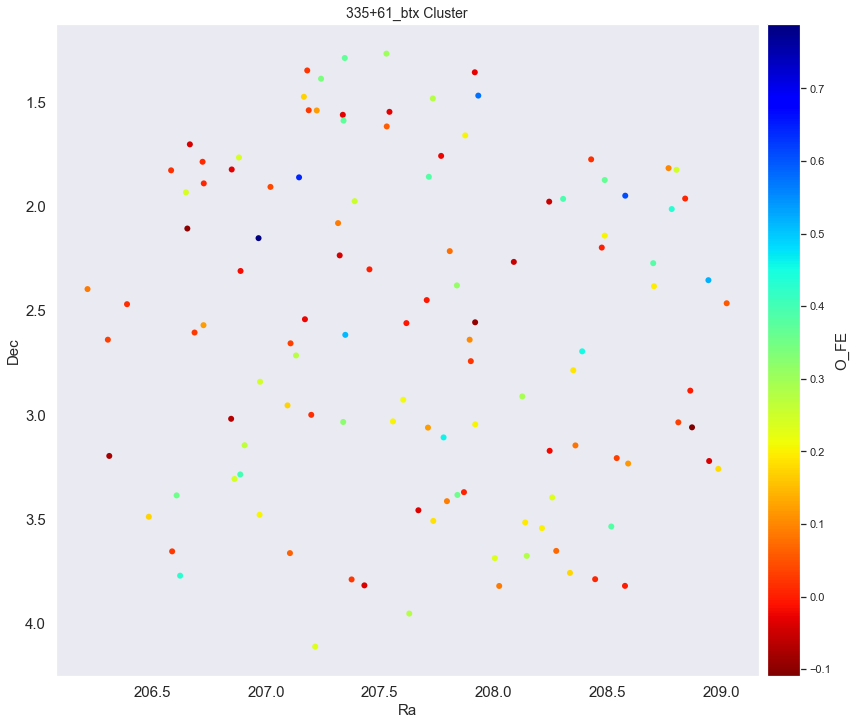

Plot 050


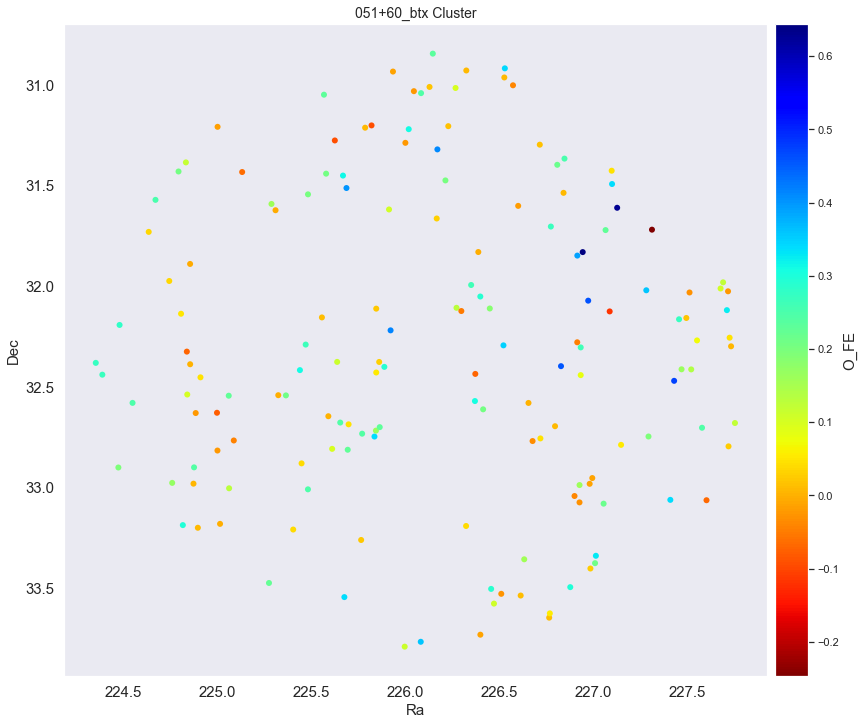

Plot 051


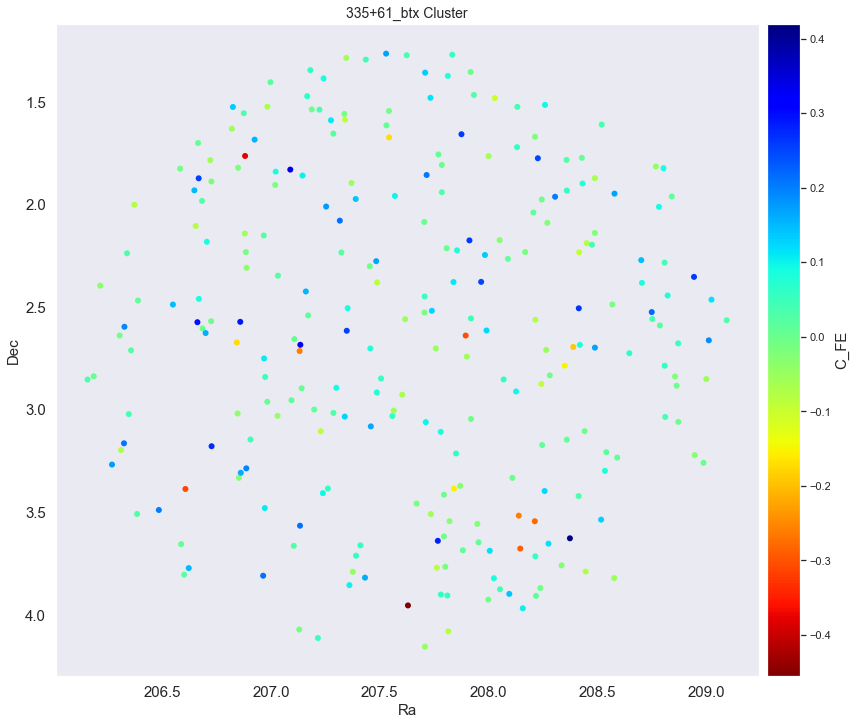

Plot 052


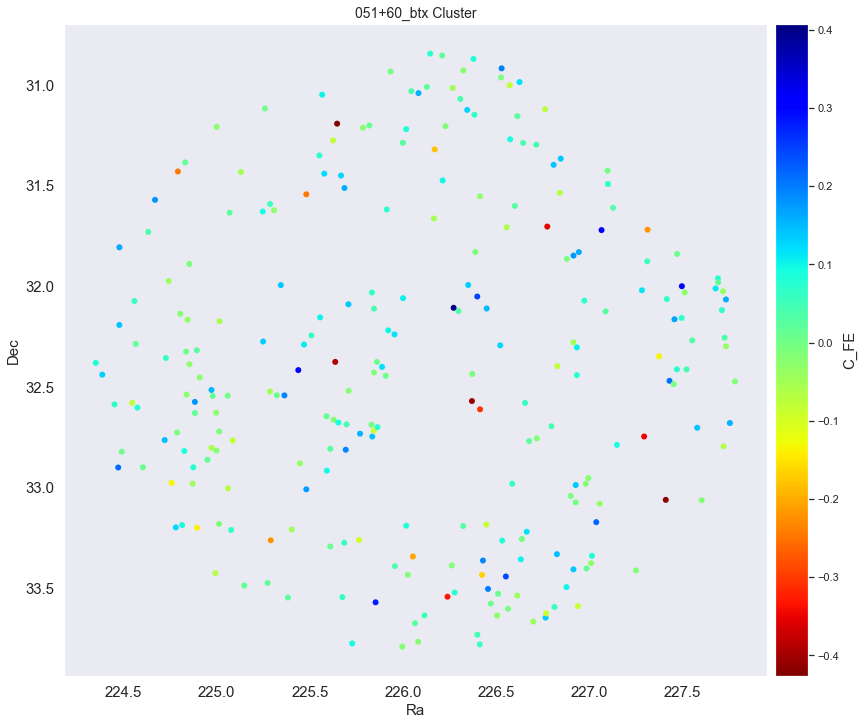

Plot 053


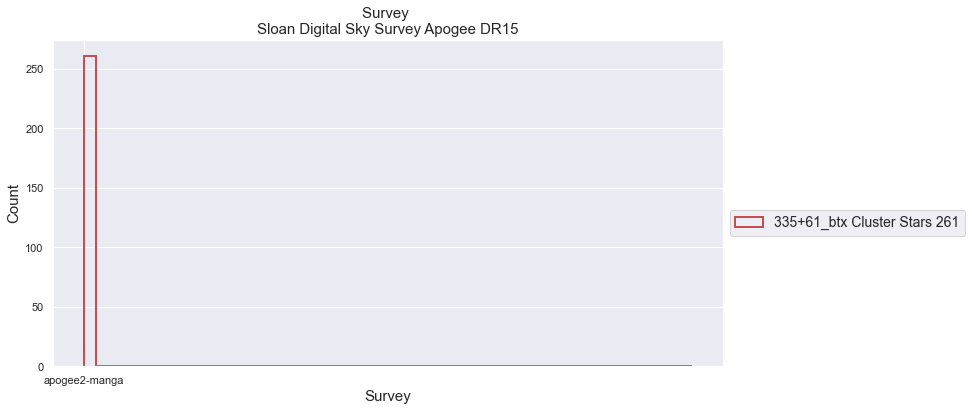

Plot 054


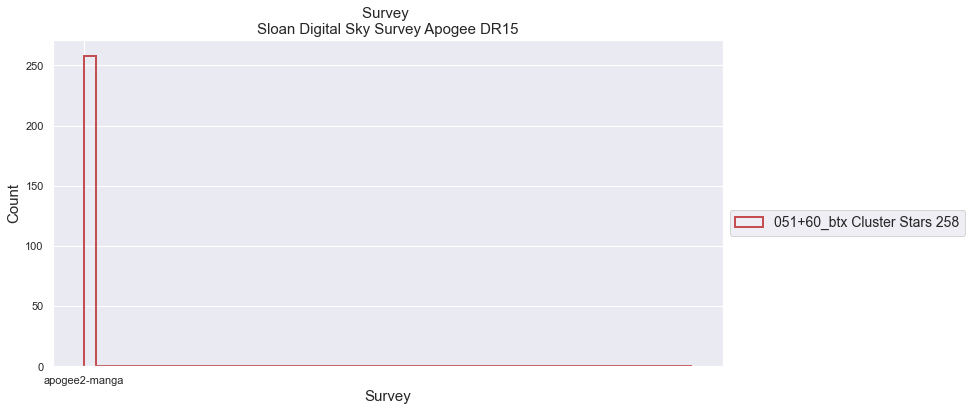

Plot 055


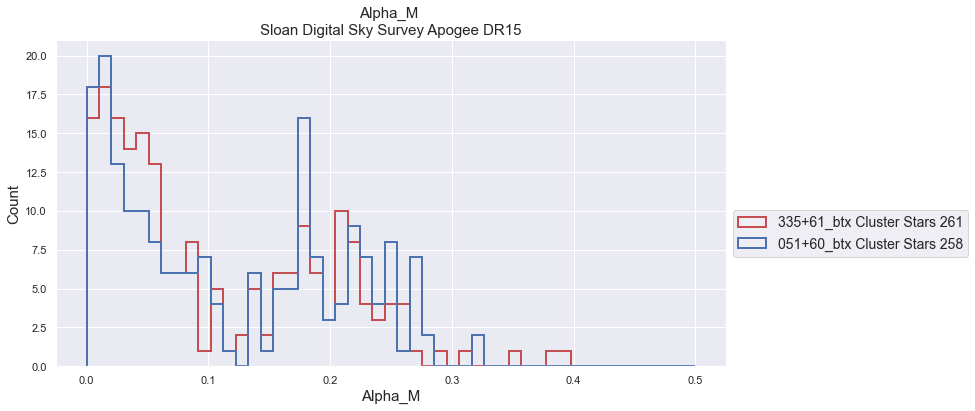

Plot 056


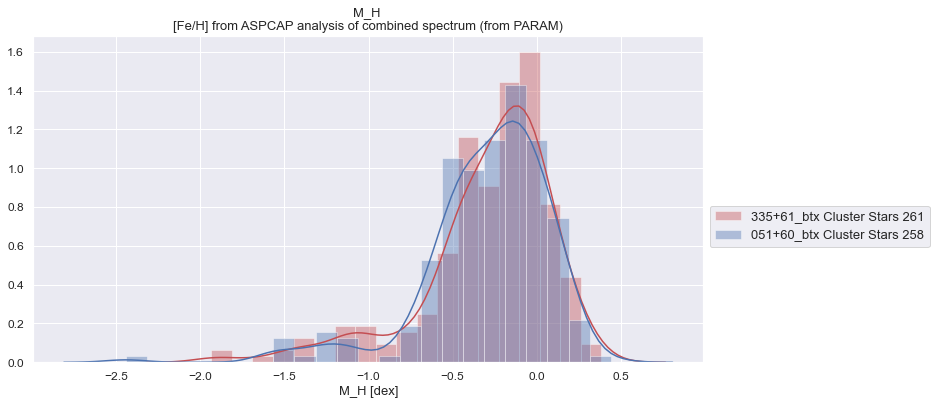

Plot 057


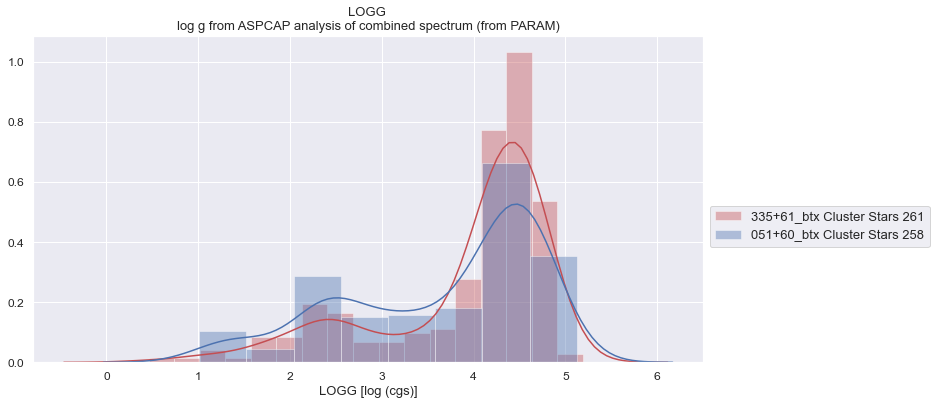

Plot 058


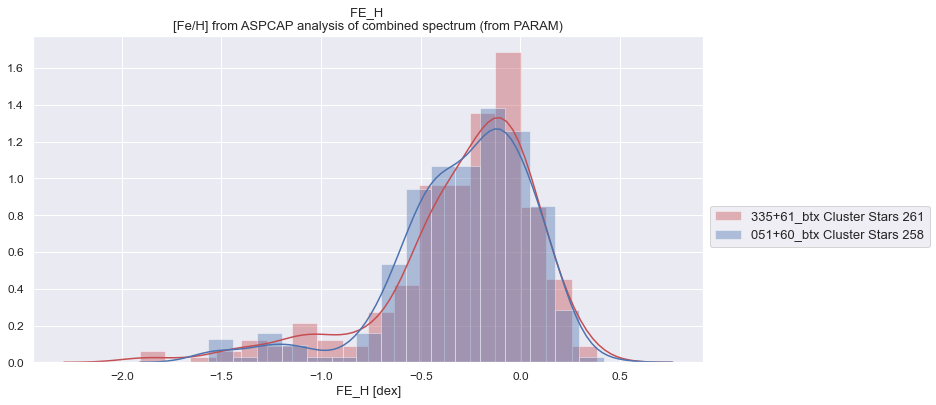

Plot 059


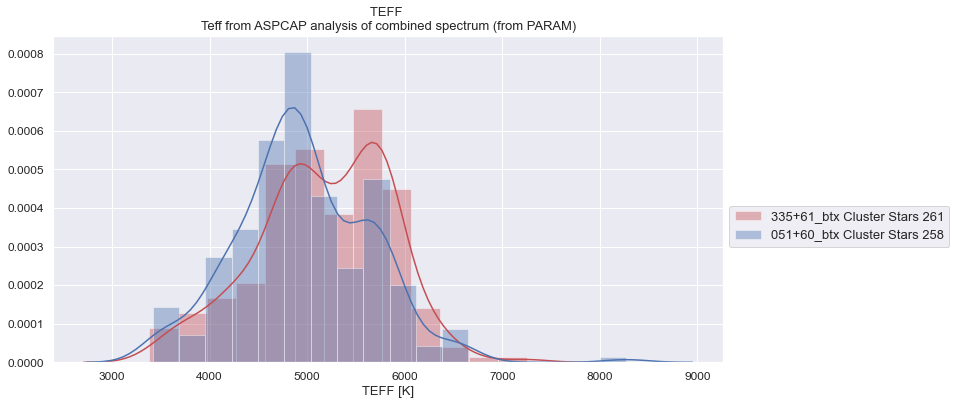

Plot 060


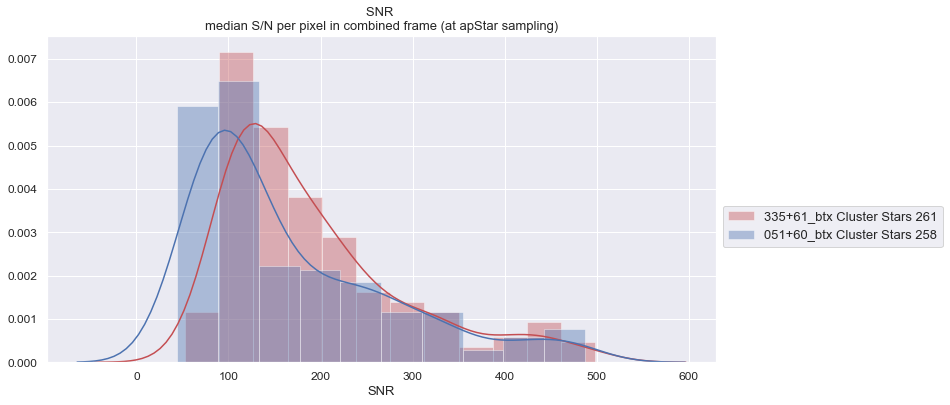

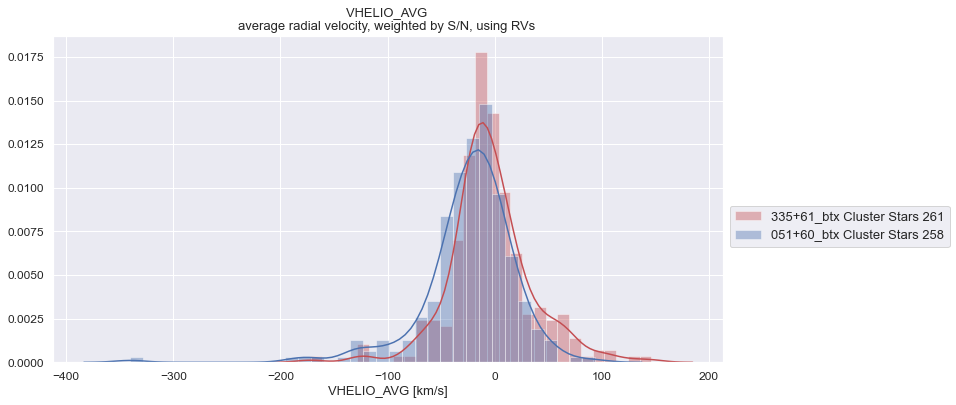

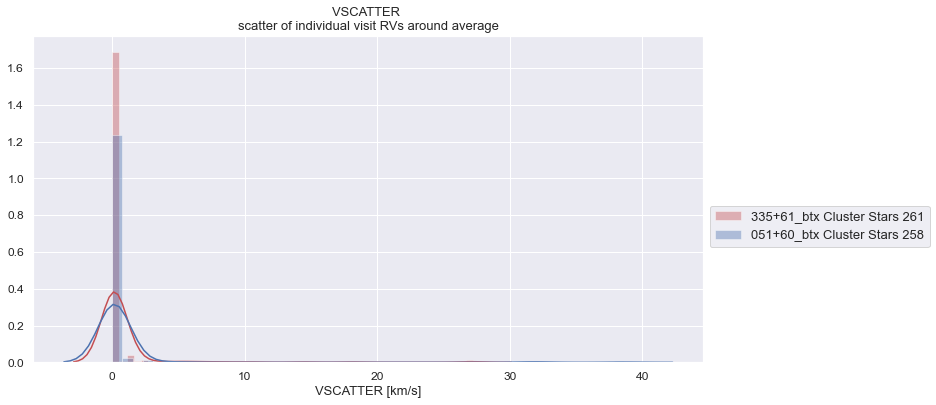

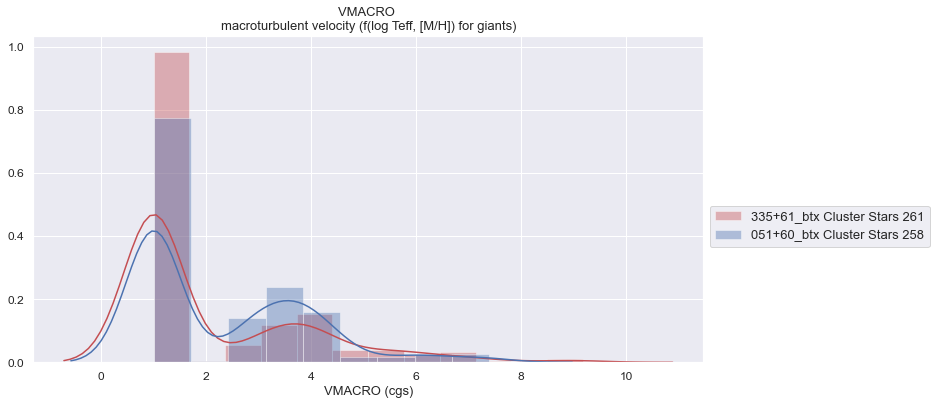

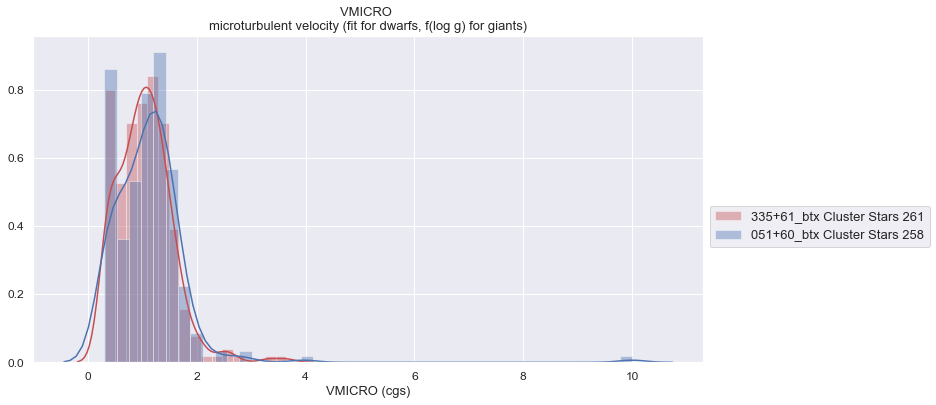

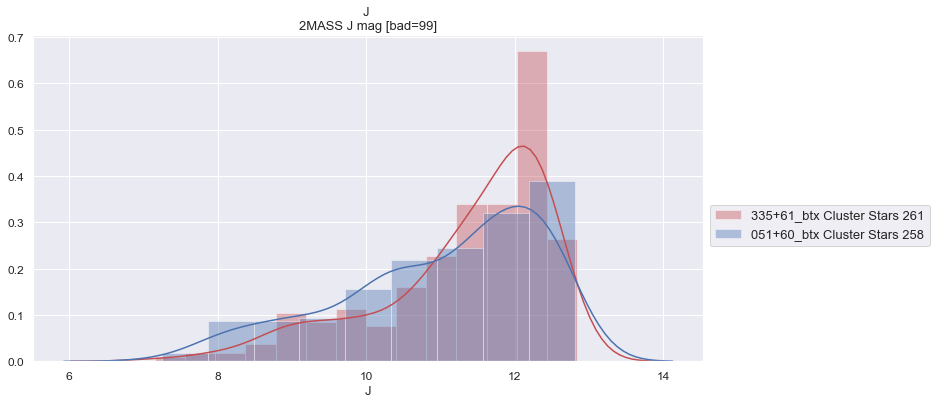

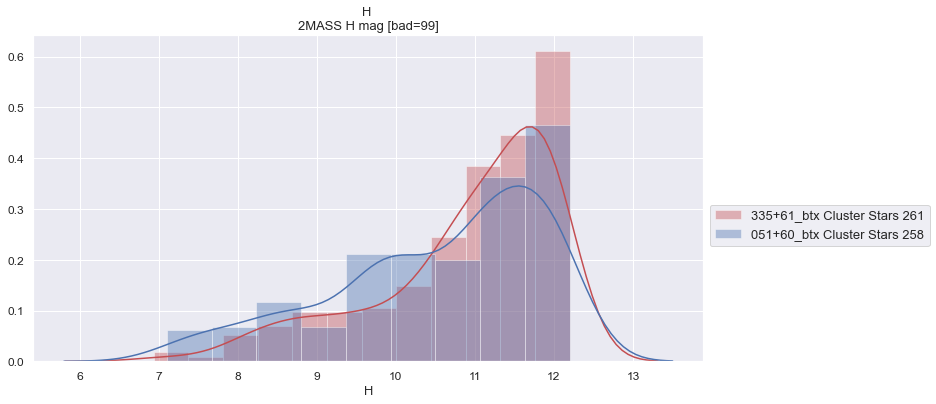

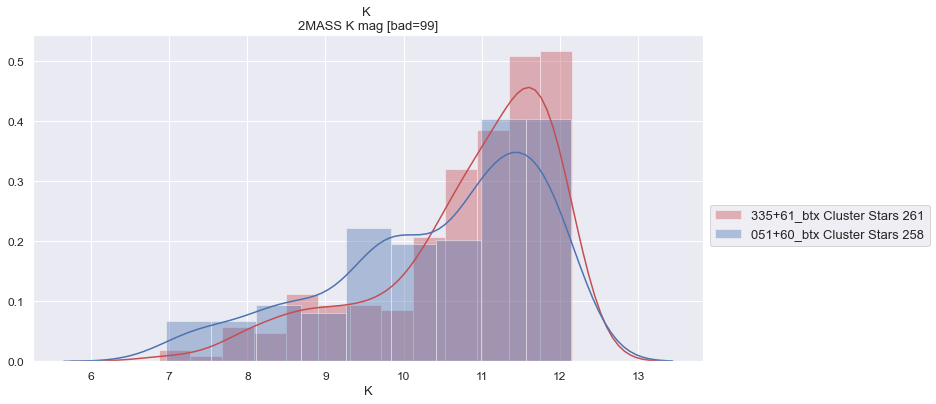

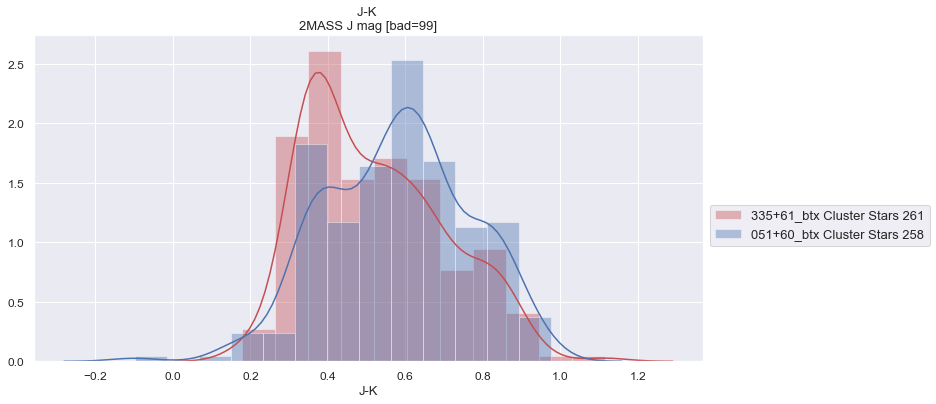

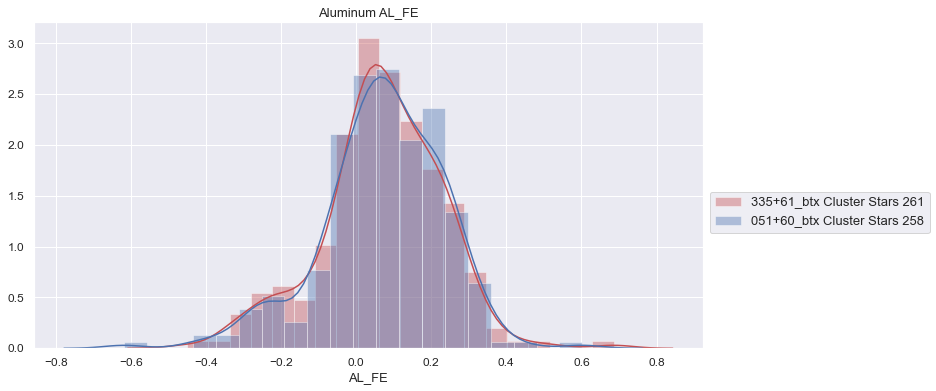

Plot 070


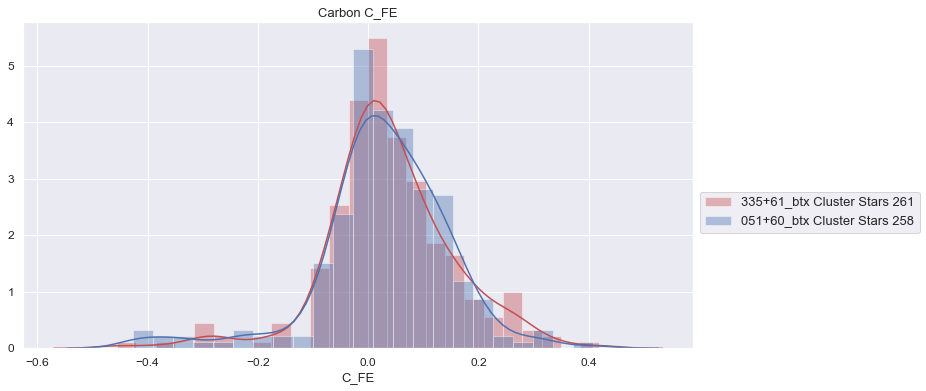

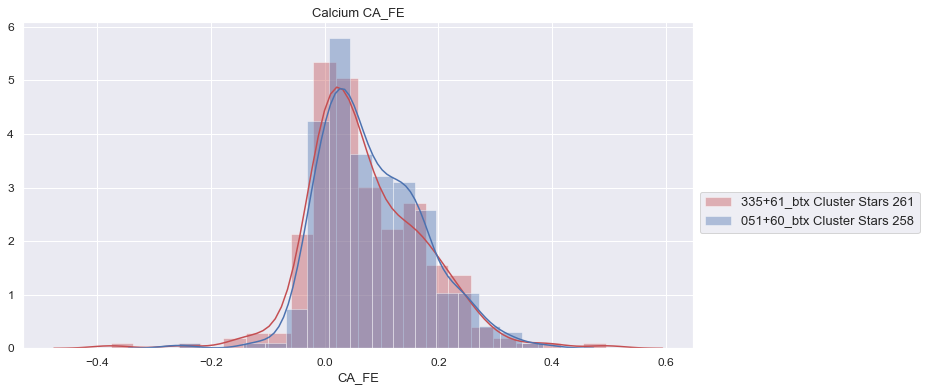

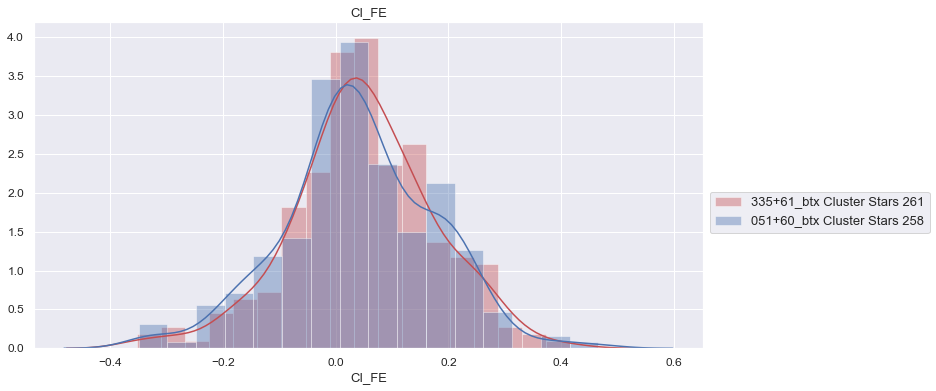

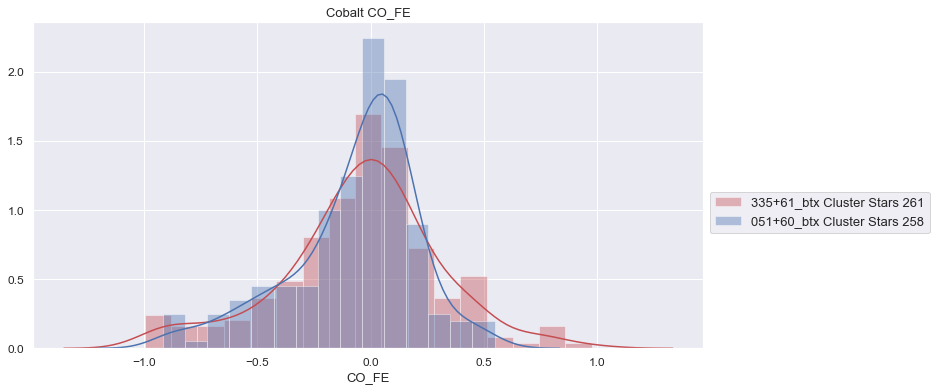

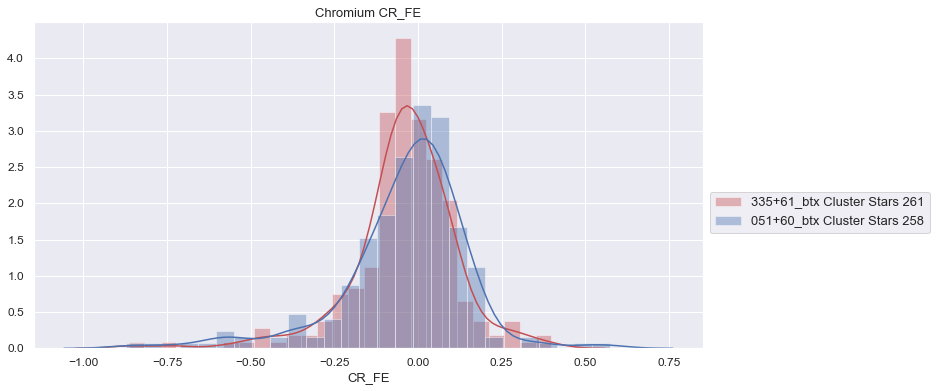

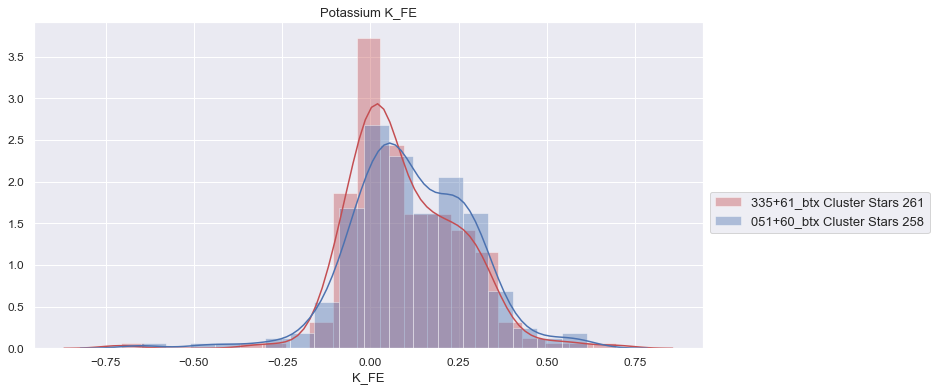

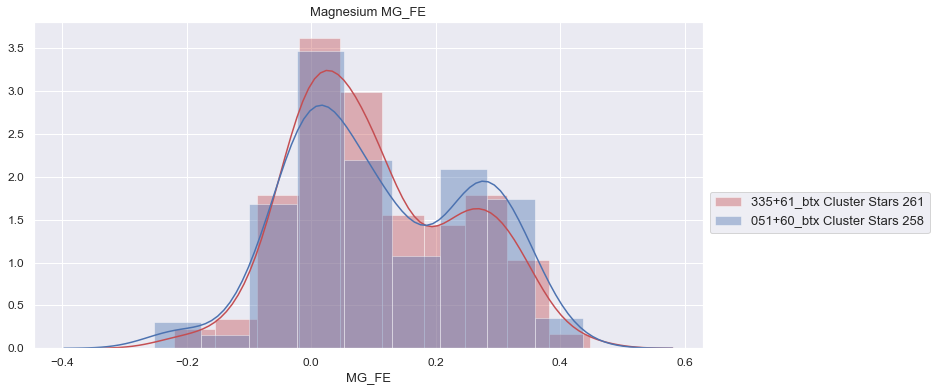

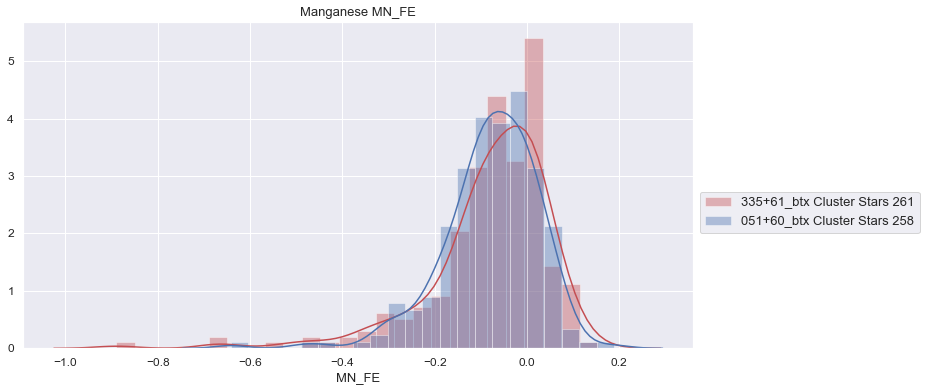

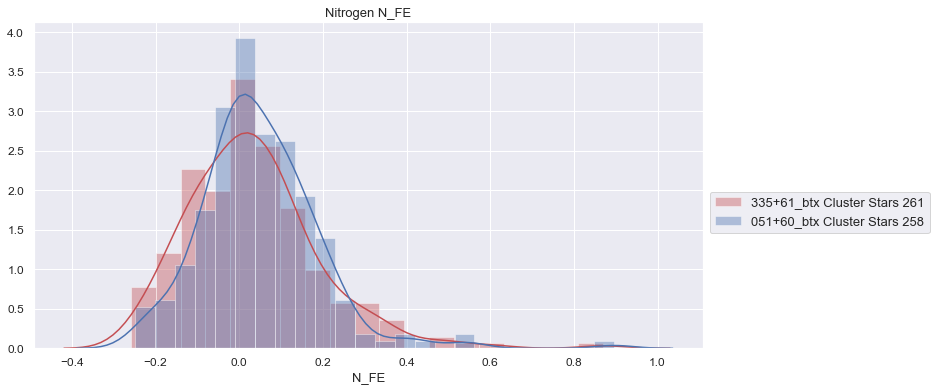

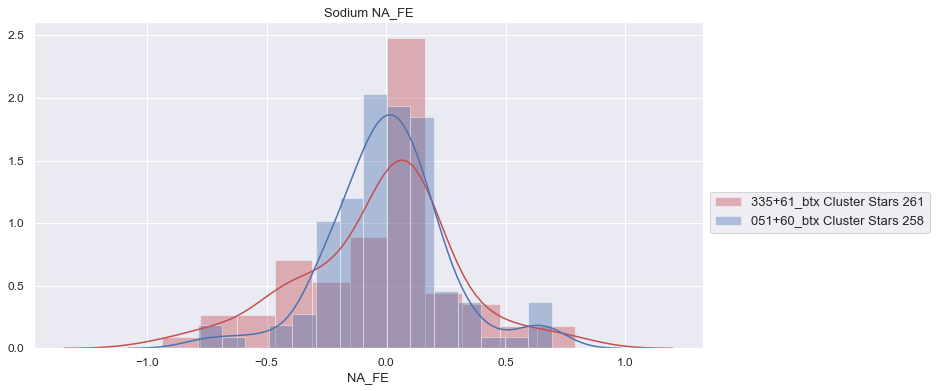

Plot 080


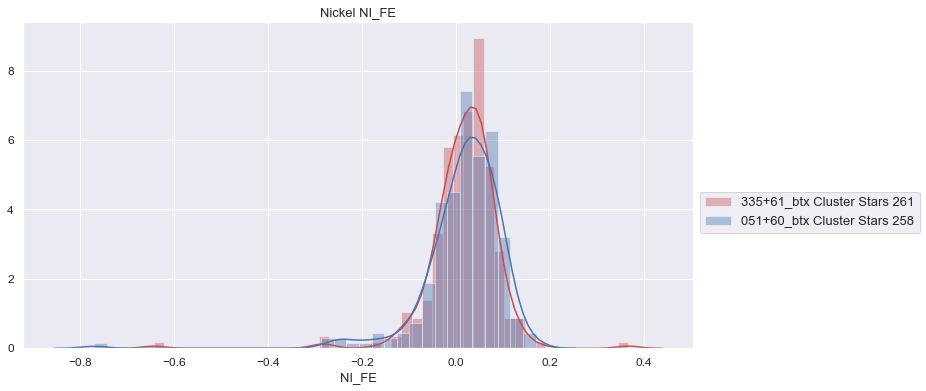

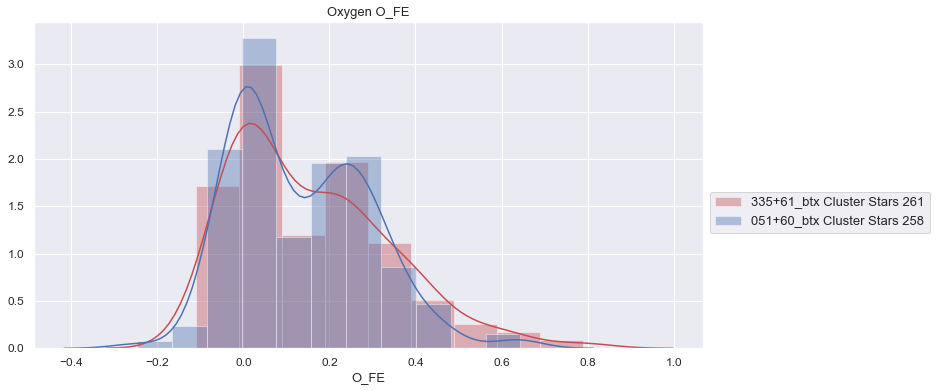

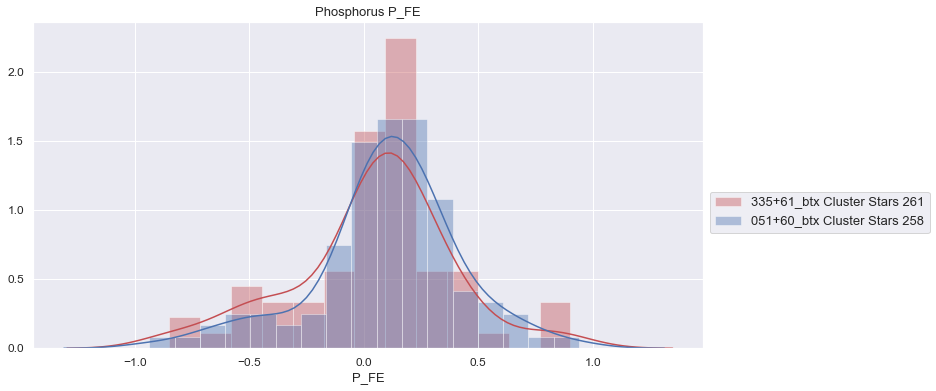

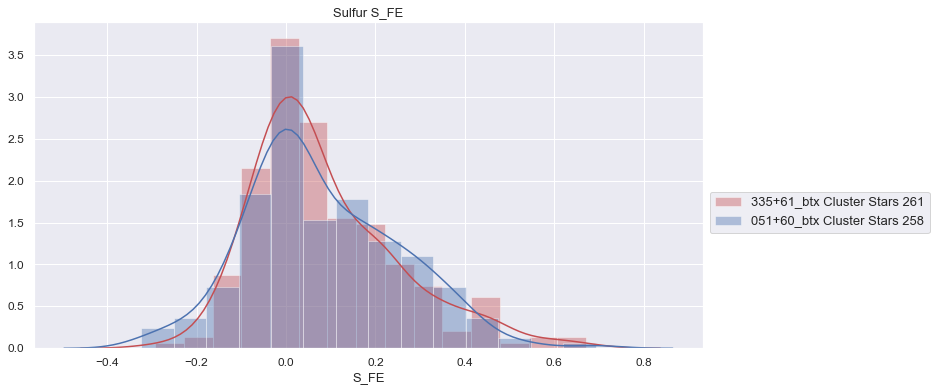

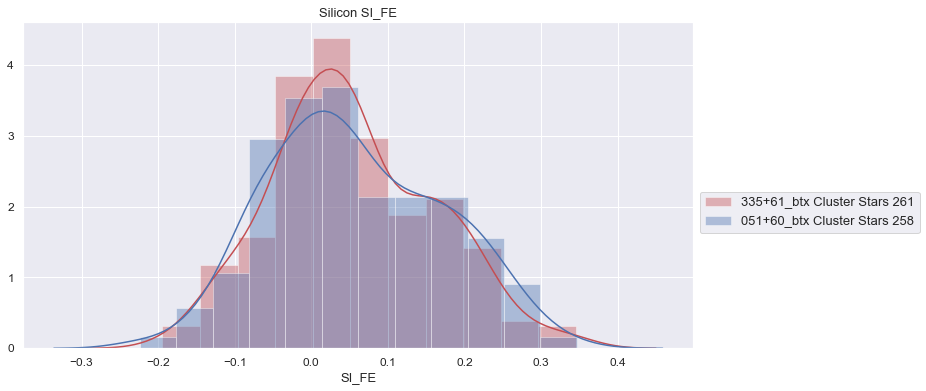

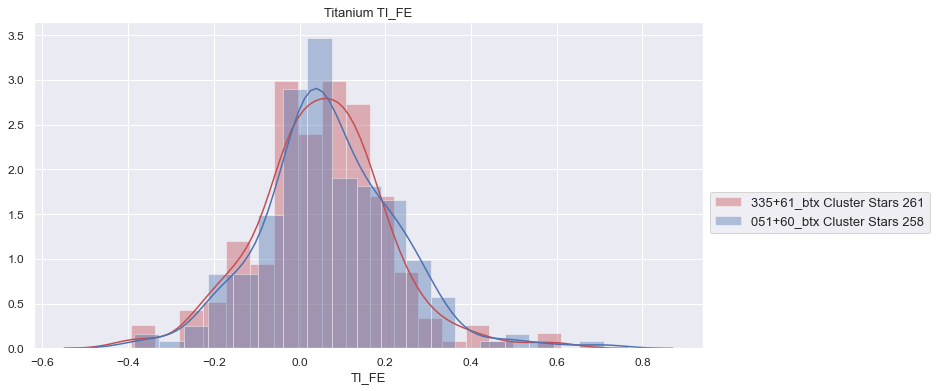

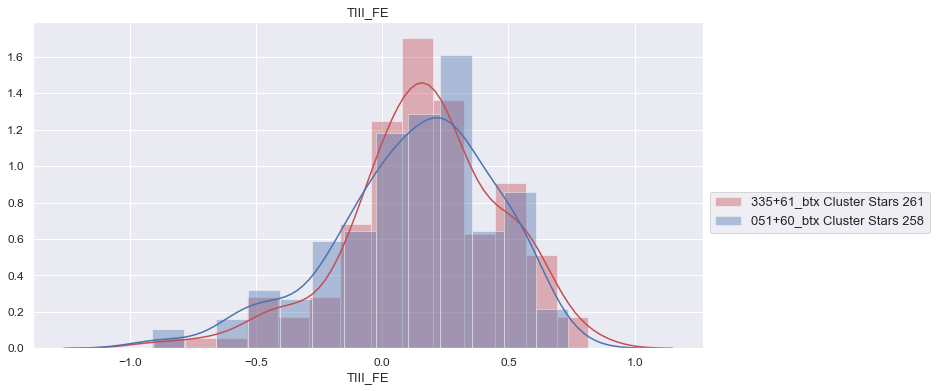

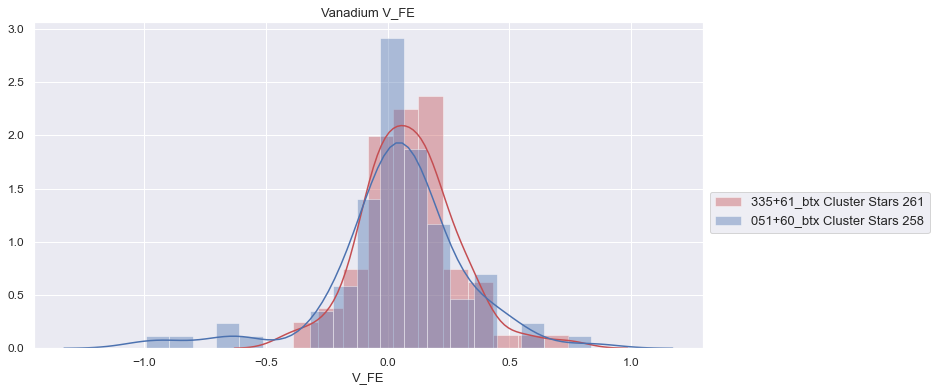

In [51]:
print("\nStep 3: Calling ap.apogee_fields")

#S1 = s1[idx_GKg_a]
#S2 = s2[idx2_GKg_a]

S1 = s1
S2 = s2

ap.apogee_fields(S1, st1 + " Cluster", S2, st2 + " Cluster", df_Apogee)


In [52]:
d1 = df_Apogee[df_Apogee.FIELD.isin([st1])]
d2 = df_Apogee[df_Apogee.FIELD.isin([st2])]

Plot 101


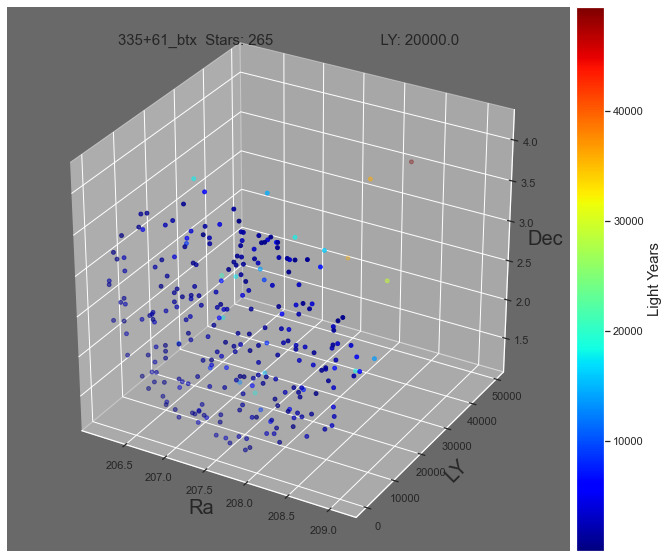

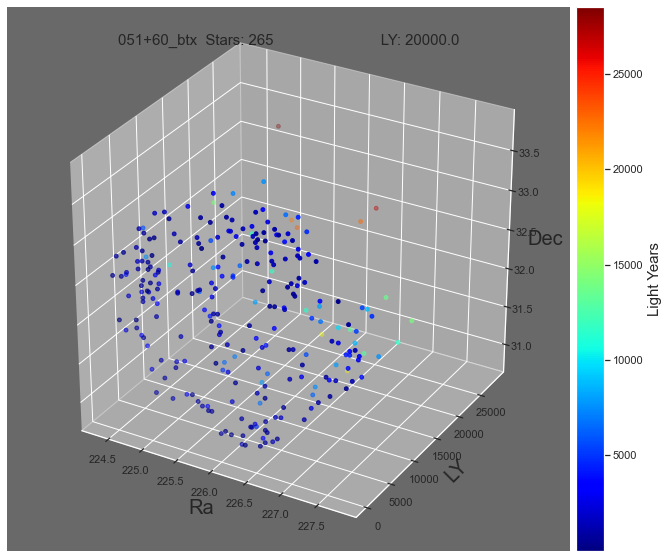

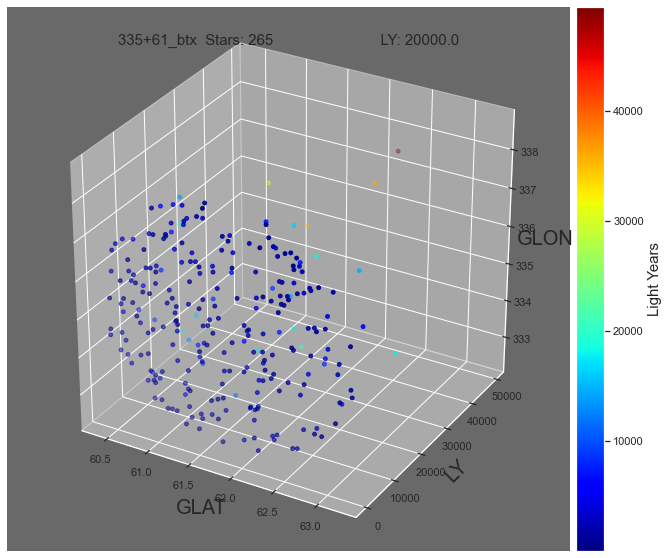

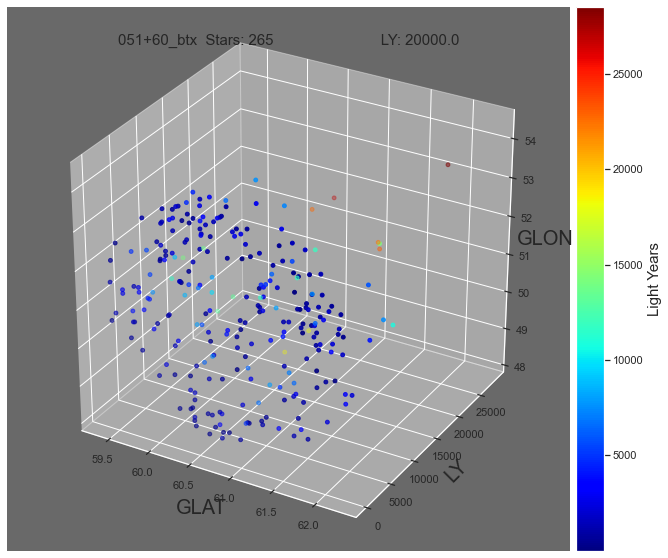

Plot 102


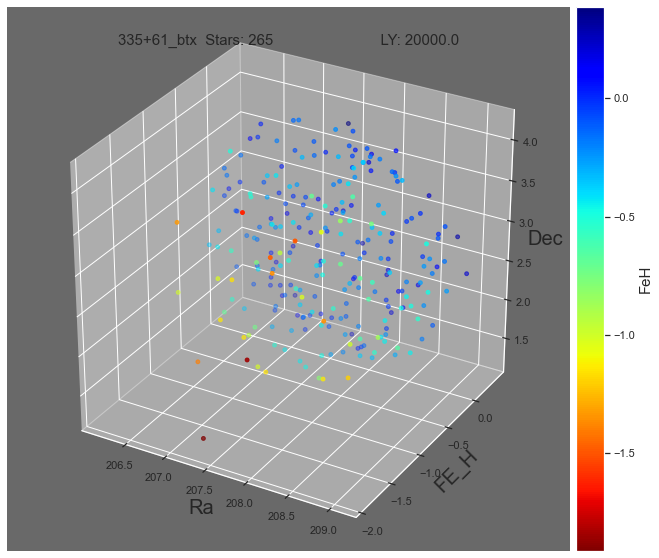

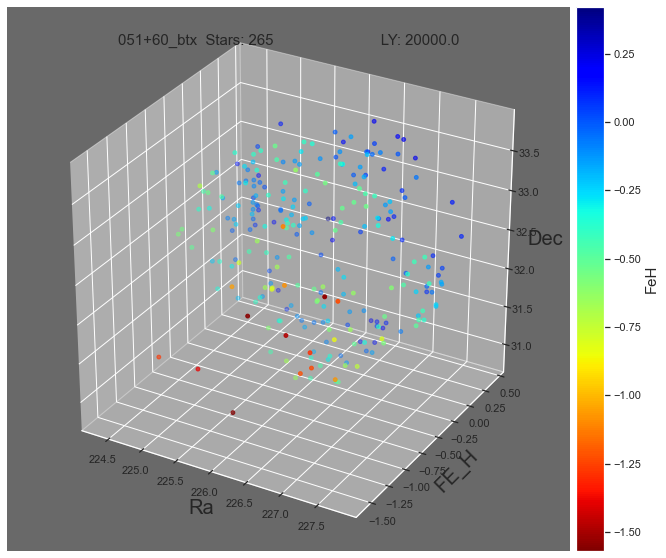

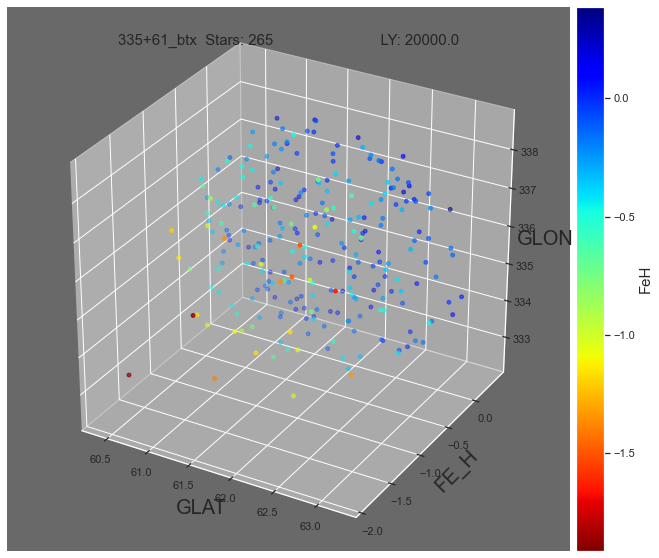

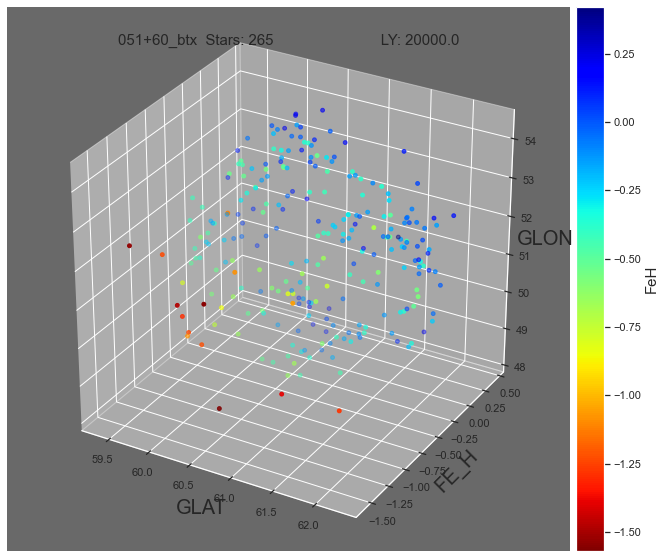

Plot 104


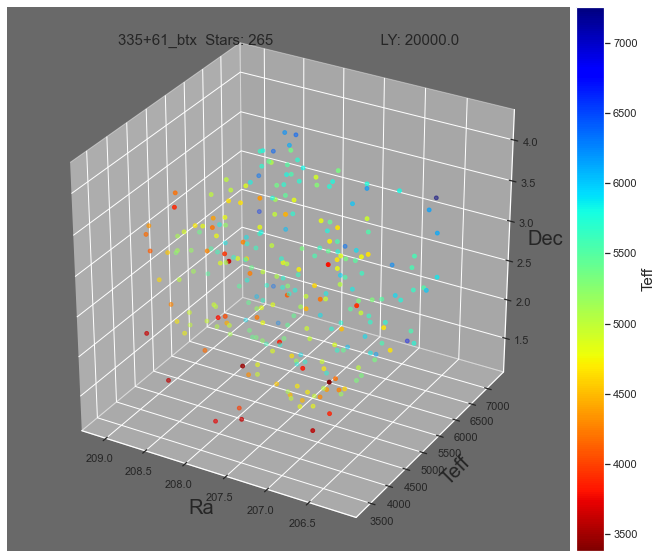

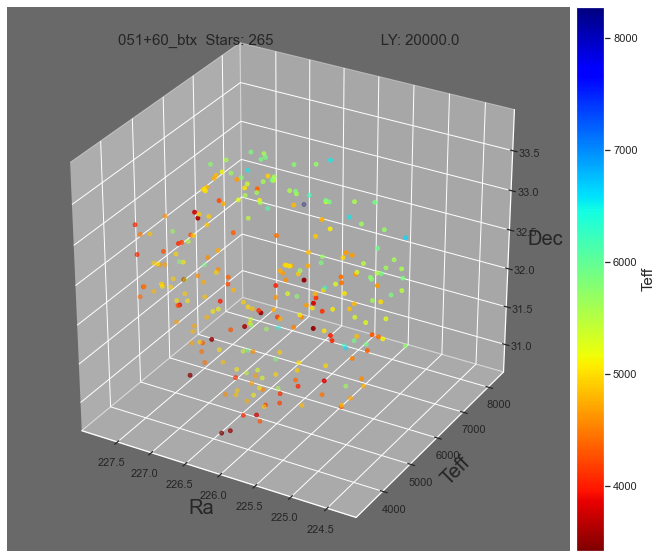

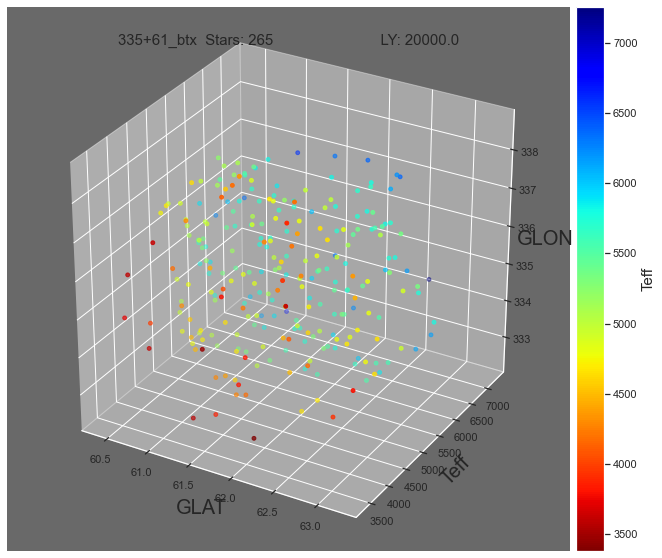

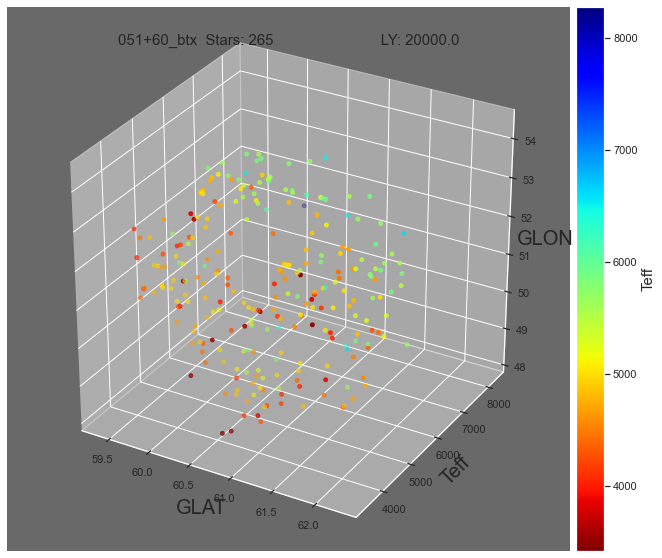

Plot 106


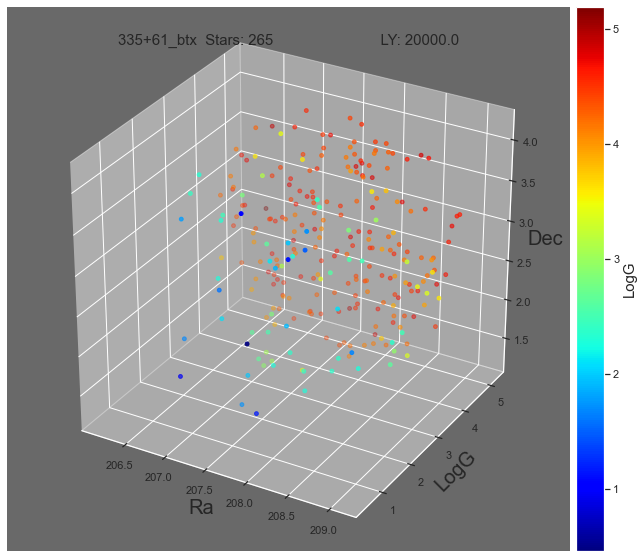

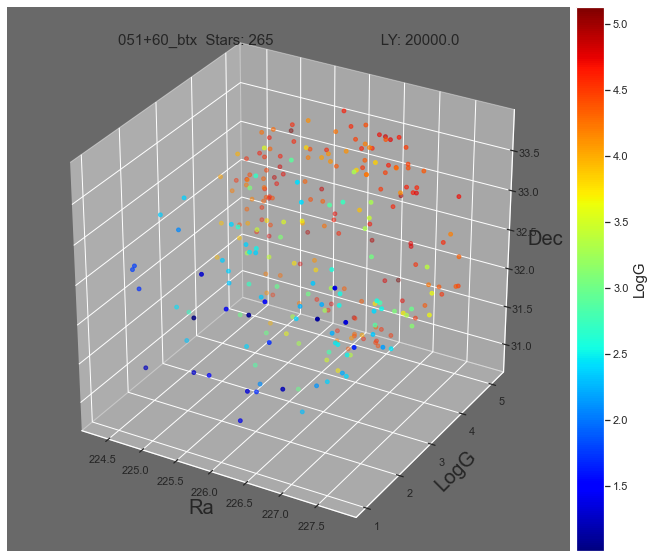

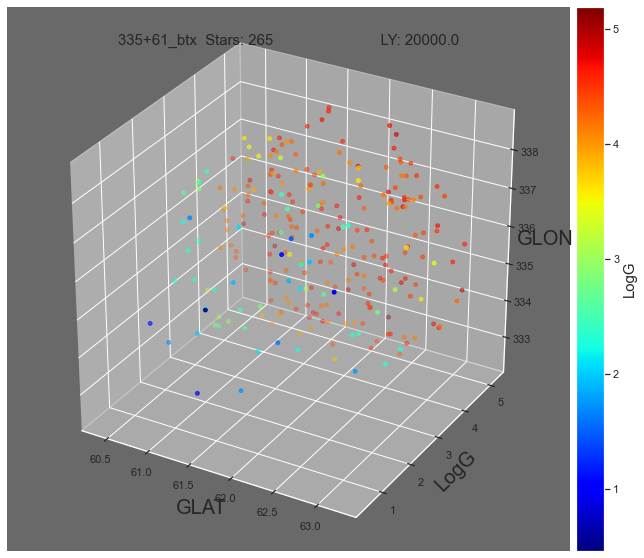

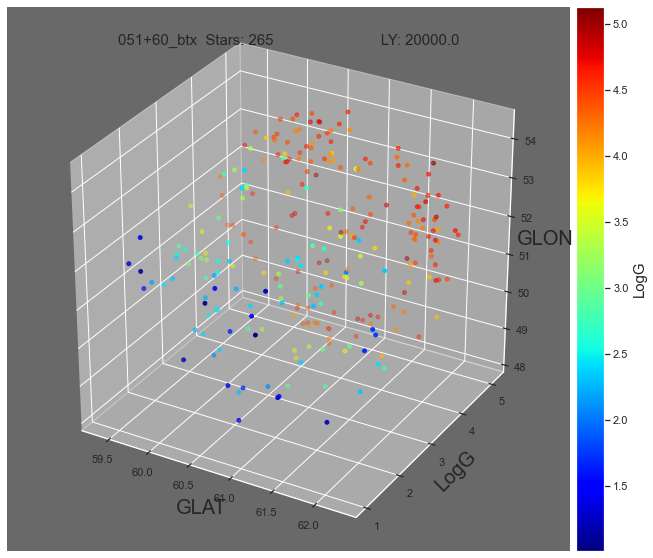

Plot 108


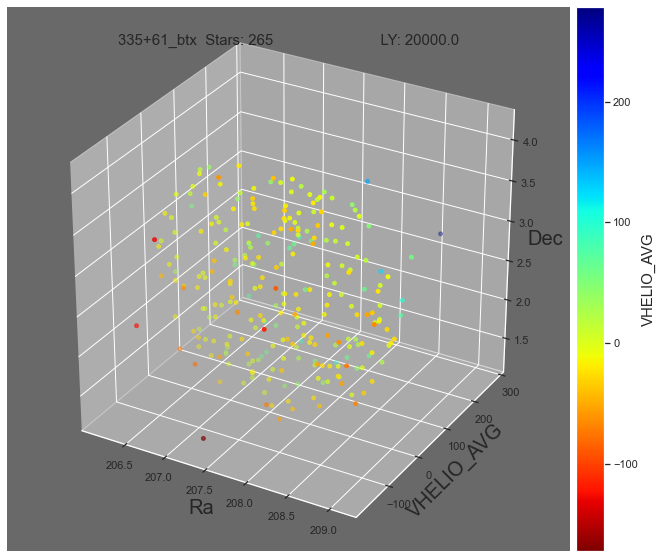

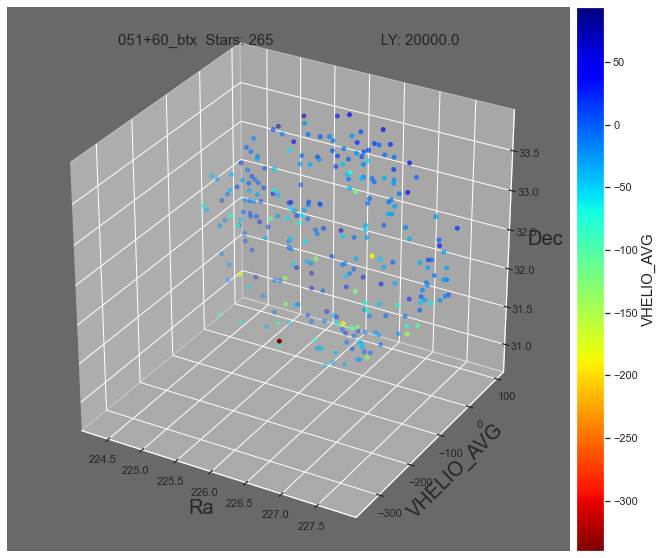

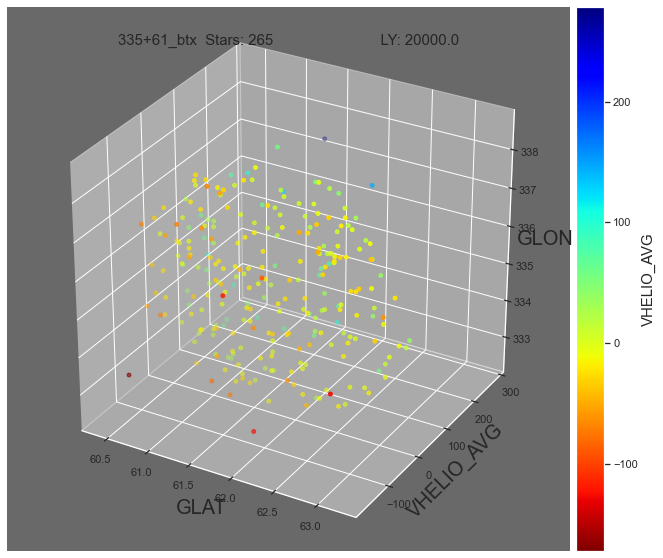

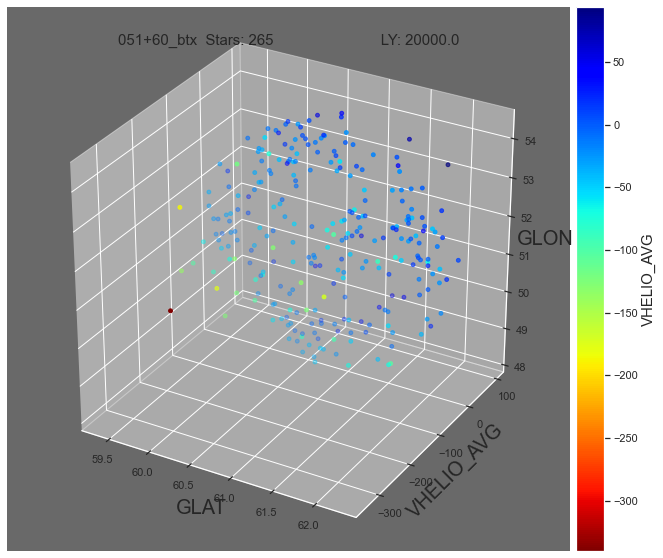

Plot 110


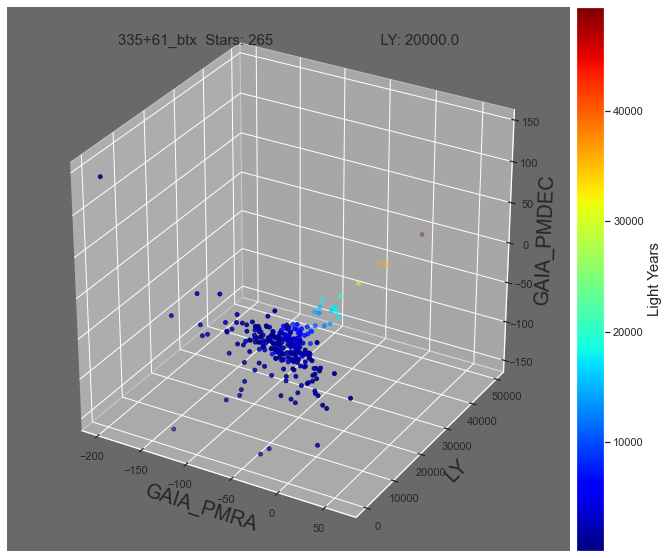

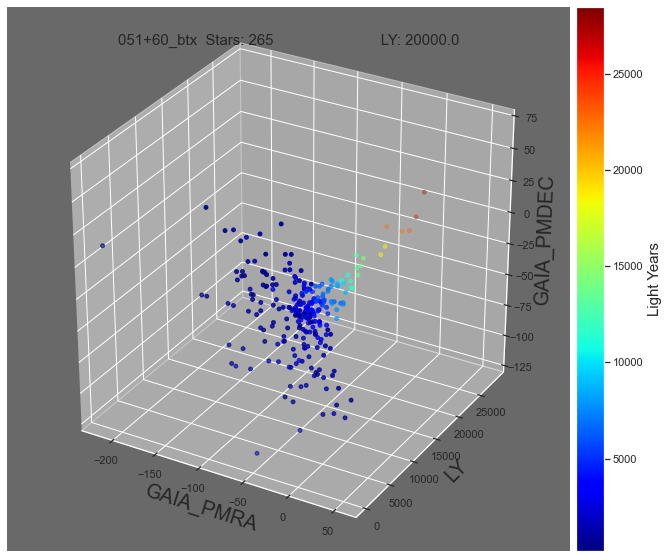

Plot 112


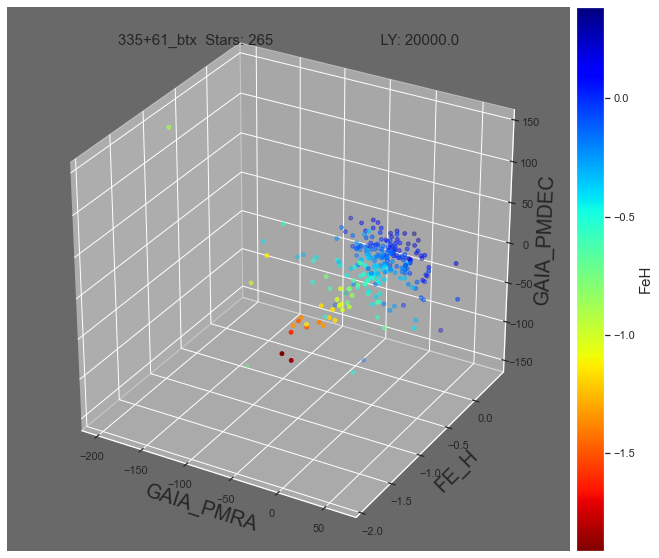

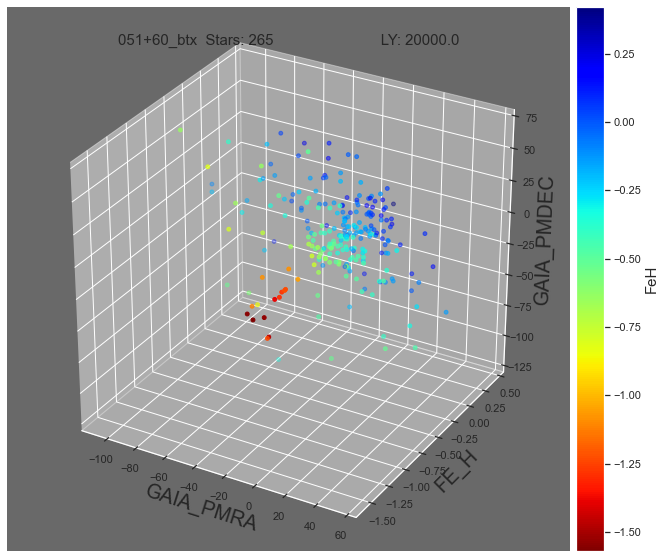

In [53]:
print("Plot 101")
plotSlice3DParmDensityLY(d1, st1,  "LightYears", "LY", "jet", 50000)
plotSlice3DParmDensityLY(d2, st2,  "LightYears", "LY", "jet", 50000)
plotSlice3DParmDensityLYG(d1, st1,  "LightYears", "LY", "jet", 50000)
plotSlice3DParmDensityLYG(d2, st2,  "LightYears", "LY", "jet", 50000)

print("Plot 102")
plotSlice3DParmDensityFEH(d1, st1,  "FE_H", "FE_H", "jet_r", 1)
plotSlice3DParmDensityFEH(d2, st2,  "FE_H", "FE_H", "jet_r", 1)
plotSlice3DParmDensityFEHG(d1, st1,  "FE_H", "FE_H", "jet_r", 1)
plotSlice3DParmDensityFEHG(d2, st2,  "FE_H", "FE_H", "jet_r", 1)

print("Plot 104")
plotSlice3DParmDensityTEFF(d1, st1,  "TEFF", "Teff", "jet_r", 1)
plotSlice3DParmDensityTEFF(d2, st2,  "TEFF", "Teff", "jet_r", 1)
plotSlice3DParmDensityTEFFG(d1, st1,  "TEFF", "Teff", "jet_r", 1)
plotSlice3DParmDensityTEFFG(d2, st2,  "TEFF", "Teff", "jet_r", 1)

print("Plot 106")
plotSlice3DParmDensityLOGG(d1, st1,  "LOGG", "LogG", "jet", 1)
plotSlice3DParmDensityLOGG(d2, st2,  "LOGG", "LogG", "jet", 1)
plotSlice3DParmDensityLOGGG(d1, st1,  "LOGG", "LogG", "jet", 1)
plotSlice3DParmDensityLOGGG(d2, st2,  "LOGG", "LogG", "jet", 1)

print("Plot 108")
plotSlice3DParmDensityVHELIO(d1, st1,  "VHELIO_AVG", "VHELIO_AVG", "jet_r", 1)
plotSlice3DParmDensityVHELIO(d2, st2,  "VHELIO_AVG", "VHELIO_AVG", "jet_r", 1)
plotSlice3DParmDensityVHELIOG(d1, st1,  "VHELIO_AVG", "VHELIO_AVG", "jet_r", 1)
plotSlice3DParmDensityVHELIOG(d2, st2,  "VHELIO_AVG", "VHELIO_AVG", "jet_r", 1)

print("Plot 110")
plotSlice3DParmDensityLYPM(d1, st1,  "LightYears", "LY", "jet", 50000)
plotSlice3DParmDensityLYPM(d2, st2,  "LightYears", "LY", "jet", 50000)

print("Plot 112")
plotSlice3DParmDensityFEHPM(d1, st1,  "FE_H", "FE_H", "jet_r", 1)
plotSlice3DParmDensityFEHPM(d2, st2,  "FE_H", "FE_H", "jet_r", 1)


Plot 114


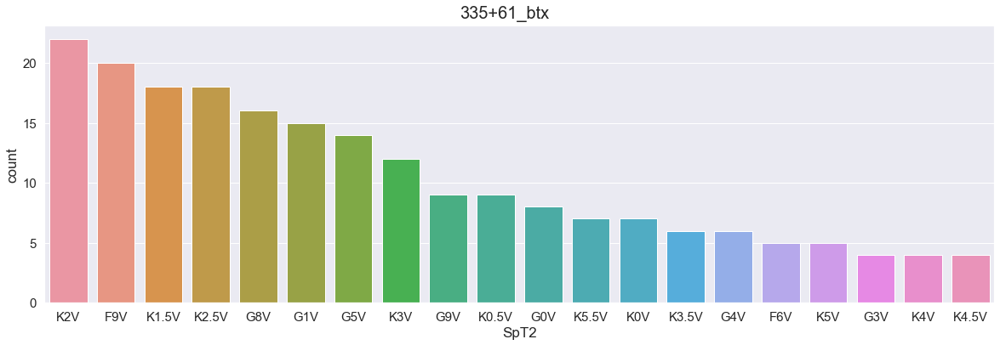

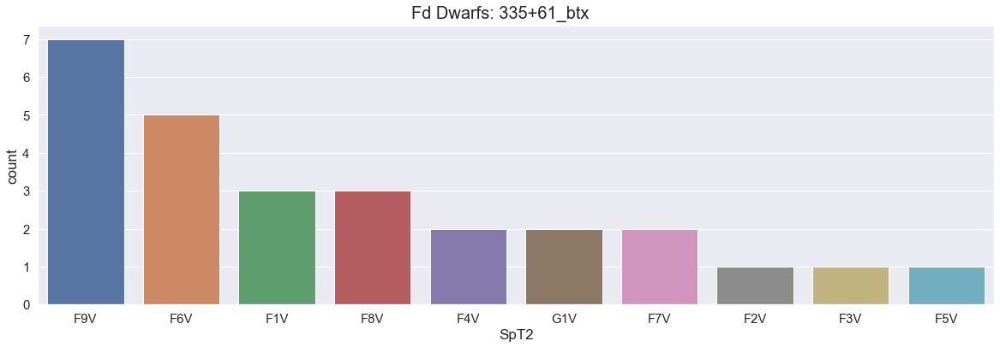

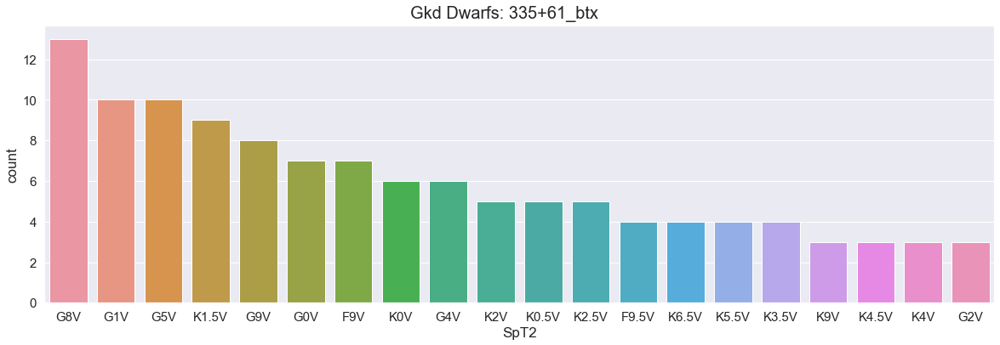

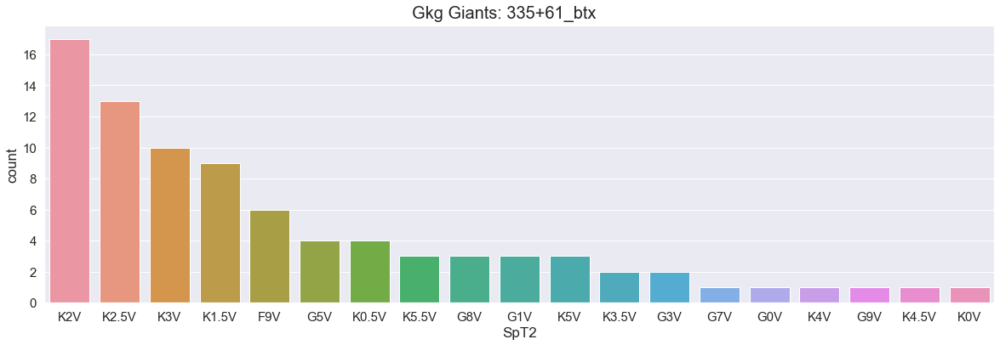

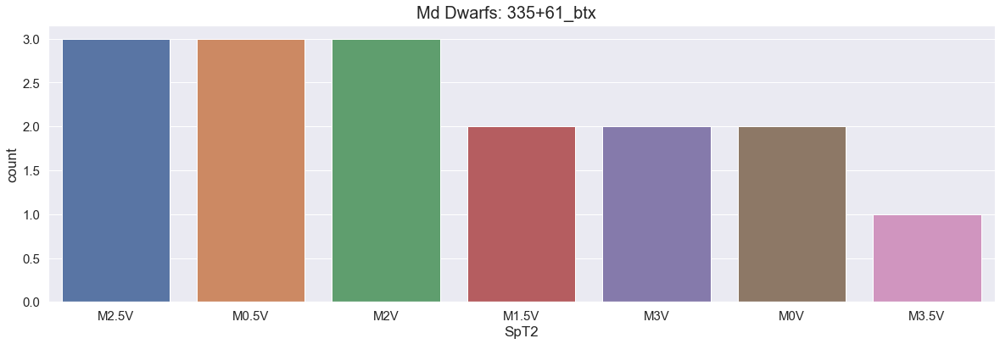

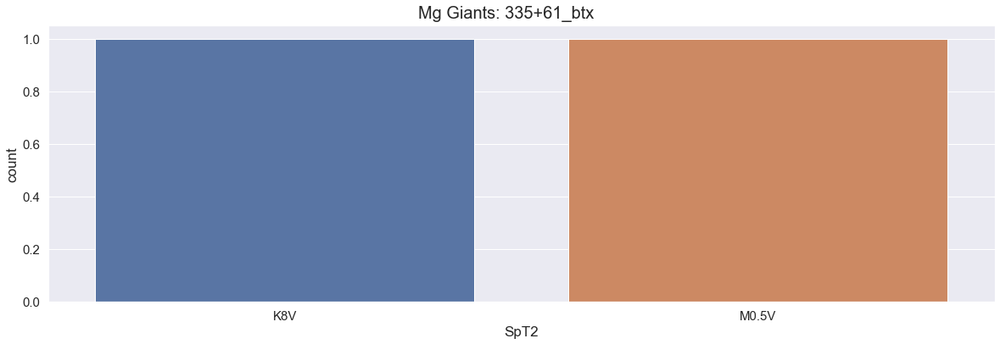

Plot 115


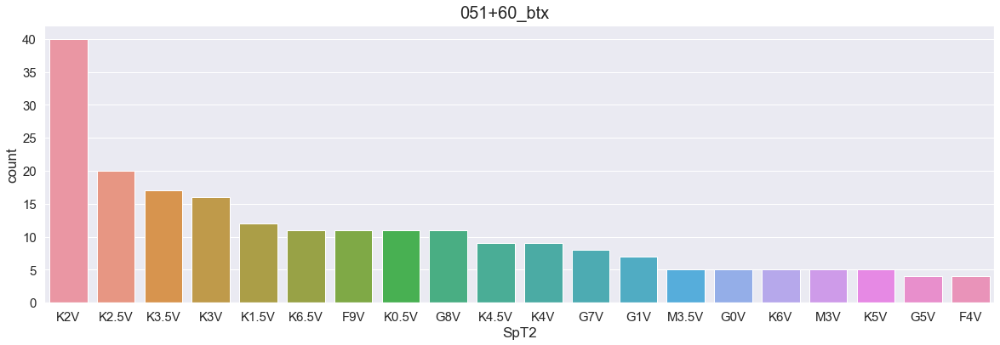

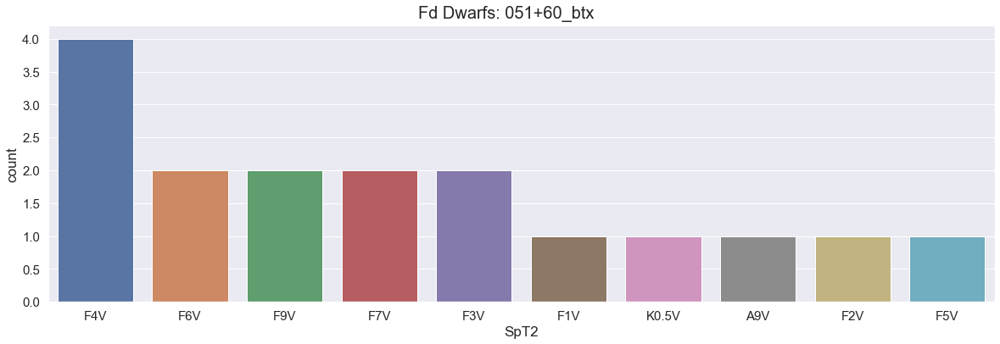

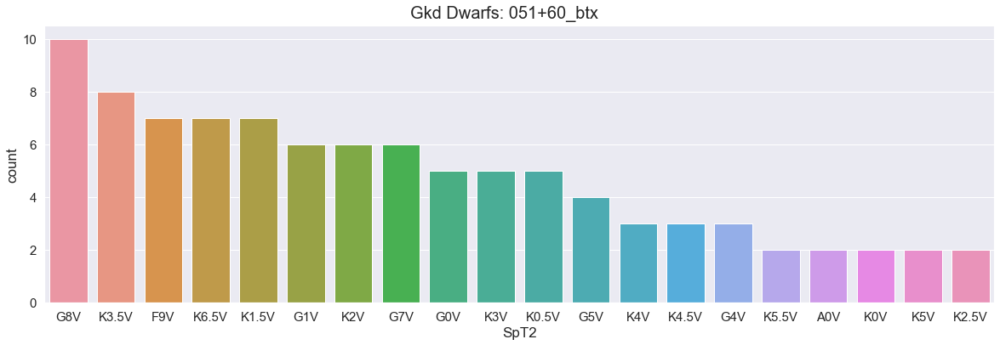

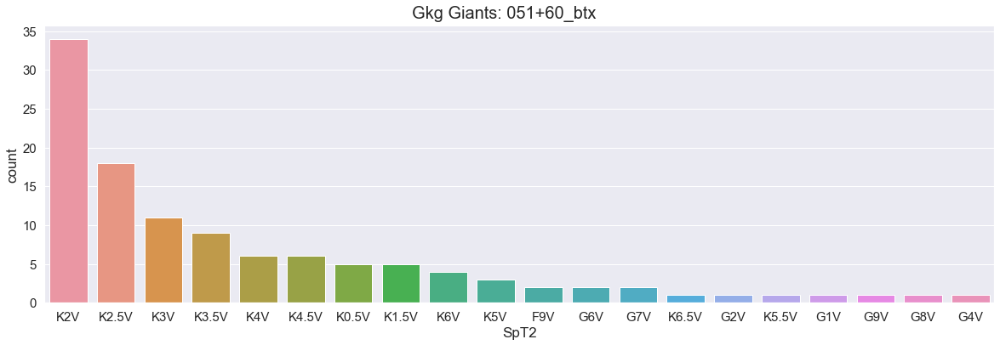

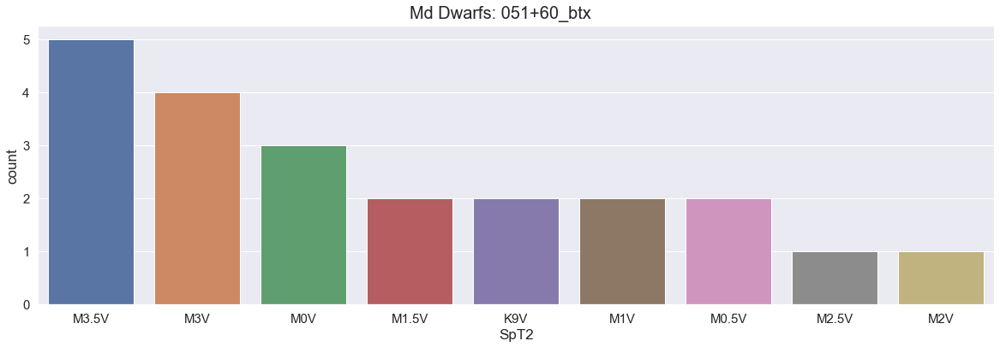

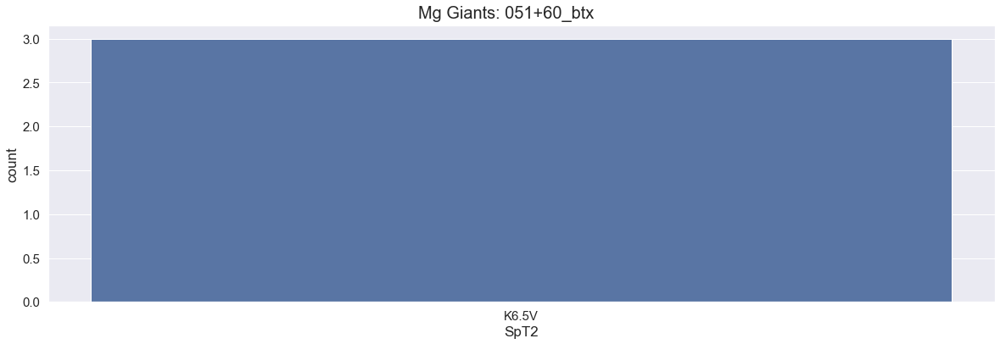

In [54]:
print("Plot 114")

import seaborn as sns

sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d1 = df_Apogee[df_Apogee.FIELD.isin([st1])]

dlist = d1.SpT2
plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, st1, fontsize=20, ha='center')
ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()


df_Fd = d1[d1.ASPCAP_CLASS.isin(['Fd_a', 'Fd_b', 'Fd_c', 'Fd_d'])]

if df_Fd.shape[0] > 1:
    dlist = df_Fd.SpT2
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Fd Dwarfs: ' + str(st1), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st1) + " Skipping df_fd = 0")

df_GKd = d1[d1.ASPCAP_CLASS.isin(['GKd_a', 'GKd_b', 'GKd_c', 'GKd_d'])]

if df_GKd.shape[0] > 1:
    dlist = df_GKd.SpT2
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Gkd Dwarfs: ' + str(st1), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st1) + " Skipping df_GKd = 0")

df_GKg = d1[d1.ASPCAP_CLASS.isin(['GKg_a', 'GKg_b', 'GKg_c', 'GKg_d'])]

if df_GKg.shape[0] > 1:
    dlist = df_GKg.SpT2
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Gkg Giants: ' + str(st1), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st1) + " Skipping df_GKg = 0")

df_Md = d1[d1.ASPCAP_CLASS.isin(['Md_a', 'Md_b', 'Md_c', 'Md_d'])]

if df_Md.shape[0] > 1:
    dlist = df_Md.SpT2
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Md Dwarfs: ' + str(st1), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st1) + " Skipping df_Md = 0")

df_Mg = d1[d1.ASPCAP_CLASS.isin(['Mg_a', 'Mg_b', 'Mg_c', 'Mg_d'])]

if df_Mg.shape[0] > 1:
    dlist = df_Mg.SpT2
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Mg Giants: ' + str(st1), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st1) + " Skipping df_Mg = 0")
################################################################################
print("Plot 115")

sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d2 = df_Apogee[df_Apogee.FIELD.isin([st2])]

dlist = d2.SpT2

plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, st2, fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()


df_Fd = d2[d2.ASPCAP_CLASS.isin(['Fd_a', 'Fd_b', 'Fd_c', 'Fd_d'])]

if df_Fd.shape[0] > 1:
    dlist = df_Fd.SpT2
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Fd Dwarfs: ' + str(st2), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st2) + " Skipping df_Fd = 0")

df_GKd = d2[d2.ASPCAP_CLASS.isin(['GKd_a', 'GKd_b', 'GKd_c', 'GKd_d'])]

if df_GKd.shape[0] > 1:
    dlist = df_GKd.SpT2
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Gkd Dwarfs: ' + str(st2), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st2) + " Skipping df_GKd = 0")

df_GKg = d2[d2.ASPCAP_CLASS.isin(['GKg_a', 'GKg_b', 'GKg_c', 'GKg_d'])]

if df_GKg.shape[0] > 1:
    dlist = df_GKg.SpT2
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Gkg Giants: ' + str(st2), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st2) + " Skipping df_GKg = 0")

df_Md = d2[d2.ASPCAP_CLASS.isin(['Md_a', 'Md_b', 'Md_c', 'Md_d'])]

if df_Md.shape[0] > 1:
    dlist = df_Md.SpT2
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Md Dwarfs: ' + str(st2), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st2) + " Skipping df_Md = 0")

df_Mg = d2[d2.ASPCAP_CLASS.isin(['Mg_a', 'Mg_b', 'Mg_c', 'Mg_d'])]

if df_Mg.shape[0] > 1:
    dlist = df_Mg.SpT2
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Mg Giants: ' + str(st2), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st2) + " Skipping df_Mg = 0")

Plot 116


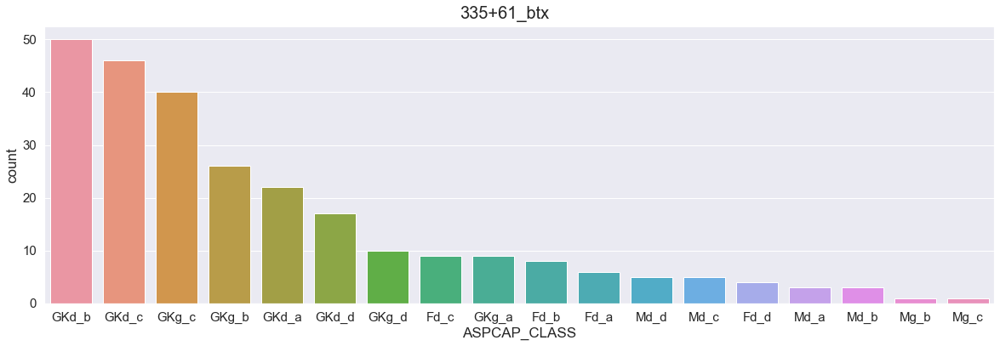

Plot 117


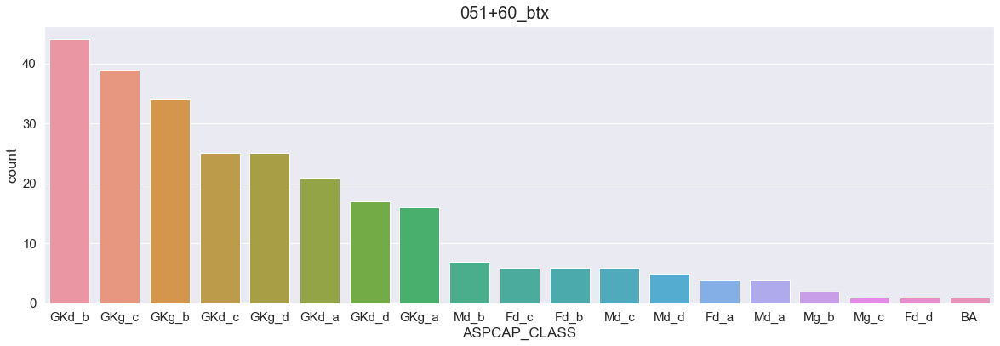

In [55]:
print("Plot 116")

sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d11 = df_Apogee[df_Apogee.FIELD.isin([st1])]


dlist = d11.ASPCAP_CLASS

plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, st1, fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()

################################################################################
print("Plot 117")

sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d22 = df_Apogee[df_Apogee.FIELD.isin([st2])]

dlist = d22.ASPCAP_CLASS

plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, st2, fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()


################################################################################




Plot 118


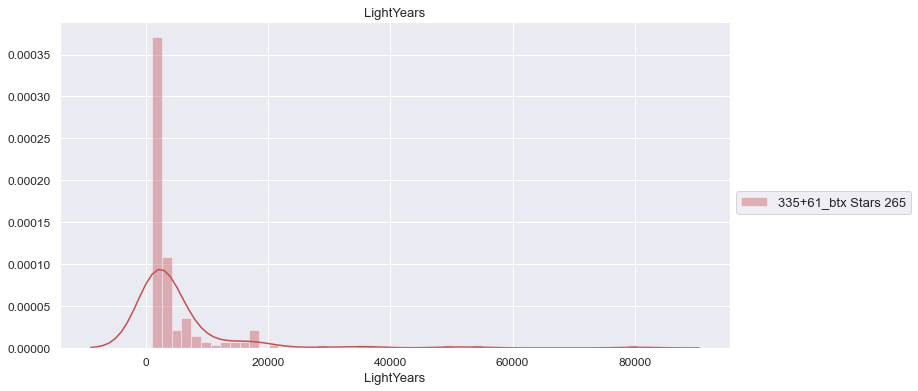

Plot 119


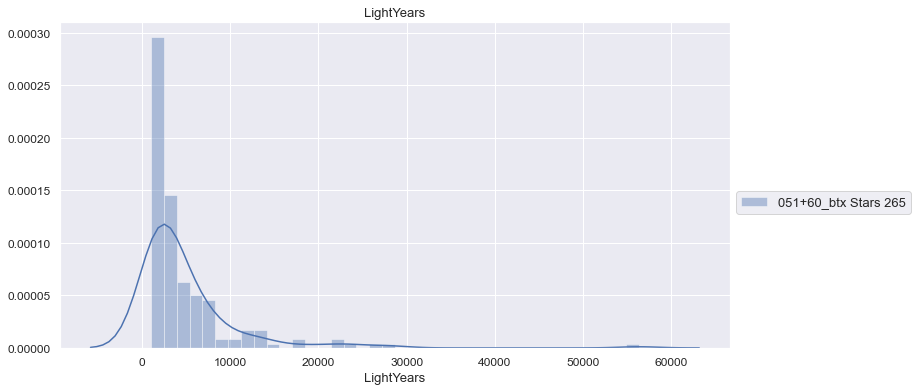

Plot 120


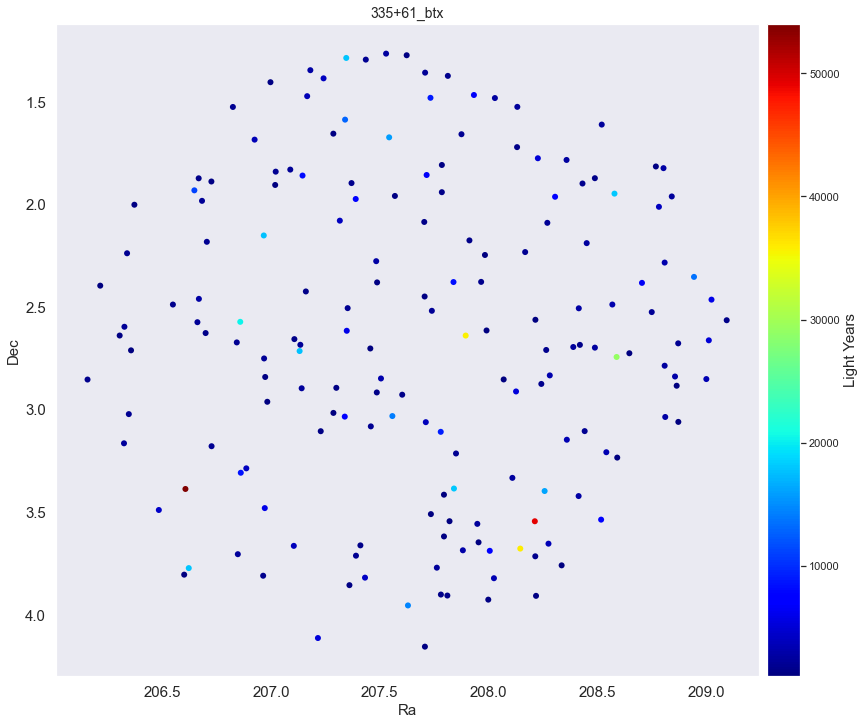

Plot 121


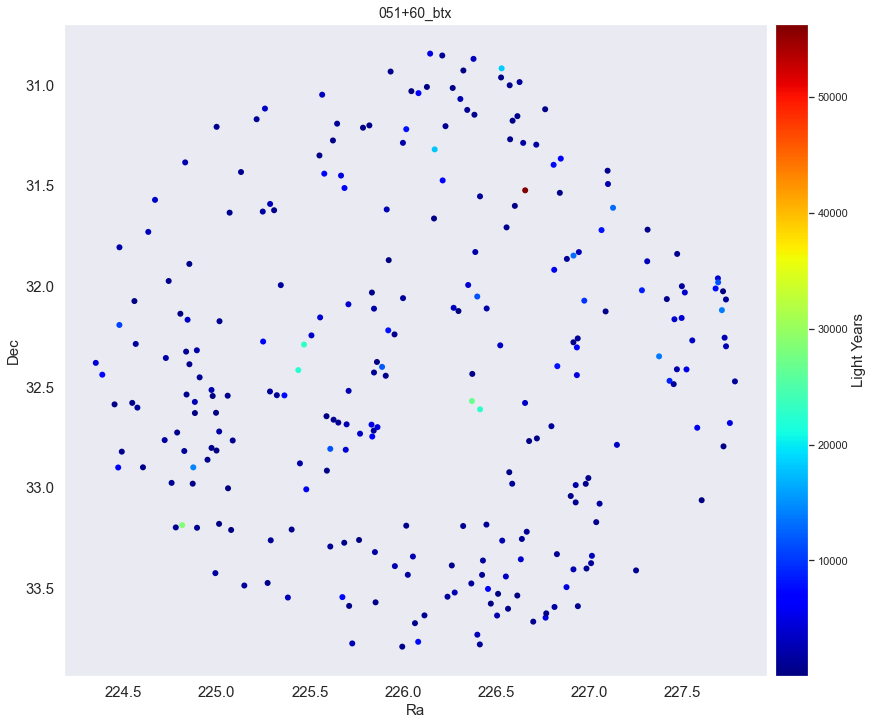

Plot 120B


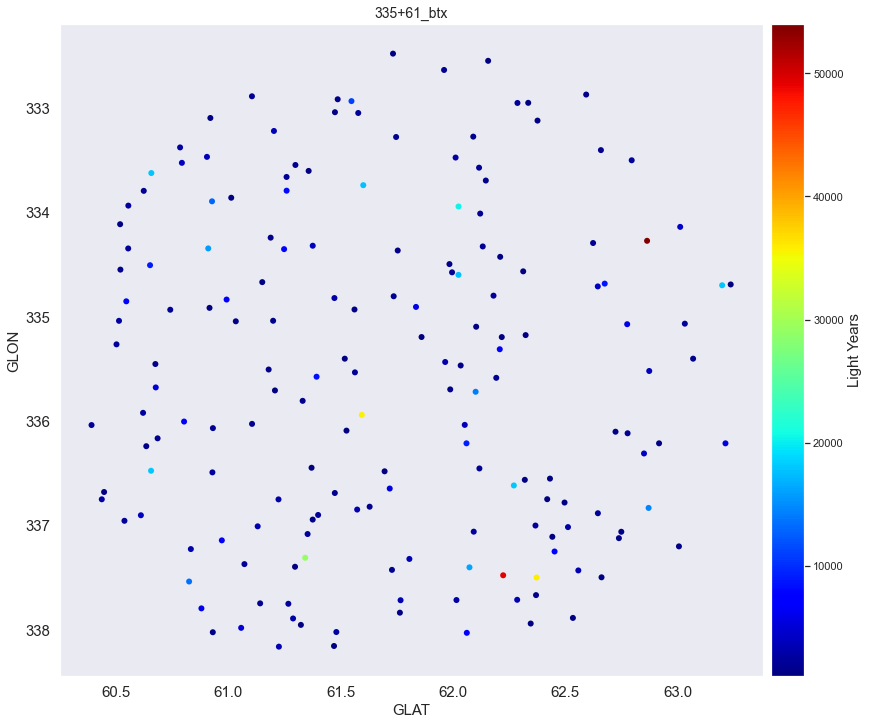

Plot 121B


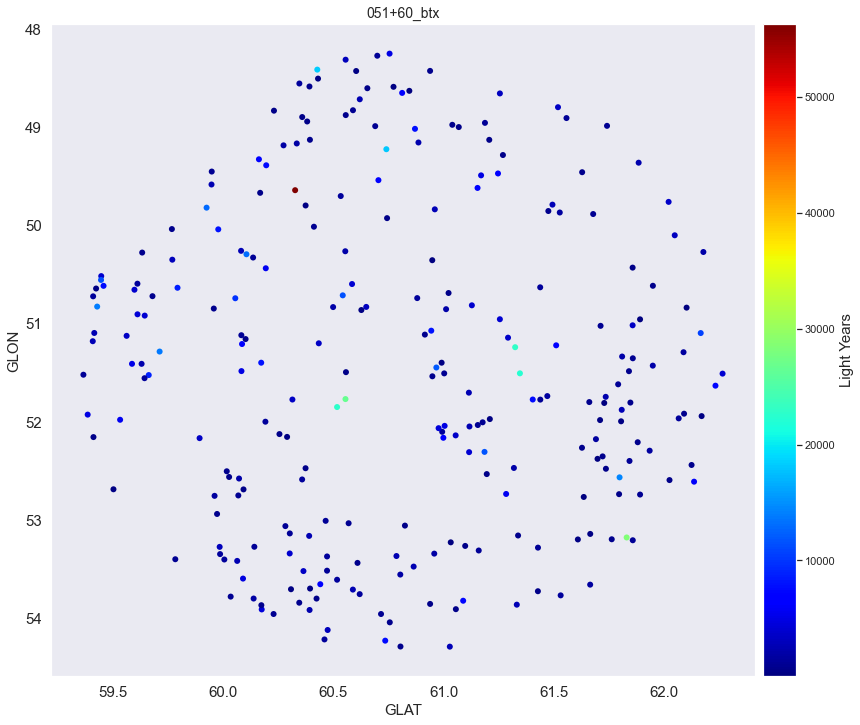

Plot 122


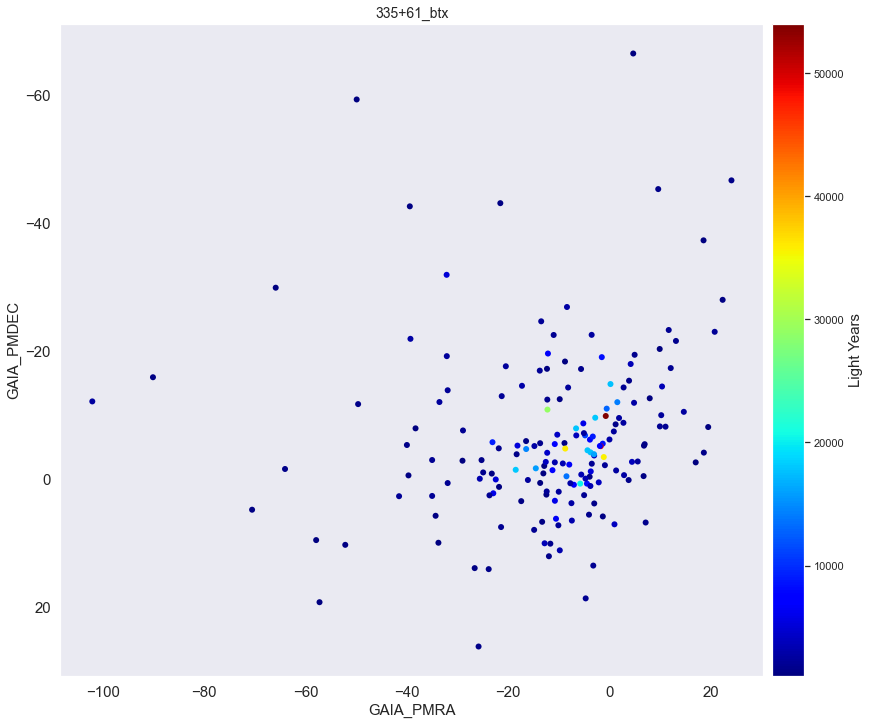

Plot 123


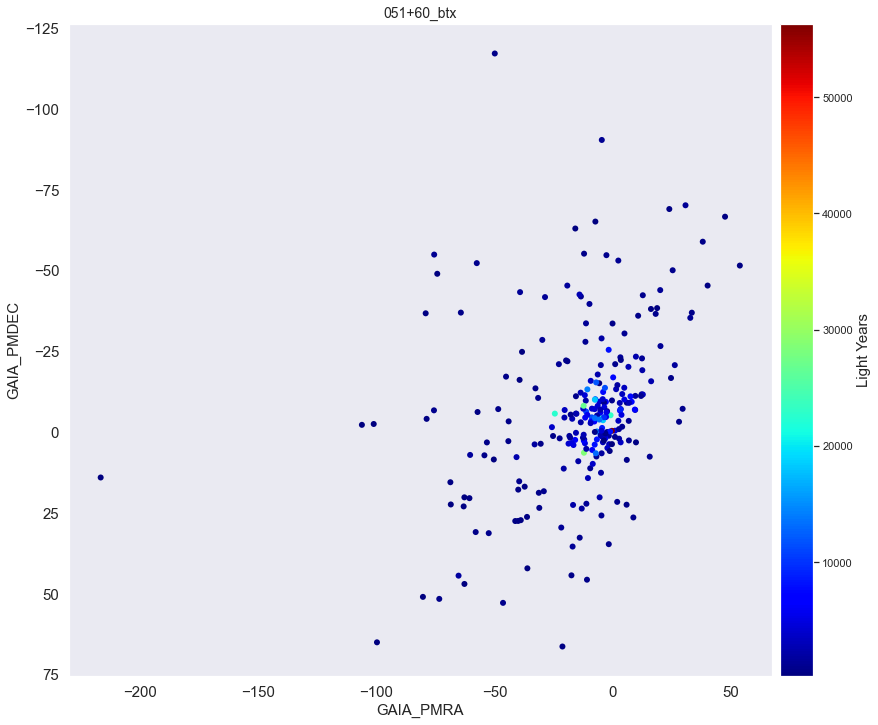

In [56]:
print("Plot 118")

d1 = df_Apogee[df_Apogee.FIELD.isin([st1])]
dlist0 = round(d1.LightYears, 0)
x1 = dlist0[dlist0 > -9999]

d2 = df_Apogee[df_Apogee.FIELD.isin([st2])]
dlist0 = round(d2.LightYears, 0)
x2 = dlist0[dlist0 > -9999]

#x1 = dlist1['LightYears']
#x2 = dlist2['LightYears']

rLow = 1000
rHi  = 100000
# GAIA_PARALLAX


plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(x1[(x1 >= rLow) & (x1 <= rHi)], color='r', hist=True,  
                label=st1.strip() + " Stars " + str(x1.shape[0]))
plt.xlabel('LightYears', fontsize=13)
plt.title("LightYears", fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()


################################################################################
print("Plot 119")

plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(x2[(x2 >= rLow) & (x2 <= rHi)], color='b', hist=True, 
                label=st2.strip() + " Stars " + str(x2.shape[0]))
plt.xlabel('LightYears', fontsize=13)
plt.title("LightYears", fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()



################################################################################
print("Plot 120")

d1 = df_Apogee[df_Apogee.FIELD.isin([st1])]
d2 = df_Apogee[df_Apogee.FIELD.isin([st2])]

    
x0 = d1[(d1['LightYears'].astype(float) > 1000)]
x1 = x0[(x0['LightYears'].astype(float) < 80000)]

x0 = d2[(d2['LightYears'].astype(float) > 1000)]
x2 = d2[(d2['LightYears'].astype(float) < 80000)]

fig = plt.figure(figsize=(15, 12))

plt.subplot(111)
image = plt.scatter(x1['RA'], x1['DEC'], label=st1, marker='o', linewidth=0,
            c=x1.LightYears,edgecolor='k',cmap="jet")
ax = plt.gca()
plt.gca().invert_yaxis()
plt.xlabel('Ra', fontsize=15)
plt.ylabel('Dec', fontsize=15)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title(str(st1), fontsize=14)
bar = fig.colorbar(image,orientation="vertical",pad=0.01)
bar.set_label('Light Years',size=15)
plt.show()


################################################################################

print("Plot 121")

fig = plt.figure(figsize=(15, 12))

plt.subplot(111)
image = plt.scatter(x2['RA'], x2['DEC'], label=st2, marker='o', linewidth=0,
            c=x2.LightYears,edgecolor='k',cmap="jet")
ax = plt.gca()
plt.gca().invert_yaxis()
plt.xlabel('Ra', fontsize=15)
plt.ylabel('Dec', fontsize=15)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title(str(st2), fontsize=14)
bar = fig.colorbar(image,orientation="vertical",pad=0.01)
bar.set_label('Light Years',size=15)
plt.show()
    

################################################################################
print("Plot 120B")

d1 = df_Apogee[df_Apogee.FIELD.isin([st1])]
d2 = df_Apogee[df_Apogee.FIELD.isin([st2])]

    
x0 = d1[(d1['LightYears'].astype(float) > 1000)]
x1 = x0[(x0['LightYears'].astype(float) < 80000)]

x0 = d2[(d2['LightYears'].astype(float) > 1000)]
x2 = d2[(d2['LightYears'].astype(float) < 80000)]

fig = plt.figure(figsize=(15, 12))

plt.subplot(111)
image = plt.scatter(x1['GLAT'], x1['GLON'], label=st1, marker='o', linewidth=0,
            c=x1.LightYears,edgecolor='k',cmap="jet")
ax = plt.gca()
plt.gca().invert_yaxis()
plt.xlabel('GLAT', fontsize=15)
plt.ylabel('GLON', fontsize=15)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title(str(st1), fontsize=14)
bar = fig.colorbar(image,orientation="vertical",pad=0.01)
bar.set_label('Light Years',size=15)
plt.show()


################################################################################
print("Plot 121B")

fig = plt.figure(figsize=(15, 12))

plt.subplot(111)
image = plt.scatter(x2['GLAT'], x2['GLON'], label=st2, marker='o', linewidth=0,
            c=x2.LightYears,edgecolor='k',cmap="jet")
ax = plt.gca()
plt.gca().invert_yaxis()
plt.xlabel('GLAT', fontsize=15)
plt.ylabel('GLON', fontsize=15)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title(str(st2), fontsize=14)
bar = fig.colorbar(image,orientation="vertical",pad=0.01)
bar.set_label('Light Years',size=15)
plt.show()
    

################################################################################


print("Plot 122")


x11 = x1[(x1['GAIA_PMRA'].astype(float) > -9999)]

x22 = x2[(x2['GAIA_PMRA'].astype(float) > -9999)]


fig = plt.figure(figsize=(15, 12))

plt.subplot(111)
image = plt.scatter(x11['GAIA_PMRA'], x11['GAIA_PMDEC'], label=st1, marker='o', linewidth=0,
            c=x11.LightYears,edgecolor='k',cmap="jet")
ax = plt.gca()
plt.gca().invert_yaxis()
plt.xlabel('GAIA_PMRA', fontsize=15)
plt.ylabel('GAIA_PMDEC', fontsize=15)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title(str(st1), fontsize=14)
bar = fig.colorbar(image,orientation="vertical",pad=0.01)
bar.set_label('Light Years',size=15)
plt.show()


################################################################################
print("Plot 123")


fig = plt.figure(figsize=(15, 12))

plt.subplot(111)
image = plt.scatter(x22['GAIA_PMRA'], x22['GAIA_PMDEC'], label=st2, marker='o', linewidth=0,
            c=x22.LightYears,edgecolor='k',cmap="jet")
ax = plt.gca()
plt.gca().invert_yaxis()
plt.xlabel('GAIA_PMRA', fontsize=15)
plt.ylabel('GAIA_PMDEC', fontsize=15)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title(str(st2), fontsize=14)
bar = fig.colorbar(image,orientation="vertical",pad=0.01)
bar.set_label('Light Years',size=15)
plt.show()

Plot 124


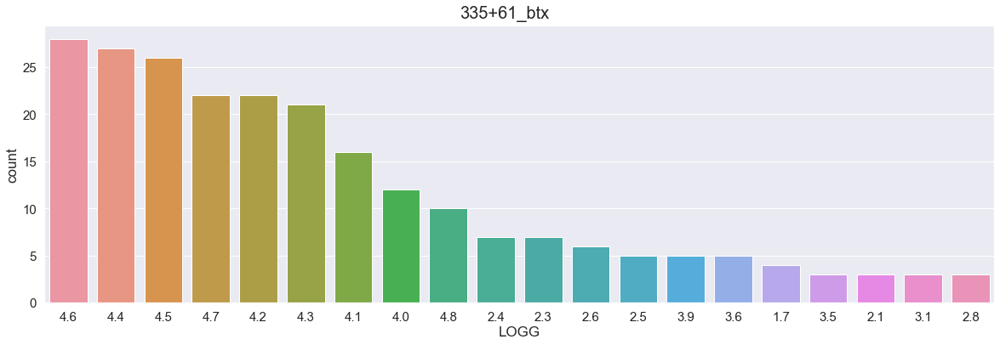

Plot 124B
df_Fd: 27


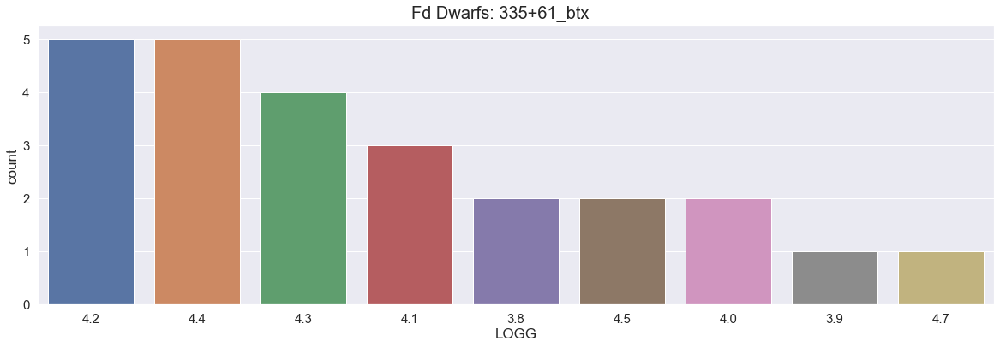

Plot 124C
df_GKd: 135


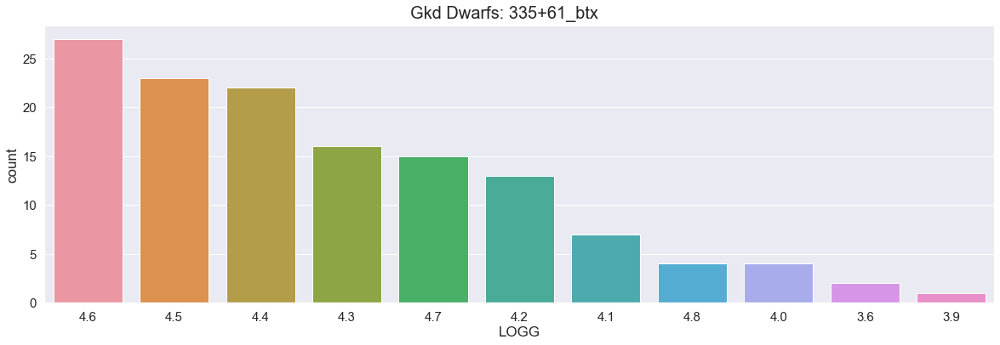

Plot 124D
df_GKg: 85


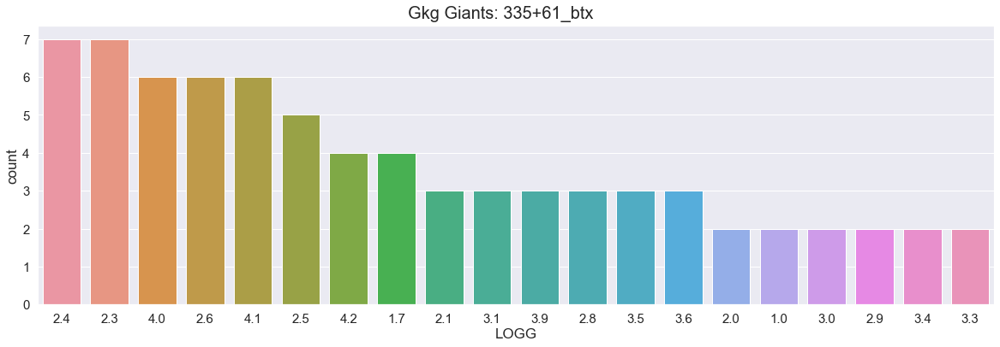

Plot 124E
df_Md: 16


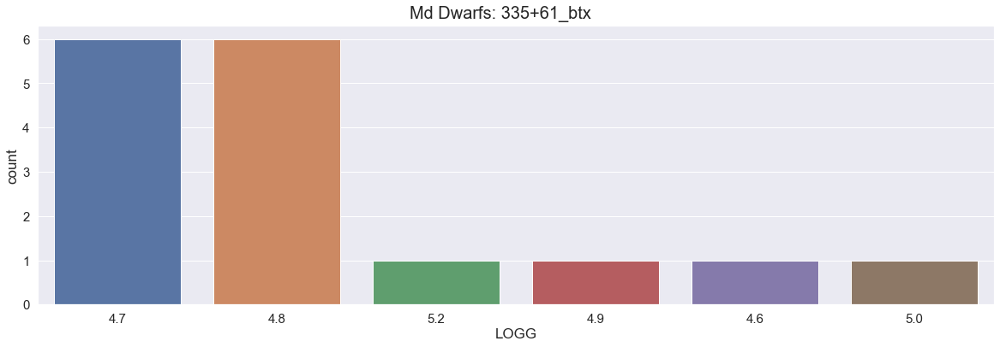

Plot 124F
df_Mg: 2


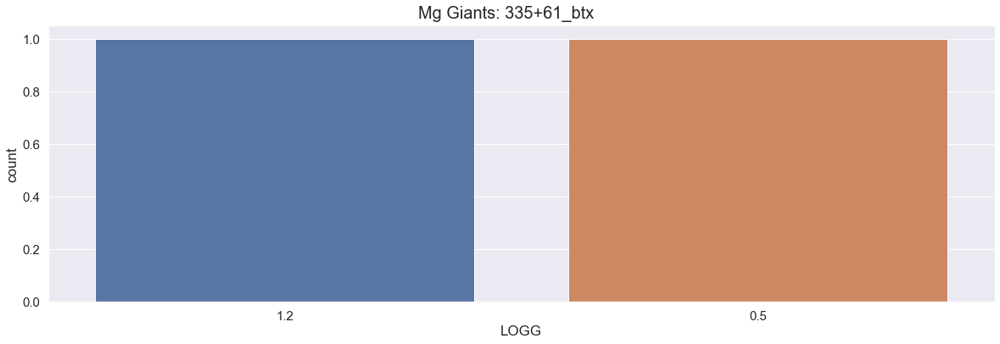

Plot 125


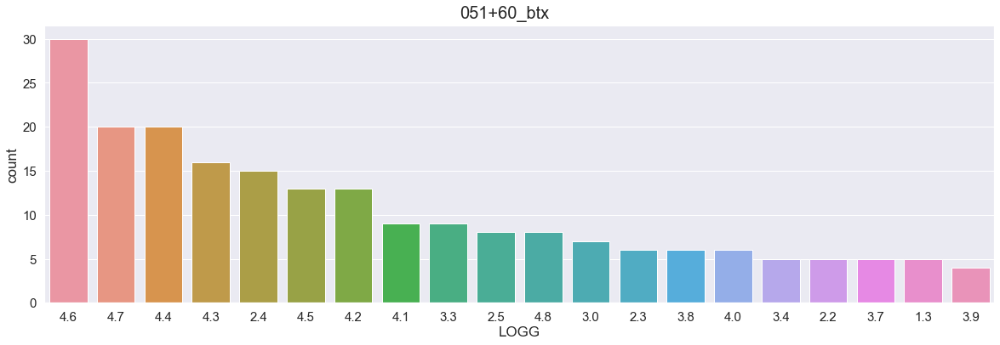

Plot 126


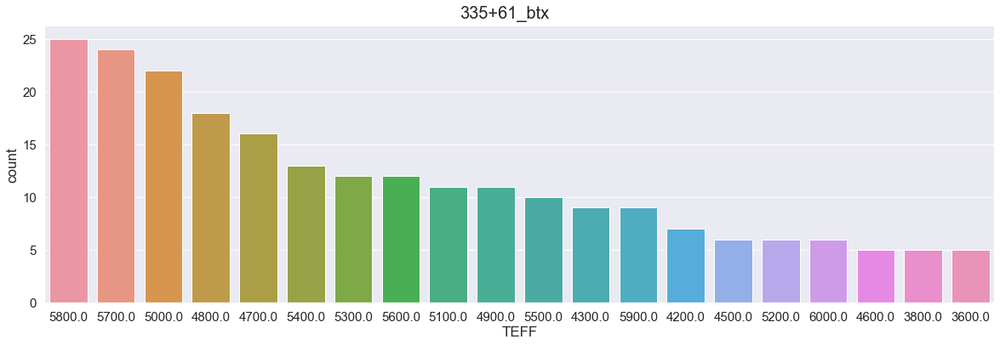

Plot 127


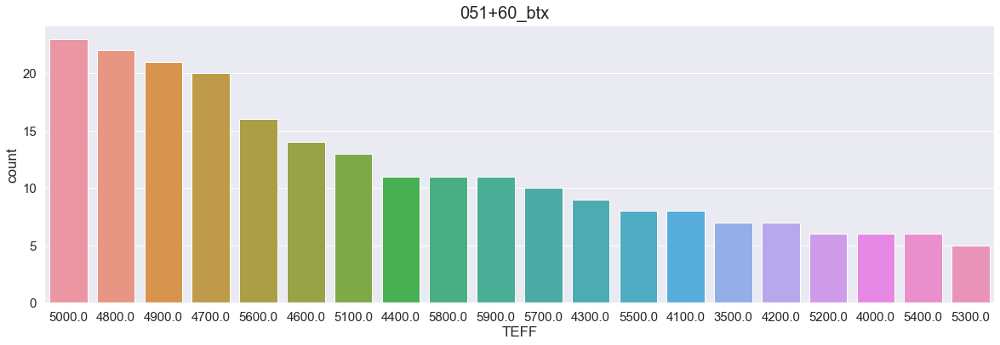

Plot 128


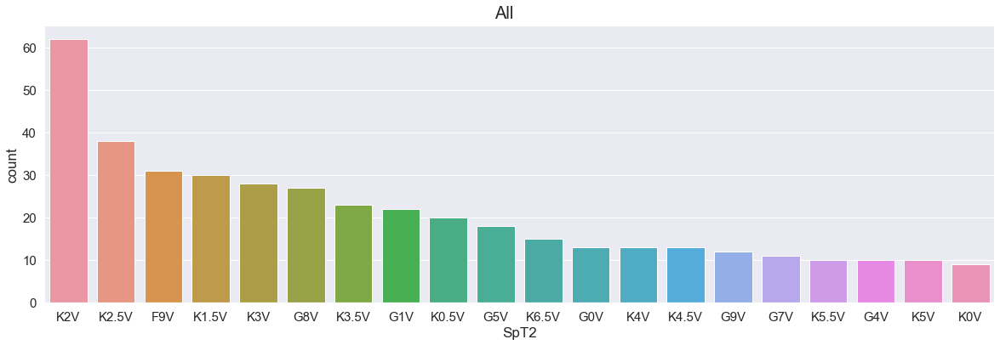

Plot 129


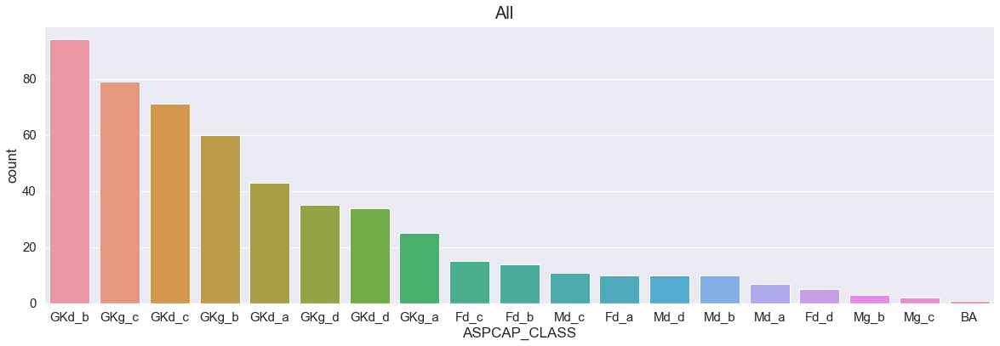

Plot 130


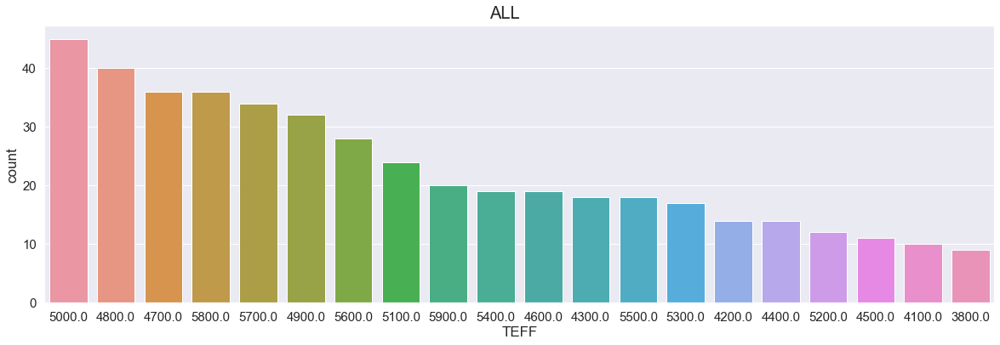

Plot 131


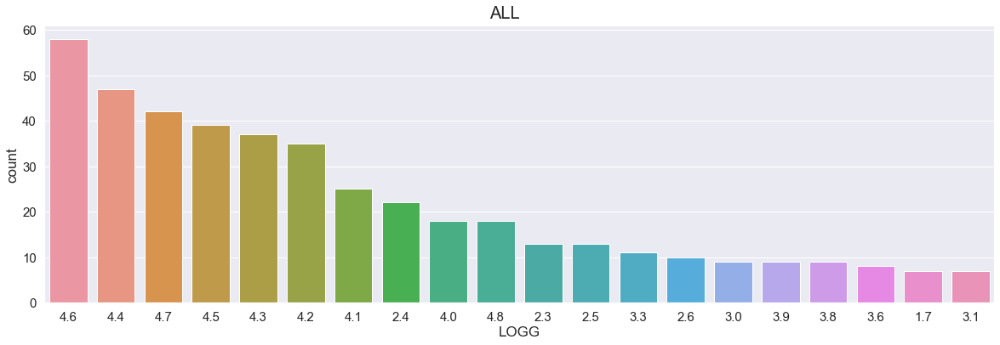

In [26]:
################################################################################
print("Plot 124")


sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d3 = df_Apogee[df_Apogee.FIELD.isin([st1])]

dlist0 = round(d3.LOGG, 1)
dlist = dlist0[dlist0 > -9999]
plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, st1, fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()

print("Plot 124B")

df_Fd = d1[d1.ASPCAP_CLASS.isin(['Fd_a', 'Fd_b', 'Fd_c', 'Fd_d'])]
print(str("df_Fd: " + str(df_Fd.shape[0])))

dlist0 = round(df_Fd.LOGG, 1)
dlist = dlist0[dlist0 > -9999]
plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, 'Fd Dwarfs: ' + str(st1), fontsize=20, ha='center')
ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()

print("Plot 124C")

df_GKd = d1[d1.ASPCAP_CLASS.isin(['GKd_a', 'GKd_b', 'GKd_c', 'GKd_d'])]
print(str("df_GKd: " + str(df_GKd.shape[0])))

dlist0 = round(df_GKd.LOGG, 1)
dlist = dlist0[dlist0 > -9999]
plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, 'Gkd Dwarfs: ' + str(st1), fontsize=20, ha='center')
ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()

print("Plot 124D")

df_GKg = d1[d1.ASPCAP_CLASS.isin(['GKg_a', 'GKg_b', 'GKg_c', 'GKg_d'])]
print(str("df_GKg: " + str(df_GKg.shape[0])))

dlist0 = round(df_GKg.LOGG, 1)
dlist = dlist0[dlist0 > -9999]
plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, 'Gkg Giants: ' + str(st1), fontsize=20, ha='center')
ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()

print("Plot 124E")

df_Md = d1[d1.ASPCAP_CLASS.isin(['Md_a', 'Md_b', 'Md_c', 'Md_d'])]
print(str("df_Md: " + str(df_Md.shape[0])))

#print(str(s1[idx_Mg_a].shape[0]))

if str(df_Md.shape[0]) > '1':
    dlist0 = round(df_Md.LOGG, 1)
    dlist = dlist0[dlist0 > -9999]
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Md Dwarfs: ' + str(st1), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()

print("Plot 124F")

df_Mg = d1[d1.ASPCAP_CLASS.isin(['Mg_a', 'Mg_b', 'Mg_c', 'Mg_d'])]
print(str("df_Mg: " + str(df_Mg.shape[0])))

if df_Mg.shape[0] > 1:
    dlist0 = round(df_Mg.LOGG, 1)
    dlist = dlist0[dlist0 > -9999]
    plt.rcParams["axes.labelsize"] = 17
    plt.figtext(.5, .9, 'Mg Giants: ' + str(st1), fontsize=20, ha='center')
    ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
    ax.tick_params(labelsize=15)
    plt.show()
else:
    print(str(st1) + "Skipping df_Mg = 0")


################################################################################
print("Plot 125")


sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d3 = df_Apogee[df_Apogee.FIELD.isin([st2])]

dlist0 = round(d3.LOGG, 1)
dlist = dlist0[dlist0 > -9999]

plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, st2, fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()



################################################################################
print("Plot 126")


sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d3 = df_Apogee[df_Apogee.FIELD.isin([st1])]

dlist0 = round(d3.TEFF, -2)
dlist = dlist0[dlist0 > -9999]

plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, st1, fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()


################################################################################
print("Plot 127")


sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d3 = df_Apogee[df_Apogee.FIELD.isin([st2])]

dlist0 = round(d3.TEFF, -2)
dlist = dlist0[dlist0 > -9999]

plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, st2, fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()


################################################################################
print("Plot 128")



sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d3 = df_Apogee[df_Apogee.FIELD.isin([st1, st2])]

dlist = d3.SpT2

plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, 'All', fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()


################################################################################
print("Plot 129")


sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d3 = df_Apogee[df_Apogee.FIELD.isin([st1, st2])]

dlist = d3.ASPCAP_CLASS

plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, 'All', fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()


################################################################################
print("Plot 130")


sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d3 = df_Apogee[df_Apogee.FIELD.isin([st1, st2])]

dlist0 = round(d3.TEFF, -2)
dlist = dlist0[dlist0 > -9999]

plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, 'ALL', fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()

################################################################################

print("Plot 131")

sns.set(style="darkgrid")
sns.set(rc={'figure.figsize':(20,6)})

d3 = df_Apogee[df_Apogee.FIELD.isin([st1, st2])]

dlist0 = round(d3.LOGG, 1)
dlist = dlist0[dlist0 > -9999]

plt.rcParams["axes.labelsize"] = 17
plt.figtext(.5, .9, 'ALL', fontsize=20, ha='center')

ax = sns.countplot(x=dlist, order=dlist.value_counts().iloc[:20].index)
ax.tick_params(labelsize=15)
plt.show()



In [27]:
################################################################################
print("Plot 132")


print("Target: " + st1)
print("\nTarget: " + st2)
    
s1Label = st1.strip()
s2Label = st2.strip()


idx_BA  = sp.where( (s1['ASPCAP_CLASS'] == 'BA') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx2_BA = sp.where( (s2['ASPCAP_CLASS'] == 'BA') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]

idx_Fd_a = sp.where( (s1['ASPCAP_CLASS'] == 'Fd_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Fd_b = sp.where( (s1['ASPCAP_CLASS'] == 'Fd_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Fd_c = sp.where( (s1['ASPCAP_CLASS'] == 'Fd_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Fd_d = sp.where( (s1['ASPCAP_CLASS'] == 'Fd_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx2_Fd_a = sp.where( (s2['ASPCAP_CLASS'] == 'Fd_a') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Fd_b = sp.where( (s2['ASPCAP_CLASS'] == 'Fd_b') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Fd_c = sp.where( (s2['ASPCAP_CLASS'] == 'Fd_c') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Fd_d = sp.where( (s2['ASPCAP_CLASS'] == 'Fd_d') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]


idx_GKd_a = sp.where( (s1['ASPCAP_CLASS'] == 'GKd_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKd_b = sp.where( (s1['ASPCAP_CLASS'] == 'GKd_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKd_c = sp.where( (s1['ASPCAP_CLASS'] == 'GKd_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKd_d = sp.where( (s1['ASPCAP_CLASS'] == 'GKd_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx2_GKd_a = sp.where( (s2['ASPCAP_CLASS'] == 'GKd_a') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKd_b = sp.where( (s2['ASPCAP_CLASS'] == 'GKd_b') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKd_c = sp.where( (s2['ASPCAP_CLASS'] == 'GKd_c') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKd_d = sp.where( (s2['ASPCAP_CLASS'] == 'GKd_d') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]


idx_GKg_a = sp.where( (s1['ASPCAP_CLASS'] == 'GKg_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKg_b = sp.where( (s1['ASPCAP_CLASS'] == 'GKg_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKg_c = sp.where( (s1['ASPCAP_CLASS'] == 'GKg_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKg_d = sp.where( (s1['ASPCAP_CLASS'] == 'GKg_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx2_GKg_a = sp.where( (s2['ASPCAP_CLASS'] == 'GKg_a') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKg_b = sp.where( (s2['ASPCAP_CLASS'] == 'GKg_b') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKg_c = sp.where( (s2['ASPCAP_CLASS'] == 'GKg_c') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_GKg_d = sp.where( (s2['ASPCAP_CLASS'] == 'GKg_d') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]


idx_Md_a = sp.where( (s1['ASPCAP_CLASS'] == 'Md_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Md_b = sp.where( (s1['ASPCAP_CLASS'] == 'Md_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Md_c = sp.where( (s1['ASPCAP_CLASS'] == 'Md_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Md_d = sp.where( (s1['ASPCAP_CLASS'] == 'Md_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx2_Md_a = sp.where( (s2['ASPCAP_CLASS'] == 'Md_a') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Md_b = sp.where( (s2['ASPCAP_CLASS'] == 'Md_b') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Md_c = sp.where( (s2['ASPCAP_CLASS'] == 'Md_c') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Md_d = sp.where( (s2['ASPCAP_CLASS'] == 'Md_d') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]


idx_Mg_a = sp.where( (s1['ASPCAP_CLASS'] == 'Mg_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Mg_b = sp.where( (s1['ASPCAP_CLASS'] == 'Mg_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Mg_c = sp.where( (s1['ASPCAP_CLASS'] == 'Mg_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Mg_d = sp.where( (s1['ASPCAP_CLASS'] == 'Mg_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx2_Mg_a = sp.where( (s2['ASPCAP_CLASS'] == 'Mg_a') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
idx2_Mg_b = sp.where( (s2['ASPCAP_CLASS'] == 'Mg_b') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
#if idx_Mg_b.shape[0] == 1:
        #idx_Mg_b = idx_Mg_b.iloc[1:]
idx2_Mg_c = sp.where( (s2['ASPCAP_CLASS'] == 'Mg_c') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]
#if idx_Mg_c.shape[0] == 1:
        #idx_Mg_c = np.delete(idx_Mg_c, 0)
idx2_Mg_d = sp.where( (s2['ASPCAP_CLASS'] == 'Mg_d') & sp.logical_not (s2['APOGEE_TARGET2'] & 2**9))[0]


print('\n' + s1Label + ': Stars '   + str(s1.shape[0]))

print('\nBA' + ': Stars '   + str(idx_BA.shape[0]))

print('\nFd_a' + ': Stars '   + str(idx_Fd_a.shape[0]))
print('Fd_b' + ': Stars '     + str(idx_Fd_b.shape[0]))
print('Fd_c' + ': Stars '     + str(idx_Fd_c.shape[0]))
print('Fd_d' + ': Stars '     + str(idx_Fd_d.shape[0]))

#print('\nFd' + ': Stars '   + str(len(idx_Fd)))

print('\nGKd_a' + ': Stars '   + str(idx_GKd_a.shape[0]))
print('GKd_b' + ': Stars '     + str(idx_GKd_b.shape[0]))
print('GKd_c' + ': Stars '     + str(idx_GKd_c.shape[0]))
print('GKd_d' + ': Stars '     + str(idx_GKd_d.shape[0]))

#print('\nGKd' + ': Stars '   + str(len(idx_GKd)))

print('\nGKg_a' + ': Stars '   + str(idx_GKg_a.shape[0]))
print('GKg_b' + ': Stars '     + str(idx_GKg_b.shape[0]))
print('GKg_c' + ': Stars '     + str(idx_GKg_c.shape[0]))
print('GKg_d' + ': Stars '     + str(idx_GKg_d.shape[0]))

#print('\nGKg' + ': Stars '   + str(len(idx_GKg)))

print('\nMd_a' + ': Stars '   + str(idx_Md_a.shape[0]))
print('Md_b' + ': Stars '     + str(idx_Md_b.shape[0]))
print('Md_c' + ': Stars '     + str(idx_Md_c.shape[0]))
print('Md_d' + ': Stars '     + str(idx_Md_d.shape[0]))

#print('\nMd' + ': Stars '   + str(len(idx_Md)))

print('\nMg_a' + ': Stars '   + str(idx_Mg_a.shape[0]))
print('Mg_b' + ': Stars '     + str(idx_Mg_b.shape[0]))
print('Mg_c' + ': Stars '     + str(idx_Mg_c.shape[0]))
print('Mg_d' + ': Stars '     + str(idx_Mg_d.shape[0]))


print('\n' + s2Label + ': Stars '   + str(s2.shape[0]))

print('\nBA' + ': Stars '   + str(idx2_BA.shape[0]))

print('\nFd_a' + ': Stars '   + str(idx2_Fd_a.shape[0]))
print('Fd_b' + ': Stars '     + str(idx2_Fd_b.shape[0]))
print('Fd_c' + ': Stars '     + str(idx2_Fd_c.shape[0]))
print('Fd_d' + ': Stars '     + str(idx2_Fd_d.shape[0]))

#print('\nFd' + ': Stars '   + str(len(idx_Fd)))

print('\nGKd_a' + ': Stars '   + str(idx2_GKd_a.shape[0]))
print('GKd_b' + ': Stars '     + str(idx2_GKd_b.shape[0]))
print('GKd_c' + ': Stars '     + str(idx2_GKd_c.shape[0]))
print('GKd_d' + ': Stars '     + str(idx2_GKd_d.shape[0]))

#print('\nGKd' + ': Stars '   + str(len(idx_GKd)))

print('\nGKg_a' + ': Stars '   + str(idx2_GKg_a.shape[0]))
print('GKg_b' + ': Stars '     + str(idx2_GKg_b.shape[0]))
print('GKg_c' + ': Stars '     + str(idx2_GKg_c.shape[0]))
print('GKg_d' + ': Stars '     + str(idx2_GKg_d.shape[0]))

#print('\nGKg' + ': Stars '   + str(len(idx_GKg)))

print('\nMd_a' + ': Stars '   + str(idx2_Md_a.shape[0]))
print('Md_b' + ': Stars '     + str(idx2_Md_b.shape[0]))
print('Md_c' + ': Stars '     + str(idx2_Md_c.shape[0]))
print('Md_d' + ': Stars '     + str(idx2_Md_d.shape[0]))

#print('\nMd' + ': Stars '   + str(len(idx_Md)))

print('\nMg_a' + ': Stars '   + str(idx2_Mg_a.shape[0]))
print('Mg_b' + ': Stars '     + str(idx2_Mg_b.shape[0]))
print('Mg_c' + ': Stars '     + str(idx2_Mg_c.shape[0]))
print('Mg_d' + ': Stars '     + str(idx2_Mg_d.shape[0]))



print('\nFields: ' + str(sp.unique(s1['FIELD'])))

print('\nFields: ' + str(sp.unique(s2['FIELD'])))

Plot 132
Target: 335+61_btx

Target: 051+60_btx

335+61_btx: Stars 261

BA: Stars 0

Fd_a: Stars 5
Fd_b: Stars 8
Fd_c: Stars 8
Fd_d: Stars 4

GKd_a: Stars 21
GKd_b: Stars 50
GKd_c: Stars 46
GKd_d: Stars 17

GKg_a: Stars 9
GKg_b: Stars 26
GKg_c: Stars 39
GKg_d: Stars 10

Md_a: Stars 3
Md_b: Stars 3
Md_c: Stars 5
Md_d: Stars 5

Mg_a: Stars 0
Mg_b: Stars 1
Mg_c: Stars 1
Mg_d: Stars 0

051+60_btx: Stars 258

BA: Stars 1

Fd_a: Stars 3
Fd_b: Stars 5
Fd_c: Stars 4
Fd_d: Stars 1

GKd_a: Stars 21
GKd_b: Stars 44
GKd_c: Stars 25
GKd_d: Stars 17

GKg_a: Stars 16
GKg_b: Stars 34
GKg_c: Stars 39
GKg_d: Stars 24

Md_a: Stars 3
Md_b: Stars 7
Md_c: Stars 6
Md_d: Stars 5

Mg_a: Stars 0
Mg_b: Stars 2
Mg_c: Stars 1
Mg_d: Stars 0

Fields: ['335+61_btx']

Fields: ['051+60_btx']


Plot 133


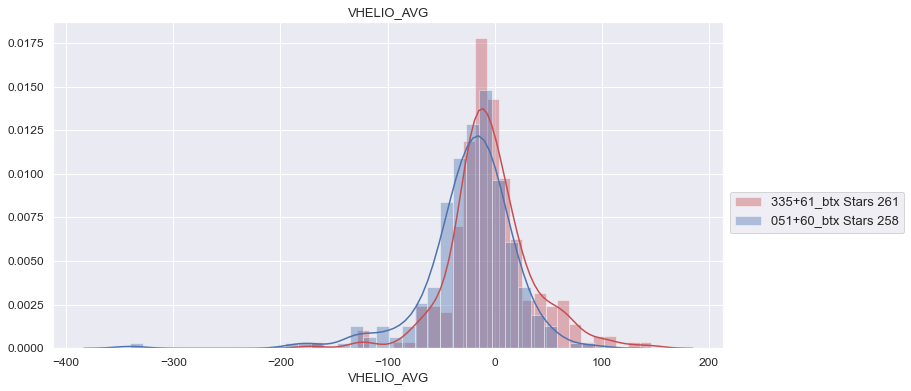

Plot 133B


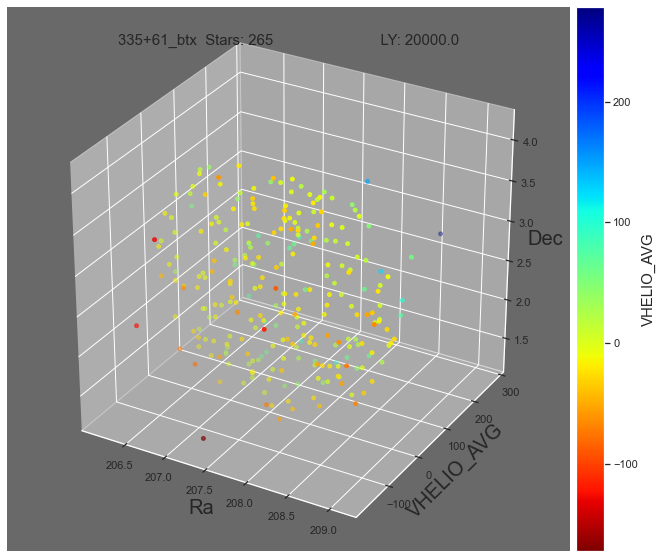

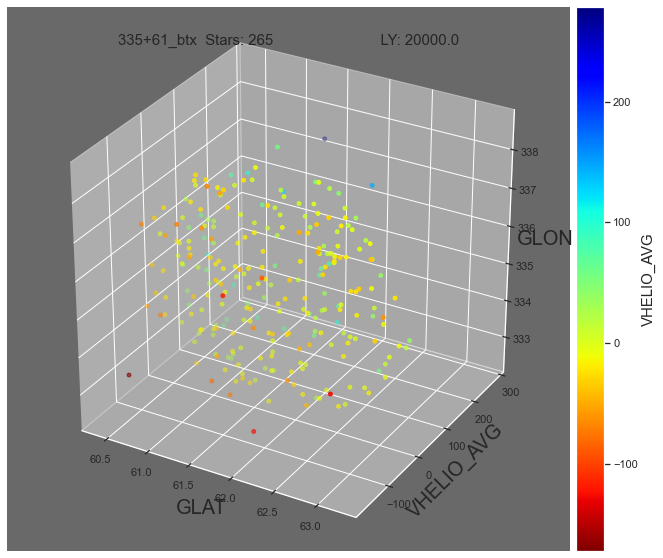

In [28]:
################################################################################
print("Plot 133")


x1 = s1['VHELIO_AVG']
x2 = s2['VHELIO_AVG']

rLow = -1000
rHi  = 1000

plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(x1[(x1 >= rLow) & (x1 <= rHi)], color='r', hist=True,  
                    label=st1.strip() + " Stars " + str(x1.shape[0]))
sns.distplot(x2[(x2 >= rLow) & (x2 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " Stars " + str(x2.shape[0]))
plt.xlabel('VHELIO_AVG', fontsize=13)
plt.title("VHELIO_AVG", fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
    #plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()


################################################################################


print("Plot 133B")
plotSlice3DParmDensityVHELIO(d1, st1,  "VHELIO_AVG", "VHELIO_AVG", "jet_r", 1)
plotSlice3DParmDensityVHELIOG(d1, st1,  "VHELIO_AVG", "VHELIO_AVG", "jet_r", 1)

Plot 134


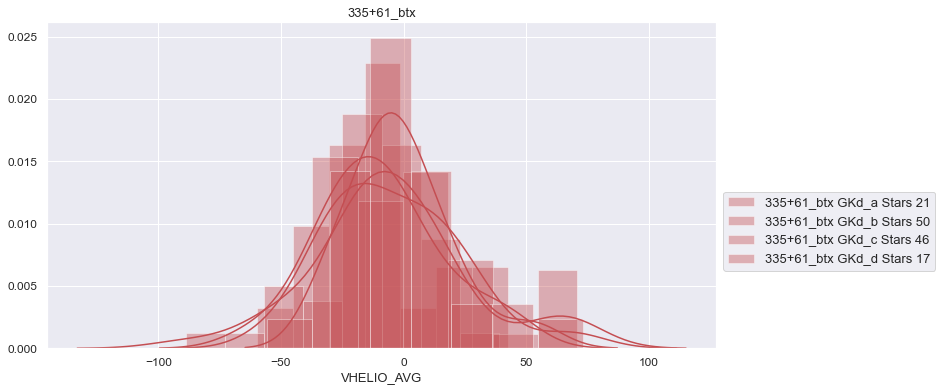

Plot 134b

GKd_a Length: 21

 GKd_a: 335+61_btx
             RA       DEC ASPCAP_CLASS  VHELIO_AVG
68   207.129549  4.071402        GKd_a    -59.5927
129  207.707553  4.154806        GKd_a    -39.8988
193  208.215029  3.714618        GKd_a    -34.9121
39   206.847252  3.704327        GKd_a    -31.0326
197  208.238340  3.869505        GKd_a    -30.3727
134  207.735050  3.509031        GKd_a    -24.0157
104  207.410892  3.661321        GKd_a    -22.7484
103  207.390545  3.711575        GKd_a    -21.6367
137  207.762408  3.769999        GKd_a    -16.4871
52   206.963732  3.809233        GKd_a    -13.6909

GKd_b Length: 50

 GKd_b: 335+61_btx
             RA       DEC ASPCAP_CLASS  VHELIO_AVG
165  207.919424  3.045495        GKd_b    -88.7721
29   206.699177  2.626817        GKd_b    -65.8313
251  208.865207  2.883494        GKd_b    -52.7965
168  207.954189  3.646481        GKd_b    -50.2154
171  207.990923  2.614200        GKd_b    -48.1393
56   206.973124  2.840841        GKd_b    -45.0

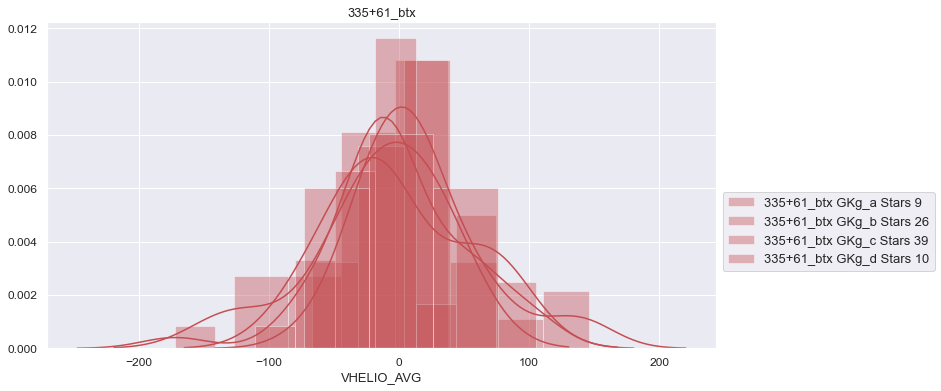


GKg_a Length: 9

 GKg_a: 335+61_btx
             RA       DEC ASPCAP_CLASS  VHELIO_AVG
19   206.606352  3.386484        GKg_a  -126.39700
191  208.212939  3.543832        GKg_a   -49.97560
105  207.432084  3.818586        GKg_a   -32.90600
80   207.215599  4.112800        GKg_a   -19.42670
205  208.275721  3.653015        GKg_a    -6.97980
124  207.629588  3.954003        GKg_a     3.13892
66   207.104704  3.663702        GKg_a    12.26700
55   206.971173  3.479701        GKg_a    36.93260
20   206.621621  3.772057        GKg_a    37.88800

GKg_b Length: 26

 GKg_b: 335+61_btx
             RA       DEC ASPCAP_CLASS  VHELIO_AVG
257  209.001647  2.850961        GKg_b  -67.110800
250  208.857612  2.838521        GKg_b  -33.221600
131  207.711638  3.061001        GKg_b  -32.575600
186  208.139234  3.516468        GKg_b  -25.902700
231  208.541743  3.207450        GKg_b  -23.758600
113  207.505496  2.848107        GKg_b  -23.578700
138  207.766999  3.639225        GKg_b  -22.462300
43   20

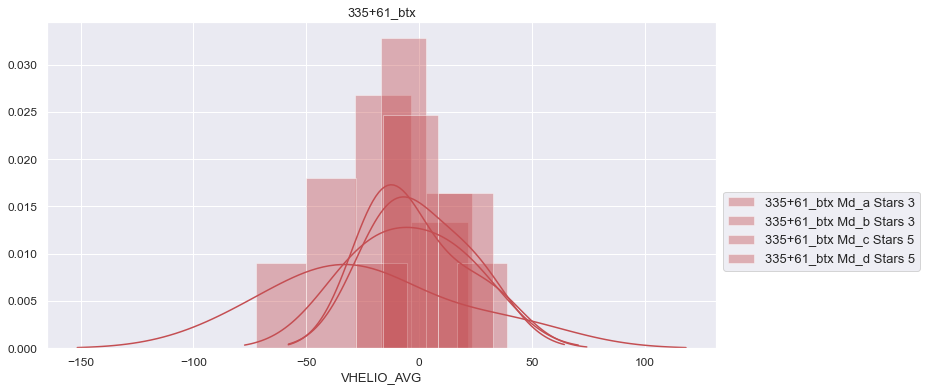


Md_a Length: 3

 Md_a: 335+61_btx
             RA       DEC ASPCAP_CLASS  VHELIO_AVG
125  207.669545  3.457975         Md_a   -28.36110
17   206.586619  3.655254         Md_a    -4.51432
222  208.446823  3.788925         Md_a    21.45160

Md_b Length: 3

 Md_b: 335+61_btx
             RA       DEC ASPCAP_CLASS  VHELIO_AVG
164  207.919055  2.555375         Md_b   -17.14980
5    206.310204  3.197040         Md_b    -4.18319
157  207.869939  3.371038         Md_b    23.45570

Md_c Length: 5

 Md_c: 335+61_btx
             RA       DEC ASPCAP_CLASS  VHELIO_AVG
237  208.702207  2.271574         Md_c    -72.3339
163  207.917608  1.354894         Md_c    -35.5721
76   207.170639  2.540700         Md_c    -33.4306
116  207.542353  1.544820         Md_c    -14.2346
219  208.429311  1.773024         Md_c     38.9921

Md_d Length: 5

 Md_d: 335+61_btx
             RA       DEC ASPCAP_CLASS  VHELIO_AVG
49   206.887464  2.308819         Md_d    -16.2637
13   206.388255  2.468392         Md_d    -1

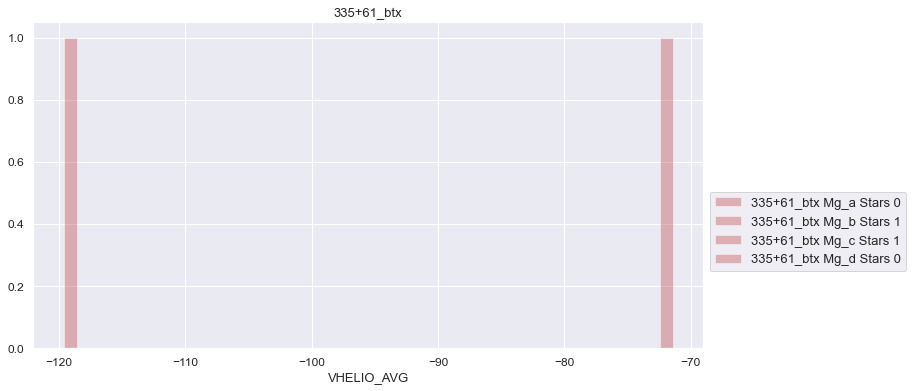


Mg_a Length: 0

 Mg_a: 335+61_btx
Empty DataFrame
Columns: [RA, DEC, ASPCAP_CLASS, VHELIO_AVG]
Index: []

Mg_b Length: 1

 Mg_b: 335+61_btx
             RA       DEC ASPCAP_CLASS  VHELIO_AVG
160  207.894981  2.638967         Mg_b    -119.125

Mg_c Length: 1

 Mg_c: 335+61_btx
             RA       DEC ASPCAP_CLASS  VHELIO_AVG
133  207.733118  1.480589         Mg_c    -71.9325

Mg_d Length: 0

 Mg_d: 335+61_btx
Empty DataFrame
Columns: [RA, DEC, ASPCAP_CLASS, VHELIO_AVG]
Index: []
Plot 137B


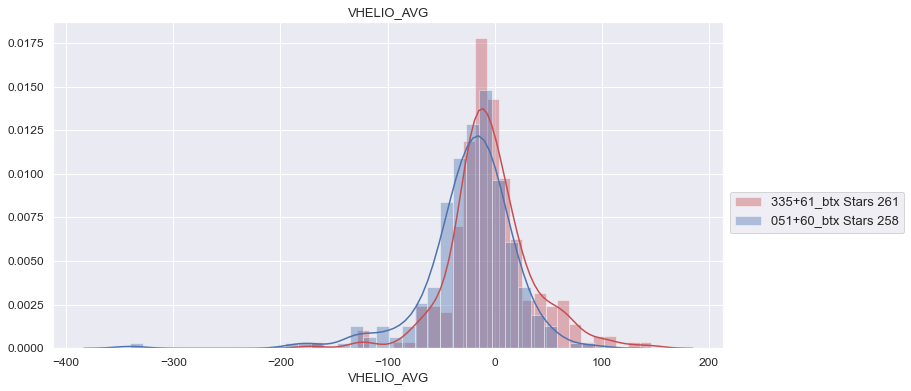

Plot 137C


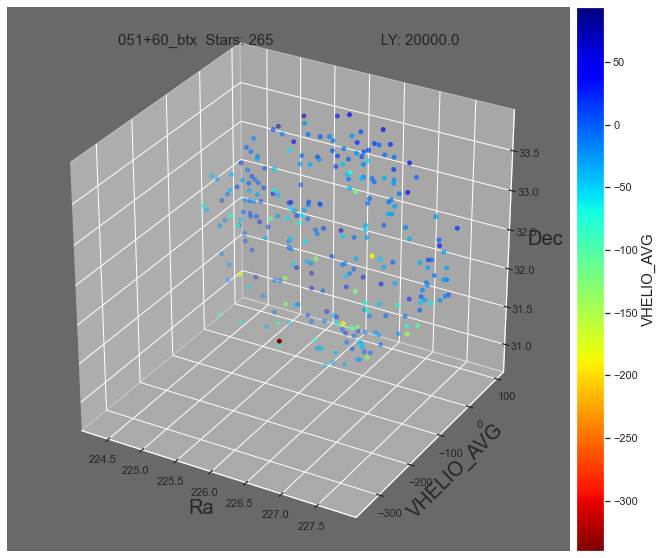

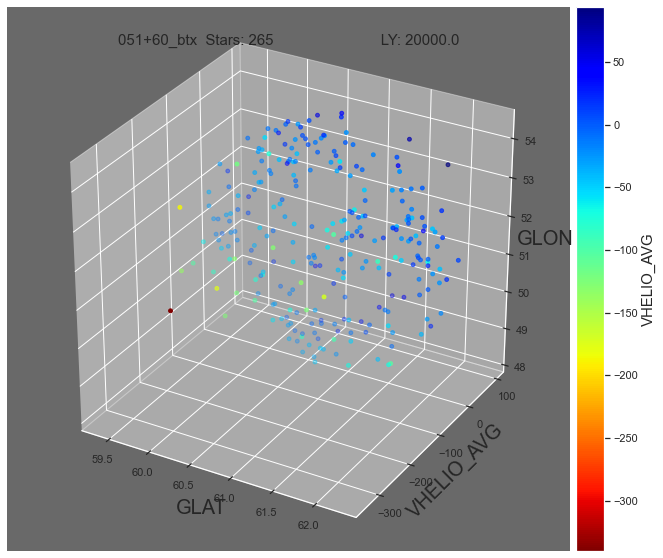

Plot 138


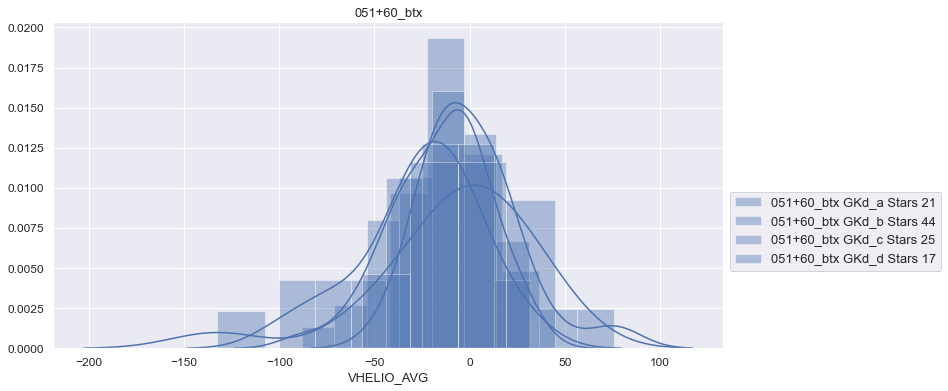


GKd_a Length: 21

 GKd_a: 051+60_btx
             RA        DEC ASPCAP_CLASS  VHELIO_AVG
157  226.429227  33.363289        GKd_a   -42.04810
153  226.412555  33.780342        GKd_a   -24.77600
161  226.471598  33.577538        GKd_a   -23.90160
41   224.992872  33.425968        GKd_a   -22.43910
124  226.064468  33.674820        GKd_a   -18.30640
127  226.115384  33.636093        GKd_a   -18.29390
35   224.894439  33.200439        GKd_a   -10.39770
180  226.638265  33.256149        GKd_a    -9.64044
211  226.938840  33.590370        GKd_a    -9.52396
184  226.664362  33.220226        GKd_a    -9.33932

GKd_b Length: 44

 GKd_b: 051+60_btx
             RA        DEC ASPCAP_CLASS  VHELIO_AVG
48   225.058957  32.544048        GKd_b    -88.1007
2    224.451675  32.587093        GKd_b    -66.5510
110  225.907418  32.444832        GKd_b    -57.8583
83   225.627492  32.663345        GKd_b    -53.9134
188  226.718826  32.756348        GKd_b    -48.5069
17   224.757875  32.977386        GKd_b 

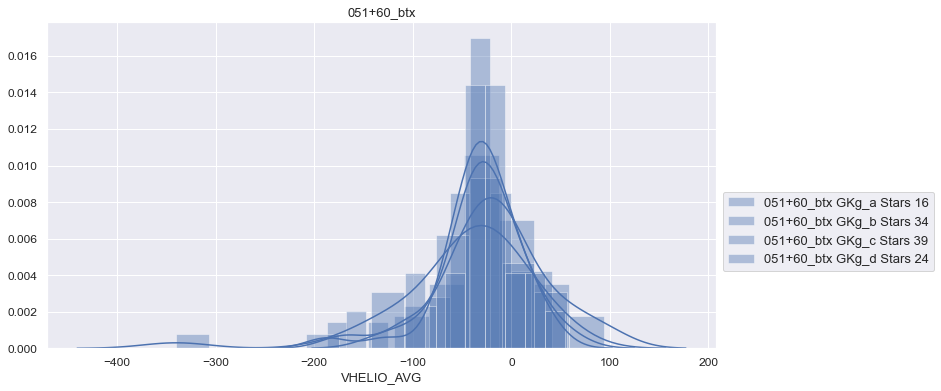


GKg_a Length: 16

 GKg_a: 051+60_btx
             RA        DEC ASPCAP_CLASS  VHELIO_AVG
200  226.877850  33.495670        GKg_a   -119.1710
88   225.674769  33.545174        GKg_a    -58.0458
190  226.765589  33.647312        GKg_a    -54.9459
67   225.402289  33.209320        GKg_a    -45.9128
179  226.632648  33.357281        GKg_a    -43.1911
115  225.956446  33.391155        GKg_a    -26.1455
95   225.727664  33.775524        GKg_a    -21.7497
168  226.552378  33.442715        GKg_a    -19.4635
66   225.382159  33.547302        GKg_a    -16.6723
195  226.813423  33.594242        GKg_a    -10.9309

GKg_b Length: 34

 GKg_b: 051+60_btx
             RA        DEC ASPCAP_CLASS  VHELIO_AVG
233  227.410825  33.061794        GKg_b   -187.3370
146  226.370162  32.570568        GKg_b   -127.4720
32   224.882704  32.574844        GKg_b    -71.3472
108  225.863073  32.700333        GKg_b    -67.1717
71   225.480829  33.009460        GKg_b    -62.6926
91   225.692673  32.812687        GKg_b 

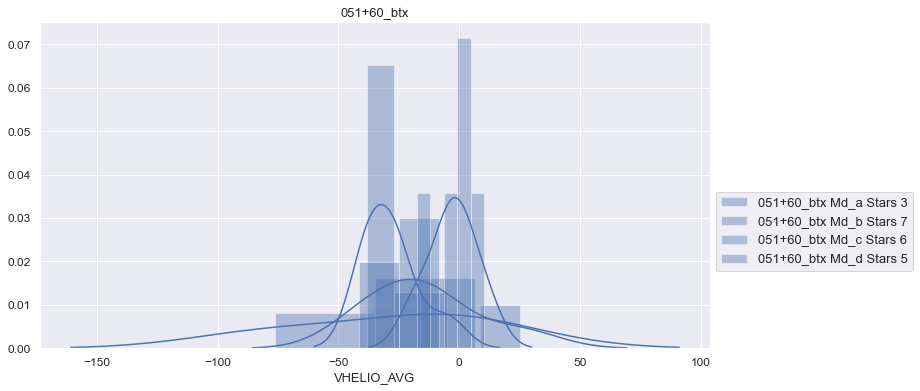


Md_a Length: 3

 Md_a: 051+60_btx
             RA        DEC ASPCAP_CLASS  VHELIO_AVG
176  226.613738  33.537411         Md_a   -76.30670
45   225.012708  33.181087         Md_a   -15.04430
163  226.510432  33.528896         Md_a     6.61827

Md_b Length: 7

 Md_b: 051+60_btx
             RA        DEC ASPCAP_CLASS  VHELIO_AVG
43   224.998892  32.816570         Md_b   -38.01370
185  226.677096  32.769424         Md_b   -37.90970
214  226.981190  32.982037         Md_b   -36.86840
33   224.883043  32.630211         Md_b   -27.84370
246  227.603484  33.063583         Md_b   -27.08710
78   225.589482  32.646061         Md_b   -23.58240
147  226.372133  32.435699         Md_b    -5.13457

Md_c Length: 6

 Md_c: 051+60_btx
             RA        DEC ASPCAP_CLASS  VHELIO_AVG
122  226.045059  31.030157         Md_c   -41.54440
203  226.914998  32.278481         Md_c   -31.71670
175  226.600502  31.600323         Md_c   -19.48540
98   225.785363  31.211708         Md_c   -11.10970
62   225.30

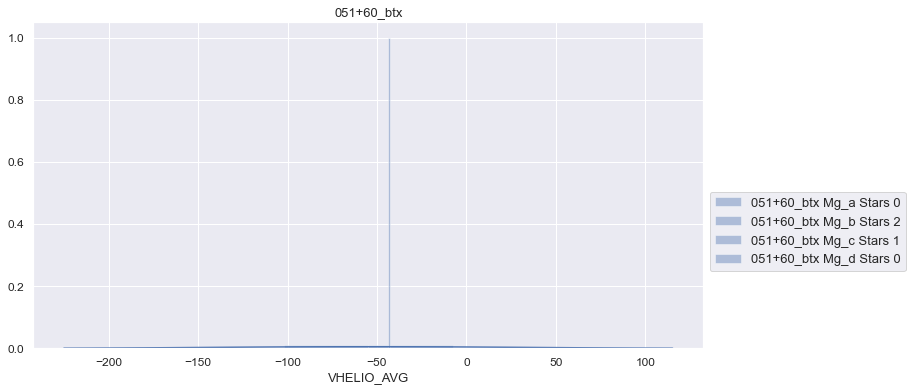


Mg_a Length: 0

 Mg_a: 051+60_btx
Empty DataFrame
Columns: [RA, DEC, ASPCAP_CLASS, VHELIO_AVG]
Index: []

Mg_b Length: 2

 Mg_b: 051+60_btx
             RA        DEC ASPCAP_CLASS  VHELIO_AVG
80   225.609737  32.808224         Mg_b  -101.98600
245  227.579589  32.703323         Mg_b    -7.74276

Mg_c Length: 1

 Mg_c: 051+60_btx
             RA        DEC ASPCAP_CLASS  VHELIO_AVG
126  226.083205  31.039955         Mg_c    -43.4275

Mg_d Length: 0

 Mg_d: 051+60_btx
Empty DataFrame
Columns: [RA, DEC, ASPCAP_CLASS, VHELIO_AVG]
Index: []


In [31]:
################################################################################


print("Plot 134")


t1 = s1['VHELIO_AVG']
t2 = s2['VHELIO_AVG']

tTitle = "VHELIO_AVG"
tlabel = 'VHELIO_AVG'

rLow = -1000
rHi  =  1000


mask = s1['ASPCAP_CLASS'] == 'GKd_a'
x1 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'GKd_b'
x2 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'GKd_c'
x3 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'GKd_d'
x4 = s1[mask]['VHELIO_AVG']


plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(x1[(x1 >= rLow) & (x1 <= rHi)], color='r', hist=True,  
                    label=st1.strip() + " GKd_a Stars " + str(x1.shape[0]))
sns.distplot(x2[(x2 >= rLow) & (x2 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " GKd_b Stars " + str(x2.shape[0]))
sns.distplot(x3[(x3 >= rLow) & (x3 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " GKd_c Stars " + str(x3.shape[0]))
sns.distplot(x4[(x4 >= rLow) & (x4 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " GKd_d Stars " + str(x4.shape[0]))
plt.xlabel(tlabel, fontsize=13)
plt.title(st1, fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
    #plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()



################################################################################
print("Plot 134b")



#print("Step 1: Creating DataFrame!")

sASPCAP_CLASS = s1['ASPCAP_CLASS']   #format = '5A'
sDEC          = s1['DEC']            #format = 'D'
sRA           = s1['RA']             #format = 'D'
sVHELIO_AVG   = s1['VHELIO_AVG']     #format = 'E'


tbl = np.column_stack(( 
    sASPCAP_CLASS,
    sDEC,
    sRA,
    sVHELIO_AVG,
))

df_s1 = pd.DataFrame(tbl, columns=[
    'ASPCAP_CLASS',
    'DEC',
    'RA',
    'VHELIO_AVG',
])

df_s1['RA']         = df_s1['RA'].astype(float)
df_s1['DEC']        = df_s1['DEC'].astype(float)
df_s1['VHELIO_AVG'] = df_s1['VHELIO_AVG'].astype(float)



mask = df_s1['ASPCAP_CLASS'] == 'GKd_a'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKd_a Length: " + str(len(rReport)))
print("\n GKd_a: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'GKd_b'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKd_b Length: " + str(len(rReport)))
print("\n GKd_b: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'GKd_c'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKd_c Length: " + str(len(rReport)))
print("\n GKd_c: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'GKd_d'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKd_d Length: " + str(len(rReport)))
print("\n GKd_d: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))


z= """

('APOGEE_ID', 'TELESCOPE', 'FIELD', 'J', 'J_ERR', 'H', 'H_ERR', 'K', 'K_ERR', 'RA', 'DEC', 'GLON', 'GLAT', 
'APOGEE_TARGET1', 'APOGEE_TARGET2', 'APOGEE_TARGET3', 'APOGEE2_TARGET1', 'APOGEE2_TARGET2', 'APOGEE2_TARGET3', 
'TARGFLAGS', 'SURVEY', 'PROGRAMNAME', 'NINST', 'NVISITS', 'COMBTYPE', 'COMMISS', 
'SNR', 'STARFLAG', 'STARFLAGS', 'ANDFLAG', 'ANDFLAGS', 'VHELIO_AVG', 'VSCATTER', 'VERR', 'VERR_MED', 
'OBSVHELIO_AVG', 'OBSVSCATTER', 'OBSVERR', 'OBSVERR_MED', 'SYNTHVHELIO_AVG', 'SYNTHVSCATTER', 'SYNTHVERR', 
'SYNTHVERR_MED', 'RV_TEFF', 'RV_LOGG', 'RV_FEH', 'RV_ALPHA', 'RV_CARB', 'RV_CCFWHM', 'RV_AUTOFWHM', 'SYNTHSCATTER', 
'STABLERV_CHI2', 'STABLERV_RCHI2', 'CHI2_THRESHOLD', 'STABLERV_CHI2_PROB', 'MEANFIB', 'SIGFIB', 'SNREV', 
'APSTAR_VERSION', 'ASPCAP_VERSION', 'RESULTS_VERSION', 'EXTRATARG', 'MIN_H', 'MAX_H', 'MIN_JK', 'MAX_JK', 
'TEFF', 'TEFF_ERR', 'LOGG', 'LOGG_ERR', 'VMICRO', 'VMACRO', 'VSINI', 'M_H', 'M_H_ERR', 'ALPHA_M', 'ALPHA_M_ERR', 
'ASPCAP_CHI2', 'ASPCAP_CLASS', 'ASPCAPFLAG', 'ASPCAPFLAGS', 'PARAMFLAG', 'X_H', 'X_H_ERR', 'X_M', 'X_M_ERR', 'C_FE', 'CI_FE', 'N_FE', 'O_FE', 'NA_FE', 'MG_FE', 'AL_FE', 'SI_FE', 'P_FE', 'S_FE', 'K_FE', 'CA_FE', 'TI_FE', 'TIII_FE', 'V_FE', 'CR_FE', 'MN_FE', 'FE_H', 'CO_FE', 'NI_FE', 'CU_FE', 'GE_FE', 'RB_FE', 'CE_FE', 'ND_FE', 'YB_FE', 'C_FE_ERR', 'CI_FE_ERR', 'N_FE_ERR', 'O_FE_ERR', 'NA_FE_ERR', 'MG_FE_ERR', 'AL_FE_ERR', 'SI_FE_ERR', 'P_FE_ERR', 'S_FE_ERR', 'K_FE_ERR', 'CA_FE_ERR', 'TI_FE_ERR', 'TIII_FE_ERR', 'V_FE_ERR', 'CR_FE_ERR', 'MN_FE_ERR', 'FE_H_ERR', 'CO_FE_ERR', 'NI_FE_ERR', 'CU_FE_ERR', 'GE_FE_ERR', 'RB_FE_ERR', 'CE_FE_ERR', 'ND_FE_ERR', 'YB_FE_ERR', 'C_FE_FLAG', 'CI_FE_FLAG', 'N_FE_FLAG', 'O_FE_FLAG', 'NA_FE_FLAG', 'MG_FE_FLAG', 'AL_FE_FLAG', 'SI_FE_FLAG', 'P_FE_FLAG', 'S_FE_FLAG', 'K_FE_FLAG', 'CA_FE_FLAG', 'TI_FE_FLAG', 'TIII_FE_FLAG', 'V_FE_FLAG', 'CR_FE_FLAG', 'MN_FE_FLAG', 'FE_H_FLAG', 'CO_FE_FLAG', 'NI_FE_FLAG', 'CU_FE_FLAG', 'GE_FE_FLAG', 'RB_FE_FLAG', 'CE_FE_FLAG', 'ND_FE_FLAG', 'YB_FE_FLAG', 'ELEM_CHI2', 'ALT_ID', 'SRC_H', 'WASH_M', 'WASH_M_ERR', 'WASH_T2', 'WASH_T2_ERR', 'DDO51', 'DDO51_ERR', 'IRAC_3_6', 'IRAC_3_6_ERR', 'IRAC_4_5', 'IRAC_4_5_ERR', 'IRAC_5_8', 'IRAC_5_8_ERR', 'IRAC_8_0', 'IRAC_8_0_ERR', 'WISE_4_5', 'WISE_4_5_ERR', 'TARG_4_5', 'TARG_4_5_ERR', 'AK_TARG', 'AK_TARG_METHOD', 'AK_WISE', 'SFD_EBV', 'WASH_DDO51_GIANT_FLAG', 'WASH_DDO51_STAR_FLAG', 'GAIA_SOURCE_ID', 'GAIA_PARALLAX', 'GAIA_PARALLAX_ERROR', 'GAIA_PMRA', 'GAIA_PMRA_ERROR', 'GAIA_PMDEC', 'GAIA_PMDEC_ERROR', 'GAIA_PHOT_G_MEAN_MAG', 'GAIA_PHOT_BP_MEAN_MAG', 'GAIA_PHOT_RP_MEAN_MAG', 'GAIA_RADIAL_VELOCITY', 'GAIA_RADIAL_VELOCITY_ERROR', 'GAIA_R_EST', 'GAIA_R_LO', 'GAIA_R_HI', 'TEFF_SPEC', 'LOGG_SPEC')

"""


################################################################################
print("Plot 135")


mask = s1['ASPCAP_CLASS'] == 'GKg_a'
x1 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'GKg_b'
x2 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'GKg_c'
x3 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'GKg_d'
x4 = s1[mask]['VHELIO_AVG']



plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(x1[(x1 >= rLow) & (x1 <= rHi)], color='r', hist=True,  
                    label=st1.strip() + " GKg_a Stars " + str(x1.shape[0]))
sns.distplot(x2[(x2 >= rLow) & (x2 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " GKg_b Stars " + str(x2.shape[0]))
sns.distplot(x3[(x3 >= rLow) & (x3 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " GKg_c Stars " + str(x3.shape[0]))
sns.distplot(x4[(x4 >= rLow) & (x4 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " GKg_d Stars " + str(x4.shape[0]))
plt.xlabel(tlabel, fontsize=13)
plt.title(st1, fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
    #plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()


mask = df_s1['ASPCAP_CLASS'] == 'GKg_a'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKg_a Length: " + str(len(rReport)))
print("\n GKg_a: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'GKg_b'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKg_b Length: " + str(len(rReport)))
print("\n GKg_b: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'GKg_c'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKg_c Length: " + str(len(rReport)))
print("\n GKg_c: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'GKg_d'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKg_d Length: " + str(len(rReport)))
print("\n GKg_d: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))




################################################################################
print("Plot 136")


mask = s1['ASPCAP_CLASS'] == 'Md_a'
x1 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'Md_b'
x2 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'Md_c'
x3 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'Md_d'
x4 = s1[mask]['VHELIO_AVG']



plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(x1[(x1 >= rLow) & (x1 <= rHi)], color='r', hist=True,  
                    label=st1.strip() + " Md_a Stars " + str(x1.shape[0]))
sns.distplot(x2[(x2 >= rLow) & (x2 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " Md_b Stars " + str(x2.shape[0]))
sns.distplot(x3[(x3 >= rLow) & (x3 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " Md_c Stars " + str(x3.shape[0]))
sns.distplot(x4[(x4 >= rLow) & (x4 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " Md_d Stars " + str(x4.shape[0]))
plt.xlabel(tlabel, fontsize=13)
plt.title(st1, fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
    #plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()


mask = df_s1['ASPCAP_CLASS'] == 'Md_a'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMd_a Length: " + str(len(rReport)))
print("\n Md_a: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'Md_b'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMd_b Length: " + str(len(rReport)))
print("\n Md_b: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'Md_c'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMd_c Length: " + str(len(rReport)))
print("\n Md_c: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'Md_d'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMd_d Length: " + str(len(rReport)))
print("\n Md_d: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))



################################################################################
print("Plot 137")


mask = s1['ASPCAP_CLASS'] == 'Mg_a'
x1 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'Mg_b'
x2 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'Mg_c'
x3 = s1[mask]['VHELIO_AVG']

mask = s1['ASPCAP_CLASS'] == 'Mg_d'
x4 = s1[mask]['VHELIO_AVG']



plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(x1[(x1 >= rLow) & (x1 <= rHi)], color='r', hist=True,  
                    label=st1.strip() + " Mg_a Stars " + str(x1.shape[0]))
sns.distplot(x2[(x2 >= rLow) & (x2 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " Mg_b Stars " + str(x2.shape[0]))
sns.distplot(x3[(x3 >= rLow) & (x3 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " Mg_c Stars " + str(x3.shape[0]))
sns.distplot(x4[(x4 >= rLow) & (x4 <= rHi)], color='r', hist=True, 
                    label=st1.strip() + " Mg_d Stars " + str(x4.shape[0]))
plt.xlabel(tlabel, fontsize=13)
plt.title(st1, fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
    #plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()



mask = df_s1['ASPCAP_CLASS'] == 'Mg_a'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMg_a Length: " + str(len(rReport)))
print("\n Mg_a: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'Mg_b'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMg_b Length: " + str(len(rReport)))
print("\n Mg_b: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'Mg_c'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMg_c Length: " + str(len(rReport)))
print("\n Mg_c: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s1['ASPCAP_CLASS'] == 'Mg_d'
rReport = df_s1[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMg_d Length: " + str(len(rReport)))
print("\n Mg_d: " + str(st1) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))



################################################################################
print("Plot 137B")


x1 = s1['VHELIO_AVG']
x2 = s2['VHELIO_AVG']

rLow = -1000
rHi  = 1000

plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(x1[(x1 >= rLow) & (x1 <= rHi)], color='r', hist=True,  
                    label=st1.strip() + " Stars " + str(x1.shape[0]))
sns.distplot(x2[(x2 >= rLow) & (x2 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " Stars " + str(x2.shape[0]))
plt.xlabel('VHELIO_AVG', fontsize=13)
plt.title("VHELIO_AVG", fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
    #plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()


################################################################################
print("Plot 137C")

plotSlice3DParmDensityVHELIO(d2, st2,  "VHELIO_AVG", "VHELIO_AVG", "jet_r", 1)
plotSlice3DParmDensityVHELIOG(d2, st2,  "VHELIO_AVG", "VHELIO_AVG", "jet_r", 1)

################################################################################
print("Plot 138")


mask = s2['ASPCAP_CLASS'] == 'GKd_a'
y1 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'GKd_b'
y2 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'GKd_c'
y3 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'GKd_d'
y4 = s2[mask]['VHELIO_AVG']


plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(y1[(y1 >= rLow) & (y1 <= rHi)], color='b', hist=True,  
                    label=st2.strip() + " GKd_a Stars " + str(y1.shape[0]))
sns.distplot(y2[(y2 >= rLow) & (y2 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " GKd_b Stars " + str(y2.shape[0]))
sns.distplot(y3[(y3 >= rLow) & (y3 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " GKd_c Stars " + str(y3.shape[0]))
sns.distplot(y4[(y4 >= rLow) & (y4 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " GKd_d Stars " + str(y4.shape[0]))
plt.xlabel(tTitle, fontsize=13)
plt.title(st2, fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
    #plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()




#print("Step 1: Creating DataFrame!")


sASPCAP_CLASS = s2['ASPCAP_CLASS']   #format = '5A'
sDEC          = s2['DEC']            #format = 'D'
sRA           = s2['RA']             #format = 'D'
sVHELIO_AVG   = s2['VHELIO_AVG']     #format = 'E'


tbl = np.column_stack(( 
    sASPCAP_CLASS,
    sDEC,
    sRA,
    sVHELIO_AVG,
))

df_s2 = pd.DataFrame(tbl, columns=[
    'ASPCAP_CLASS',
    'DEC',
    'RA',
    'VHELIO_AVG',
])

df_s2['RA']         = df_s2['RA'].astype(float)
df_s2['DEC']        = df_s2['DEC'].astype(float)
df_s2['VHELIO_AVG'] = df_s2['VHELIO_AVG'].astype(float)




mask = df_s2['ASPCAP_CLASS'] == 'GKd_a'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKd_a Length: " + str(len(rReport)))
print("\n GKd_a: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'GKd_b'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKd_b Length: " + str(len(rReport)))
print("\n GKd_b: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'GKd_c'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKd_c Length: " + str(len(rReport)))
print("\n GKd_c: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'GKd_d'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKd_d Length: " + str(len(rReport)))
print("\n GKd_d: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))


################################################################################
print("Plot 139")


mask = s2['ASPCAP_CLASS'] == 'GKg_a'
y1 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'GKg_b'
y2 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'GKg_c'
y3 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'GKg_d'
y4 = s2[mask]['VHELIO_AVG']


plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(y1[(y1 >= rLow) & (y1 <= rHi)], color='b', hist=True,  
                    label=st2.strip() + " GKg_a Stars " + str(y1.shape[0]))
sns.distplot(y2[(y2 >= rLow) & (y2 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " GKg_b Stars " + str(y2.shape[0]))
sns.distplot(y3[(y3 >= rLow) & (y3 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " GKg_c Stars " + str(y3.shape[0]))
sns.distplot(y4[(y4 >= rLow) & (y4 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " GKg_d Stars " + str(y4.shape[0]))
plt.xlabel(tlabel, fontsize=13)
plt.title(st2, fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
    #plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()


mask = df_s2['ASPCAP_CLASS'] == 'GKg_a'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKg_a Length: " + str(len(rReport)))
print("\n GKg_a: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'GKg_b'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKg_b Length: " + str(len(rReport)))
print("\n GKg_b: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'GKg_c'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKg_c Length: " + str(len(rReport)))
print("\n GKg_c: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'GKg_d'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nGKg_d Length: " + str(len(rReport)))
print("\n GKg_d: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

################################################################################
print("Plot 140")


mask = s2['ASPCAP_CLASS'] == 'Md_a'
y1 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'Md_b'
y2 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'Md_c'
y3 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'Md_d'
y4 = s2[mask]['VHELIO_AVG']


plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(y1[(y1 >= rLow) & (y1 <= rHi)], color='b', hist=True,  
                    label=st2.strip() + " Md_a Stars " + str(y1.shape[0]))
sns.distplot(y2[(y2 >= rLow) & (y2 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " Md_b Stars " + str(y2.shape[0]))
sns.distplot(y3[(y3 >= rLow) & (y3 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " Md_c Stars " + str(y3.shape[0]))
sns.distplot(y4[(y4 >= rLow) & (y4 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " Md_d Stars " + str(y4.shape[0]))
plt.xlabel(tlabel, fontsize=13)
plt.title(st2, fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
    #plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()


mask = df_s2['ASPCAP_CLASS'] == 'Md_a'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMd_a Length: " + str(len(rReport)))
print("\n Md_a: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'Md_b'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMd_b Length: " + str(len(rReport)))
print("\n Md_b: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'Md_c'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMd_c Length: " + str(len(rReport)))
print("\n Md_c: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'Md_d'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMd_d Length: " + str(len(rReport)))
print("\n Md_d: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))


################################################################################
print("Plot 141")


mask = s2['ASPCAP_CLASS'] == 'Mg_a'
y1 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'Mg_b'
y2 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'Mg_c'
y3 = s2[mask]['VHELIO_AVG']

mask = s2['ASPCAP_CLASS'] == 'Mg_d'
y4 = s2[mask]['VHELIO_AVG']


plt.rcParams["figure.figsize"] = (12, 6)
sns.distplot(y1[(y1 >= rLow) & (y1 <= rHi)], color='b', hist=True,  
                    label=st2.strip() + " Mg_a Stars " + str(y1.shape[0]))
sns.distplot(y2[(y2 >= rLow) & (y2 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " Mg_b Stars " + str(y2.shape[0]))
sns.distplot(y3[(y3 >= rLow) & (y3 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " Mg_c Stars " + str(y3.shape[0]))
sns.distplot(y4[(y4 >= rLow) & (y4 <= rHi)], color='b', hist=True, 
                    label=st2.strip() + " Mg_d Stars " + str(y4.shape[0]))
plt.xlabel(tlabel, fontsize=13)
plt.title(st2, fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
    #plt.legend(fontsize=13)
L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
plt.show()


mask = df_s2['ASPCAP_CLASS'] == 'Mg_a'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMg_a Length: " + str(len(rReport)))
print("\n Mg_a: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'Mg_b'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMg_b Length: " + str(len(rReport)))
print("\n Mg_b: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'Mg_c'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMg_c Length: " + str(len(rReport)))
print("\n Mg_c: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))

mask = df_s2['ASPCAP_CLASS'] == 'Mg_d'
rReport = df_s2[mask].sort_values(['VHELIO_AVG'], ascending=[True])
print("\nMg_d Length: " + str(len(rReport)))
print("\n Mg_d: " + str(st2) + "\n" + str(rReport[['RA', 'DEC', 'ASPCAP_CLASS', 'VHELIO_AVG']].head(10)))



In [32]:
################################################################################
print("Plot 150")

rAscap = 'GKg_b'


Plot 150


Plot 151


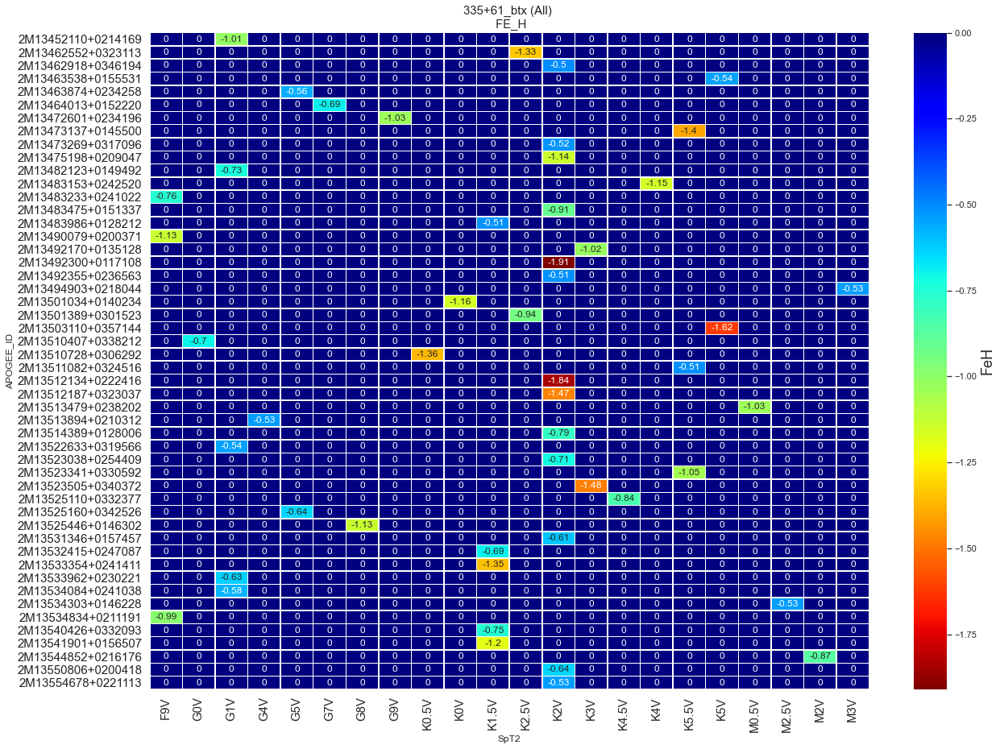

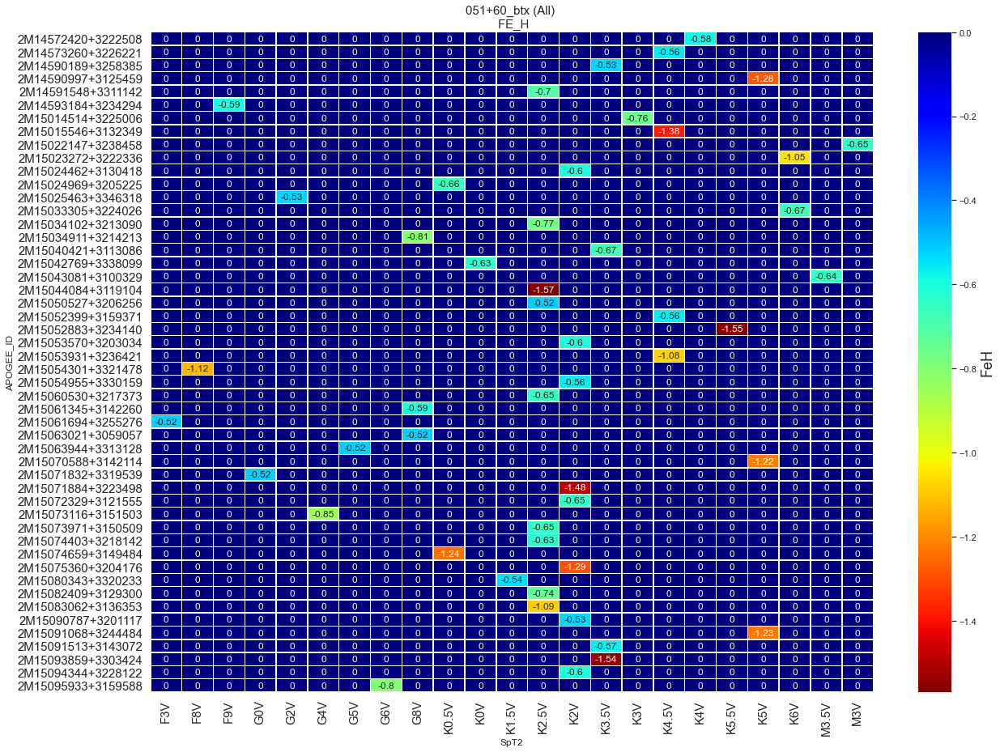

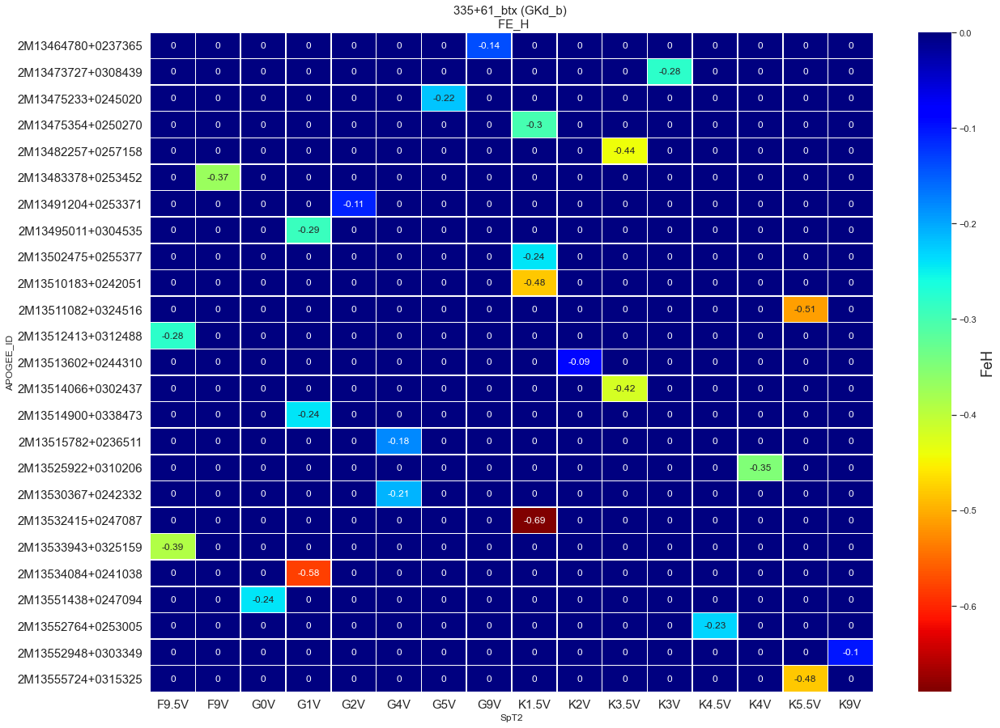

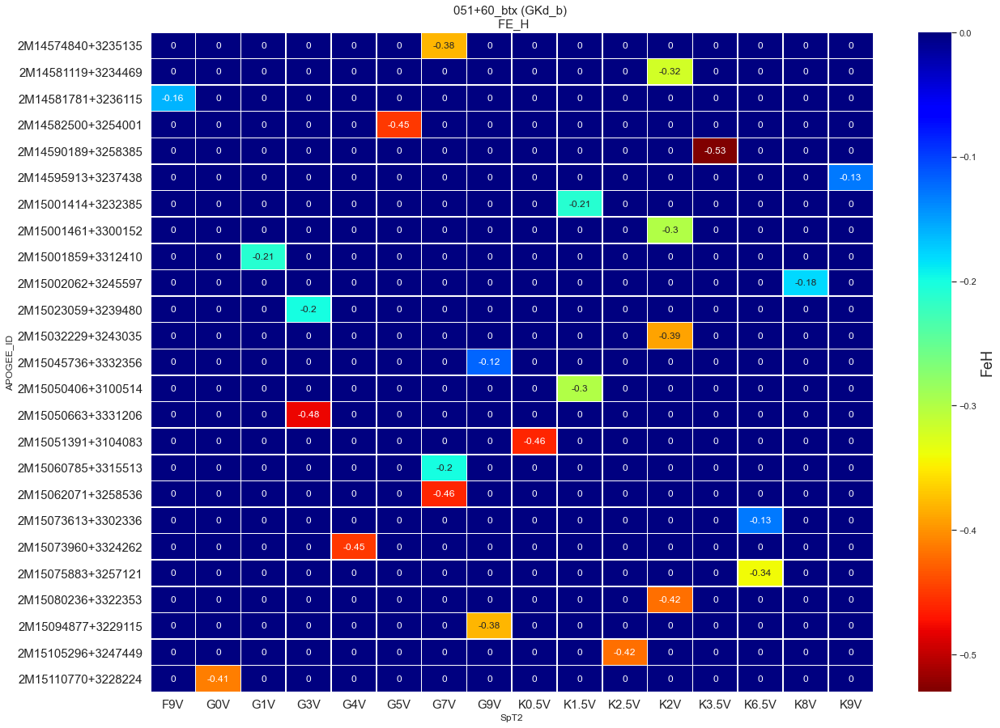

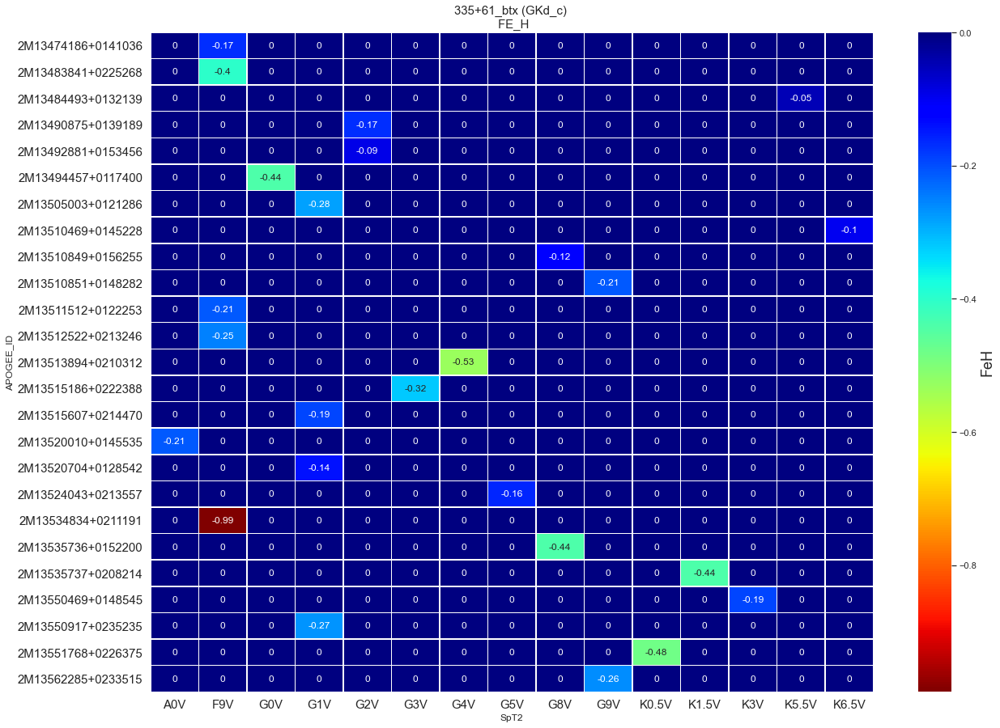

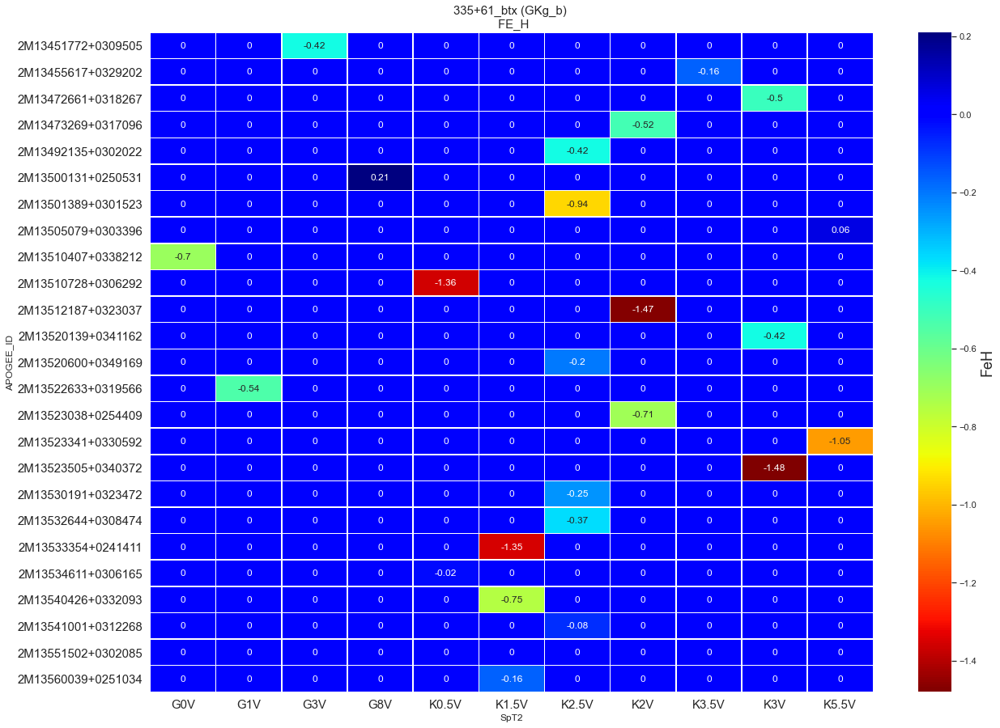

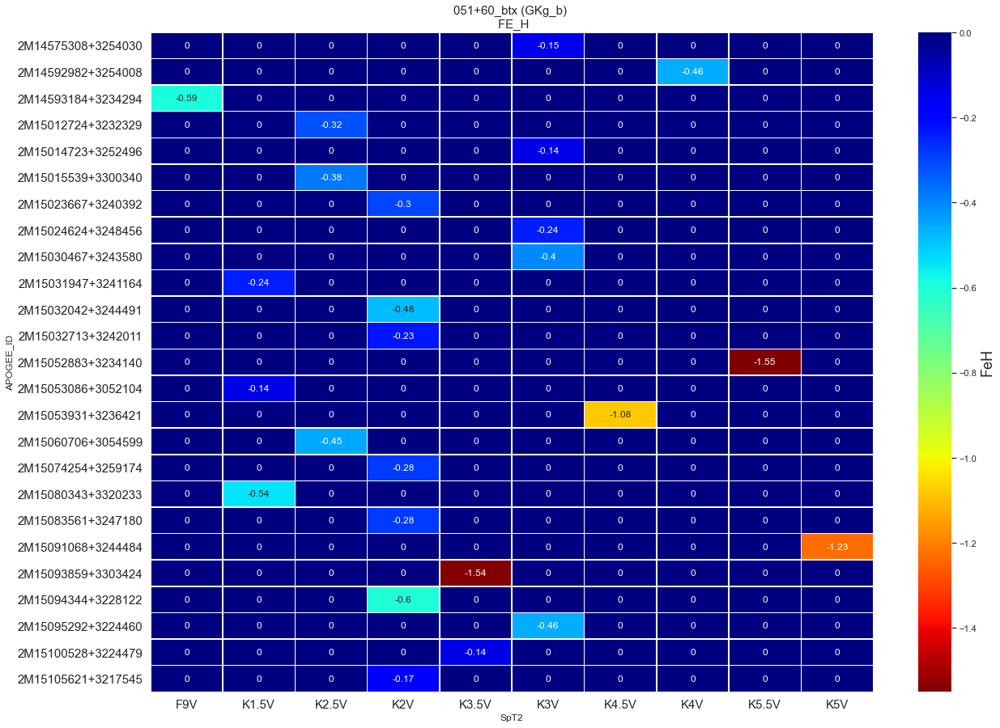

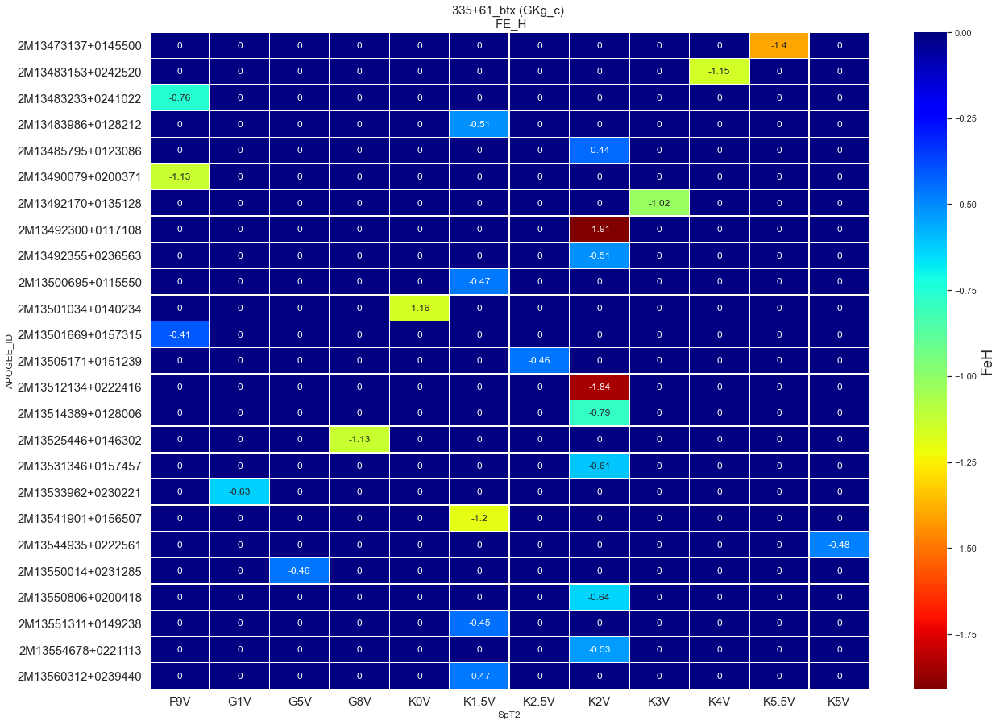

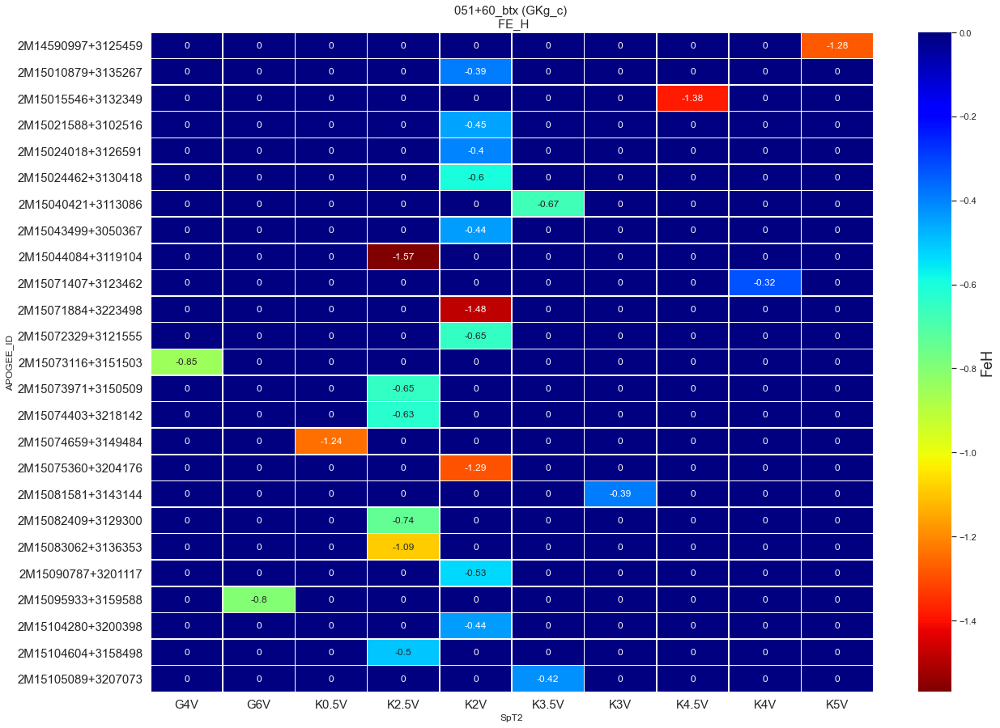

In [33]:
################################################################################
print("Plot 151")

def HeatmapFeh(rAscap):
    
    idx1 = s1['FE_H'] > -9999
    dfs1 = s1[idx1]
    dfs1['FE_H_round'] = round(dfs1['FE_H'], 2)
    if rAscap == 'All':
        dfs3 = dfs1
    else:
        idx2 = dfs1['ASPCAP_CLASS'] == rAscap
        dfs3 = dfs1[idx2]
    
    dfs3 = dfs3.sort_values(by=['FE_H'], ascending=True)
    
    dfs2 = dfs3.drop_duplicates(subset=['APOGEE_ID'], keep='first')
    
    if dfs2.shape[0] > 25:
        if dfs2.shape[0] > 50:
            df_list = dfs2[:50]
        else:
            df_list = dfs2[:25]
        df_list = df_list.sort_values(by=['APOGEE_ID'], ascending=True)
        #print("df_list1: " + str(df_list))
        s1_temp = df_list.pivot(index='APOGEE_ID', columns='SpT2', values='FE_H_round')
        result = s1_temp.fillna(value=0)
        sns.set()
        # Draw a heatmap with the numeric values in each cell
        f, ax = plt.subplots(figsize=(20, 15))
        plt.title(str(st1) + ' (' + str(rAscap) + ') '  + "\n FE_H", fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        heat_map = sns.heatmap(result, annot=True, fmt="g", cmap='jet_r', linewidths=.5, ax=ax,
                    cbar_kws={'label': 'FeH'})
        heat_map.figure.axes[-1].yaxis.label.set_size(18)
        plt.show()
    

    idx1 = s2['FE_H'] > -9999
    dfs1 = s2[idx1]
    dfs1['FE_H_round'] = round(dfs1['FE_H'], 2)
    if rAscap == 'All':
        dfs3 = dfs1
    else:
        idx2 = dfs1['ASPCAP_CLASS'] == rAscap
        dfs3 = dfs1[idx2]
    
    dfs3 = dfs3.sort_values(by=['FE_H'], ascending=True)
    
    dfs2 = dfs3.drop_duplicates(subset=['APOGEE_ID'], keep='first')
    
    if dfs2.shape[0] > 25:
        if dfs2.shape[0] > 50:
            df_list = dfs2[:50]
        else:
            df_list = dfs2[:25]
        df_list = df_list.sort_values(by=['APOGEE_ID'], ascending=True)
        #print("df_list2: " + str(df_list))
        s1_temp = df_list.pivot(index='APOGEE_ID', columns='SpT2', values='FE_H_round')
        result = s1_temp.fillna(value=0)
        sns.set()
        # Draw a heatmap with the numeric values in each cell
        f, ax = plt.subplots(figsize=(20, 15))
        plt.title(str(st2) + ' (' + str(rAscap) + ') '  + "\n FE_H", fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        heat_map = sns.heatmap(result, annot=True, fmt="g", cmap='jet_r', linewidths=.5, ax=ax,
                    cbar_kws={'label': 'FeH'})
        heat_map.figure.axes[-1].yaxis.label.set_size(18)
        plt.show()
    
rAscap = 'All'
HeatmapFeh(rAscap)
rAscap = 'Fd_a'
HeatmapFeh(rAscap)
rAscap = 'Fd_b'
HeatmapFeh(rAscap)
rAscap = 'Fd_c'
HeatmapFeh(rAscap)
rAscap = 'Fd_d'
HeatmapFeh(rAscap)

rAscap = 'GKd_a'
HeatmapFeh(rAscap)
rAscap = 'GKd_b'
HeatmapFeh(rAscap)
rAscap = 'GKd_c'
HeatmapFeh(rAscap)
rAscap = 'GKd_d'
HeatmapFeh(rAscap)

rAscap = 'GKg_a'
HeatmapFeh(rAscap)
rAscap = 'GKg_b'
HeatmapFeh(rAscap)
rAscap = 'GKg_c'
HeatmapFeh(rAscap)
rAscap = 'GKg_d'
HeatmapFeh(rAscap)

rAscap = 'Md_a'
HeatmapFeh(rAscap)
rAscap = 'Md_b'
HeatmapFeh(rAscap)
rAscap = 'Md_c'
HeatmapFeh(rAscap)
rAscap = 'Md_d'
HeatmapFeh(rAscap)

rAscap = 'Mg_a'
HeatmapFeh(rAscap)
rAscap = 'Mg_b'
HeatmapFeh(rAscap)
rAscap = 'Mg_c'
HeatmapFeh(rAscap)
rAscap = 'Mg_d'
HeatmapFeh(rAscap)


Plot 152


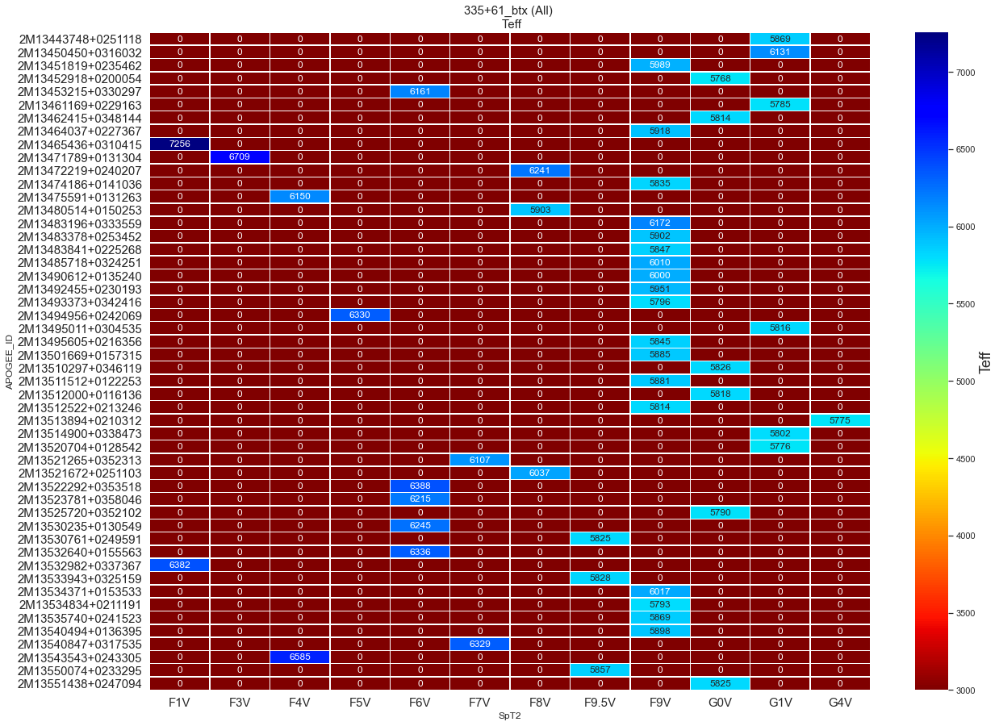

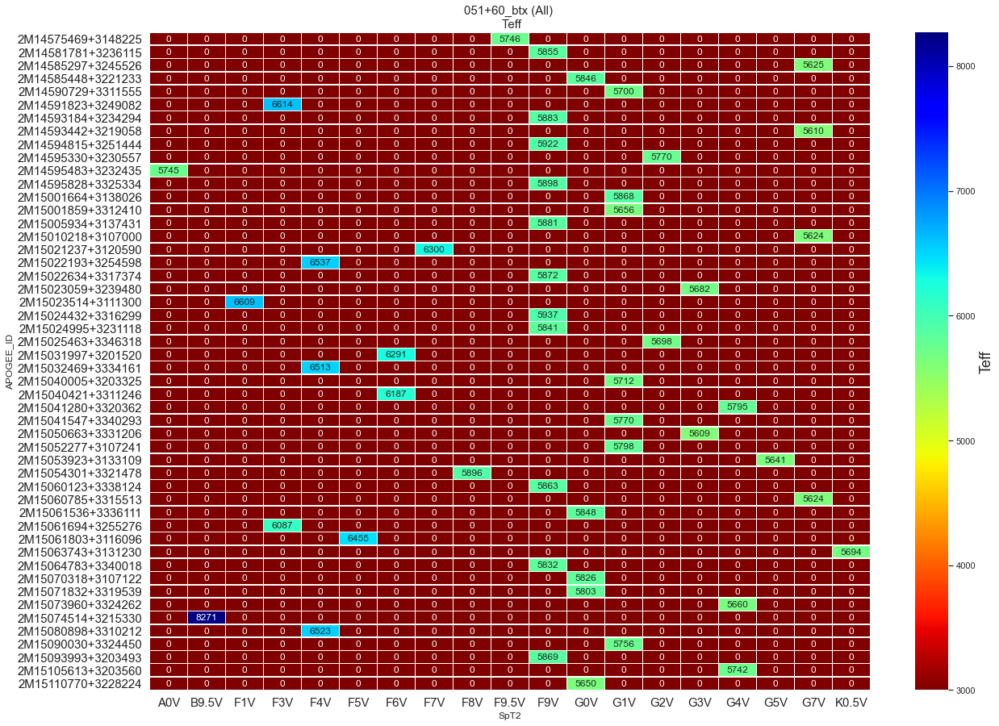

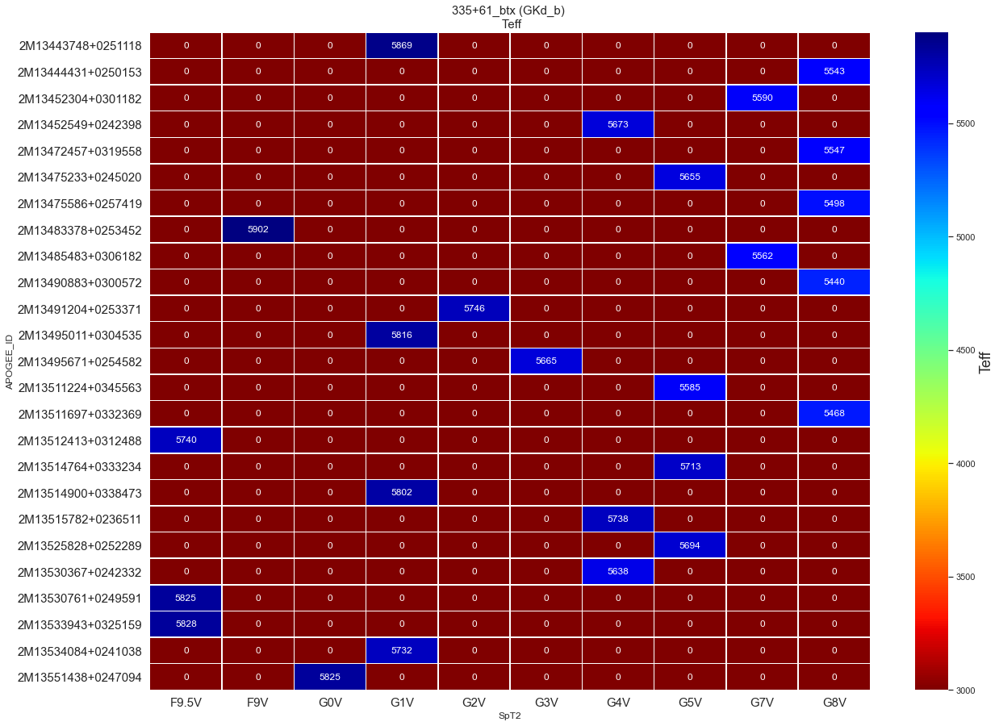

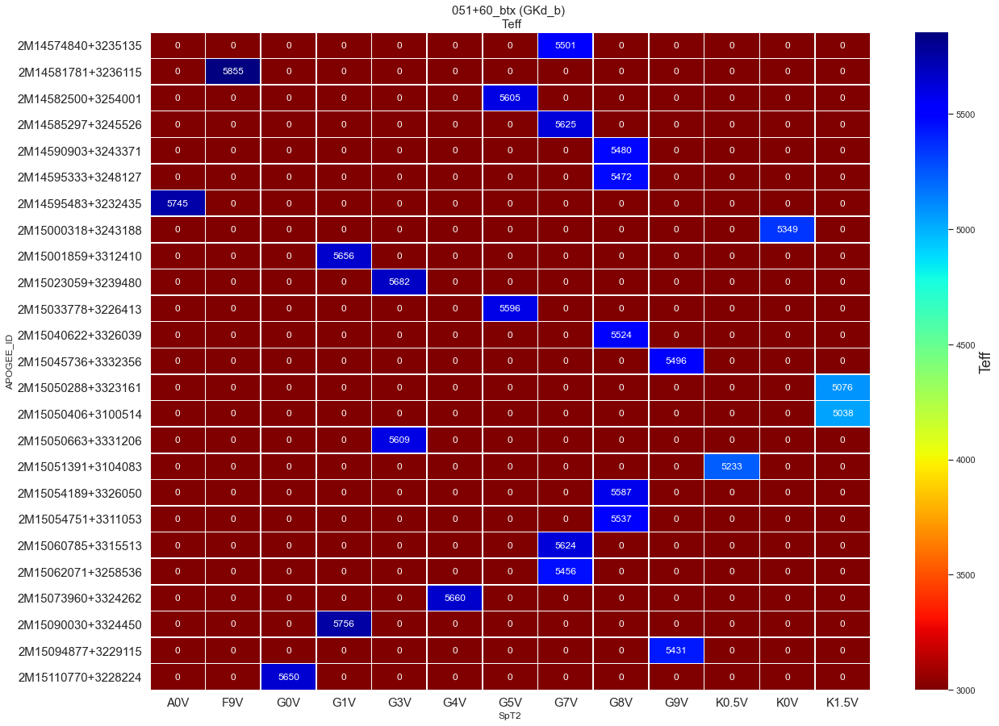

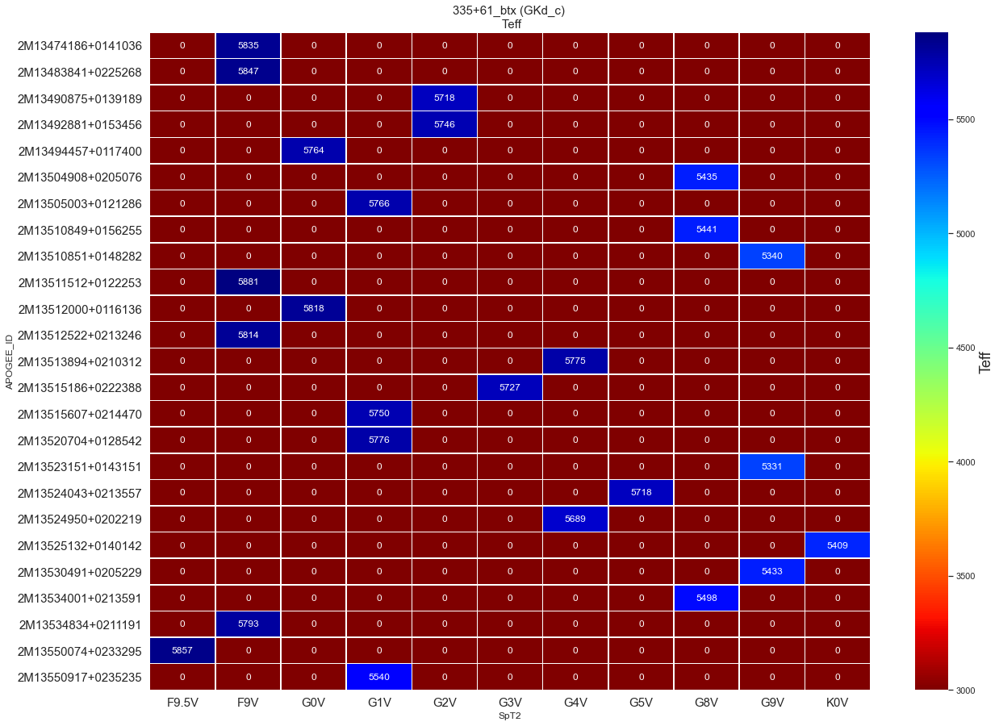

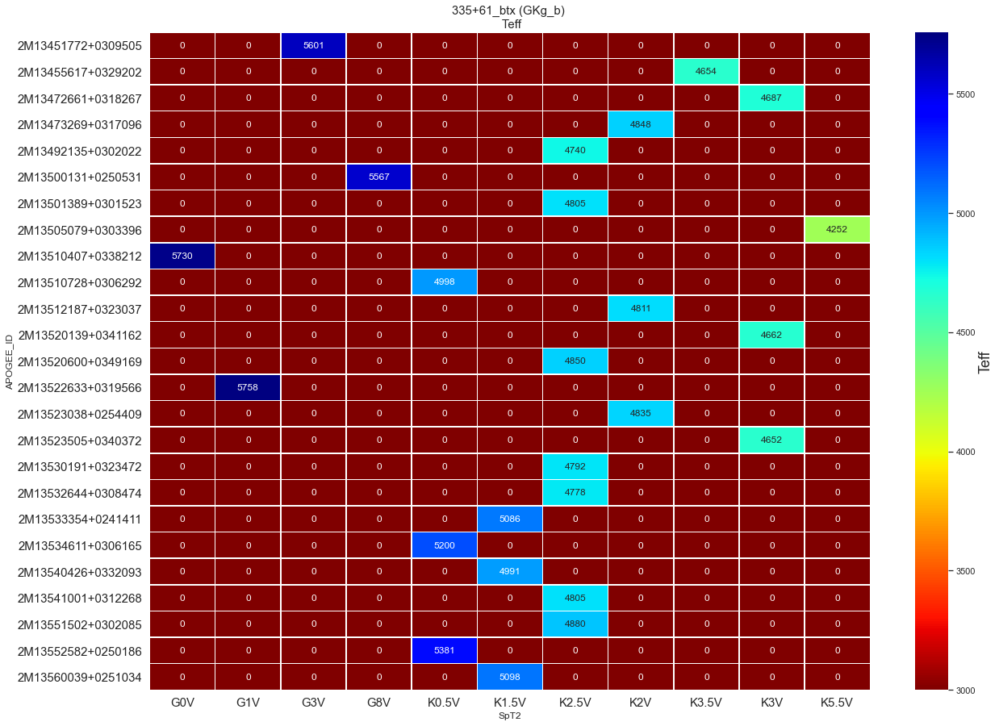

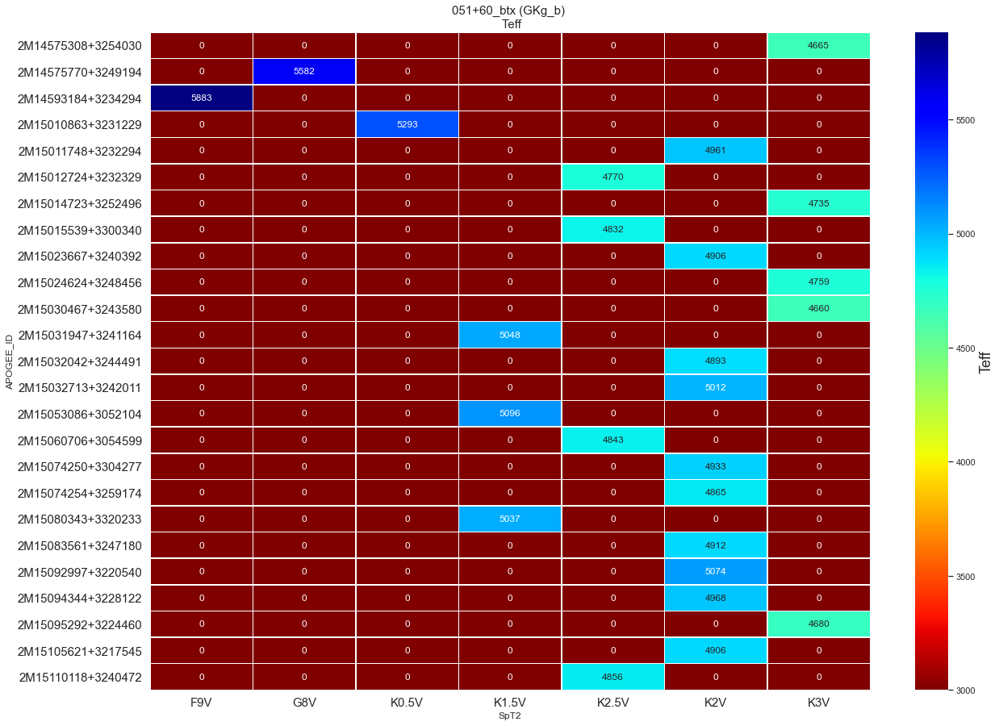

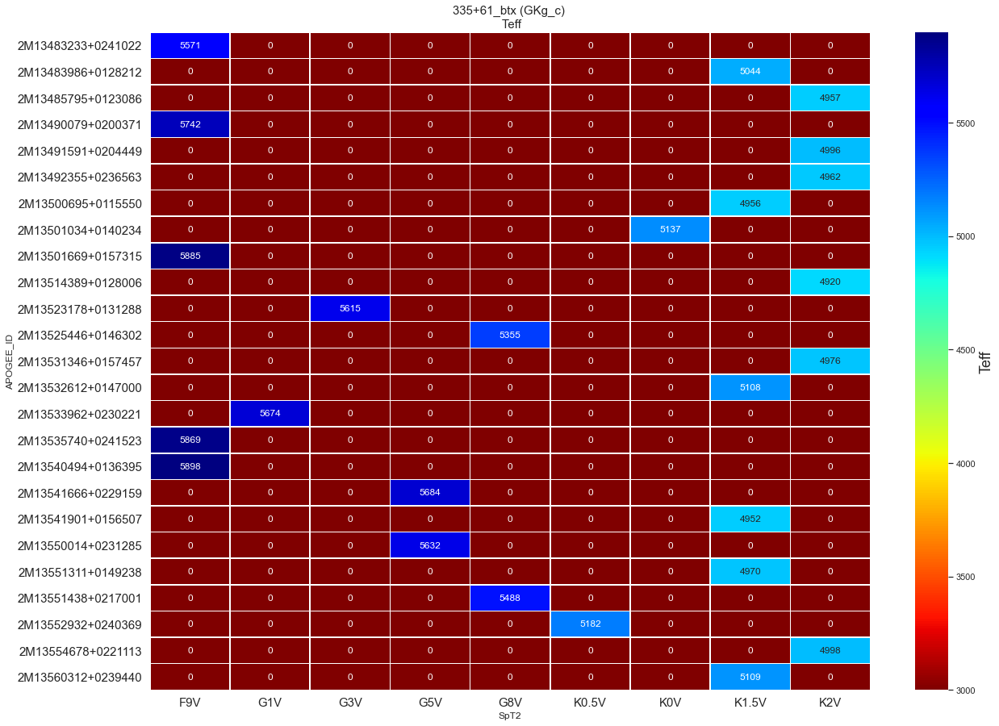

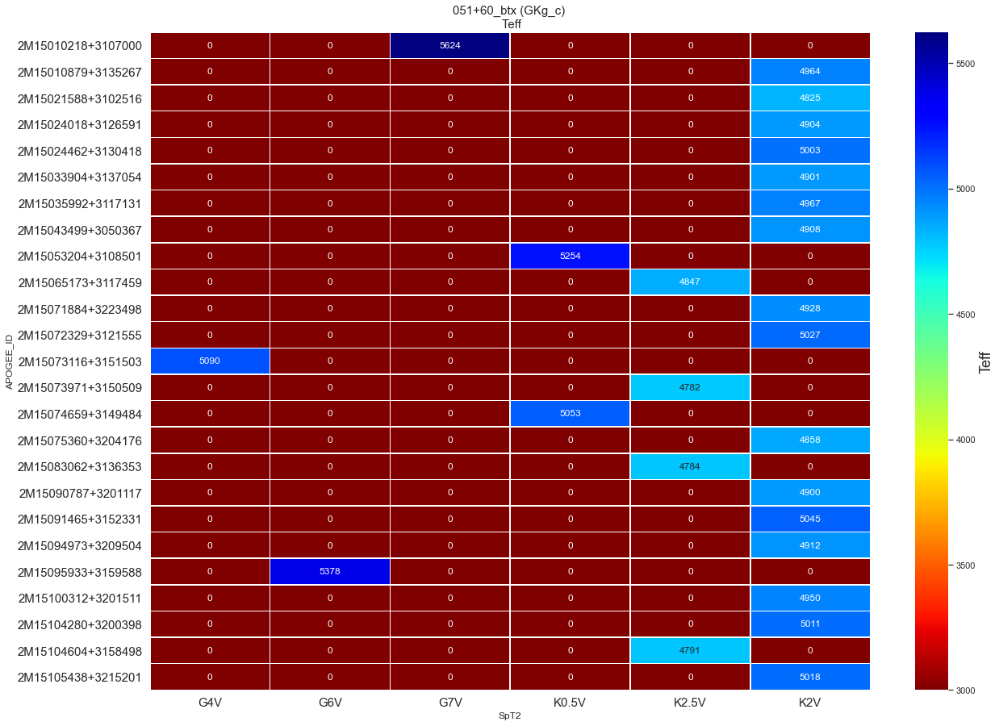

In [34]:
################################################################################
print("Plot 152")

def HeatmapTeff(rAscap):
    idx1 = s1['TEFF'] > -9999
    dfs1 = s1[idx1]
    dfs1['TEFF_round'] = round(dfs1['TEFF'], 0)
    if rAscap == 'All':
        dfs3 = dfs1
    else:
        idx2 = dfs1['ASPCAP_CLASS'] == rAscap
        dfs3 = dfs1[idx2]
    
    dfs3 = dfs3.sort_values(by=['TEFF'], ascending=False)
    
    dfs2 = dfs3.drop_duplicates(subset=['APOGEE_ID'], keep='first')
    
    
    if dfs2.shape[0] > 25:
        if dfs2.shape[0] > 50:
            df_list = dfs2[:50]
        else:
            df_list = dfs2[:25]
        s1_temp = df_list.pivot(index='APOGEE_ID', columns='SpT2', values='TEFF_round') #good
        
        result = s1_temp.fillna(value=0)
        
        import matplotlib.pyplot as plt
        import seaborn as sns  
        sns.set()
        
        # Draw a heatmap with the numeric values in each cell
        f, ax = plt.subplots(figsize=(20, 15))
        
        plt.title(str(st1) + ' (' + str(rAscap) + ') '  + "\n Teff", fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        
        heat_map = sns.heatmap(result, annot=True, fmt="g", cmap='jet_r', linewidths=.5, ax=ax, vmin=3000,
                    cbar_kws={'label': 'Teff'})
        heat_map.figure.axes[-1].yaxis.label.set_size(18)
        plt.show()
        
        
    idx1 = s2['TEFF'] > -9999
    dfs1 = s2[idx1]
    dfs1['TEFF_round'] = round(dfs1['TEFF'], 0)
    if rAscap == 'All':
        dfs3 = dfs1
    else:
        idx2 = dfs1['ASPCAP_CLASS'] == rAscap
        dfs3 = dfs1[idx2]
    
    dfs3 = dfs3.sort_values(by=['TEFF'], ascending=False)
    
    dfs2 = dfs3.drop_duplicates(subset=['APOGEE_ID'], keep='first')
    
    if dfs2.shape[0] > 25:
        if dfs2.shape[0] > 50:
            df_list = dfs2[:50]
        else:
            df_list = dfs2[:25]
        s1_temp = df_list.pivot(index='APOGEE_ID', columns='SpT2', values='TEFF_round') #good
        
        result = s1_temp.fillna(value=0)
        
        import matplotlib.pyplot as plt
        import seaborn as sns  
        sns.set()
        
        # Draw a heatmap with the numeric values in each cell
        f, ax = plt.subplots(figsize=(20, 15))
        
        plt.title(str(st2) + ' (' + str(rAscap) + ') '  + "\n Teff", fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        
        heat_map = sns.heatmap(result, annot=True, fmt="g", cmap='jet_r', linewidths=.5, ax=ax, vmin=3000,
                    cbar_kws={'label': 'Teff'})
        heat_map.figure.axes[-1].yaxis.label.set_size(18)
        plt.show()
        
        
rAscap = 'All'
HeatmapTeff(rAscap)
rAscap = 'Fd_a'
HeatmapTeff(rAscap)
rAscap = 'Fd_b'
HeatmapTeff(rAscap)
rAscap = 'Fd_c'
HeatmapTeff(rAscap)
rAscap = 'Fd_d'
HeatmapTeff(rAscap)

rAscap = 'GKd_a'
HeatmapTeff(rAscap)
rAscap = 'GKd_b'
HeatmapTeff(rAscap)
rAscap = 'GKd_c'
HeatmapTeff(rAscap)
rAscap = 'GKd_d'
HeatmapTeff(rAscap)

rAscap = 'GKg_a'
HeatmapTeff(rAscap)
rAscap = 'GKg_b'
HeatmapTeff(rAscap)
rAscap = 'GKg_c'
HeatmapTeff(rAscap)
rAscap = 'GKg_d'
HeatmapTeff(rAscap)

rAscap = 'Md_a'
HeatmapTeff(rAscap)
rAscap = 'Md_b'
HeatmapTeff(rAscap)
rAscap = 'Md_c'
HeatmapTeff(rAscap)
rAscap = 'Md_d'
HeatmapTeff(rAscap)

rAscap = 'Mg_a'
HeatmapTeff(rAscap)
rAscap = 'Mg_b'
HeatmapTeff(rAscap)
rAscap = 'Mg_c'
HeatmapTeff(rAscap)
rAscap = 'Mg_d'
HeatmapTeff(rAscap)



Plot 153


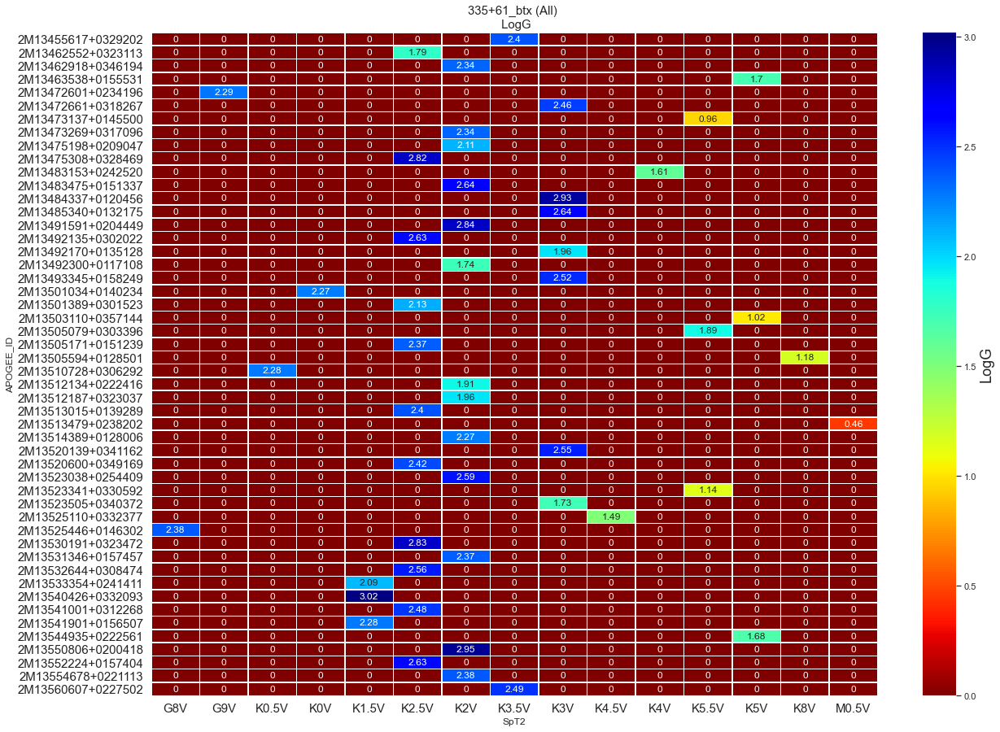

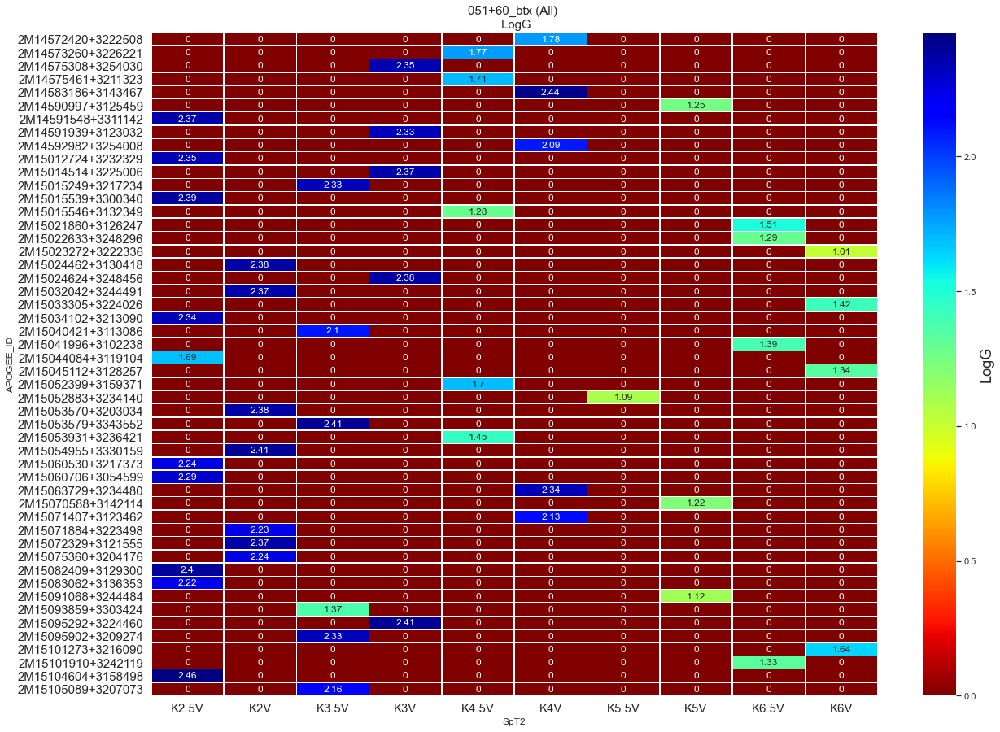

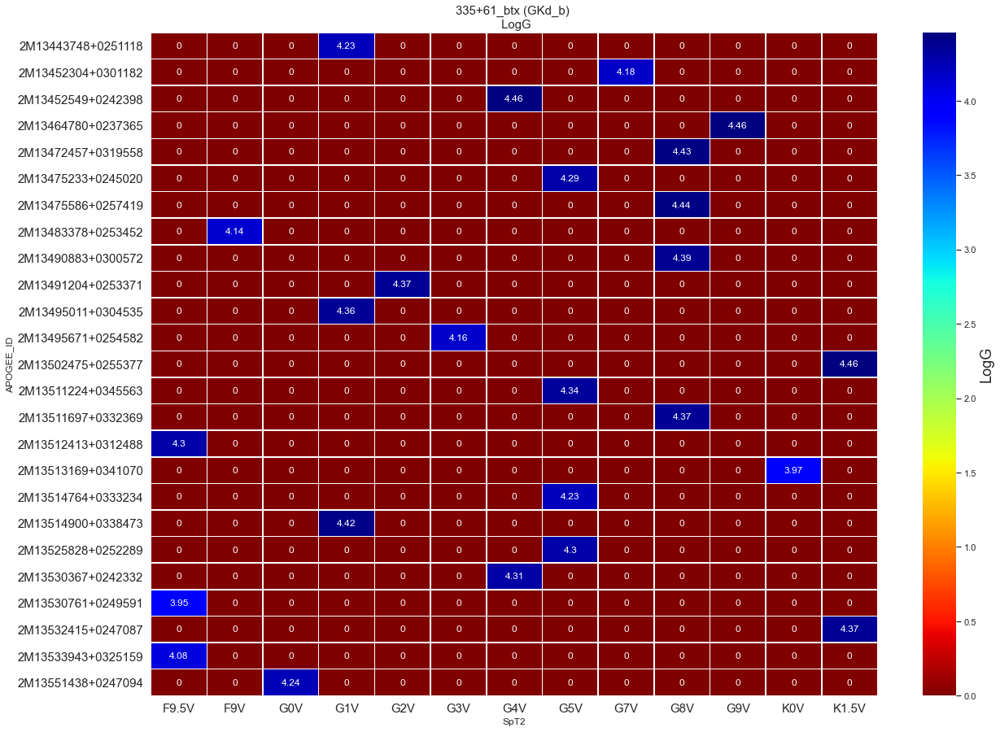

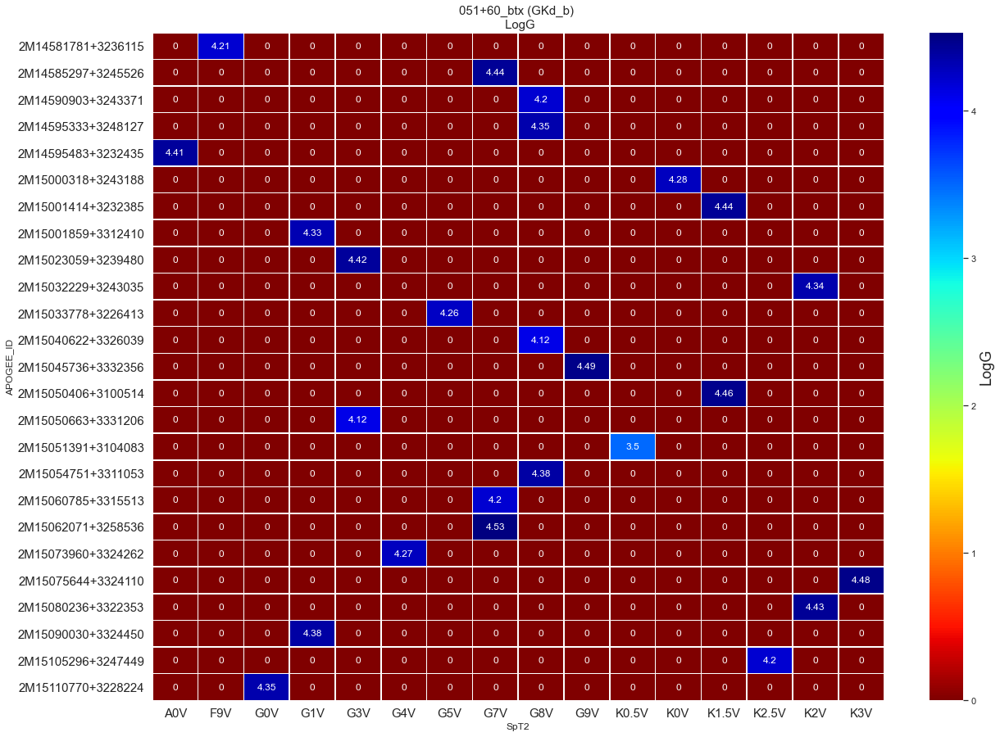

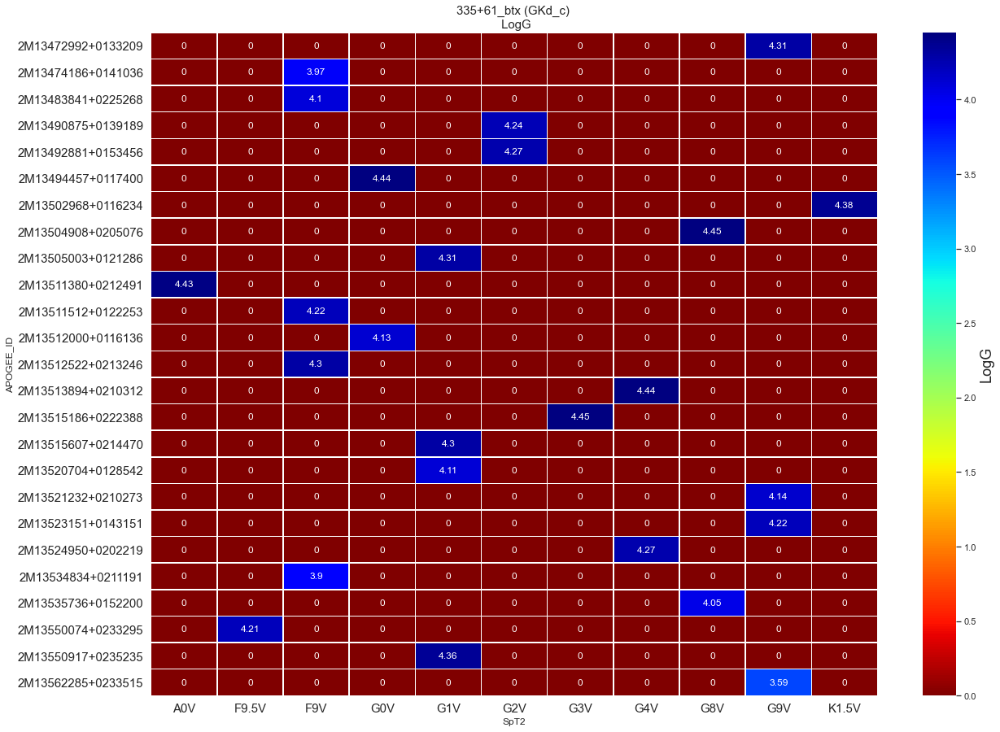

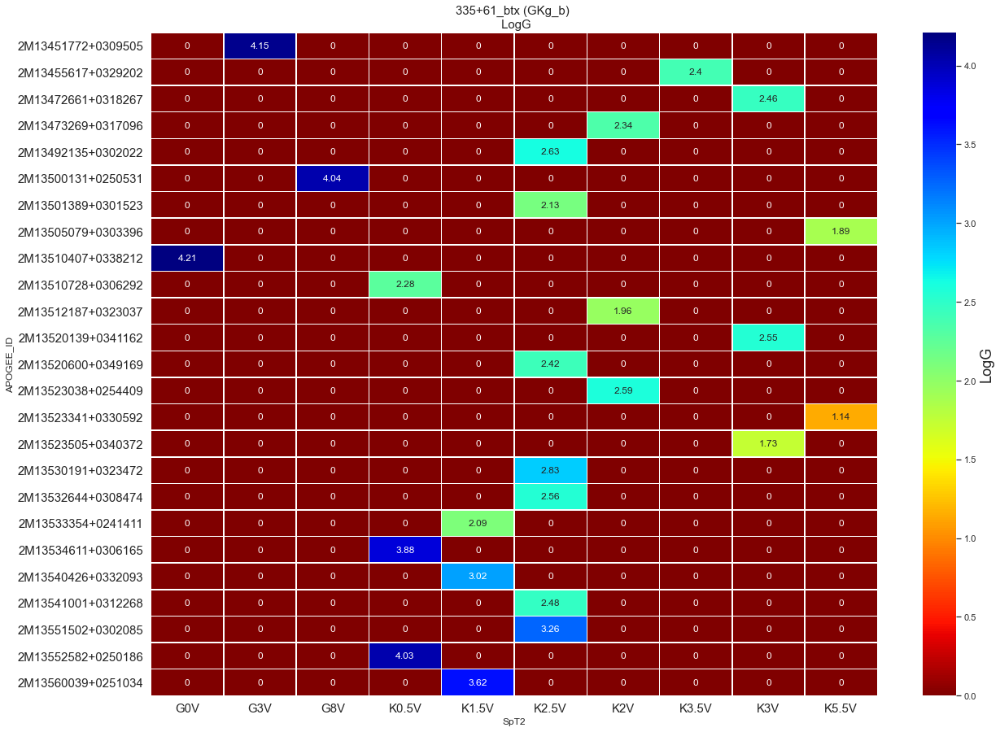

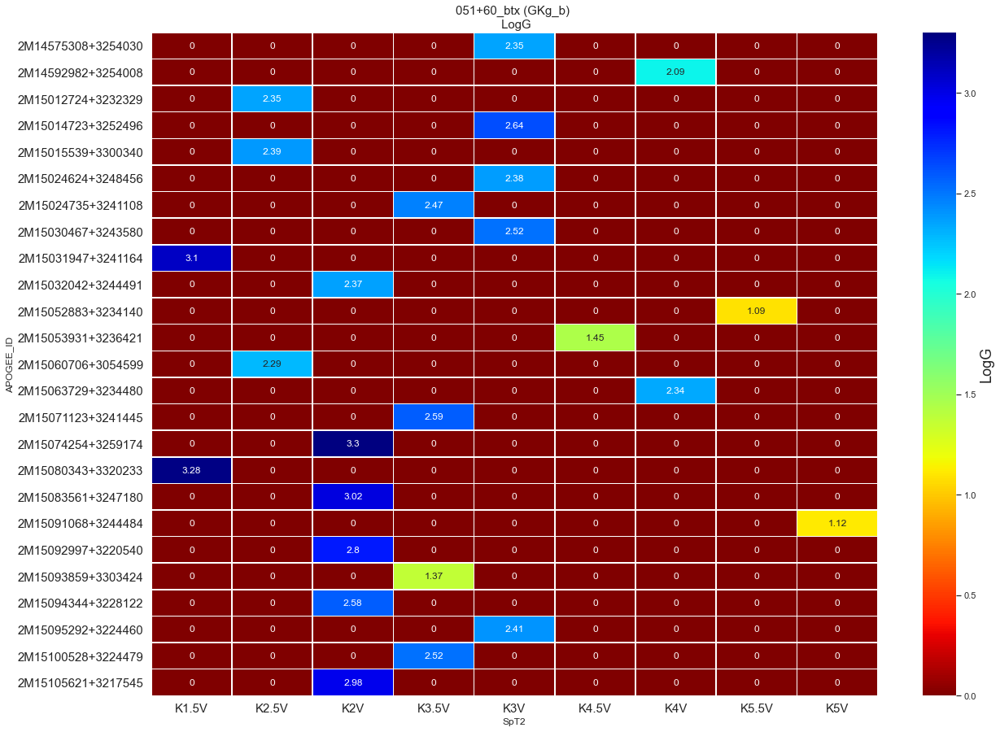

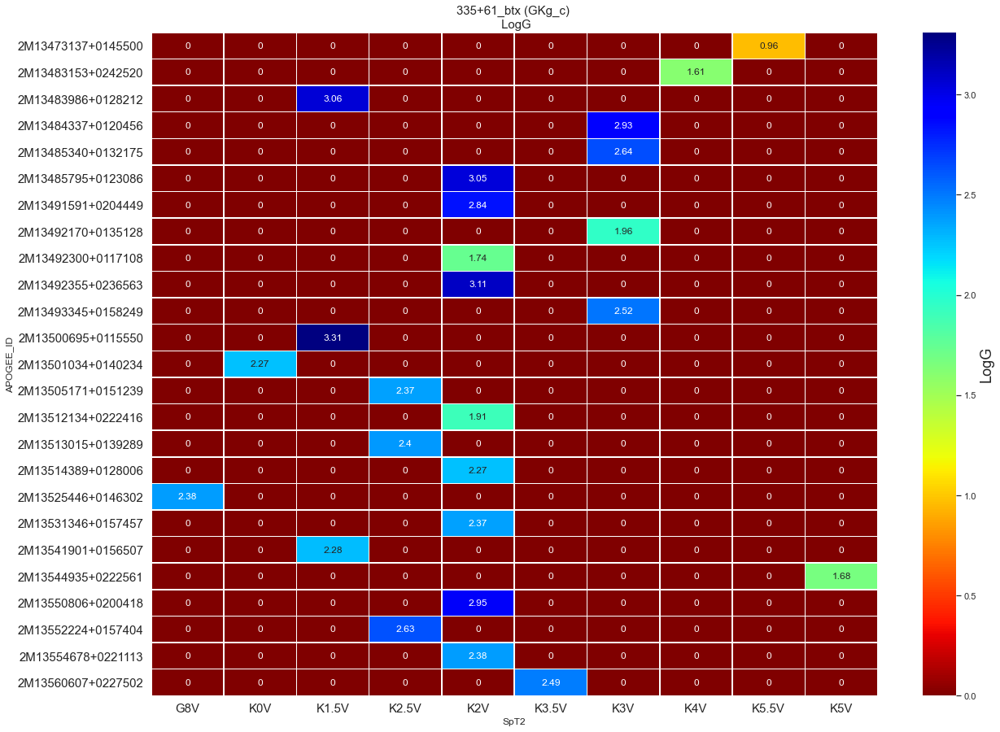

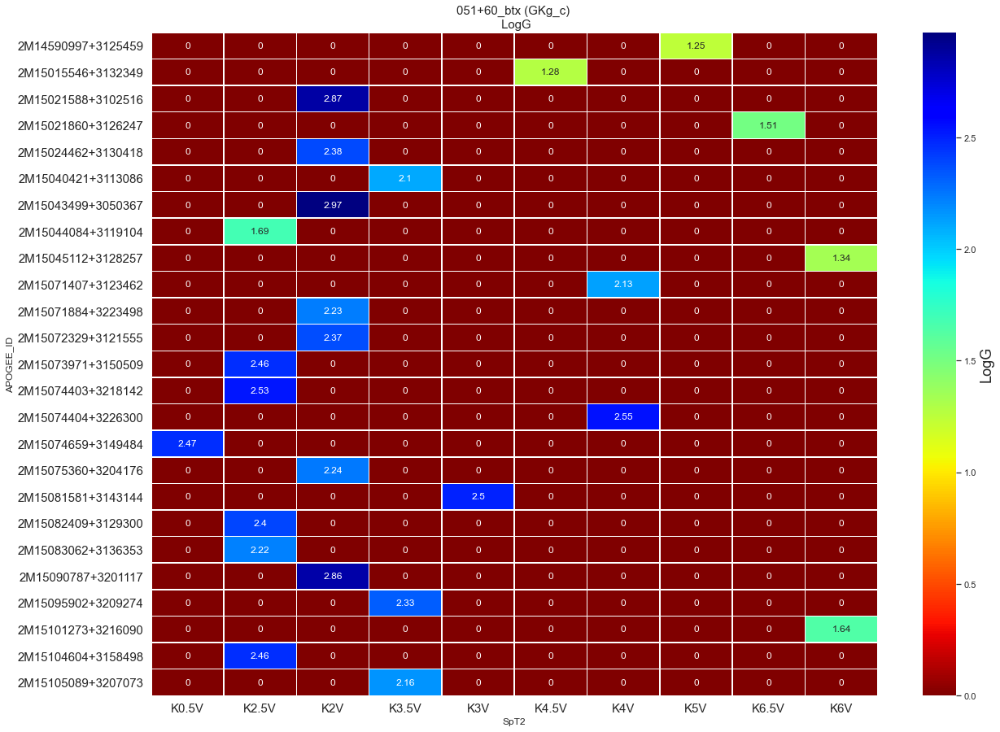

In [35]:
################################################################################
print("Plot 153")

def HeatmapLogg(rAscap):
    idx1 = s1['LOGG'] > -9999
    dfs1 = s1[idx1]
    dfs1['LOGG_round'] = round(dfs1['LOGG'], 2)
    if rAscap == 'All':
        dfs3 = dfs1
    else:
        idx2 = dfs1['ASPCAP_CLASS'] == rAscap
        dfs3 = dfs1[idx2]
    
    dfs3 = dfs3.sort_values(by=['LOGG'], ascending=True)
    
    dfs2 = dfs3.drop_duplicates(subset=['APOGEE_ID'], keep='first')
    
    
    if dfs2.shape[0] > 25:
        if dfs2.shape[0] > 50:
            df_list = dfs2[:50]
        else:
            df_list = dfs2[:25]
        s1_temp = df_list.pivot(index='APOGEE_ID', columns='SpT2', values='LOGG_round') #good
        
        result = s1_temp.fillna(value=0)
        
        import matplotlib.pyplot as plt
        import seaborn as sns  
        sns.set()
        
        # Draw a heatmap with the numeric values in each cell
        f, ax = plt.subplots(figsize=(20, 15))
        
        plt.title(str(st1) + ' (' + str(rAscap) + ') '  + "\n LogG" , fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        
        heat_map = sns.heatmap(result, annot=True, fmt="g", cmap='jet_r', linewidths=.5, ax=ax,
                    cbar_kws={'label': 'LogG'})
        heat_map.figure.axes[-1].yaxis.label.set_size(18)
        plt.show()
        
        
    idx1 = s2['LOGG'] > -9999
    dfs1 = s2[idx1]
    dfs1['LOGG_round'] = round(dfs1['LOGG'], 2)
    if rAscap == 'All':
        dfs3 = dfs1
    else:
        idx2 = dfs1['ASPCAP_CLASS'] == rAscap
        dfs3 = dfs1[idx2]
    
    dfs3 = dfs3.sort_values(by=['LOGG'], ascending=True)
    
    dfs2 = dfs3.drop_duplicates(subset=['APOGEE_ID'], keep='first')
    
    if dfs2.shape[0] > 25:
        if dfs2.shape[0] > 50:
            df_list = dfs2[:50]
        else:
            df_list = dfs2[:25]
        s1_temp = df_list.pivot(index='APOGEE_ID', columns='SpT2', values='LOGG_round') #good
        
        result = s1_temp.fillna(value=0)
        
        import matplotlib.pyplot as plt
        import seaborn as sns  
        sns.set()
        
        # Draw a heatmap with the numeric values in each cell
        f, ax = plt.subplots(figsize=(20, 15))
        
        plt.title(str(st2) + ' (' + str(rAscap) + ') '  + "\n LogG" , fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        
        heat_map = sns.heatmap(result, annot=True, fmt="g", cmap='jet_r', linewidths=.5, ax=ax,
                    cbar_kws={'label': 'LogG'})
        heat_map.figure.axes[-1].yaxis.label.set_size(18)
        plt.show()


rAscap = 'All'
HeatmapLogg(rAscap)
rAscap = 'Fd_a'
HeatmapLogg(rAscap)
rAscap = 'Fd_b'
HeatmapLogg(rAscap)
rAscap = 'Fd_c'
HeatmapLogg(rAscap)
rAscap = 'Fd_d'
HeatmapLogg(rAscap)

rAscap = 'GKd_a'
HeatmapLogg(rAscap)
rAscap = 'GKd_b'
HeatmapLogg(rAscap)
rAscap = 'GKd_c'
HeatmapLogg(rAscap)
rAscap = 'GKd_d'
HeatmapLogg(rAscap)

rAscap = 'GKg_a'
HeatmapLogg(rAscap)
rAscap = 'GKg_b'
HeatmapLogg(rAscap)
rAscap = 'GKg_c'
HeatmapLogg(rAscap)
rAscap = 'GKg_d'
HeatmapLogg(rAscap)

rAscap = 'Md_a'
HeatmapLogg(rAscap)
rAscap = 'Md_b'
HeatmapLogg(rAscap)
rAscap = 'Md_c'
HeatmapLogg(rAscap)
rAscap = 'Md_d'
HeatmapLogg(rAscap)

rAscap = 'Mg_a'
HeatmapLogg(rAscap)
rAscap = 'Mg_b'
HeatmapLogg(rAscap)
rAscap = 'Mg_c'
HeatmapLogg(rAscap)
rAscap = 'Mg_d'
HeatmapLogg(rAscap)

Plot 154


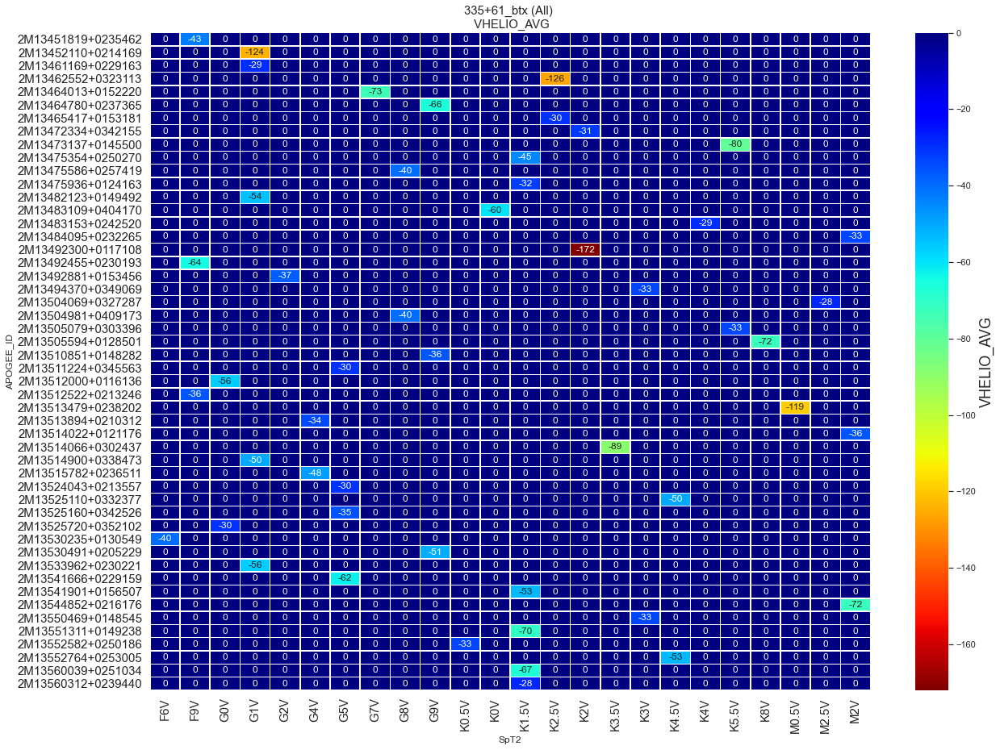

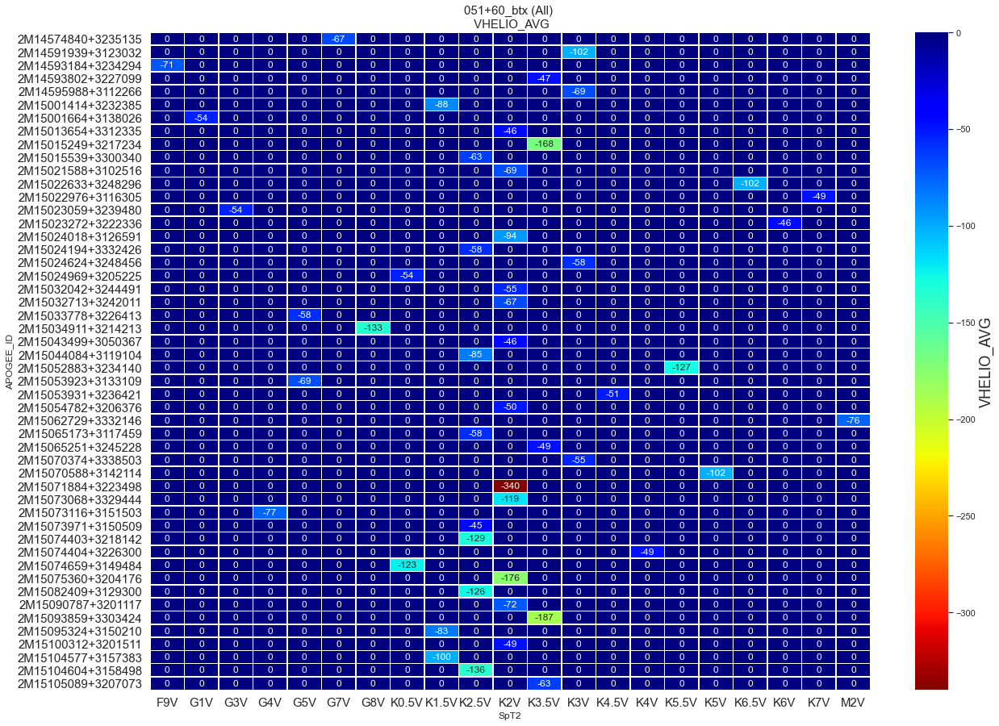

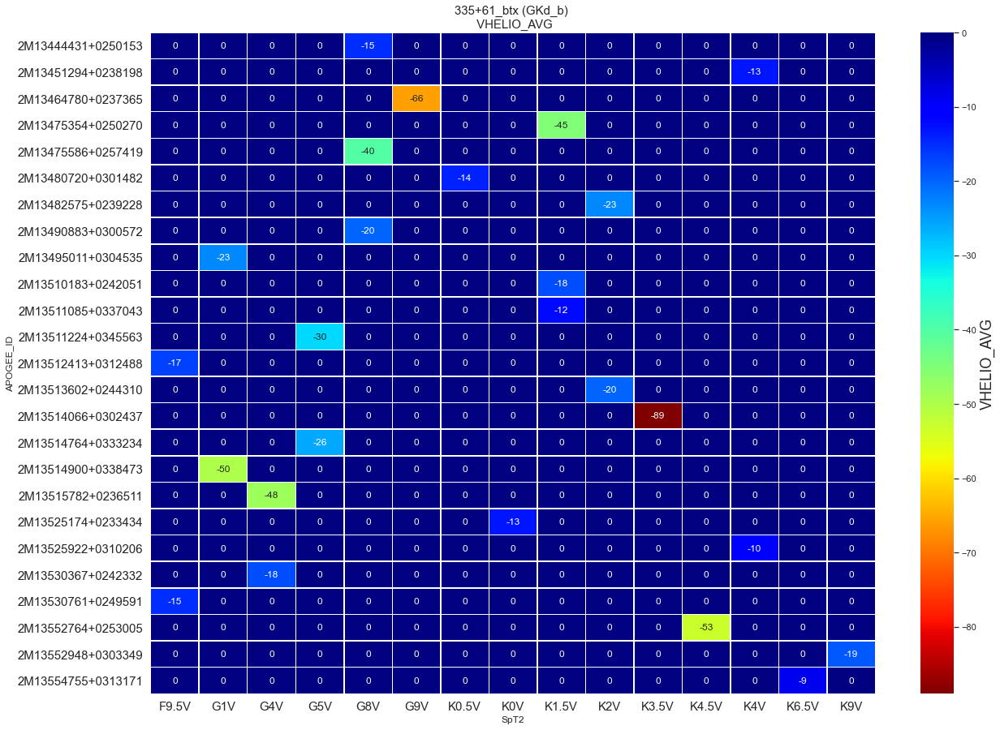

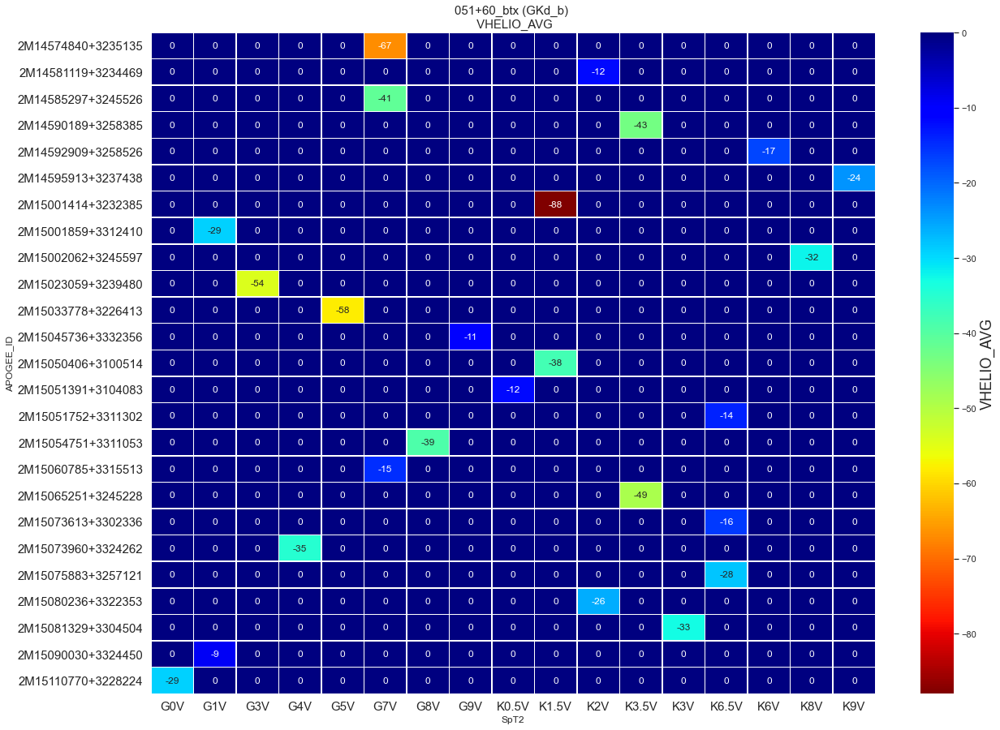

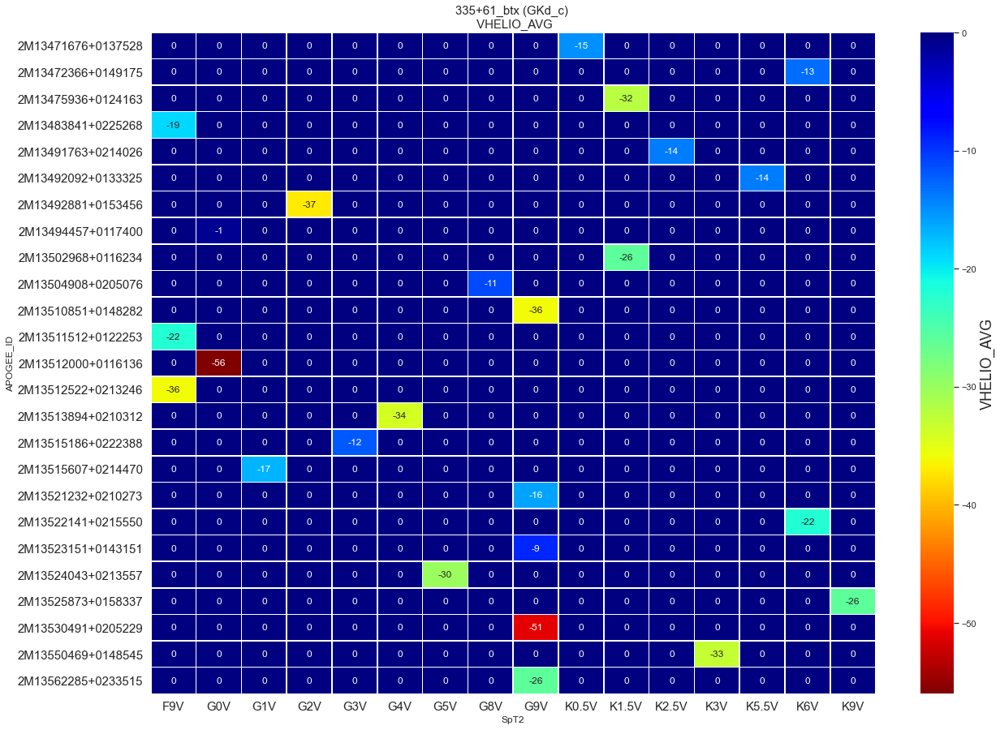

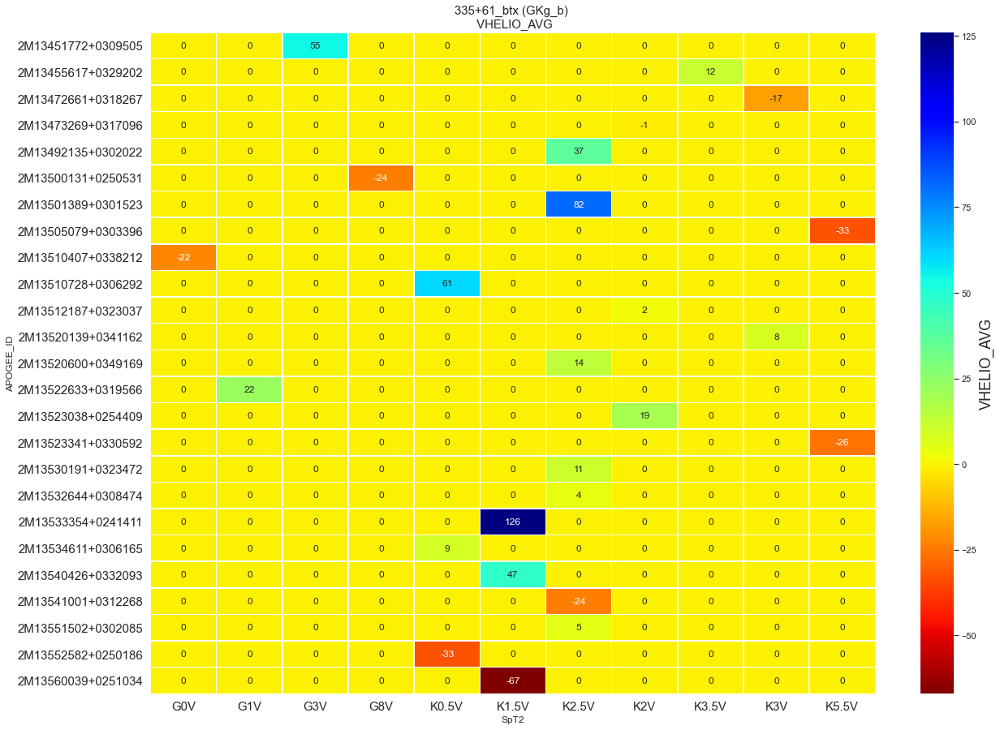

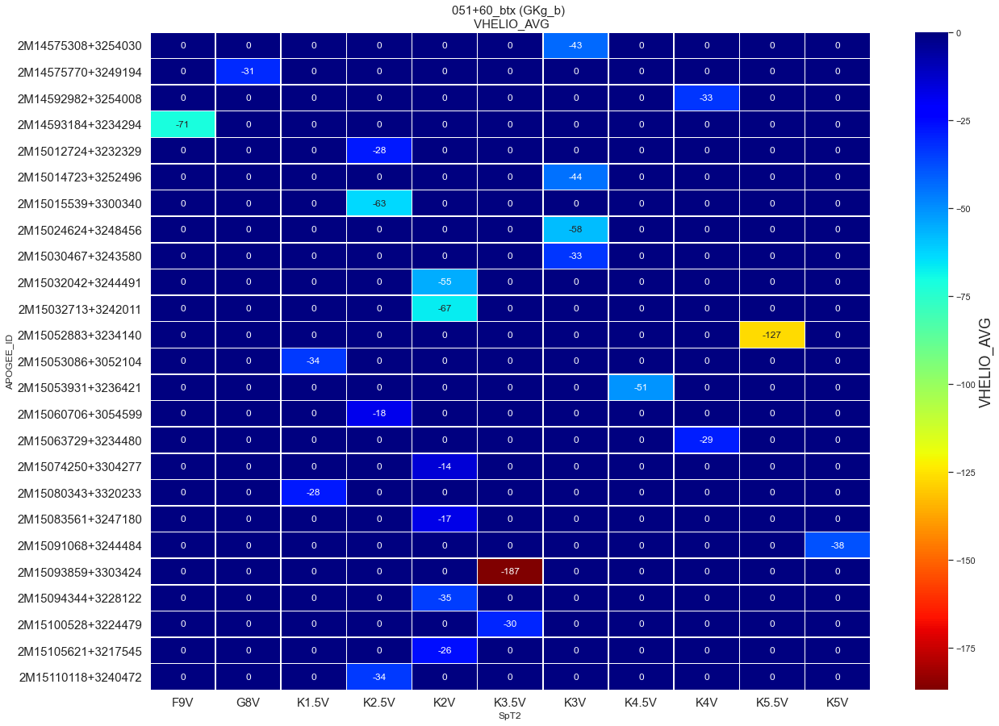

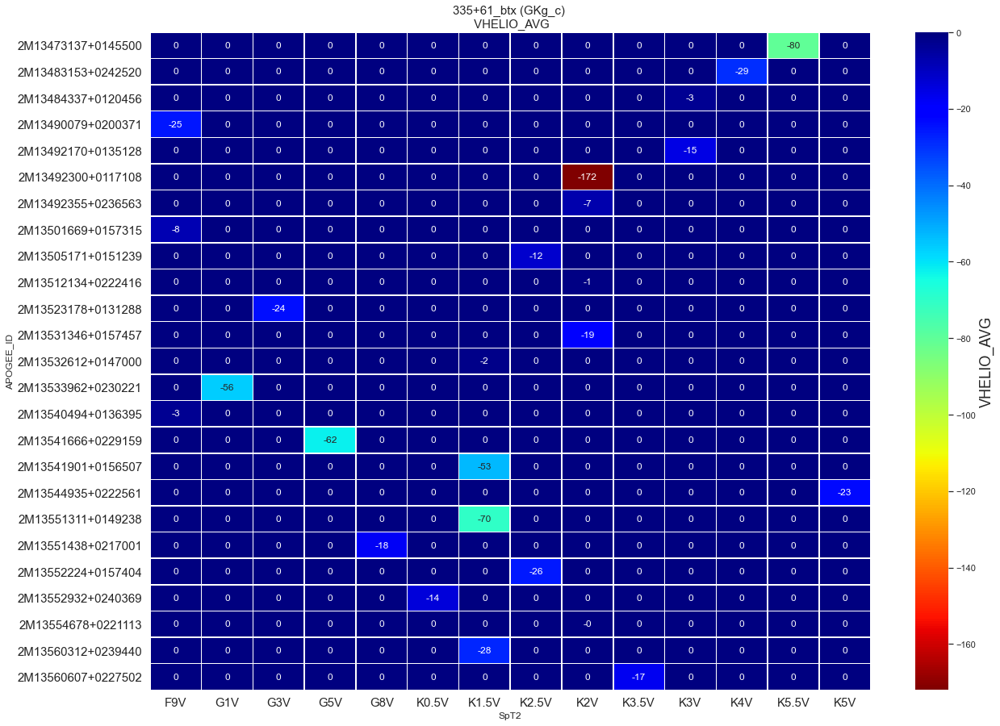

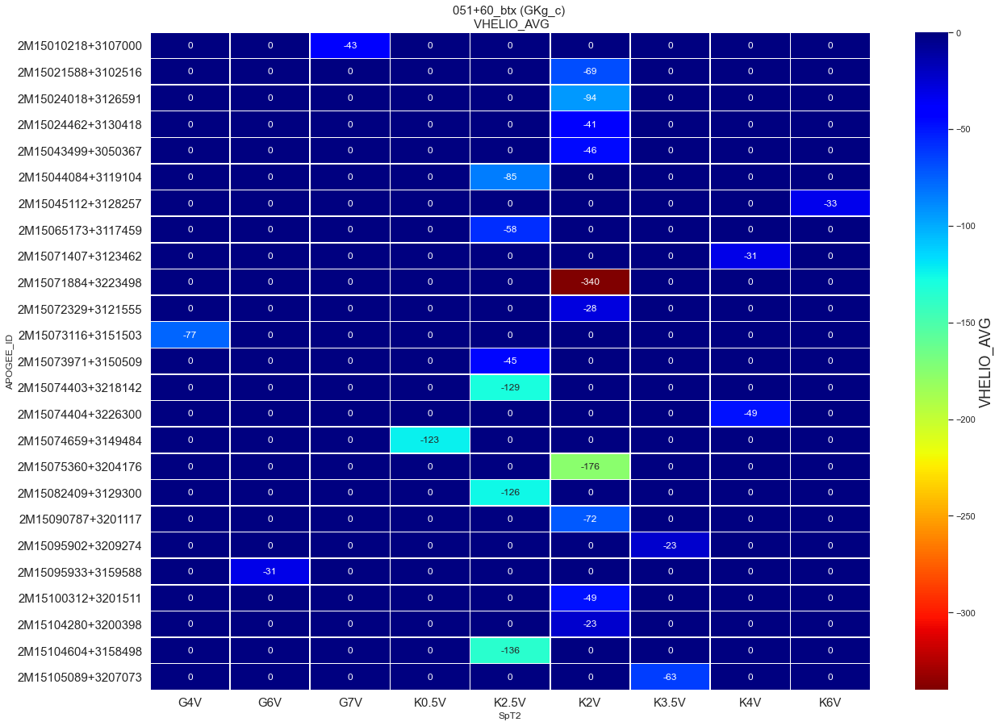

In [36]:
################################################################################
print("Plot 154")

def HeatmapVhelio(rAscap):
    idx1 = s1['VHELIO_AVG'] > -9999
    dfs1 = s1[idx1]
    dfs1['VHELIO_AVG_round'] = round(dfs1['VHELIO_AVG'], 0)
    if rAscap == 'All':
        dfs3 = dfs1
    else:
        idx2 = dfs1['ASPCAP_CLASS'] == rAscap
        dfs3 = dfs1[idx2]
    
    dfs3 = dfs3.sort_values(by=['VHELIO_AVG'], ascending=True)
    
    dfs2 = dfs3.drop_duplicates(subset=['APOGEE_ID'], keep='first')
    
    if dfs2.shape[0] > 25:
        if dfs2.shape[0] > 50:
            df_list = dfs2[:50]
        else:
            df_list = dfs2[:25]
        s1_temp = df_list.pivot(index='APOGEE_ID', columns='SpT2', values='VHELIO_AVG_round') #good
    
        
        result = s1_temp.fillna(value=0)
        
        import matplotlib.pyplot as plt
        import seaborn as sns  
        sns.set()
        
        # Draw a heatmap with the numeric values in each cell
        f, ax = plt.subplots(figsize=(20, 15))
        
        plt.title(str(st1) + ' (' + str(rAscap) + ') '  + "\n VHELIO_AVG" , fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        
        heat_map = sns.heatmap(result, annot=True, fmt="g",  cmap='jet_r', linewidths=.5, ax=ax,
                                cbar_kws={'label': 'VHELIO_AVG'})
        heat_map.figure.axes[-1].yaxis.label.set_size(18)
        
        plt.show()


    idx1 = s2['VHELIO_AVG'] > -9999
    dfs1 = s2[idx1]
    dfs1['VHELIO_AVG_round'] = round(dfs1['VHELIO_AVG'], 0)
    if rAscap == 'All':
        dfs3 = dfs1
    else:
        idx2 = dfs1['ASPCAP_CLASS'] == rAscap
        dfs3 = dfs1[idx2]
    
    dfs3 = dfs3.sort_values(by=['VHELIO_AVG'], ascending=True)
    
    dfs2 = dfs3.drop_duplicates(subset=['APOGEE_ID'], keep='first')
    
    if dfs2.shape[0] > 25:
        if dfs2.shape[0] > 50:
            df_list = dfs2[:50]
        else:
            df_list = dfs2[:25]
        s1_temp = df_list.pivot(index='APOGEE_ID', columns='SpT2', values='VHELIO_AVG_round') #good
        
        result = s1_temp.fillna(value=0)
        
        import matplotlib.pyplot as plt
        import seaborn as sns  
        sns.set()
        
        # Draw a heatmap with the numeric values in each cell
        f, ax = plt.subplots(figsize=(20, 15))
        
        plt.title(str(st2) + ' (' + str(rAscap) + ') '  + "\n VHELIO_AVG" , fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        
        heat_map = sns.heatmap(result, annot=True, fmt="g",  cmap='jet_r', linewidths=.5, ax=ax,
                                cbar_kws={'label': 'VHELIO_AVG'})
        heat_map.figure.axes[-1].yaxis.label.set_size(18)
        
        plt.show()
        



rAscap = 'All'
HeatmapVhelio(rAscap)
rAscap = 'Fd_a'
HeatmapVhelio(rAscap)
rAscap = 'Fd_b'
HeatmapVhelio(rAscap)
rAscap = 'Fd_c'
HeatmapVhelio(rAscap)
rAscap = 'Fd_d'
HeatmapVhelio(rAscap)

rAscap = 'GKd_a'
HeatmapVhelio(rAscap)
rAscap = 'GKd_b'
HeatmapVhelio(rAscap)
rAscap = 'GKd_c'
HeatmapVhelio(rAscap)
rAscap = 'GKd_d'
HeatmapVhelio(rAscap)

rAscap = 'GKg_a'
HeatmapVhelio(rAscap)
rAscap = 'GKg_b'
HeatmapVhelio(rAscap)
rAscap = 'GKg_c'
HeatmapVhelio(rAscap)
rAscap = 'GKg_d'
HeatmapVhelio(rAscap)

rAscap = 'Md_a'
HeatmapVhelio(rAscap)
rAscap = 'Md_b'
HeatmapVhelio(rAscap)
rAscap = 'Md_c'
HeatmapVhelio(rAscap)
rAscap = 'Md_d'
HeatmapVhelio(rAscap)

rAscap = 'Mg_a'
HeatmapVhelio(rAscap)
rAscap = 'Mg_b'
HeatmapVhelio(rAscap)
rAscap = 'Mg_c'
HeatmapVhelio(rAscap)
rAscap = 'Mg_d'
HeatmapVhelio(rAscap)

Plot 155


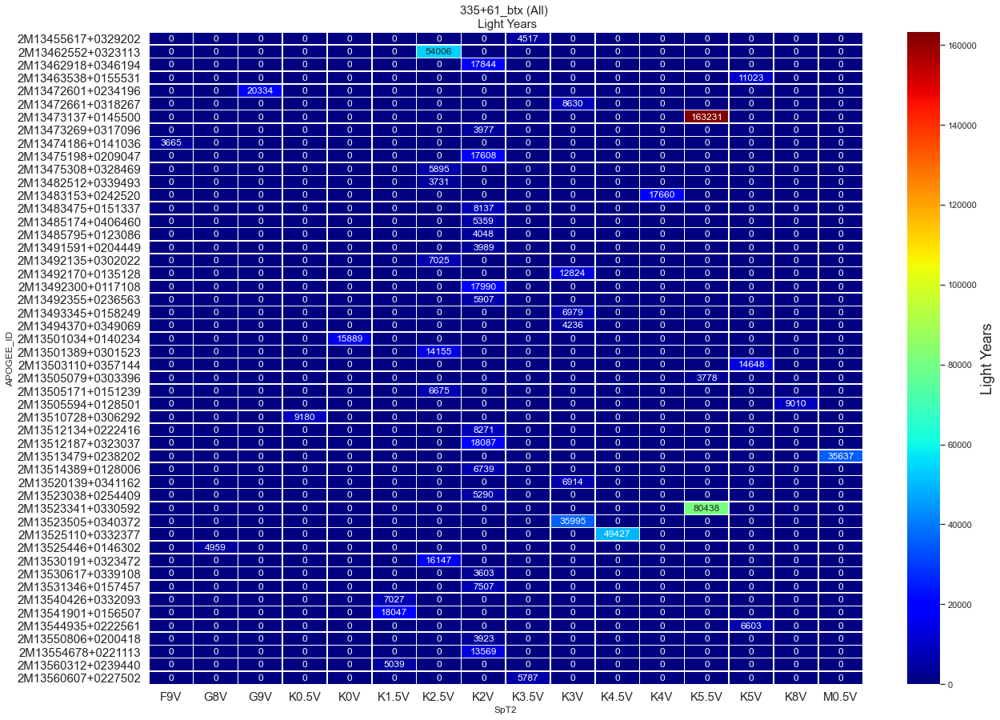

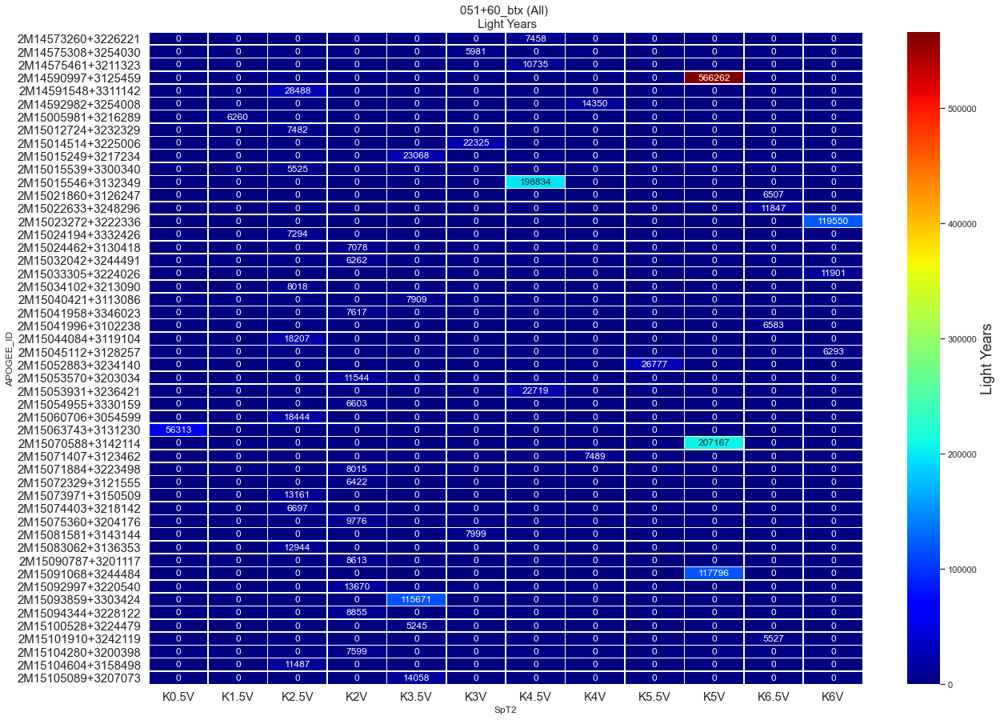

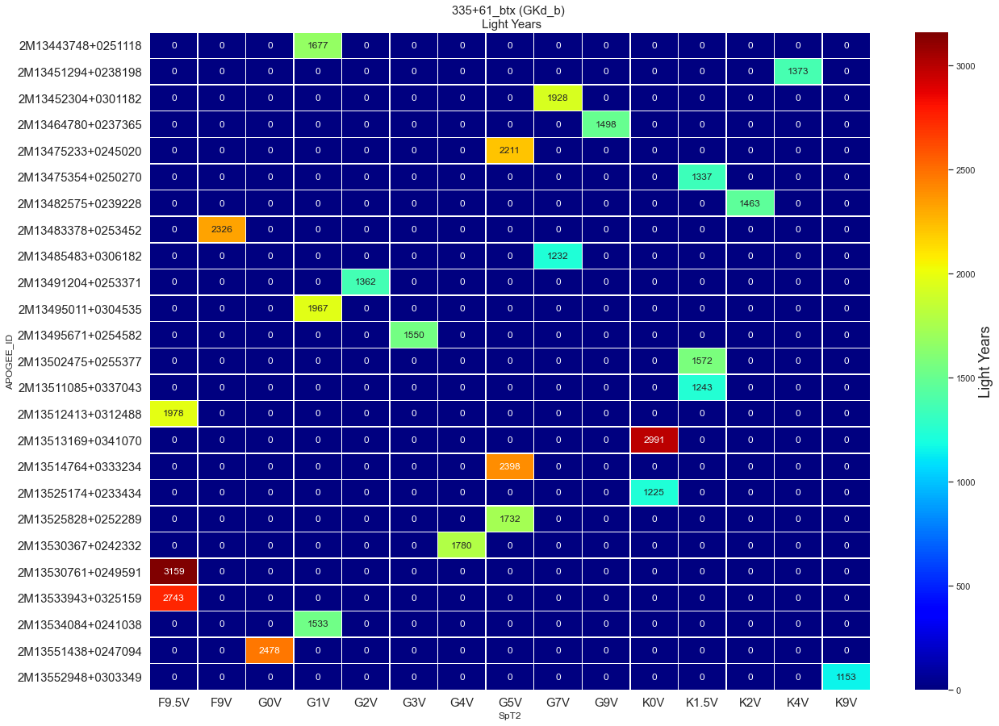

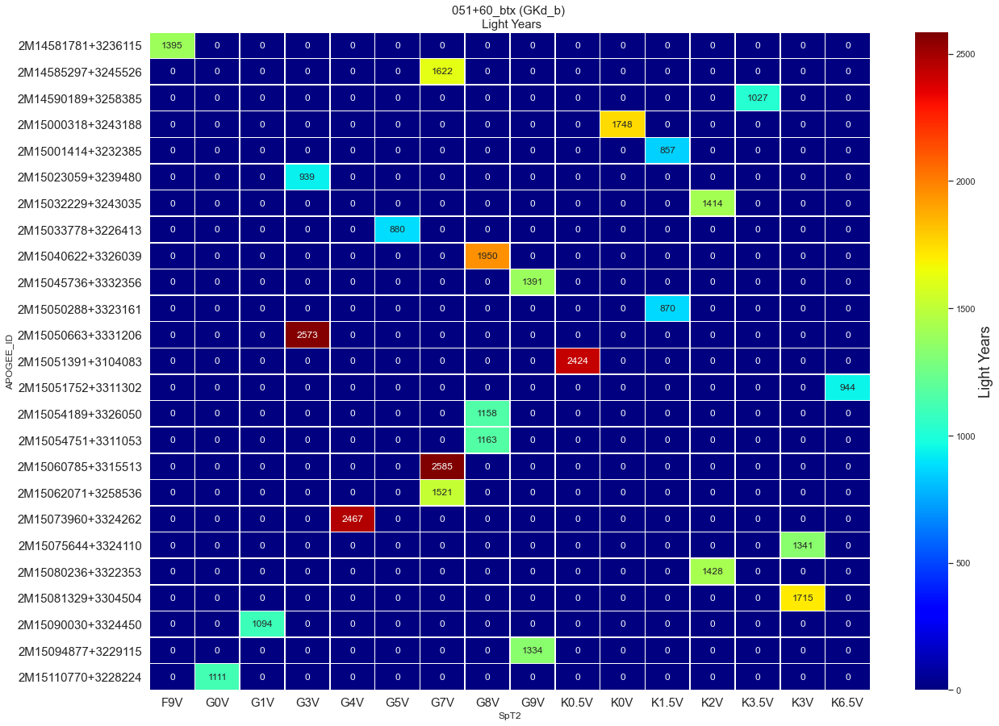

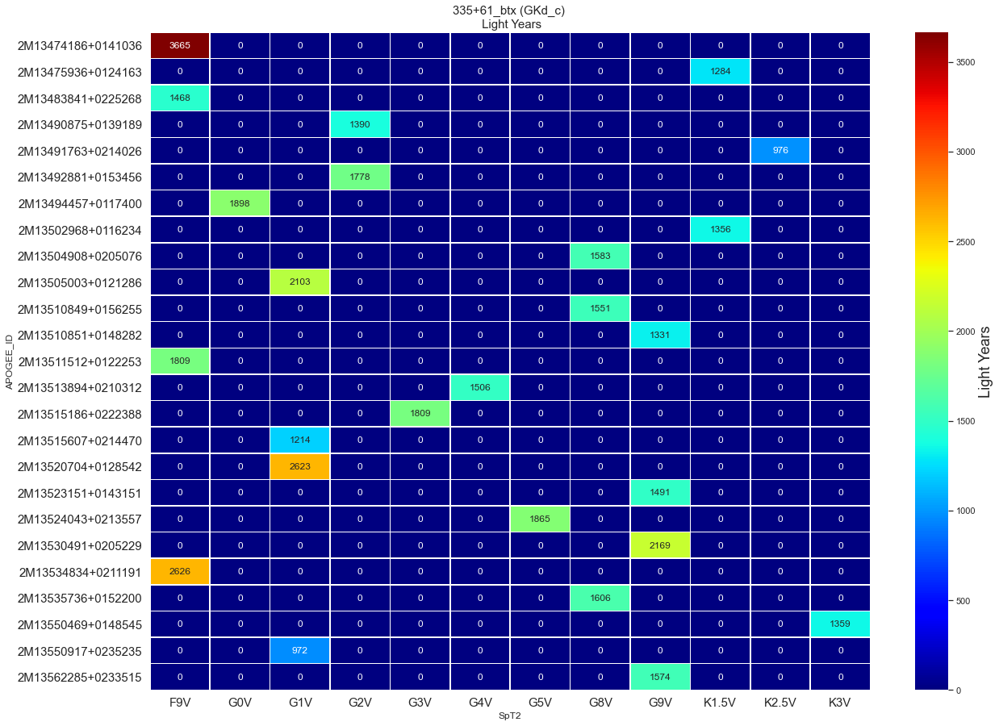

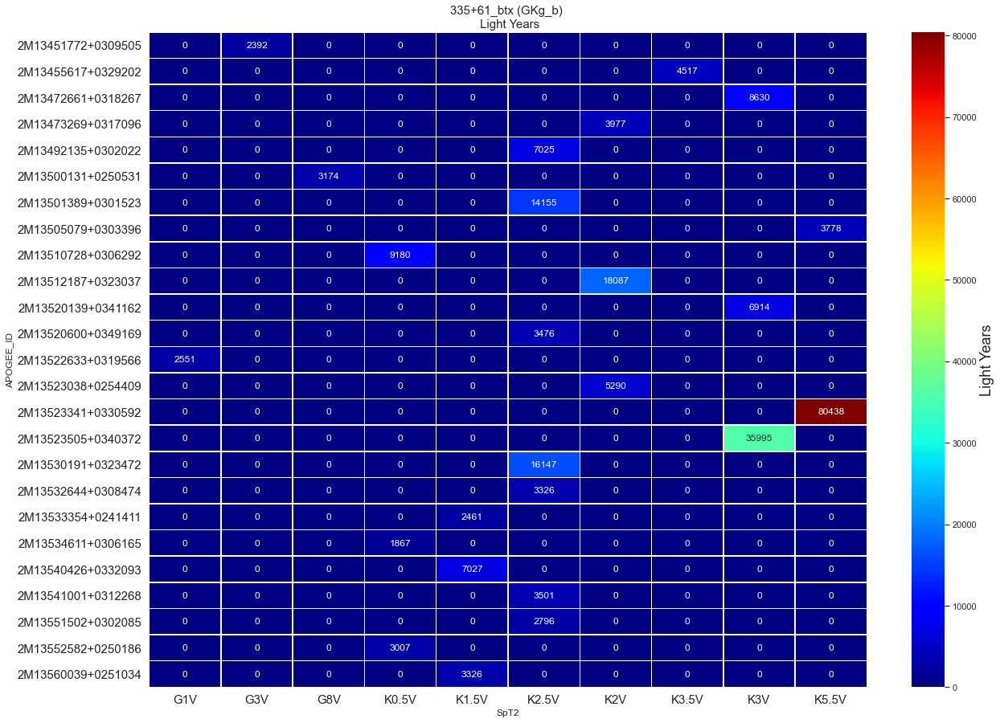

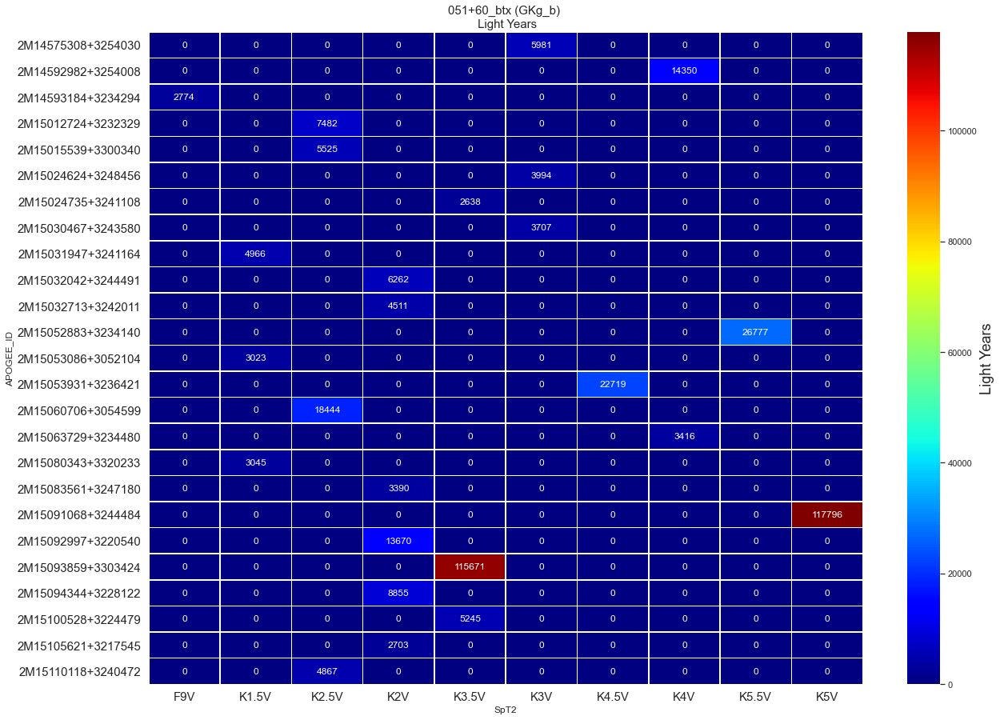

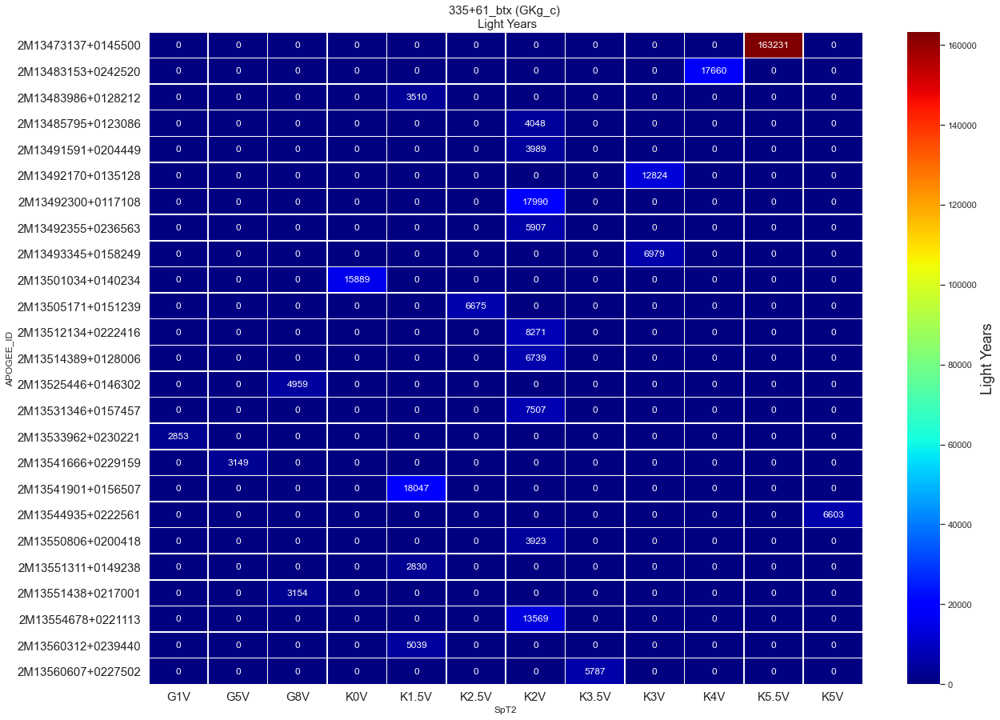

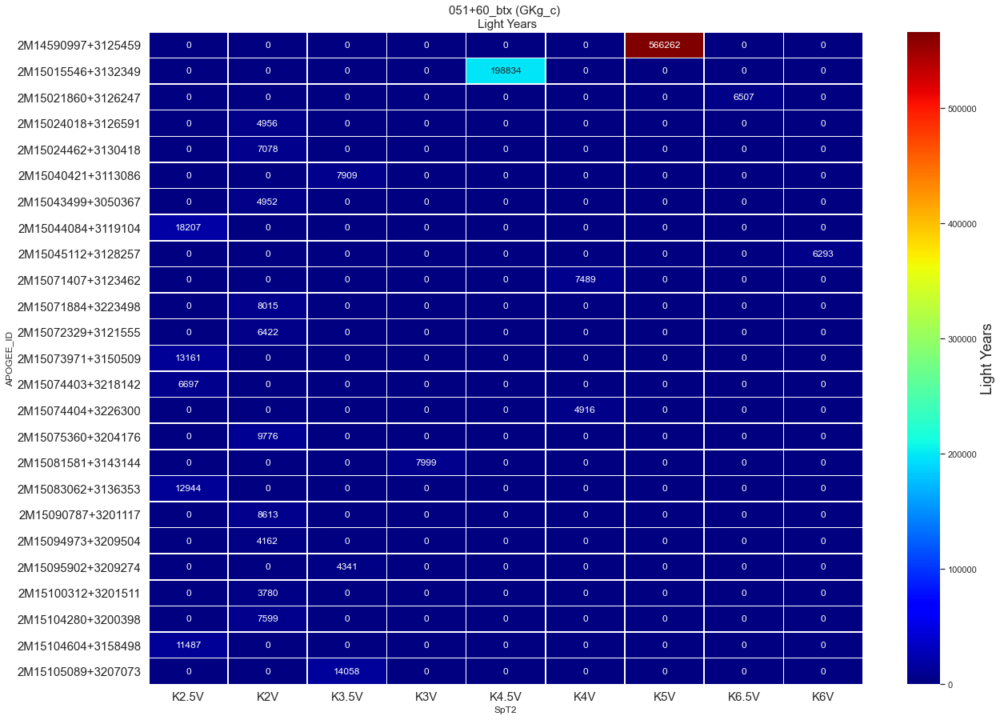

In [37]:
################################################################################


print("Plot 155")

def HeatmapLY(rAscap):
    idx1 = s1['LightYears'] > 0
    dfs1 = s1[idx1]
    dfs1['LightYears_round'] = round(dfs1['LightYears'], 0)
    if rAscap == 'All':
        dfs3 = dfs1
    else:
        idx2 = dfs1['ASPCAP_CLASS'] == rAscap
        dfs3 = dfs1[idx2]
    
    dfs3 = dfs3.sort_values(by=['LightYears'], ascending=False)
    
    dfs2 = dfs3.drop_duplicates(subset=['APOGEE_ID'], keep='first')
    
    
    if dfs2.shape[0] > 25:
        if dfs2.shape[0] > 50:
            df_list = dfs2[:50]
        else:
            df_list = dfs2[:25]
        s1_temp = df_list.pivot(index='APOGEE_ID', columns='SpT2', values='LightYears_round') #good
        
        result = s1_temp.fillna(value=0)
        
        import matplotlib.pyplot as plt
        import seaborn as sns  
        sns.set()
        
        # Draw a heatmap with the numeric values in each cell
        f, ax = plt.subplots(figsize=(20, 15))
        
        plt.title(str(st1) + ' (' + str(rAscap) + ') '  + "\n Light Years", fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        
        heat_map = sns.heatmap(result, annot=True, fmt="g", cmap='jet', linewidths=.5, ax=ax, 
                    cbar_kws={'label': 'Light Years'})
        heat_map.figure.axes[-1].yaxis.label.set_size(18)
        plt.show()
        
        
    idx1 = s2['LightYears'] > 0
    dfs1 = s2[idx1]
    dfs1['LightYears_round'] = round(dfs1['LightYears'], 0)
    if rAscap == 'All':
        dfs3 = dfs1
    else:
        idx2 = dfs1['ASPCAP_CLASS'] == rAscap
        dfs3 = dfs1[idx2]
    
    dfs3 = dfs3.sort_values(by=['LightYears'], ascending=False)
    
    dfs2 = dfs3.drop_duplicates(subset=['APOGEE_ID'], keep='first')
    
    if dfs2.shape[0] > 25:
        if dfs2.shape[0] > 50:
            df_list = dfs2[:50]
        else:
            df_list = dfs2[:25]
        s1_temp = df_list.pivot(index='APOGEE_ID', columns='SpT2', values='LightYears_round') #good
        
        result = s1_temp.fillna(value=0)
        
        import matplotlib.pyplot as plt
        import seaborn as sns  
        sns.set()
        
        # Draw a heatmap with the numeric values in each cell
        f, ax = plt.subplots(figsize=(20, 15))
        
        plt.title(str(st2) + ' (' + str(rAscap) + ') '  + "\n Light Years", fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        
        heat_map = sns.heatmap(result, annot=True, fmt="g", cmap='jet', linewidths=.5, ax=ax, 
                    cbar_kws={'label': 'Light Years'})
        heat_map.figure.axes[-1].yaxis.label.set_size(18)
        plt.show()
        

rAscap = 'All'
HeatmapLY(rAscap)
rAscap = 'Fd_a'
HeatmapLY(rAscap)
rAscap = 'Fd_b'
HeatmapLY(rAscap)
rAscap = 'Fd_c'
HeatmapLY(rAscap)
rAscap = 'Fd_d'
HeatmapLY(rAscap)

rAscap = 'GKd_a'
HeatmapLY(rAscap)
rAscap = 'GKd_b'
HeatmapLY(rAscap)
rAscap = 'GKd_c'
HeatmapLY(rAscap)
rAscap = 'GKd_d'
HeatmapLY(rAscap)

rAscap = 'GKg_a'
HeatmapLY(rAscap)
rAscap = 'GKg_b'
HeatmapLY(rAscap)
rAscap = 'GKg_c'
HeatmapLY(rAscap)
rAscap = 'GKg_d'
HeatmapLY(rAscap)

rAscap = 'Md_a'
HeatmapLY(rAscap)
rAscap = 'Md_b'
HeatmapLY(rAscap)
rAscap = 'Md_c'
HeatmapLY(rAscap)
rAscap = 'Md_d'
HeatmapLY(rAscap)

rAscap = 'Mg_a'
HeatmapLY(rAscap)
rAscap = 'Mg_b'
HeatmapLY(rAscap)
rAscap = 'Mg_c'
HeatmapLY(rAscap)
rAscap = 'Mg_d'
HeatmapLY(rAscap)

In [38]:
################################################################################


print('\n' + s1Label + ': Stars '   + str(s1.shape[0]))

print('\nBA' + ': Stars '   + str(idx_BA.shape[0]))

print('\nFd_a' + ': Stars '   + str(idx_Fd_a.shape[0]))
print('Fd_b' + ': Stars '     + str(idx_Fd_b.shape[0]))
print('Fd_c' + ': Stars '     + str(idx_Fd_c.shape[0]))
print('Fd_d' + ': Stars '     + str(idx_Fd_d.shape[0]))

#print('\nFd' + ': Stars '   + str(len(idx_Fd)))

print('\nGKd_a' + ': Stars '   + str(idx_GKd_a.shape[0]))
print('GKd_b' + ': Stars '     + str(idx_GKd_b.shape[0]))
print('GKd_c' + ': Stars '     + str(idx_GKd_c.shape[0]))
print('GKd_d' + ': Stars '     + str(idx_GKd_d.shape[0]))

#print('\nGKd' + ': Stars '   + str(len(idx_GKd)))

print('\nGKg_a' + ': Stars '   + str(idx_GKg_a.shape[0]))
print('GKg_b' + ': Stars '     + str(idx_GKg_b.shape[0]))
print('GKg_c' + ': Stars '     + str(idx_GKg_c.shape[0]))
print('GKg_d' + ': Stars '     + str(idx_GKg_d.shape[0]))

#print('\nGKg' + ': Stars '   + str(len(idx_GKg)))

print('\nMd_a' + ': Stars '   + str(idx_Md_a.shape[0]))
print('Md_b' + ': Stars '     + str(idx_Md_b.shape[0]))
print('Md_c' + ': Stars '     + str(idx_Md_c.shape[0]))
print('Md_d' + ': Stars '     + str(idx_Md_d.shape[0]))

#print('\nMd' + ': Stars '   + str(len(idx_Md)))

print('\nMg_a' + ': Stars '   + str(idx_Mg_a.shape[0]))
print('Mg_b' + ': Stars '     + str(idx_Mg_b.shape[0]))
print('Mg_c' + ': Stars '     + str(idx_Mg_c.shape[0]))
print('Mg_d' + ': Stars '     + str(idx_Mg_d.shape[0]))


print('\n' + s2Label + ': Stars '   + str(s2.shape[0]))

print('\nBA' + ': Stars '   + str(idx2_BA.shape[0]))

print('\nFd_a' + ': Stars '   + str(idx2_Fd_a.shape[0]))
print('Fd_b' + ': Stars '     + str(idx2_Fd_b.shape[0]))
print('Fd_c' + ': Stars '     + str(idx2_Fd_c.shape[0]))
print('Fd_d' + ': Stars '     + str(idx2_Fd_d.shape[0]))

#print('\nFd' + ': Stars '   + str(len(idx_Fd)))

print('\nGKd_a' + ': Stars '   + str(idx2_GKd_a.shape[0]))
print('GKd_b' + ': Stars '     + str(idx2_GKd_b.shape[0]))
print('GKd_c' + ': Stars '     + str(idx2_GKd_c.shape[0]))
print('GKd_d' + ': Stars '     + str(idx2_GKd_d.shape[0]))

#print('\nGKd' + ': Stars '   + str(len(idx_GKd)))

print('\nGKg_a' + ': Stars '   + str(idx2_GKg_a.shape[0]))
print('GKg_b' + ': Stars '     + str(idx2_GKg_b.shape[0]))
print('GKg_c' + ': Stars '     + str(idx2_GKg_c.shape[0]))
print('GKg_d' + ': Stars '     + str(idx2_GKg_d.shape[0]))

#print('\nGKg' + ': Stars '   + str(len(idx_GKg)))

print('\nMd_a' + ': Stars '   + str(idx2_Md_a.shape[0]))
print('Md_b' + ': Stars '     + str(idx2_Md_b.shape[0]))
print('Md_c' + ': Stars '     + str(idx2_Md_c.shape[0]))
print('Md_d' + ': Stars '     + str(idx2_Md_d.shape[0]))

#print('\nMd' + ': Stars '   + str(len(idx_Md)))

print('\nMg_a' + ': Stars '   + str(idx2_Mg_a.shape[0]))
print('Mg_b' + ': Stars '     + str(idx2_Mg_b.shape[0]))
print('Mg_c' + ': Stars '     + str(idx2_Mg_c.shape[0]))
print('Mg_d' + ': Stars '     + str(idx2_Mg_d.shape[0]))






print("\nDone!")







335+61_btx: Stars 261

BA: Stars 0

Fd_a: Stars 5
Fd_b: Stars 8
Fd_c: Stars 8
Fd_d: Stars 4

GKd_a: Stars 21
GKd_b: Stars 50
GKd_c: Stars 46
GKd_d: Stars 17

GKg_a: Stars 9
GKg_b: Stars 26
GKg_c: Stars 39
GKg_d: Stars 10

Md_a: Stars 3
Md_b: Stars 3
Md_c: Stars 5
Md_d: Stars 5

Mg_a: Stars 0
Mg_b: Stars 1
Mg_c: Stars 1
Mg_d: Stars 0

051+60_btx: Stars 258

BA: Stars 1

Fd_a: Stars 3
Fd_b: Stars 5
Fd_c: Stars 4
Fd_d: Stars 1

GKd_a: Stars 21
GKd_b: Stars 44
GKd_c: Stars 25
GKd_d: Stars 17

GKg_a: Stars 16
GKg_b: Stars 34
GKg_c: Stars 39
GKg_d: Stars 24

Md_a: Stars 3
Md_b: Stars 7
Md_c: Stars 6
Md_d: Stars 5

Mg_a: Stars 0
Mg_b: Stars 2
Mg_c: Stars 1
Mg_d: Stars 0

Done!


In [ ]:

Halo_Stream = """

Halo Stream: [
'GD1-1'    491 Stars
'GD1-2'    948 Stars
'GD1-3'    534 Stars
'GD1-4'    420 Stars
'GD1-5'    281 Stars
'ORPHAN-1' 328 Stars
'ORPHAN-2' 355 Stars
'ORPHAN-3' 397 Stars
'ORPHAN-4' 391 Stars
'ORPHAN-5' 452 Stars
'PAL5-1'   416 Stars
'PAL5-2'   530 Stars
'SGRT-1'   212 Stars
'TRIAND-1' 254 Stars
'TRIAND-2' 239 Stars
'TRIAND-3' 250 Stars
'TRIAND-4' 235 Stars
'TRIAND-5' 242 Stars

"""



Buldge = """

Bulge Fields: [
'000+08'   627 Stars
'000+08-S' 361 Stars
'000+12'   530 Stars
'000+17'   480 Stars
'000-04'   665 Stars
'000-08'   250 Stars
'000-12'   254 Stars
'002-04'  1058 Stars
'005+00'   407 Stars
'005+04'   452 Stars
'005+08'   462 Stars
'005-02'   903 Stars
'010+00'   453 Stars
'010+12'   477 Stars
'010-12'   501 Stars
'013+00'   239 Stars
'015+02'   355 Stars
'015+12'   509 Stars
'015-12'   253 Stars
'015-14'   371 Stars
'020+00'   700 Stars
'020+04'   716 Stars
'020+06'   709 Stars
'025-10'   219 Stars
'340+00'   477 Stars
'340+10'   365 Stars
'340+14'   477 Stars
'345+00'   445 Stars
'345+02'   210 Stars
'345+14'   480 Stars
'345-02'   349 Stars
'345-12'   506 Stars
'347+00'   250 Stars
'350+00'   435 Stars
'350+04'   468 Stars
'350+12'   507 Stars
'350-04'   481 Stars
'350-12'   256 Stars
'355+00'   479 Stars
'355+02'   328 Stars
'355+04'   164 Stars
'355+08'   354 Stars
'355-02'   200 Stars
'355-08'   342 Stars
'358-04']  469 Stars

"""


Outer_Disk = """

Outer Disk Fields: [
 '101-24_btx' 255 Stars
 '120-24_btx' 228 Stars
 '126-24_btx'  53 Stars
 '139+27_btx' 253 Stars
 '140+24_btx' 253 Stars
 '140-18_btx' 242 Stars
 '142+35_btx' 239 Stars
 '146+18_btx' 246 Stars
 '146+24_btx' 248 Stars
 '146+26_btx' 253 Stars
 '146+36_btx' 240 Stars
 '146-18_btx' 249 Stars
 '152+34_btx' 245 Stars
 '155-27_btx' 245 Stars
 '157+28_btx' 250 Stars
 '159+26_btx' 235 Stars
 '160+18_btx' 249 Stars
 '160+24_btx' 248 Stars
 '160-18_btx' 208 Stars
 '160-24_btx' 232 Stars
 '162+34_btx' 247 Stars
 '169+18_btx' 245 Stars
 '169+24_btx' 244 Stars
 '169-18_btx' 232 Stars
 '169-24_btx' 237 Stars
 '170+34_btx' 237 Stars
 '178+36_btx' 235 Stars
 '181+32_btx' 246 Stars
 '186+31_btx' 232 Stars
 '191+18_btx' 247 Stars
 '191-18_btx' 234 Stars
 '191-24_btx' 245 Stars
 '201+26_btx' 239 Stars
 '201+30_btx' 250 Stars
 '207+27_btx' 252 Stars
 '214+18_btx' 248 Stars
 '214+24_btx' 247 Stars
 '232+30_btx' 246 Stars

"""


Disk = """

Disk Fields: [
 '020+14' 258 Stars
 '020-06' 250 Stars
 '020-12' 256 Stars
 '020-14' 255 Stars
 '025+10' 251 Stars
 '025+14' 259 Stars
 '025-14 '251 Stars
 '027+00' 463 Stars
 '100+00' 735 Stars
 '100+06' 529 Stars
 '100+12' 623 Stars
 '100-06' 678 Stars
 '100-12' 726 Stars
 '120+06' 976 Stars
 '120+12' 645 Stars
 '120-06' 968 Stars
 '120-12' 640 Stars
 '140+06' 495 Stars
 '140+12' 482 Stars
 '140-06' 501 Stars
 '140-12' 476 Stars
 '160+06' 493 Stars
 '160+12' 478 Stars
 '160-06' 495 Stars
 '160-12' 501 Stars
 '180+12' 638 Stars
 '180-12' 641 Stars
 '214-08' 504 Stars
 '240-12' 374 Stars
 '263-03' 251 Stars
 '264+20' 235 Stars
 '278-09' 252 Stars
 '296+06' 254 Stars
 '296-06' 359 Stars
 '298-25' 239 Stars
 '300-23' 249 Stars
 '311-12' 252 Stars
 '317+12' 258 Stars
 '326+12' 251 Stars
 '326-06' 578 Stars
 '326-12' 357 Stars
 '330-12' 259 Stars
 '335+12' 244 Stars
 '335-12' 255 Stars
 '340+12' 239 Stars
 '340-10' 247 Stars
 '340-12' 252 Stars
 '340-14' 255 Stars

"""


Disk1 = """

Disk 1 Fields: [
'120+18'  243 Stars
'125+12'  251 Stars
'125-12'  248 Stars
'225+00'  251 Stars
'225-12'  259 Stars
'240+00'  500 Stars
'240+04'  250 Stars
'240+12'  256 Stars
'240-04'  255 Stars
'240-12'  374 Stars
'255+00'  255 Stars
'270+00' 1372 Stars
'270+12'  362 Stars
'270-12'  359 Stars
'278+00'  255 Stars
'285+00'  231 Stars
'300+00'  928 Stars
'300+04'  736 Stars
'300+12'  367 Stars
'300-04'  364 Stars
'300-12'  355 Stars
'330+12'  355 Stars

"""


Disk2 = """

Disk 2 Fields: [
'020+06' 709 Stars
'020+12' 367 Stars
'025+06' 692 Stars
'025+12' 359 Stars
'025-06' 695 Stars
'025-12' 360 Stars
'034+00' 675 Stars
'034+06' 717 Stars
'034+12' 374 Stars
'034-06' 692 Stars
'034-12' 381 Stars
'049+00' 344 Stars
'049+06' 365 Stars
'049+12' 350 Stars
'049-06' 357 Stars
'049-12' 357 Stars
'060-04' 610 Stars
'064+00' 665 Stars
'064+06' 688 Stars
'064+12' 386 Stars
'064-06' 483 Stars
'064-12' 353 Stars
'079+00' 357 Stars
'079-06' 374 Stars
'079-12' 373 Stars
'094+00' 680 Stars
'094+06' 719 Stars
'094+12' 375 Stars
'094-06' 721 Stars
'094-12' 372 Stars
'109+00' 326 Stars
'109+08' 378 Stars
'109+12' 347 Stars
'109-08' 388 Stars
'109-12' 345 Stars
'116+00' 686 Stars
'124+00' 437 Stars
'131+00' 438 Stars
'139+00' 472 Stars
'146+00' 478 Stars
'146+08' 502 Stars
'146+12' 478 Stars
'146-08' 500 Stars
'146-12' 481 Stars
'154+00' 482 Stars
'161+00' 458 Stars
'169+00' 801 Stars
'169+08' 508 Stars
'169+12' 480 Stars
'169-08' 498 Stars
'169-12' 470 Stars
'176+00' 643 Stars
'184+00' 654 Stars
'191+00' 632 Stars
'191+08' 501 Stars
'191+12' 481 Stars
'191-08' 501 Stars
'191-12' 473 Stars
'199+00' 461 Stars
'206+00' 437 Stars
'214+00' 497 Stars
'214+08' 504 Stars
'214+12' 505 Stars
'214-08' 504 Stars
'214-12' 475 Stars
'251+00' 368 Stars
'259+00' 710 Stars
'266-06' 251 Stars
'281+00' 359 Stars
'281+06' 256 Stars
'281+12' 232 Stars
'281-06' 259 Stars
'296+00' 360 Stars
'296+12' 259 Stars
'296-06' 359 Stars
'296-12' 358 Stars
'311+00' 364 Stars
'311+06' 358 Stars
'311+12' 257 Stars
'311-06' 256 Stars
'326+00' 245 Stars
'326+06' 360 Stars
'326-06' 578 Stars
'326-12' 357 Stars
'335+06' 258 Stars
'340+06' 607 Stars
'340-06' 361 Stars

"""


Halo = """

Halo Fields: [
'000+60' 484 Stars
'030+30' 454 Stars
'030+60' 624 Stars
'040+45' 575 Stars
'060+60' 460 Stars
'060+75' 445 Stars
'060-30' 263 Stars
'060-75' 252 Stars
'075-30' 244 Stars
'080+45' 489 Stars
'080-45' 253 Stars
'090+60' 533 Stars
'090-30' 253 Stars
'090-75' 248 Stars
'100-60' 494 Stars
'105-30' 253 Stars
'110-60' 250 Stars
'120+30' 499 Stars
'120+45' 303 Stars
'120+60' 470 Stars
'120+75' 410 Stars
'120-30' 251 Stars
'120-60' 251 Stars
'120-75' 249 Stars
'130-60' 259 Stars
'135-30' 256 Stars
'140-60' 251 Stars
'150+30' 550 Stars
'150-30' 254 Stars
'150-60' 255 Stars
'160+45' 474 Stars
'160-45' 252 Stars
'160-60' 261 Stars
'165-30' 249 Stars
'170-60' 256 Stars
'180+60' 541 Stars
'180+75' 468 Stars
'180-30' 248 Stars
'180-60' 257 Stars
'180-75' 256 Stars
'190-60' 254 Stars
'195-30' 261 Stars
'200+45' 513 Stars
'200-45' 256 Stars
'200-60' 246 Stars
'210+60' 504 Stars
'228-49' 214 Stars
'240+60' 523 Stars
'240+75' 496 Stars
'270+60' 522 Stars
'280+45' 584 Stars
'280-27' 221 Stars
'284-39' 244 Stars
'292-26' 252 Stars
'300+60' 498 Stars
'300+75' 510 Stars
'300+75-S' 196 Stars
'30Dor'  49 Stars
'320+45' 569 Stars
'330+60' 499 Stars

"""


Halo_btx = """

Halo_btx Fields: [
'011+47_btx' 253 Stars
'041+78_btx' 251 Stars
'043+49_btx' 239 Stars
'051+60_btx' 258 Stars
'063+55_btx' 242 Stars
'071+62_btx' 253 Stars
'099+56_btx' 229 Stars
'104+77_btx' 239 Stars
'120+67_btx' 247 Stars
'172+58_btx' 238 Stars
'175+65_btx' 255 Stars
'209+73_btx' 230 Stars
'216+53_btx' 252 Stars
'246+77_btx' 243 Stars
'335+61_btx']261 Stars

"""


Globular_Clusters = """

Globular Cluster Fields: [
'47TUC'       372 Stars
'M12-N'       308 Stars
'M15'        1189 Stars
'M5PAL5'      718 Stars
'M71'        1028 Stars
'N1851'       382 Stars
'N288'        375 Stars
'N362'        270 Stars
'N6441'       208 Stars
'Omegacen'   1201 Stars
'Sgr_faint']  214 Stars

"""


Globular_Cluster1 = """

Globular Cluster 1 Fields: [
'M4'     334 Stars
'M68'    362 Stars
'M79'    373 Stars
'N1851'  382 Stars
'N2808'  365 Stars
'N3201'] 355 Stars

"""


Globular_Cluster2 = """

Globular Cluster 2 Fields: [
'M10'    475 Stars
'M12-S'] 462 Stars

"""


Open_Clusters = """

Open Cluster Fields: [
'M67'      894 Stars
'N188'     578 Stars
'N2204'    254 Stars
'N2243-S'] 324 Stars

"""


Young_Clusters = """

Young Cluster Fields: [
'ALPHAPER'     206 Stars
'LAMBDAORI-A'  606 Stars
'LAMBDAORI-B'  425 Stars
'LAMBDAORI-C'  591 Stars
'N2264'        170 Stars
'ORIONA-B'     194 Stars
'ORIONA-C'     160 Stars
'ORIONA-D'     156 Stars
'ORIONA-E'     170 Stars
'ORIONB-A'     539 Stars
'ORIONB-B'     495 Stars
'ORIONOB1AB-A' 322 Stars
'ORIONOB1AB-B' 518 Stars
'ORIONOB1AB-C' 537 Stars
'ORIONOB1AB-D' 339 Stars
'ORIONOB1AB-E' 543 Stars
'ORIONOB1AB-F' 436 Stars
'PLEIADES-E'   226 Stars
'PLEIADES-W'   243 Stars
'TAUL1495'     233 Stars
'TAUL1521'     243 Stars
'TAUL1527'     235 Stars
'TAUL1536']    221 Stars

"""




t = """ 

'000+00-C', '000+02', '000+02-O', '000+04', '000+04-O', '000+05-O', '000+08', '000+08-S', '000+12', '000+14', '000+16', '000+17', 
'000+30', '000+45', '000+60', '000+75', '000-02', '000-02-O', '000-04', '000-04-O', '000-08', '000-12', '000-17-C', '001+01', 
'001-01', '001-01-O', '001-04-O', '001-05-O', '002+00', '002+00-C', '002+02-O', '002+04', '002+06', '002-02-O', '002-03-O', 
'002-04', '002-05-O', '002-06-O', '003+02', '003+02-O', '003+03-O', '003+05', '003-02-O', '003-03-C', '003-03-O', '003-05', 
'003-05-O', '004+00', '004+02', '004+02-O', '004+04', '004+05-O', '004-02', '004-02-O', '004-04', '005+00', '005+02-O', '005+03', 
'005+03-O', '005+04', '005+05-O', '005+08', '005-02', '005-03', '005-03-O', '006+00', '006+02', '006+04-O', '006+06', '006-02', 
'007+02-O', '007+07', '008+00', '008+02', '008-02', '009+09', '010+00', '010+02', '010+12', '010+60', '010-02', '010-07-C', 
'010-12', '011+47_btx', '011+79_MGA', '012+00', '012+02', '012-02', '013+00', '014+00', '014+02', '014+89_MGA', '014-02', 
'015+02', '015+12', '015+30', '015-12', '015-14', '016+00', '016+02', '016+77_MGA', '016-02', '018+00', '018+02', '018-02', 
'020+00', '020+02', '020+04', '020+06', '020+12', '020+14', '020+60', '020-02', '020-06', '020-12', '020-14', '021+79_MGA',
 '022+00', '022+02', '022+82_MGA', '022-02', '023+78_MGA', '023+88_MGA', '024+00', '024+03', '024-03', '025+06', '025+10', 
 '025+12', '025+14', '025-06', '025-10', '025-12', '025-14', '027+00', '027+04', '027-04', '029+77_MGA', '029+88_MGA', '029-12-O', 
 '030+00', '030+04', '030+08', '030+12', '030+30', '030+60', '030+75', '030+79_MGA', '030-04', '030-08', '030-12', '032+81_MGA', 
 '033+00', '034+00', '034+06', '034+12', '034-06', '034-12', '037+79_MGA', '037+85_MGA', '038+00', '038+04', '038+48_MGA', '038-04',
 '039+45_MGA', '039+46_MGA', '040+36_MGA', '040+43_MGA', '040+45', '040+60', '040+88_MGA', '041+47_MGA', '041+48_MGA', '041+50_MGA',
 '041+53_MGA', '041+78_btx', '041+81_MGA', '041-52-O', '042+41_MGA', '042+43_MGA', '042+45_MGA', '042+87_MGA', '042-56-O', 
 '043+44_MGA', '043+46_MGA', '043+49_btx', '043-49-O', '044+42_MGA', '044+47_MGA', '044+49_MGA', '044+51_MGA', '044+54_MGA', 
 '044+59_MGA', '045+00', '045+06', '045+12', '045+30', '045+42_MGA', '045+56_MGA', '045+89_MGA', '045-06', '045-12', '045-54-O', 
 '046+34_MGA', '046+45_MGA', '046+47_MGA', '046+48', '046-47-O', '046-58-O', '047+50_MGA', '047+52_MGA', '047-25_MGA', '047-51-O', 
 '048+44_MGA', '048+55_MGA', '048+57_MGA', '048+88_MGA', '048-27_MGA', '048-48-O', '049+00', '049+06', '049+12', '049+46_MGA', 
 '049+47_MGA', '049+60_MGA', '049+62', '049+88_MGA', '049-06', '049-12', '049-52-O', '049-55-O', '050+31_MGA', '050+48_MGA', 
 '050+60', '050+63_MGA', '050-29_MGA', '051+60_btx', '051-50-O', '052+44_MGA', '052+87_MGA', '052-33_MGA', '053+00', '053+04', 
 '053+33_MGA', '053+46_MGA', '053+58_MGA', '053+88_MGA', '053-04', '054+87_MGA', '054-35_MGA', '055+33_MGA', '055+36_MGA', 
 '055+63_MGA', '055-53-O', '056+88_MGA', '056-50-O', '057+35_MGA', '058+37_MGA', '058+57', '059+36_MGA', '059-24_MGA', '059-48-O', 
 '060+00', '060+04', '060+08', '060+12', '060+30', '060+38_MGA', '060+56', '060+60', '060+75', '060+78_MGA', '060-04', '060-08',
 '060-12', '060-30', '060-45', '060-75', '061-25_MGA', '062+39_MGA', '062+43_MGA', '062+44_MGA', '062+52_MGA', '062+62', 
 '062+88_MGA', '063+41_MGA', '063+43_MGA', '063+44_MGA', '063+47_MGA', '063+55_btx', '064+00', '064+06', '064+12', '064+42_MGA', 
 '064+44_MGA', '064-06', '064-12', '065+00', '065+48_MGA', '065-29_MGA', '066+42_MGA', '066+47_MGA', '067+43_MGA', '067+46_MGA', 
 '068+00', '068+04', '068+51_MGA', '068+55_MGA', '068-04', '069+42_MGA', '069+45_MGA', '069+49_MGA', '069+57_MGA', '069+83_MGA', 
 '070+53_MGA', '070+54', '070+60', '070+69_MGA', '070+80_MGA', '071+43_MGA', '071+48_MGA', '071+60_MGA', '071+62_btx',
 '072+47_MGA', '072+51_MGA', '072+55_MGA', '072+76_MGA', '073+53_MGA', '073+72_MGA', '074+45_MGA', '074+49_MGA', '074+57_MGA', 
 '074+66_MGA', '075+00', '075+12', '075+30', '075+35', '075+44_MGA', '075+83_MGA', '075-06', '075-12', '075-30', '075-35_MGA',
 '075-45', '076+50_MGA', '076+88_MGA', '077+45_MGA', '077+69_MGA', '077+89_MGA', '078+52_MGA', '078+57_MGA', '078+76_MGA',
 '079+00', '079-06', '079-12', '080+45', '080+59_MGA', '080+60', '080+66_MGA', '080-45', '081+34_MGA', '082+35', '082+57_MGA', 
 '083+00', '083+04', '083+73_MGA', '083-04', '084+62_MGA', '085+33_MGA', '085+35_MGA', '085+59_MGA', '086+34_MGA', '086+47_MGA',
 '086+57_MGA', '086+66_MGA', '086+77', '088+34_MGA', '088+36', '088+55_MGA', '088+64_MGA', '089+70', '090+00', '090+04', '090+08', 
 '090+12', '090+30', '090+34_MGA', '090+49_MGA', '090+59_MGA', '090+60', '090+67_MGA', '090+75', '090-04', '090-08', '090-12', 
 '090-30', '090-45', '090-75', '091+56_MGA', '091-59_MGA', '092+65_MGA', '092+72_MGA', '093+36_MGA', '094+00', '094+06', '094+12', 
 '094+58_MGA', '094+61_MGA', '094-06', '094-12', '098+00', '098+04', '098+60_MGA', '098-04', '099+56_btx', 
 
 '100+00', '100+06', 
 '100+12', '100+60', '100-06', '100-12', '100-60', '101+04', '101-04', '101-24_btx', '102+61_MGA', '103+81_MGA', '104+77_btx', 
 '105+00', '105+06', '105+12', '105+30', '105-06', '105-12', '105-30', '105-45', '106+63_MGA', '109+00', '109+04', '109+08', 
 '109+12', '109+68_MGA', '109-04', '109-08', '109-12', '110+60', '110-60', '110-62_MGA', '111+70_MGA', '113+00', '113+04', 
 '113-04', '115+69_MGA', '115+71_MGA', '116+00', '116+04', '116-04', '116-63_MGA', '117+01', '120+00', '120+04', '120+06', 
 '120+08', '120+12', '120+18', '120+30', '120+45', '120+60', '120+67_btx', '120+75', '120-04', '120-06', '120-08', '120-08-RV', 
 '120-12', '120-24_btx', '120-30', '120-45', '120-60', '120-61-O', '120-75', '121+74_MGA', '123-53-O', '124+00', '124+04', '124-04', 
 '125+12', '125-12', '126-24_btx', '126-55-O', '126-59-O', '128+00', '128+04', '128+71_MGA', '128-04', '130+60', '130-60', '131+00', 
 '131+04', '131-04', '133-55-O', '134-51-O', '135+00', '135+06', '135+12', '135+30', '135-03', '135-06', '135-12', '135-30', 
 '135-45', '136+71_MGA', '137+70_MGA', '138+64_MGA', '139+00', '139+04', '139+27_btx', '139+61_MGA', '139-04', '140+06', '140+12',
 '140+24_btx', '140+60', '140-06', '140-12', '140-18_btx', '140-55-O', '140-60', '141+72_MGA', '142+35_btx', '143+00', '143+04', 
 '143+60_MGA', '143+76_MGA', '143-04', '143-47_MGA', '144+70_MGA', '145+62_MGA', '146+00', '146+04', '146+08', '146+12', 
 '146+18_btx', '146+24_btx', '146+26_btx', '146+36_btx', '146-04', '146-08', '146-12', '146-18_btx', '146-46_MGA', '147+60_MGA', 
 '147+64_MGA', '147-46_MGA', '149+59_MGA', '149+62_MGA', '149+72_MGA', '150+00', '150+04', '150+08', '150+16', '150+30',
 '150+60', '150+65_MGA', '150+75', '150-04', '150-08', '150-08-RV', '150-16', '150-30', '150-45', '150-60', '151+60_MGA',
 '151+70_MGA', '151+79_MGA', '151-45_MGA', '152+34_btx', '152+63_MGA', '154+00', '154+04', '154+59_MGA', '154+62_MGA', '154-04', 
 '155+65_MGA', '155-27_btx', '157+28_btx', '157+60_MGA', '158+00', '158+04', '158+12', '158+18', '158+63_MGA', '158-04', '158-12',
 '159+26_btx', '159+39_MGA', '159+58_MGA', '160+06', '160+12', '160+18_btx', '160+24_btx', '160+45', '160+56_MGA', '160+60', 
 '160+61_MGA', '160-06', '160-12', '160-18_btx', '160-24_btx', '160-45', '160-60', '161+00', '161+04', '161+34_MGA', '161-04', 
 '162+34_btx', '162+40_MGA', '162+60_MGA', '162+64_MGA', '163+36_MGA', '163+38_MGA', '163+78_MGA', '164+32_MGA', '164+34_MGA', 
 '165+00', '165+04', '165+08', '165+18', '165+30', '165+33_MGA', '165+38_MGA', '165+61_MGA', '165+62_MGA', '165-04', '165-08',
 '165-30', '165-45', '167+31_MGA', '167+34_MGA', '167+39_MGA', '168+30_MGA', '168+31_MGA', '168+46_MGA', '168+55_MGA', '168+62_MGA',
 '168+63_MGA', '169+00', '169+04', '169+08', '169+12', '169+18_btx', '169+24_btx', '169+33_MGA', '169+35_MGA', '169+53_MGA', 
 '169+61_MGA', '169-04', '169-08', '169-12', '169-18_btx', '169-24_btx', '170+31_MGA', '170+34_btx', '170+60', '170-60',
 '171+29_MGA', '171+48_MGA', '171-52_MGA', '172+27_MGA', '172+32_MGA', '172+54_MGA', '172+58_btx', '172+63_MGA', '172-52_MGA', 
 '173+00', '173+04', '173+12', '173+18', '173+30_MGA', '173+52_MGA', '173-04', '173-12', '173-51_MGA', '174+28_MGA', '174+33_MGA', 
 '174+35_MGA', '174+49_MGA', '174-51_MGA', '175+26_MGA', '175+31_MGA', '175+43_MGA', '175+58_MGA', '175+65_btx', '175-27-O',
 '176+00', '176+04', '176+27_MGA', '176+29_MGA', '176-04', '176-27-O', '176-49_MGA', '177+24_MGA', '177+32', '177+49_MGA',
 '177+51_MGA', '177-49_MGA', '178+24_MGA', '178+26_MGA', '178+28_MGA', '178+30_MGA', '178+36_btx', '178+42_MGA', '178+44_MGA', 
 '178-48_MGA', '179+57_MGA', '179-25-O', '180+00', '180+04', '180+08', '180+12', '180+18', '180+19', '180+29_MGA', '180+30', 
 '180+31_MGA', '180+33_MGA', '180+60', '180+75', '180-04', '180-08', '180-08-RV', '180-12', '180-30', '180-45', '180-60', '180-75',
 '181+25_MGA', '181+27_MGA', '181+32_btx', '181+42_MGA', '181-46_MGA', '182+25', '182+29_MGA', '182+30_MGA', '182-45_MGA', 
 '183-44_MGA', '184+00', '184+04', '184+30_MGA', '184+31', '184-04', '184-43_MGA', '185+27_MGA', '185+57_MGA', '185-42_MGA', 
 '186+30', '186+31_btx', '186+42', '186+48', '187+24_MGA', '187+26_MGA', '187+28_MGA', '187+48_MGA', '187-40_MGA', '187-41_MGA',
 '188+00', '188+04', '188+12', '188+18', '188+58_MGA', '188-04', '188-12', '189+25_MGA', '189+27_MGA', '189+29', '189+47_MGA', 
 '190+44_MGA', '190+45_MGA', '190+60', '190-50_MGA', '190-60', '191+00', '191+04', '191+08', '191+12', '191+18_btx', '191+22_MGA',
 '191+24_MGA', '191+26_MGA', '191+28_MGA', '191+44_MGA', '191+52_MGA', '191-04', '191-08', '191-12', '191-18_btx', '191-24_btx',
 '192-47_MGA', '192-48_MGA', '193+23_MGA', '193+25_MGA', '193+27_MGA', '193+29_MGA', '194+24_MGA', '194+26_MGA', '194+51_MGA', 
 '194-44_MGA', '195+00', '195+04', '195+08', '195+18', '195+28_MGA', '195+30', '195+30_MGA', '195+32_MGA', '195-04', '195-08',
 '195-30', '195-42_MGA', '196+25_MGA', '196+27_MGA', '196+37_MGA', '197+29_MGA', '197+31_MGA', '197-39_MGA', '198+08', '198+21_MGA',
 '198+24_MGA', '198+26_MGA', '198+33_MGA', '198+36_MGA', '198+38_MGA', '198+41_MGA', '199+00', '199+04', '199+28', '199+30_MGA',
 '199+43_MGA', '199-04', 
 
 '200+22_MGA', '200+25_MGA', '200+32_MGA', '200+34_MGA', '200+45', '200+60', '200-45', '200-60',
 '201+26_btx', '201+27_MGA', '201+29', '201+30_btx', '201+37_MGA', '202+21_MGA', '202+23_MGA', '202+31_MGA', '202+33_MGA', 
 '203+00', '203+04', '203+12', '203+18', '203+21', '203+26_MGA', '203+28_MGA', '203+30_MGA', '203-04', '203-12', '204+22',
 '204+24_MGA', '206+00', '206+04', '206+21', '206+29_MGA', '206+38_MGA', '206-04', '207+27_btx', '209+73_btx', '210+00', '210+04', 
 '210+08', '210+16', '210+30', '210+60', '210+75', '210-04', '210-08', '210-16', '212+38_MGA', '214+00', '214+04', '214+08', 
 '214+12', '214+18_btx', '214+24_btx', '214-04', '214-08', '214-12', '216+53_btx', '217+49_MGA', '218+00', '218+04', '218-04',
 '219+65_MGA', '219+68_MGA', '220+60', '221+04', '221+84', '221-04', '222+70_MGA', '222+71_MGA', '223+26_MGA', '223+27_MGA',
 '223+55', '225+00', '225+04', '225+30', '225-04', '225-12', '226+31_MGA', '228+60', '228-49', '229+04', '229-04', '230+32_MGA',
 '230+60', '232+30_btx', '232+38_MGA', '234+44_MGA', '235+00', '235+06', '235+12', '235-06', '235-12', '237+44_MGA', '237+48_MGA',
 '240+00', '240+04', '240+12', '240+18', '240+30', '240+45', '240+60', '240+75', '240-04', '240-12', '241+52_MGA', '246+77_btx',
 '250+60', '251+00', '253+51', '253+75', '255+00', '259+00', '259+57-O', '260+40', '260+55', '260+60', '261+48', '263-03', '264+20', 
 '266+44', '266+56-O', '266-06', '269-37-O_TESS', '270+00', '270+12', '270+60', '270+75', '270-12', '271-19-O_TESS', '272+58',
 '272-40-O_TESS', '273-20-O_TESS', '273-41-O_TESS', '277+76', '277-18-O_TESS', '277-20-O_TESS', '277-35-O', '278+00', '278-09',
 '278-21-O_TESS', '278-41-O_TESS', '279+66', '279-19-O_TESS', '279-31-O', '279-34-O', '279-40-O_TESS', '280+45', '280+49', 
 '280+60', '280-20-O_TESS', '280-27', '280-33-O', '281+00', '281+06', '281+12', '281-06', '281-35-O', '282-21-O_TESS', '282-34-O', 
 '283-01-C', '283-19-O_TESS', '284-20-O_TESS', '284-24-O_TESS', '284-26-O_TESS', '284-28-O_TESS', '284-30-O_TESS', '284-39',
 '284-40-O_TESS', '285+00', '285-22-O_TESS', '285-33-O_TESS', '286+44', '286-29-O_TESS', '287-23-O_TESS', '288-26-O_TESS',
 '288-28-O_TESS', '288-29-O_TESS', '288-31-O_TESS', '289-33-O_TESS', '290+60', '290-01-C', '290-30-O_TESS', '291-00-C', '292-26', 
 '296+00', '296+06', '296+12', '296-06', '296-12', '298-25', 
 
 '300+00', '300+04', '300+12', '300+60', '300+75', '300+75-S', 
 '300-04', '300-12', '300-23', '305-00-C', '30Dor', '310+60', '311+00', '311+06', '311+12', '311-06', '311-12', '315-02-O',
 '317+12', '320+45', '320+60', '325+76', '326+00', '326+06', '326+12', '326-06', '326-12', '330+12', '330+60', '330+75', '330-12', 
 '335+06', '335+12', '335+61_btx', '335-12', '340+00', '340+06', '340+10', '340+12', '340+14', '340+60', '340-06', '340-10', 
 '340-12', '340-14', '345+00', '345+02', '345+14', '345-02', '345-12', '347+00', '347+20-O', '348+17-O', '349+22-O', '350+00', 
 '350+04', '350+12', '350+18-O', '350+19-O', '350+20-O', '350+23-O', '350+60', '350-04', '350-12', '351+17-O', '351+18-O', 
 '351+21-O', '351+24-O', '351-02-O', '352+22-O', '353+17-O', '353+24-O', '354+19-O', '354-03-O', '355+00', '355+02', '355+04',
 '355+08', '355+22-O', '355+23-O', '355-02', '355-08', '356+00-C', '356+12-O', '356-03-O', '356-04-O', '356-06-O', '357+02-C', 
 '357+02-O', '357+03-O', '357+05', '357-03-O', '357-04-O', '358+00', '358+00-C', '358+02-O', '358+04', '358+06', '358-03-O',
 '358-04', '358-05-O', '359+01', '359+01-O', '359+03-O', '359+04-O', '359-02-O', '359-17-C', '47TUC', '71-56-O', 
 
 'ALPHAPER','ANDR1', 'ANDR2', 'ANDR3', 
 
 'BAADEWIN_001-04', 'BOOTES1', 'BRAVAFREE_000-05', 'Bestars', 
 
 'CARINA',
 'COROT1', 'COROT2', 'COROTA', 'COROTA2', 'COROTA2-RV', 'COROTA3', 'COROTC', 
 
 'CVZ_FILL01_btx', 'CVZ_FILL02_btx', 'CVZ_FILL03_btx', 'CVZ_OB01_btx', 'CVZ_OB02_btx',
 'CVZ_OB03_btx', 'CVZ_OB04_btx', 'CVZ_OB05_btx', 'CVZ_OB06_btx', 'CVZ_OB07_btx', 'CVZ_OB08_btx', 'CVZ_OB09_btx', 'CVZ_OB10_btx',
 'CVZ_OB11_btx', 'CVZ_OB12_btx', 'CVZ_OB13_btx', 'CVZ_OB14_btx', 'CVZ_OB15_btx', 'CVZ_OB16_btx', 'CVZ_OB17_btx', 'CVZ_OB18_btx', 
 'CVZ_OB19_btx', 'CVZ_OB20_btx', 'CVZ_OB21_btx', 
 
 'DRACO', 
 
 'GALCEN', 'GD1-1', 'GD1-2', 'GD1-3', 'GD1-4', 'GD1-5', 
 
 'HD46375',
 
 'IC342_MGA', 'IC348', 'IC348_RV', 
 
 'K01_082+17', 'K02_080+18', 'K03_077+20', 'K04_083+13', 'K05_080+14', 'K06_078+16',
 'K07_075+17', 'K08_073+19', 'K09_081+11', 'K10_079+12', 'K11_076+13', 'K12_074+15', 'K13_071+16', 'K14_080+08', 'K15_077+10',
 'K16_075+11', 'K17_072+13', 'K18_070+14', 'K19_076+07', 'K20_073+09', 'K21_071+10', 'K2_C2_352+12_btx', 'K2_C4_168-21',
 'K2_C4_172-20', 'K2_C4_177-21', 'K2_C7_009-18', 'K2_C7_010-10', 

'LAMBDAORI-A', 'LAMBDAORI-B', 'LAMBDAORI-C', 

'LMC1', 'LMC10',
 'LMC11', 'LMC12', 'LMC13', 'LMC14', 'LMC16', 'LMC17', 'LMC2', 'LMC3', 'LMC4', 'LMC5', 'LMC6', 'LMC7', 'LMC8', 'LMC9', 
 
 'M10', 'M107', 'M12-N', 'M12-S', 'M13', 'M15', 'M2', 'M3', 'M3-RV', 'M33', 'M35N2158', 'M4', 'M5', 'M53', 'M54SGRC-2', 'M54SGRC1',
 'M55', 'M5PAL5', 'M67', 'M67-RV', 'M68', 'M71', 'M79', 'M92', 
 
 'Mdwarfs', 
 
 'N1333', 'N1851', 'N188', 'N188-RV', 'N2204', 'N2243',
 'N2243-S', 'N2264', 'N2420', 'N2808', 'N288', 'N3201', 'N3201RRL', 'N362', 'N4147', 'N5466', 'N5634SGR2', 'N6229', 'N6388',
 'N6397', 'N6441', 'N6752', 'N6791', 'N6819', 'N7789', 'NGP', 
 
 'ORIONA', 'ORIONA-B', 'ORIONA-C', 'ORIONA-D', 'ORIONA-E', 'ORIONB',
 'ORIONB-A', 'ORIONB-B', 'ORIONC', 'ORIOND', 'ORIONE', 'ORIONOB1AB-A', 'ORIONOB1AB-B', 'ORIONOB1AB-C', 'ORIONOB1AB-D',
 'ORIONOB1AB-E', 'ORIONOB1AB-F', 
 
 'ORPHAN-1', 'ORPHAN-2', 'ORPHAN-3', 'ORPHAN-4', 'ORPHAN-5', 
 
 'Omegacen', 
 
 'PAL1', 'PAL5-1', 'PAL5-2',
 
 'PLEIADES-E', 'PLEIADES-W', 'Pleiades', 
 
 'RCB', 
 
 'SA57-E', 'SA57-N', 'SA57-S', 'SA57-W', 
 
 'SCULPTOR', 'SEXTANS', 
 
 'SGR1', 'SGRC-1',
 'SGRC-3', 'SGRC-4', 'SGRC3', 'SGRCMA-04', 'SGRCMI+02', 'SGRCNW+02', 'SGRT-1', 'SGRT-2', 'SMC1', 'SMC2', 'SMC3', 'SMC4', 'SMC5',
 'SMC6', 'SMC7', 'SgrO2', 'SgrO3', 'Sgr_faint', 
 
 'TAUL1495', 'TAUL1521', 'TAUL1527', 'TAUL1536', 'TRIAND-1', 'TRIAND-2', 'TRIAND-3',
 'TRIAND-4', 'TRIAND-5', 
 
 'URMINOR', 
 
 'VOD1', 'VOD2', 'VOD3', 
 
 'W3-4', 'W5', 'W5a', 
 
 'calibration', 
 
 'cepheid', 
 
 'hip', 'misc', 
 
 'moving_groups', 
 
 'rrlyr', 'rv'

"""